In [1]:
import os
import re
from math import sqrt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

def get_concurrency_parallelism(cc_value):
    value = int(sqrt(cc_value))
    return value, value

def process_log_files(directory,string):
    dataframes = []
    for filename in os.listdir(directory):
        if filename.startswith(string) and filename.endswith(".log"):
            full_path = os.path.join(directory, filename)
            if os.stat(full_path).st_size == 0:
                print(f"Skipping empty file: {filename}")
                continue
            with open(full_path, 'r') as file:
                data = []
                last_non_zero_throughput = None
                for line in file:
#                     match = re.search(r'(\d+\.\d+).*Throughput @(\d+\.\d+)s:\s+(\d+\.\d+)Gbps, lossRate: (\d+\.\d+|\d+) CC:(\d+)\s+score:(-?\d+\.\d+)\s+rtt:(\d+\.\d+) ms energy:(\d+\.\d+) Jules s-plr:(\d+\.\d+)', line)
                    match = re.search(r'(\d+\.\d+).*Throughput @(\d+\.\d+)s:\s+(\d+\.\d+)Gbps, lossRate: (\d+\.\d+|\d+) CC:(\d+)\s+score:(-?\d+\.\d+)\s+rtt:(\d+\.\d+) ms energy:(\d+\.\d+) Jules s-plr:([\deE.-]+)', line)
                    if match:
                        time = datetime.fromtimestamp(float(match.group(1)))
                        throughput = float(match.group(3))
                        if throughput == 0.00 and last_non_zero_throughput is not None:
                            throughput = last_non_zero_throughput
                        elif throughput != 0.00:
                            last_non_zero_throughput = throughput

                        loss_rate = float(match.group(4))
                        cc = int(match.group(5))
                        score = float(match.group(6))
                        rtt = float(match.group(7))
                        energy = float(match.group(8))
                        sender_lr = float(match.group(9))
                        concurrency, parallelism = get_concurrency_parallelism(cc)
                        data.append([time, throughput, loss_rate, cc, score, rtt, energy, sender_lr, concurrency, parallelism])

                if data:
                    df = pd.DataFrame(data, columns=['Time', 'Throughput', 'receiver_lr', 'CC', 'Score', 'RTT', 'Energy', 'sender_lr', 'concurrency', 'parallelism'])
                    dataframes.append(df)
                else:
                    print(f"No valid data in file: {filename}")
    return dataframes



In [2]:
!pwd

/home/cc/transferService/RL_agents/PPO_self_implementation


                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 23:49:05.643115        0.00          0.0   1    0.0   0.0   
1   2024-01-18 23:49:06.641050        0.00          0.0   9    0.0   0.0   
2   2024-01-18 23:49:07.641945        0.00          0.0   9    0.0  32.5   
3   2024-01-18 23:49:08.641470        0.00          0.0   9    0.0  32.6   
4   2024-01-18 23:49:09.642586        0.00          0.0   9    0.0  32.7   
..                         ...         ...          ...  ..    ...   ...   
97  2024-01-18 23:50:42.743297        0.32          0.0  49    0.0  32.7   
98  2024-01-18 23:50:43.745961        0.32          0.0  49    0.0  32.7   
99  2024-01-18 23:50:44.745121        0.32          0.0  49    0.0  32.7   
100 2024-01-18 23:50:45.746870        0.32          0.0  49    0.0  32.8   
101 2024-01-18 23:50:46.748666        0.32          0.0  49    0.0  33.5   

     Energy  sender_lr  concurrency  parallelism  
0       0.0        0.0            1 

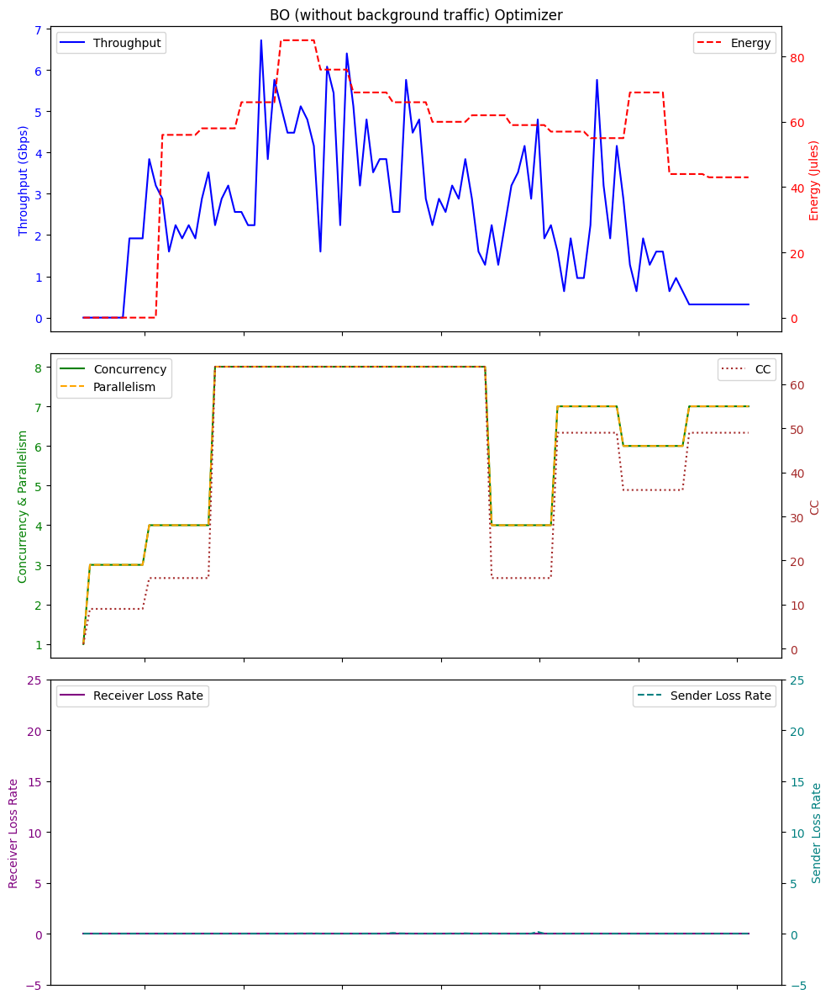

Average Throughput: 2.5035294117647053
Total Energy: 5517.0
Total loss rate: 0.3563428094944331
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 03:24:44.898338        0.00          0.0   1    0.0   0.0   
1  2024-01-19 03:24:45.895773        0.00          0.0  64    0.0   0.0   
2  2024-01-19 03:24:46.896188        0.00          0.0  64    0.0  32.9   
3  2024-01-19 03:24:47.896076        0.00          0.0  64    0.0  32.9   
4  2024-01-19 03:24:48.896660        0.00          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
77 2024-01-19 03:26:01.971771        0.64          0.0   9    1.0  32.6   
78 2024-01-19 03:26:02.973615        0.64          0.0   9    1.0  32.7   
79 2024-01-19 03:26:03.976609        0.64          0.0   9    1.0  32.7   
80 2024-01-19 03:26:04.976025        0.64          0.0   9    1.0  32.6   
81 2024-01-19 03:26:05.980023        0.64          0.0   9    1.0  32.6   

   

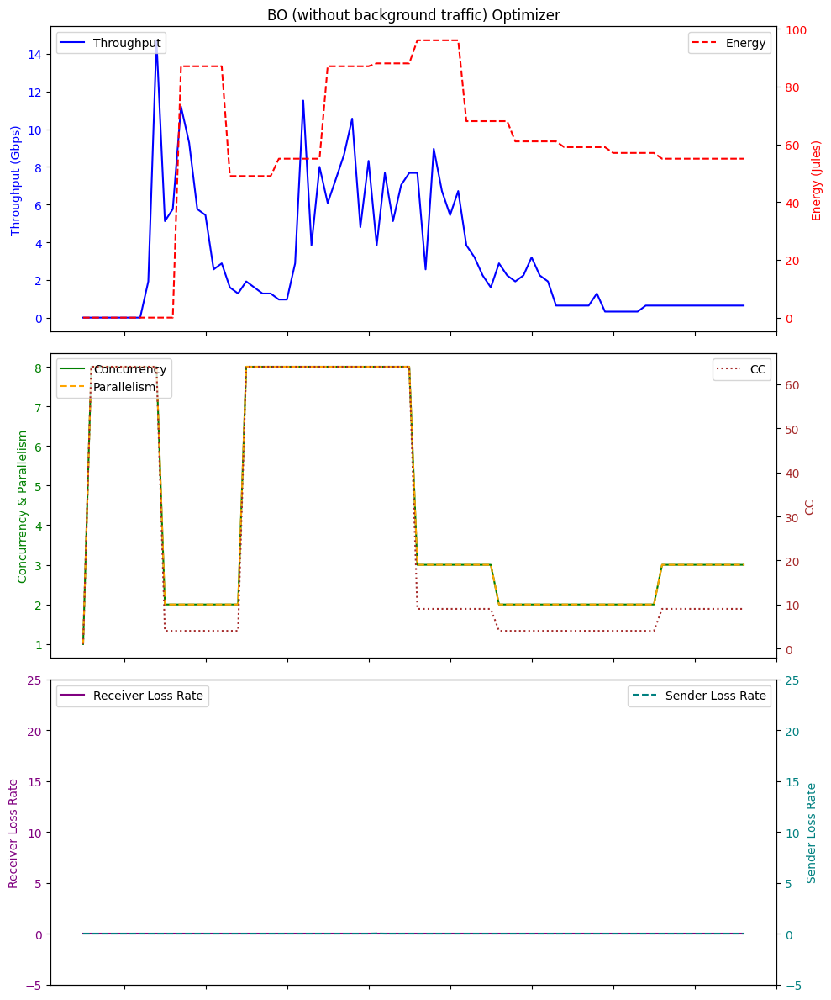

Average Throughput: 3.1570731707317075
Total Energy: 4759.0
Total loss rate: 0.022868010521781473
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 00:05:29.223660        0.00          0.0   1    0.0   0.0   
1   2024-01-19 00:05:30.219105        0.00          0.0   4    0.0   0.0   
2   2024-01-19 00:05:31.221615        0.00          0.0   4    0.0  32.8   
3   2024-01-19 00:05:32.222560        0.00          0.0   4    0.0  32.7   
4   2024-01-19 00:05:33.223721        0.00          0.0   4    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
499 2024-01-19 00:13:48.742927        0.96          0.0  64    1.0  32.7   
500 2024-01-19 00:13:49.744416        0.96          0.0  64    1.0  32.7   
501 2024-01-19 00:13:50.747412        0.96          0.0  64    1.0  32.9   
502 2024-01-19 00:13:51.746525        0.96          0.0  64    1.0  32.7   
503 2024-01-19 00:13:52.748210        0.96          0.0  64    1.0

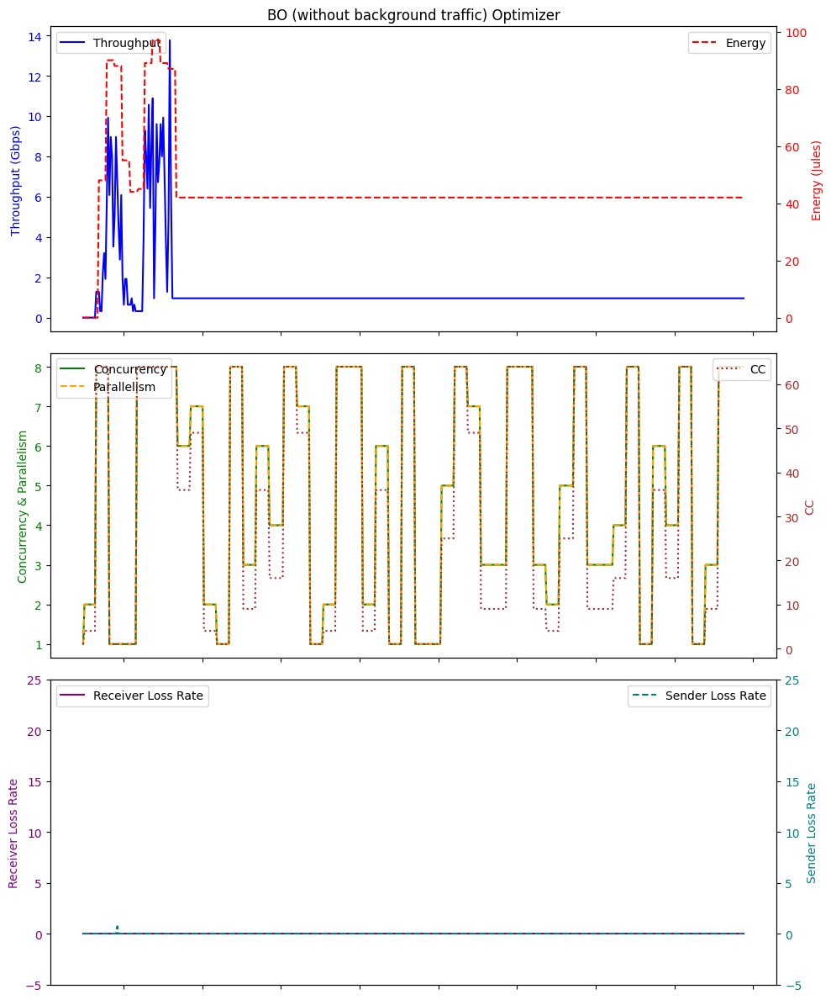

Average Throughput: 1.3403174603174608
Total Energy: 22533.0
Total loss rate: 0.744076972582739
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 01:27:02.601214        0.00          0.0   1    0.0   0.0   
1  2024-01-19 01:27:03.601221        0.00          0.0  64    0.0   0.0   
2  2024-01-19 01:27:04.600103        0.00          0.0  64    0.0  32.6   
3  2024-01-19 01:27:05.601327        0.00          0.0  64    0.0  32.7   
4  2024-01-19 01:27:06.600668        0.00          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
76 2024-01-19 01:28:18.673735        0.96          0.0   4    1.0  32.6   
77 2024-01-19 01:28:19.674492        0.96          0.0   4    1.0  32.6   
78 2024-01-19 01:28:20.674802        0.96          0.0   4    1.0  32.7   
79 2024-01-19 01:28:21.675278        0.96          0.0   4    1.0  32.7   
80 2024-01-19 01:28:22.678011        0.96          0.0   4    1.0  32.6   

   

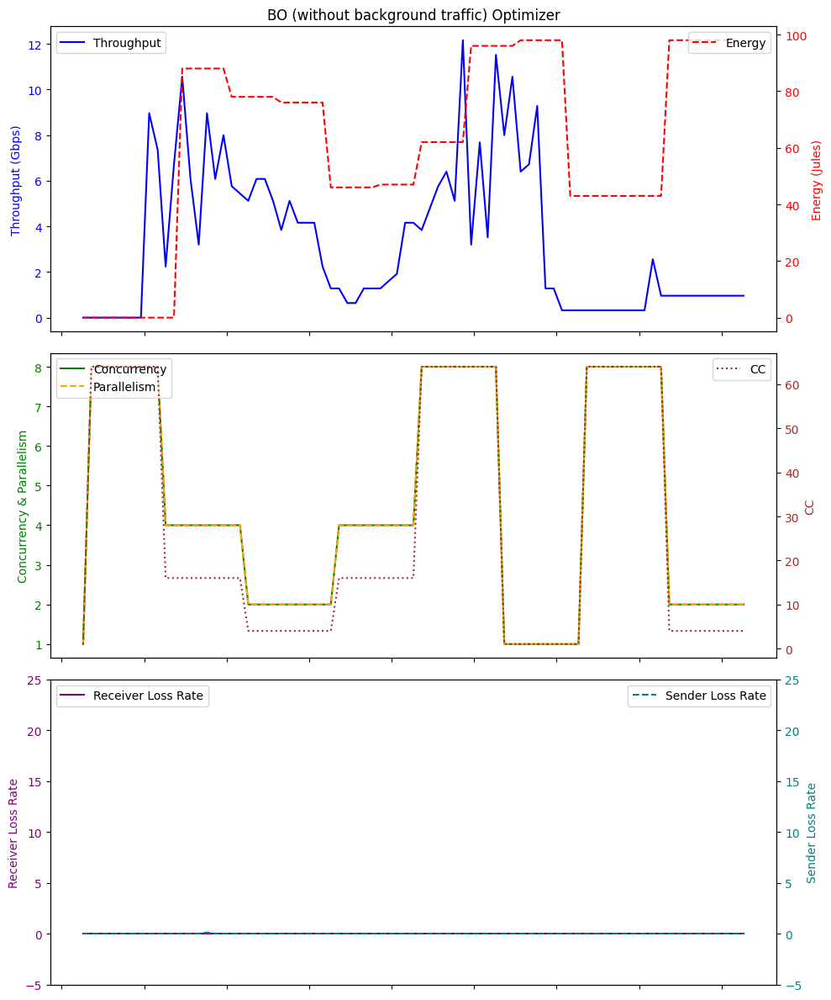

Average Throughput: 3.3224691358024683
Total Energy: 4995.0
Total loss rate: 0.10709088426378323
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 02:45:48.508001        0.00          0.0   1    0.0   0.0   
1   2024-01-19 02:45:49.502932        0.00          0.0   4    0.0   0.0   
2   2024-01-19 02:45:50.502516        0.00          0.0   4    0.0  36.8   
3   2024-01-19 02:45:51.505789        0.00          0.0   4    0.0  34.8   
4   2024-01-19 02:45:52.505796        0.00          0.0   4    0.0  34.1   
..                         ...         ...          ...  ..    ...   ...   
117 2024-01-19 02:47:45.621701        0.32          0.0   4    0.0  34.4   
118 2024-01-19 02:47:46.623099        0.32          0.0   4    0.0  33.2   
119 2024-01-19 02:47:47.625911        0.32          0.0   4    0.0  33.4   
120 2024-01-19 02:47:48.625076        0.32          0.0   4    0.0  33.9   
121 2024-01-19 02:47:49.625356        0.32          0.0   4    0.0 

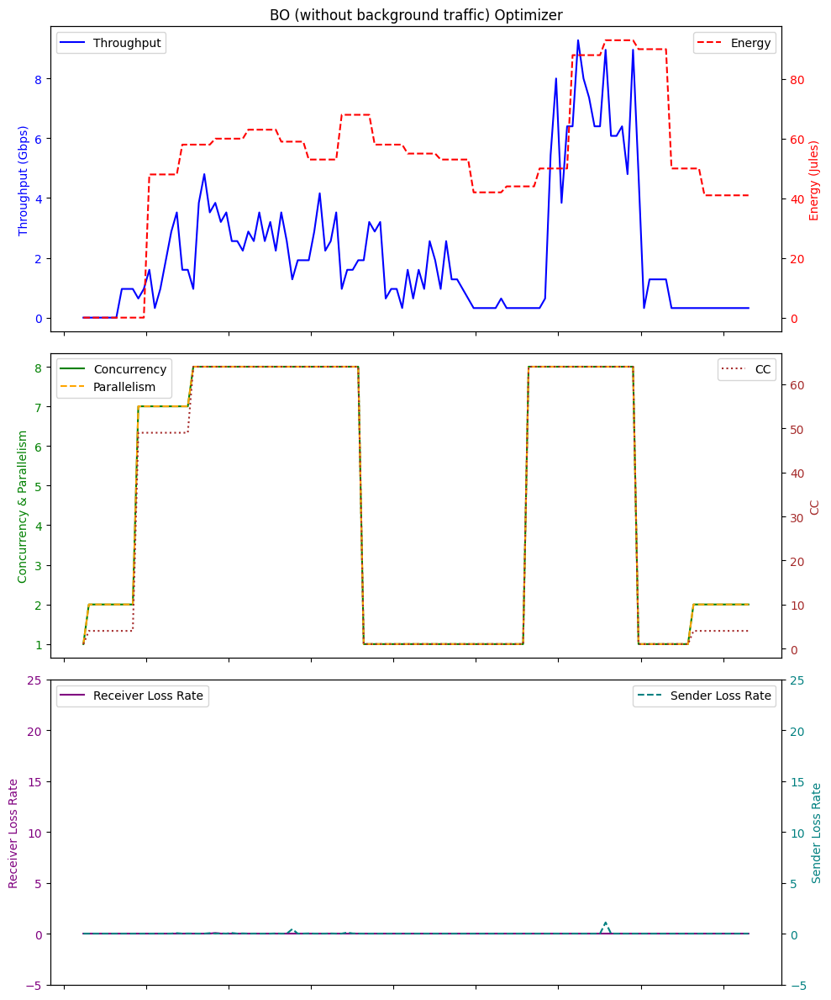

Average Throughput: 2.142950819672131
Total Energy: 6502.0
Total loss rate: 1.9148142117169233
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 04:15:55.112457        0.00          0.0   1    0.0   0.0   
1  2024-01-19 04:15:56.108246        0.00          0.0   4    0.0   0.0   
2  2024-01-19 04:15:57.110382        0.00          0.0   4    0.0  32.6   
3  2024-01-19 04:15:58.110185        0.00          0.0   4    0.0  32.7   
4  2024-01-19 04:15:59.111459        0.00          0.0   4    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
66 2024-01-19 04:17:01.173728        1.28          0.0  64    1.0  32.7   
67 2024-01-19 04:17:02.173216        1.28          0.0  64    1.0  32.7   
68 2024-01-19 04:17:03.174557        1.28          0.0  64    1.0  32.7   
69 2024-01-19 04:17:04.174346        1.28          0.0  64    1.0  32.8   
70 2024-01-19 04:17:05.176152        1.28          0.0  64    1.0  32.6   

    

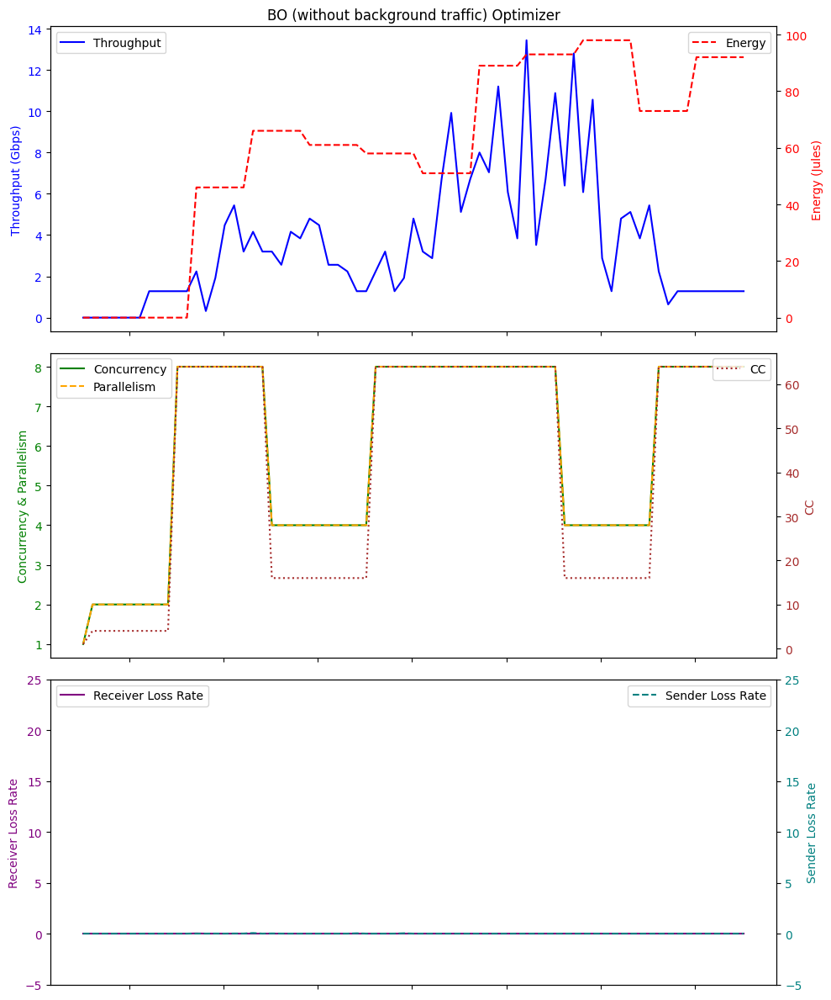

Average Throughput: 3.5966197183098596
Total Energy: 4273.0
Total loss rate: 0.15178913349698264
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 00:51:58.319518        0.00          0.0   1    0.0   0.0   
1  2024-01-19 00:51:59.314154        0.00          0.0   1    0.0   0.0   
2  2024-01-19 00:52:00.316257        0.00          0.0   1    0.0  32.7   
3  2024-01-19 00:52:01.315889        0.00          0.0   1    0.0  32.6   
4  2024-01-19 00:52:02.318032        0.00          0.0   1    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
77 2024-01-19 00:53:15.394171        1.92          0.0  36    2.0  32.7   
78 2024-01-19 00:53:16.396377        1.92          0.0  36    2.0  32.7   
79 2024-01-19 00:53:17.397649        1.92          0.0  36    2.0  32.6   
80 2024-01-19 00:53:18.397741        1.92          0.0  36    2.0  32.6   
81 2024-01-19 00:53:19.399386        1.92          0.0  36    2.0  32.7   

  

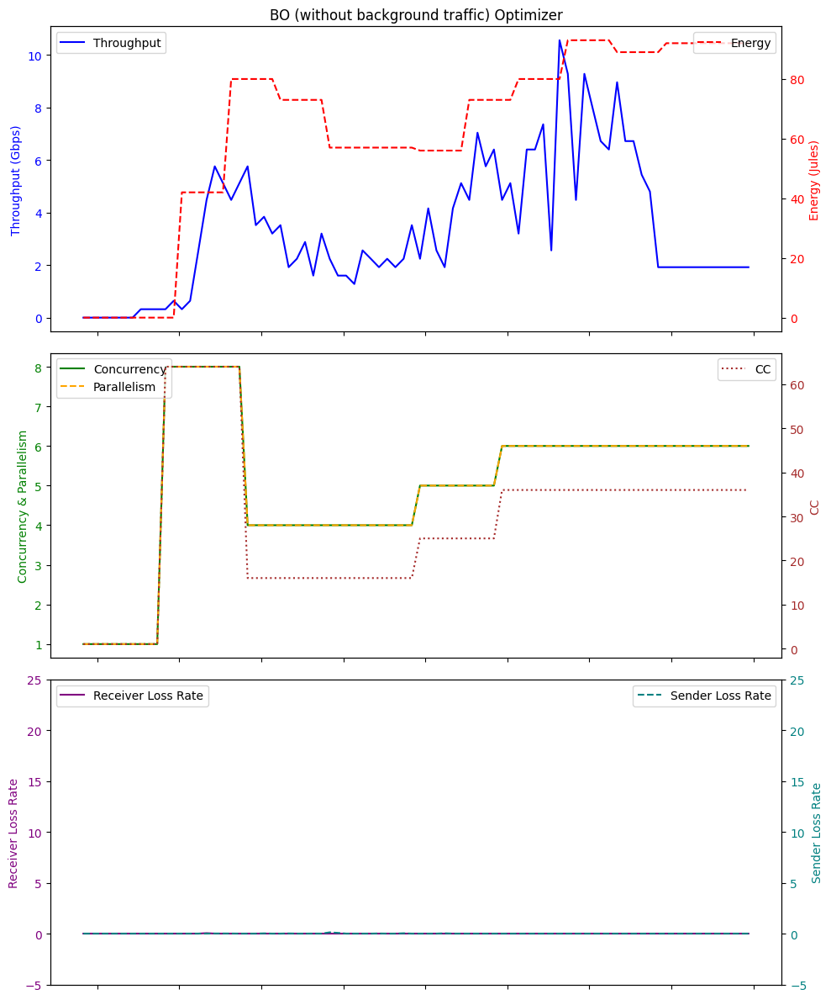

Average Throughput: 3.3560975609756105
Total Energy: 5155.0
Total loss rate: 0.32341495289637395
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 04:35:16.748994        0.00          0.0   1    0.0   0.0   
1  2024-01-19 04:35:17.748344        0.00          0.0   9    0.0   0.0   
2  2024-01-19 04:35:18.752789        0.00          0.0   9    0.0  32.7   
3  2024-01-19 04:35:19.751601        0.00          0.0   9    0.0  32.8   
4  2024-01-19 04:35:20.754668        0.00          0.0   9    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
76 2024-01-19 04:36:32.829211        2.24          0.0  64    2.0  32.7   
77 2024-01-19 04:36:33.829151        2.24          0.0  64    2.0  32.7   
78 2024-01-19 04:36:34.829010        2.24          0.0  64    2.0  32.6   
79 2024-01-19 04:36:35.830954        2.24          0.0  64    2.0  32.6   
80 2024-01-19 04:36:36.832954        2.24          0.0  64    2.0  32.8   

  

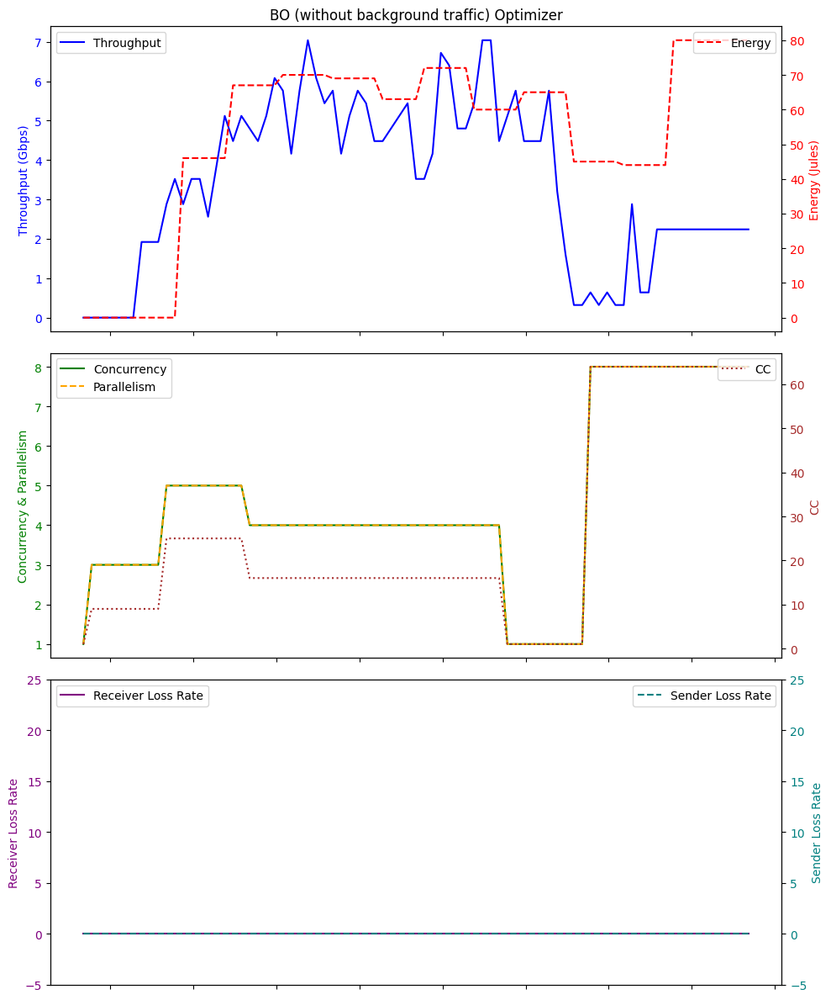

Average Throughput: 3.3975308641975315
Total Energy: 4343.0
Total loss rate: 0.007949971739846741
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 22:30:51.690968        0.00          0.0   1    0.0   0.0   
1   2024-01-18 22:30:52.694548        0.00          0.0   1    0.0   0.0   
2   2024-01-18 22:30:53.695815        0.00          0.0   1    0.0  32.6   
3   2024-01-18 22:30:54.695624        0.00          0.0   1    0.0  32.7   
4   2024-01-18 22:30:55.697495        0.00          0.0   1    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
96  2024-01-18 22:32:27.790697        0.32          0.0  36    0.0  32.8   
97  2024-01-18 22:32:28.791807        0.32          0.0  36    0.0  32.7   
98  2024-01-18 22:32:29.793516        0.32          0.0  36    0.0  32.7   
99  2024-01-18 22:32:30.794101        0.32          0.0  36    0.0  32.6   
100 2024-01-18 22:32:31.795804        0.32          0.0  36    0.0

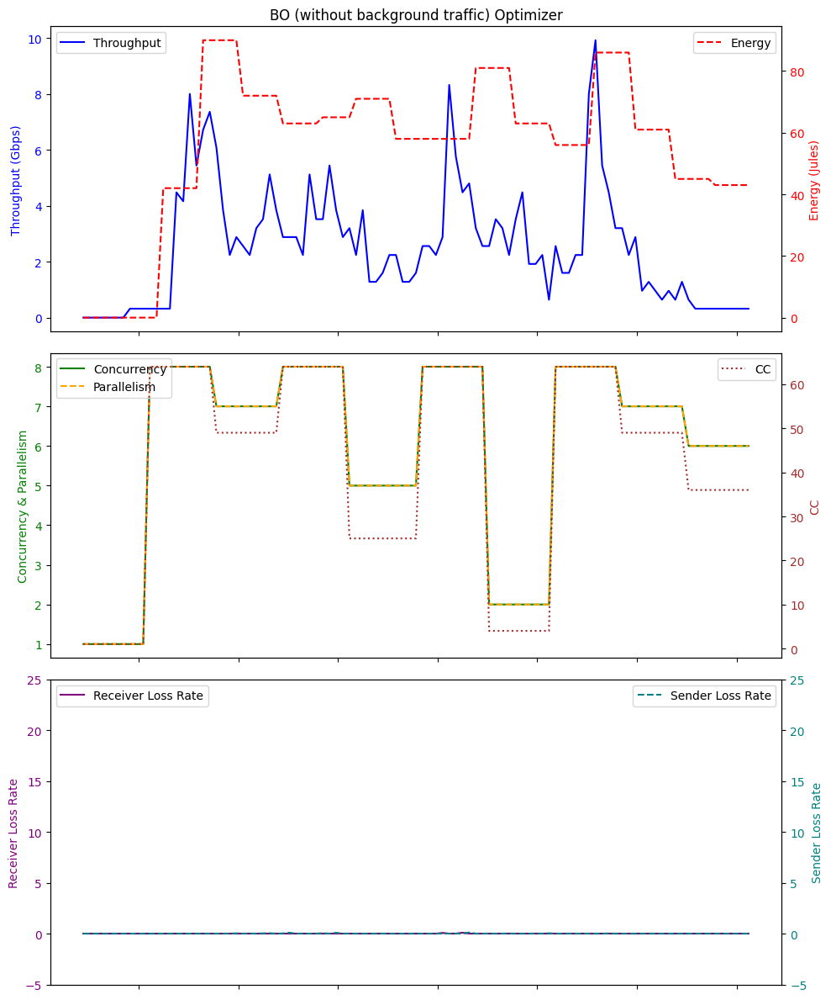

Average Throughput: 2.540990099009901
Total Energy: 5659.0
Total loss rate: 0.5423658445851421
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 23:08:43.793590        0.00          0.0   1    0.0   0.0   
1   2024-01-18 23:08:44.788437        0.00          0.0   9    0.0   0.0   
2   2024-01-18 23:08:45.789072        0.00          0.0   9    0.0  32.7   
3   2024-01-18 23:08:46.791459        0.00          0.0   9    0.0  32.6   
4   2024-01-18 23:08:47.791001        0.00          0.0   9    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
108 2024-01-18 23:10:31.901866        0.32          0.0  16    0.0  32.6   
109 2024-01-18 23:10:32.904326        0.32          0.0  16    0.0  32.6   
110 2024-01-18 23:10:33.904330        0.32          0.0  16    0.0  34.5   
111 2024-01-18 23:10:34.906246        0.32          0.0  16    0.0  32.6   
112 2024-01-18 23:10:35.904663        0.32          0.0  16    0.0  3

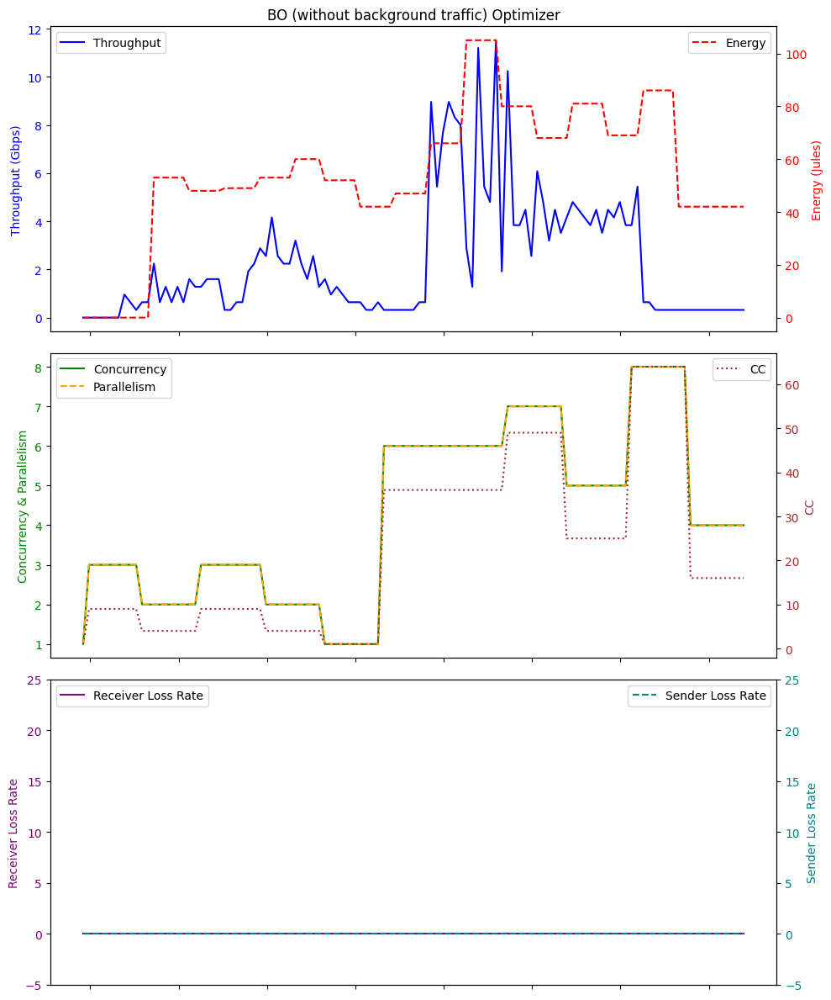

Average Throughput: 2.2966371681415927
Total Energy: 6198.0
Total loss rate: 0.04466481484552811
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 02:01:25.972843        0.00          0.0   1    0.0   0.0   
1   2024-01-19 02:01:26.968576        0.00          0.0  16    0.0   0.0   
2   2024-01-19 02:01:27.969666        0.00          0.0  16    0.0  42.1   
3   2024-01-19 02:01:28.971621        0.00          0.0  16    0.0  34.4   
4   2024-01-19 02:01:29.971528        0.00          0.0  16    0.0  35.8   
..                         ...         ...          ...  ..    ...   ...   
168 2024-01-19 02:04:14.148313        0.64          0.0  64    1.0  32.7   
169 2024-01-19 02:04:15.150693        0.64          0.0  64    1.0  32.7   
170 2024-01-19 02:04:16.149192        0.64          0.0  64    1.0  32.6   
171 2024-01-19 02:04:17.150552        0.64          0.0  64    1.0  32.7   
172 2024-01-19 02:04:18.147799        0.64          0.0  64    1.0 

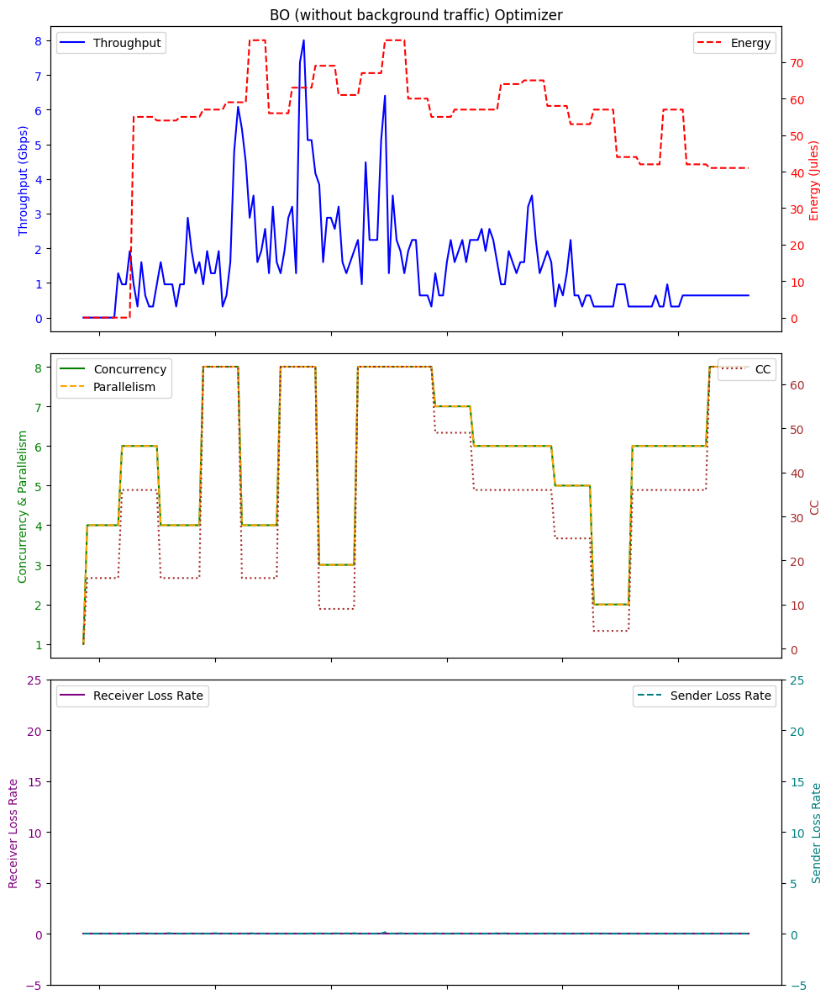

Average Throughput: 1.555606936416185
Total Energy: 9129.0
Total loss rate: 0.802457168952551
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 03:44:59.450572        0.00          0.0   1    0.0   0.0   
1  2024-01-19 03:45:00.448255        0.00          0.0   4    0.0   0.0   
2  2024-01-19 03:45:01.449346        0.00          0.0   4    0.0  32.6   
3  2024-01-19 03:45:02.448994        0.00          0.0   4    0.0  32.7   
4  2024-01-19 03:45:03.451118        0.00          0.0   4    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
67 2024-01-19 03:46:06.515279        2.24          0.0  16    2.0  32.6   
68 2024-01-19 03:46:07.516327        2.24          0.0  16    2.0  32.7   
69 2024-01-19 03:46:08.517216        2.24          0.0  16    2.0  32.7   
70 2024-01-19 03:46:09.518889        2.24          0.0  16    2.0  32.7   
71 2024-01-19 03:46:10.519915        2.24          0.0  16    2.0  32.7   

    E

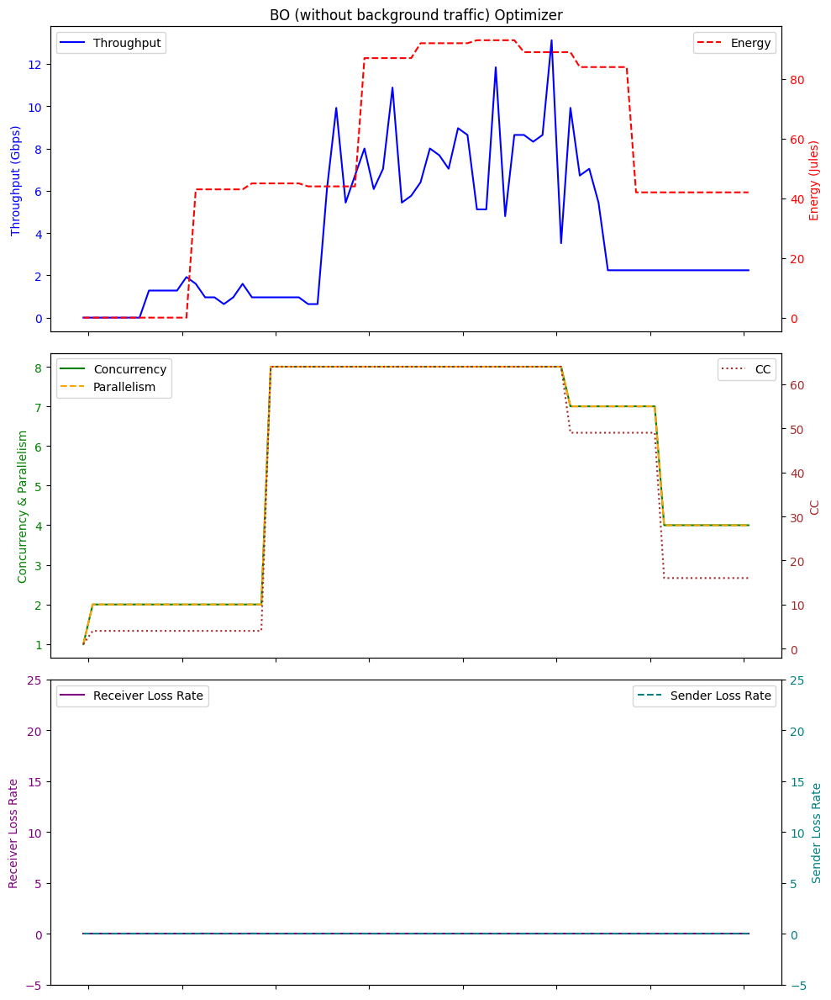

Average Throughput: 3.9111111111111114
Total Energy: 3915.0
Total loss rate: 0.024557874755263748
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 01:07:42.644202         0.0          0.0   1    0.0   0.0   
1  2024-01-19 01:07:43.639856         0.0          0.0  25    0.0   0.0   
2  2024-01-19 01:07:44.643136         0.0          0.0  25    0.0  32.7   
3  2024-01-19 01:07:45.643200         0.0          0.0  25    0.0  32.7   
4  2024-01-19 01:07:46.642711         0.0          0.0  25    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
67 2024-01-19 01:08:49.711251         4.8          0.0  49    4.0  32.8   
68 2024-01-19 01:08:50.711241         4.8          0.0  49    4.0  32.8   
69 2024-01-19 01:08:51.713973         4.8          0.0  49    4.0  32.7   
70 2024-01-19 01:08:52.715641         4.8          0.0  49    4.0  32.7   
71 2024-01-19 01:08:53.715304         4.8          0.0  49    4.0  32.7   

 

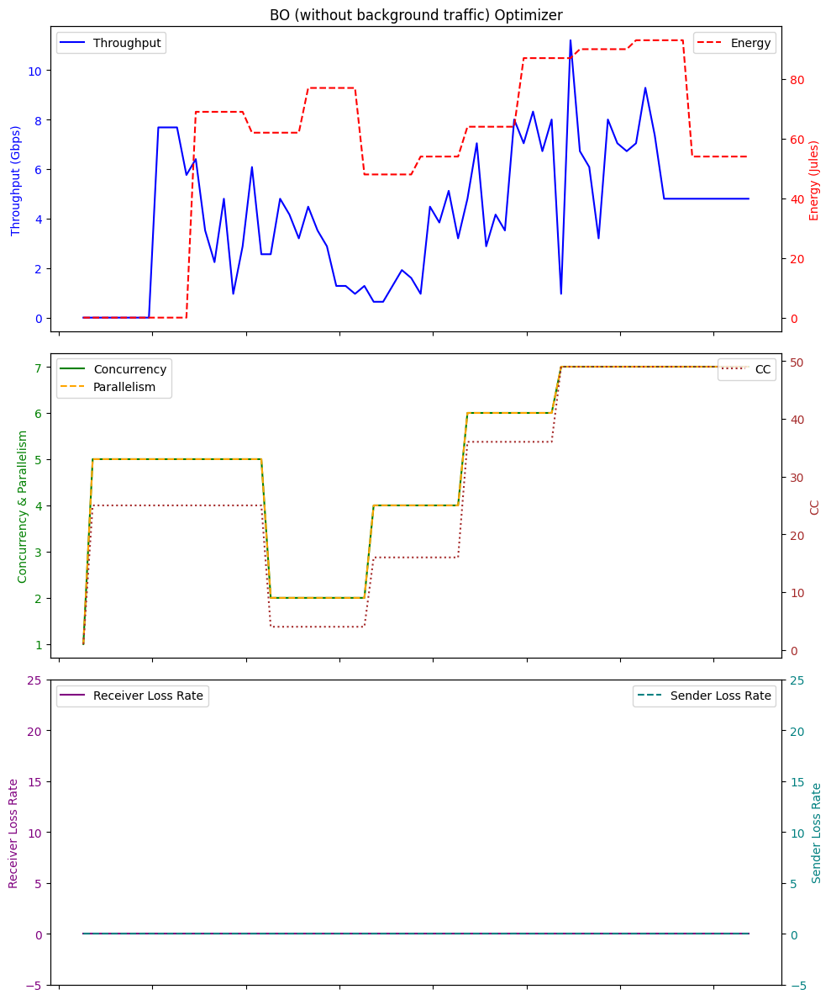

Average Throughput: 4.088888888888889
Total Energy: 4188.0
Total loss rate: 0.009976853921695178
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 02:28:09.033627        0.00          0.0   1    0.0   0.0   
1   2024-01-19 02:28:10.026551        0.00          0.0  36    0.0   0.0   
2   2024-01-19 02:28:11.029197        0.00          0.0  36    0.0  32.8   
3   2024-01-19 02:28:12.035082        0.00          0.0  36    0.0  32.7   
4   2024-01-19 02:28:13.029948        0.00          0.0  36    0.0  32.7   
..                         ...         ...          ...  ..    ...   ...   
117 2024-01-19 02:30:06.145923        0.32          0.0  49    0.0  32.6   
118 2024-01-19 02:30:07.147708        0.32          0.0  49    0.0  32.6   
119 2024-01-19 02:30:08.148690        0.32          0.0  49    0.0  32.7   
120 2024-01-19 02:30:09.148445        0.32          0.0  49    0.0  32.7   
121 2024-01-19 02:30:10.150747        0.32          0.0  49    0.0 

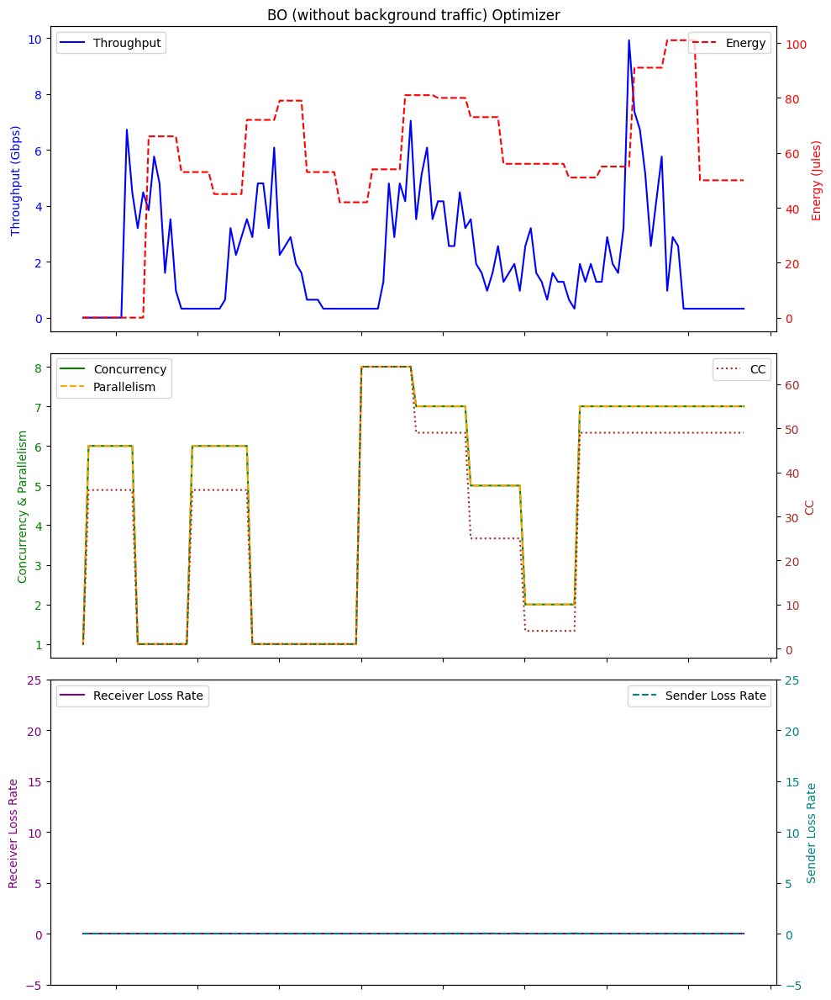

Average Throughput: 2.1193442622950824
Total Energy: 7019.0
Total loss rate: 0.18849353792364903
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 22:47:33.538413        0.00          0.0   1    0.0   0.0   
1   2024-01-18 22:47:34.533901        0.00          0.0  64    0.0   0.0   
2   2024-01-18 22:47:35.535114        0.00          0.0  64    0.0  32.6   
3   2024-01-18 22:47:36.536660        0.00          0.0  64    0.0  32.7   
4   2024-01-18 22:47:37.536619        0.00          0.0  64    0.0  32.7   
..                         ...         ...          ...  ..    ...   ...   
158 2024-01-18 22:50:11.700435        0.32          0.0  64    0.0  32.7   
159 2024-01-18 22:50:12.700761        0.32          0.0  64    0.0  32.8   
160 2024-01-18 22:50:13.700908        0.32          0.0  64    0.0  32.7   
161 2024-01-18 22:50:14.704004        0.32          0.0  64    0.0  32.6   
162 2024-01-18 22:50:15.700944        0.32          0.0  64    0.0 

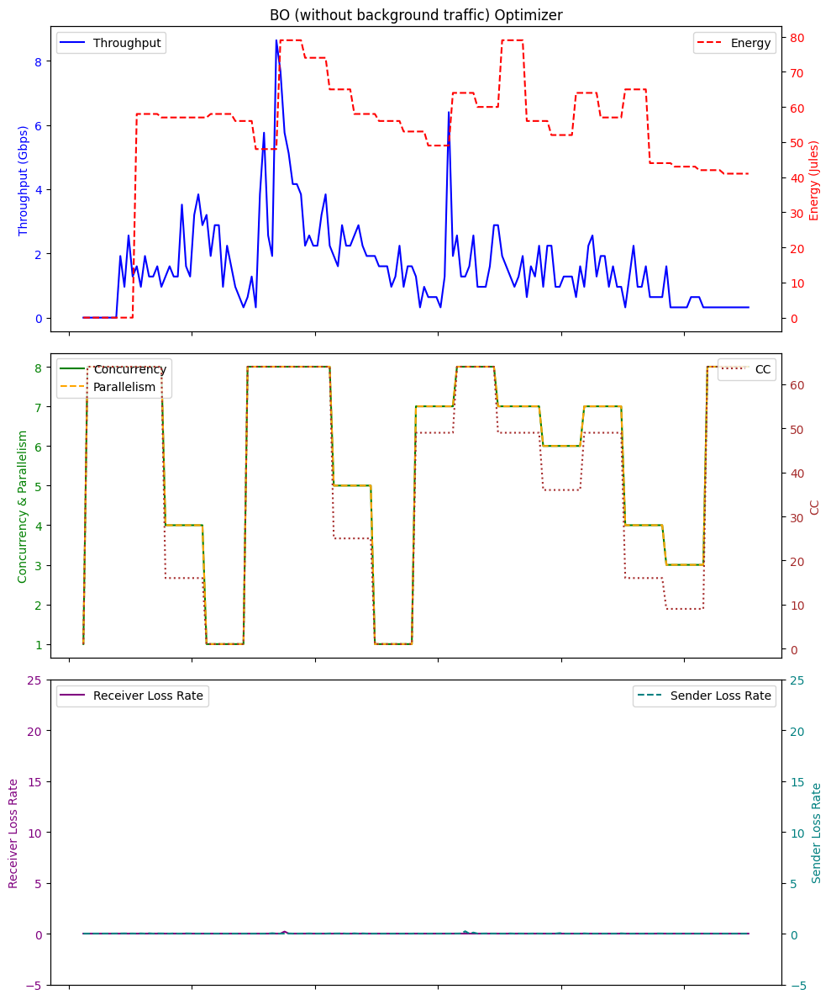

Average Throughput: 1.6196319018404908
Total Energy: 8595.0
Total loss rate: 0.8822754069458651
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 00:32:07.047837        0.00          0.0   1    0.0   0.0   
1  2024-01-19 00:32:08.044019        0.00          0.0  64    0.0   0.0   
2  2024-01-19 00:32:09.046117        0.00          0.0  64    0.0  32.7   
3  2024-01-19 00:32:10.046002        0.00          0.0  64    0.0  32.7   
4  2024-01-19 00:32:11.048452        0.00          0.0  64    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
87 2024-01-19 00:33:34.129955        0.64          0.0  25    1.0  32.6   
88 2024-01-19 00:33:35.130687        0.64          0.0  25    1.0  32.7   
89 2024-01-19 00:33:36.133545        0.64          0.0  25    1.0  32.7   
90 2024-01-19 00:33:37.135009        0.64          0.0  25    1.0  32.7   
91 2024-01-19 00:33:38.133657        0.64          0.0  25    1.0  32.9   

   

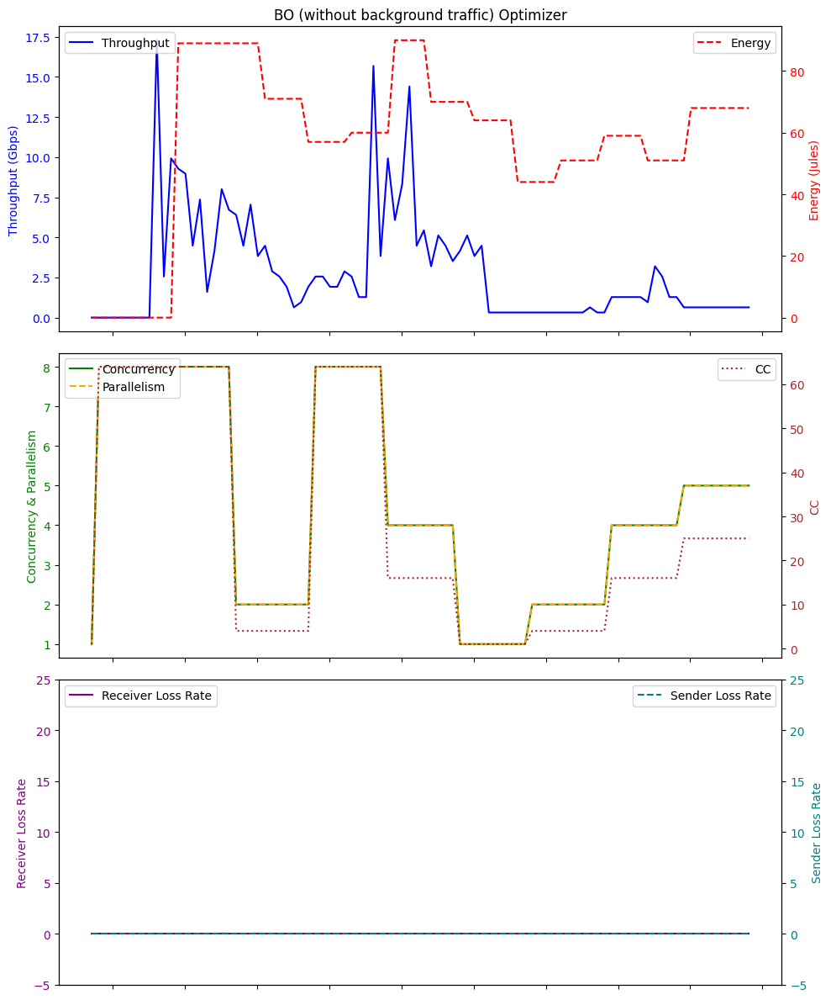

Average Throughput: 2.8730434782608687
Total Energy: 5292.0
Total loss rate: 0.03877840922452487
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 03:06:46.848445        0.00          0.0   1    0.0   0.0   
1  2024-01-19 03:06:47.847474        0.00          0.0  49    0.0   0.0   
2  2024-01-19 03:06:48.847689        0.00          0.0  49    0.0  32.6   
3  2024-01-19 03:06:49.847293        0.00          0.0  49    0.0  32.6   
4  2024-01-19 03:06:50.850834        0.00          0.0  49    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
77 2024-01-19 03:08:03.927119        0.32          0.0   1    0.0  32.7   
78 2024-01-19 03:08:04.927690        0.32          0.0   1    0.0  32.7   
79 2024-01-19 03:08:05.930451        0.32          0.0   1    0.0  32.7   
80 2024-01-19 03:08:06.931200        0.32          0.0   1    0.0  32.7   
81 2024-01-19 03:08:07.930796        0.32          0.0   1    0.0  32.8   

  

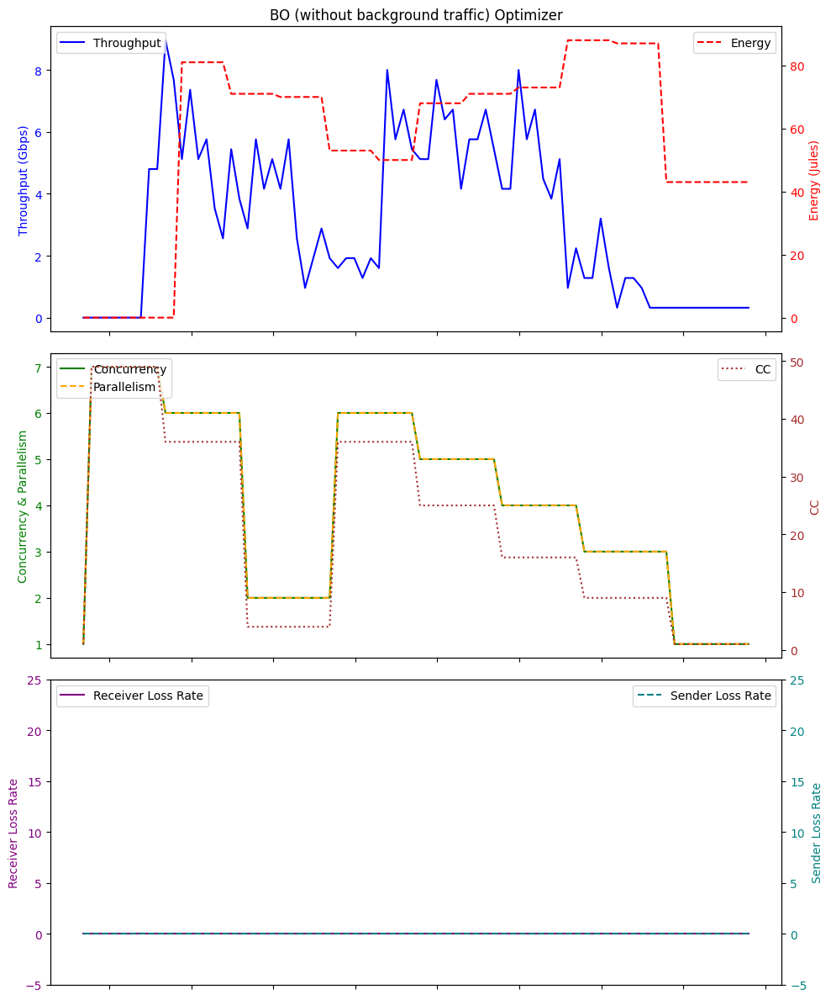

Average Throughput: 3.1570731707317075
Total Energy: 4695.0
Total loss rate: 0.020054836465462415
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 23:27:45.582067         0.0          0.0   1    0.0   0.0   
1   2024-01-18 23:27:46.577170         0.0          0.0  36    0.0   0.0   
2   2024-01-18 23:27:47.580184         0.0          0.0  36    0.0  32.9   
3   2024-01-18 23:27:48.580780         0.0          0.0  36    0.0  32.6   
4   2024-01-18 23:27:49.579056         0.0          0.0  36    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
97  2024-01-18 23:29:22.677998         1.6          0.0  36    1.0  32.7   
98  2024-01-18 23:29:23.677494         1.6          0.0  36    1.0  32.7   
99  2024-01-18 23:29:24.677207         1.6          0.0  36    1.0  32.9   
100 2024-01-18 23:29:25.680981         1.6          0.0  36    1.0  33.0   
101 2024-01-18 23:29:26.680912         1.6          0.0  36    1.0

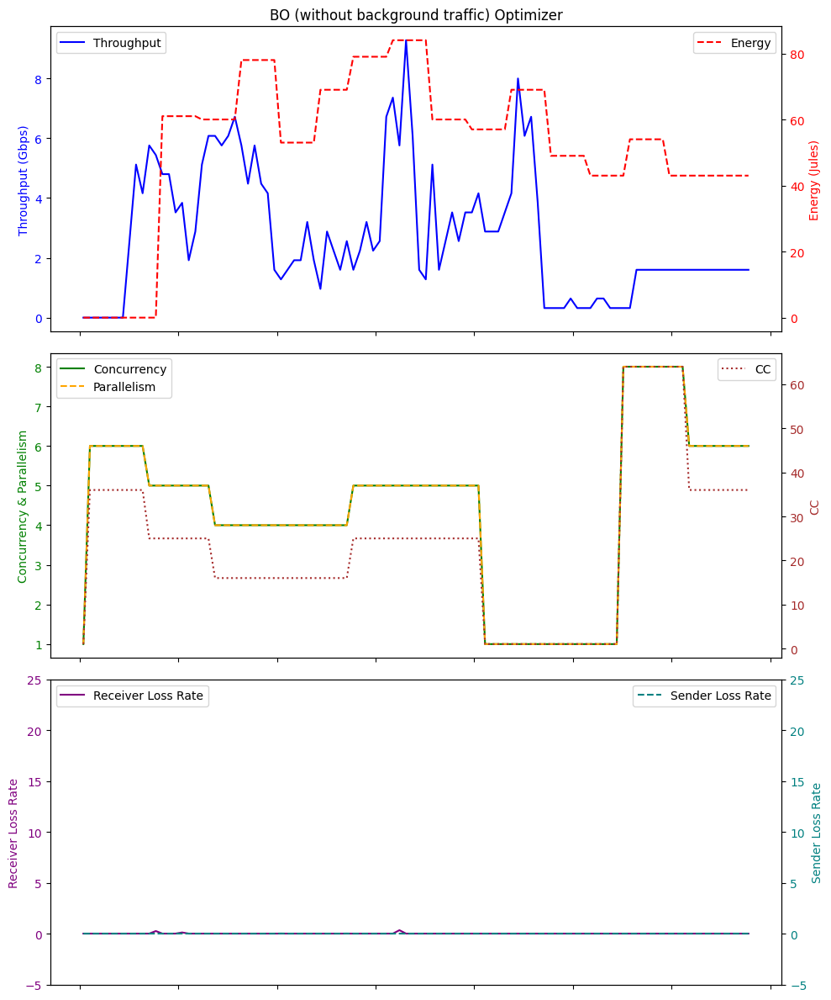

Average Throughput: 2.751372549019609
Total Energy: 5386.0
Total loss rate: 0.023778222292086197
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 04:00:36.423993        0.00          0.0   1    0.0   0.0   
1  2024-01-19 04:00:37.416949        0.00          0.0   4    0.0   0.0   
2  2024-01-19 04:00:38.417620        0.00          0.0   4    0.0  32.7   
3  2024-01-19 04:00:39.419168        0.00          0.0   4    0.0  32.6   
4  2024-01-19 04:00:40.418990        0.00          0.0   4    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
88 2024-01-19 04:02:04.538545        0.32          0.0  49    0.0  32.7   
89 2024-01-19 04:02:05.539263        0.32          0.0  49    0.0  32.6   
90 2024-01-19 04:02:06.542149        0.32          0.0  49    0.0  32.7   
91 2024-01-19 04:02:07.542278        0.32          0.0  49    0.0  32.6   
92 2024-01-19 04:02:08.539958        0.32          0.0  49    0.0  32.6   

  

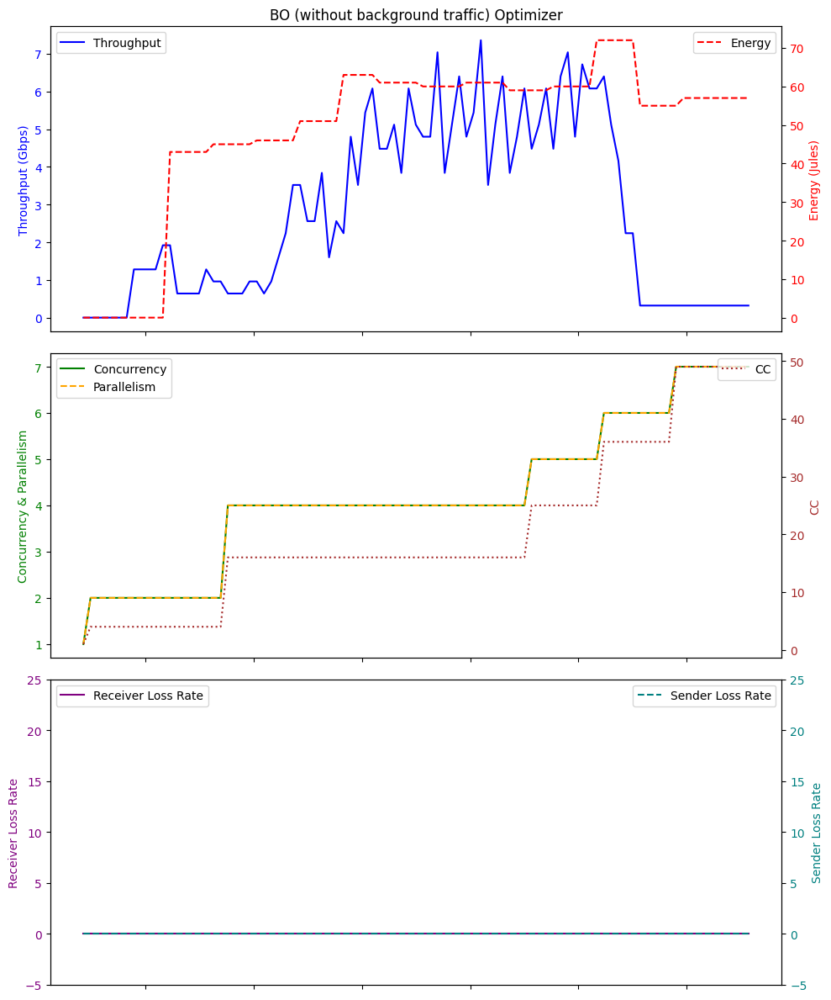

Average Throughput: 2.766451612903226
Total Energy: 4563.0
Total loss rate: 0.0076651695145963615
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 01:44:25.320934        0.00          0.0   1    0.0   0.0   
1  2024-01-19 01:44:26.317110        0.00          0.0  25    0.0   0.0   
2  2024-01-19 01:44:27.318101        0.00          0.0  25    0.0  32.7   
3  2024-01-19 01:44:28.320187        0.00          0.0  25    0.0  32.7   
4  2024-01-19 01:44:29.319885        0.00          0.0  25    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
78 2024-01-19 01:45:43.396090        0.96          0.0  64    1.0  32.7   
79 2024-01-19 01:45:44.398190        0.96          0.0  64    1.0  32.7   
80 2024-01-19 01:45:45.399266        0.96          0.0  64    1.0  32.6   
81 2024-01-19 01:45:46.398891        0.96          0.0  64    1.0  32.7   
82 2024-01-19 01:45:47.396793        0.96          0.0  64    1.0  32.8   

 

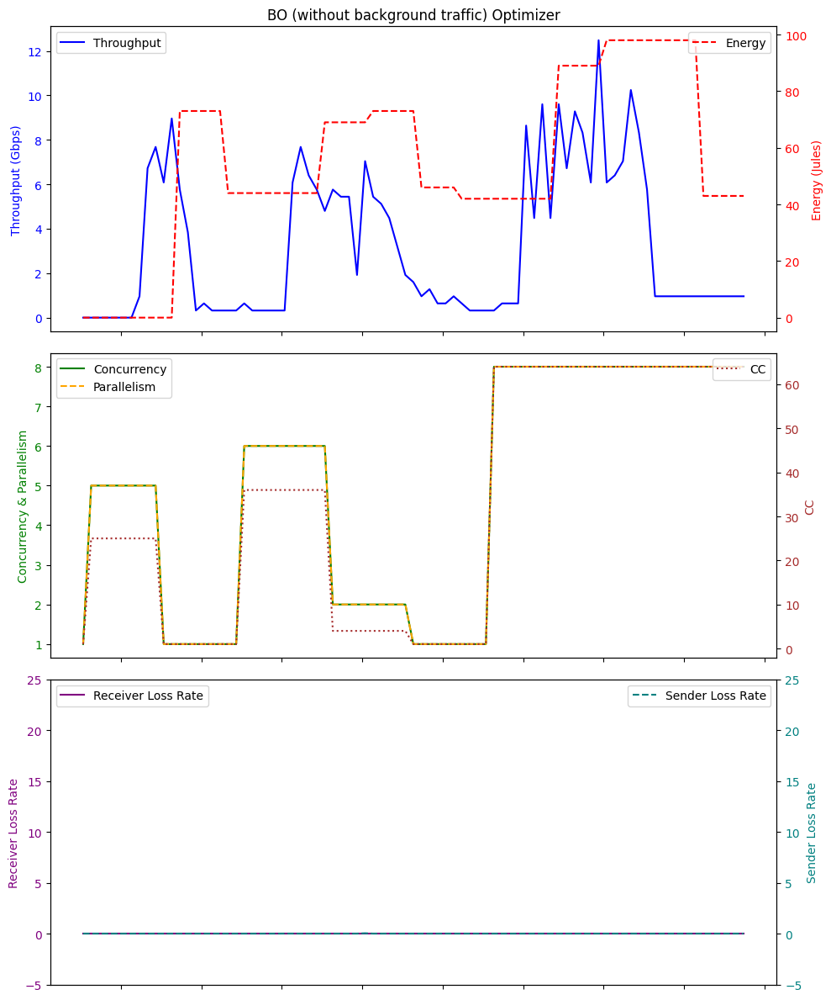

Average Throughput: 3.2038554216867463
Total Energy: 4520.0
Total loss rate: 0.047614073598638645


In [3]:
# Example usage BO
directory = './logFileDir/BO/'
dfs = process_log_files(directory,"BO_logFile_")

bo_throughput_list=[]
bo_energy_list=[]
bo_plr_list=[]
# Print or process the dataframes as needed
for df in dfs:
    print(df)
    # Plotting
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)


    # Top plot with Throughput and Energy
    ax1.plot(df['Time'], df['Throughput'], label='Throughput', color='blue')
    ax1.set_ylabel('Throughput (Gbps)', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_title('BO (without background traffic) Optimizer')

    ax2_twin = ax1.twinx()
    ax2_twin.plot(df['Time'], df['Energy'], label='Energy', color='red', linestyle='--')
    ax2_twin.set_ylabel('Energy (Jules)', color='red')
    ax2_twin.tick_params(axis='y', labelcolor='red')

    # Bottom plot with Concurrency, Parallelism, and CC
    ax2.plot(df['Time'], df['concurrency'], label='Concurrency', color='green')
    ax2.plot(df['Time'], df['parallelism'], label='Parallelism', color='orange', linestyle='--')
    ax2.set_ylabel('Concurrency & Parallelism', color='green')
    ax2.tick_params(axis='y', labelcolor='green')

    ax3_twin = ax2.twinx()
    ax3_twin.plot(df['Time'], df['CC'], label='CC', color='brown', linestyle=':')
    ax3_twin.set_ylabel('CC', color='brown')
    ax3_twin.tick_params(axis='y', labelcolor='brown')
    
    # Bottom plot with Receiver Loss Rate and Sender Loss Rate
    ax3.plot(df['Time'], df['receiver_lr'], label='Receiver Loss Rate', color='purple', linestyle='-')
    ax3.set_ylabel('Receiver Loss Rate', color='purple')
    ax3.tick_params(axis='y', labelcolor='purple')

    ax4_twin = ax3.twinx()
    ax4_twin.plot(df['Time'], df['sender_lr'], label='Sender Loss Rate', color='teal', linestyle='--')
    ax4_twin.set_ylabel('Sender Loss Rate', color='teal')
    ax4_twin.tick_params(axis='y', labelcolor='teal')
    ax4_twin.set_ylim(-5,25)

    ax3.set_ylim(-5,25)

    # Formatting the x-axis to show time correctly
#     ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: (datetime.min + timedelta(seconds=x)).strftime('%H:%M:%S')))
#     ax2.set_xticklabels([])
    ax1.set_xticklabels([])
    ax2.set_xticklabels([])
    # Fix for overlapping layouts
    fig.tight_layout()

    # Legend
    ax1.legend(loc='upper left')
    ax2_twin.legend(loc='upper right')
    ax2.legend(loc='upper left')
    ax3_twin.legend(loc='upper right')
    ax3.legend(loc='upper left')
    ax4_twin.legend(loc='upper right')
#     plt.savefig('withBT.png', format='png', dpi=300, bbox_inches='tight')
    plt.show()

    average_throughput = df['Throughput'].mean()
    print("Average Throughput:", average_throughput)
    total_energy = df['Energy'].sum()
    print("Total Energy:", total_energy)
    total_plr = df['sender_lr'].sum()
    print("Total loss rate:", total_plr)
    
    bo_throughput_list.append(average_throughput)
    bo_energy_list.append(total_energy)
    bo_plr_list.append(total_plr)


                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 01:20:50.338126        0.00          0.0   1    0.0   0.0   
1   2024-01-19 01:20:51.333614        0.00          0.0   1    0.0   0.0   
2   2024-01-19 01:20:52.334953        0.00          0.0   1    0.0  32.6   
3   2024-01-19 01:20:53.336708        0.00          0.0   1    0.0  32.6   
4   2024-01-19 01:20:54.337507        0.00          0.0   1    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
365 2024-01-19 01:26:55.725592        0.64          0.0   1    1.0  32.7   
366 2024-01-19 01:26:56.726436        0.64          0.0   1    1.0  32.6   
367 2024-01-19 01:26:57.728448        0.64          0.0   1    1.0  32.7   
368 2024-01-19 01:26:58.730727        0.64          0.0   1    1.0  32.7   
369 2024-01-19 01:26:59.728481        0.64          0.0   1    1.0  32.6   

     Energy  sender_lr  concurrency  parallelism  
0       0.0        0.0            1 

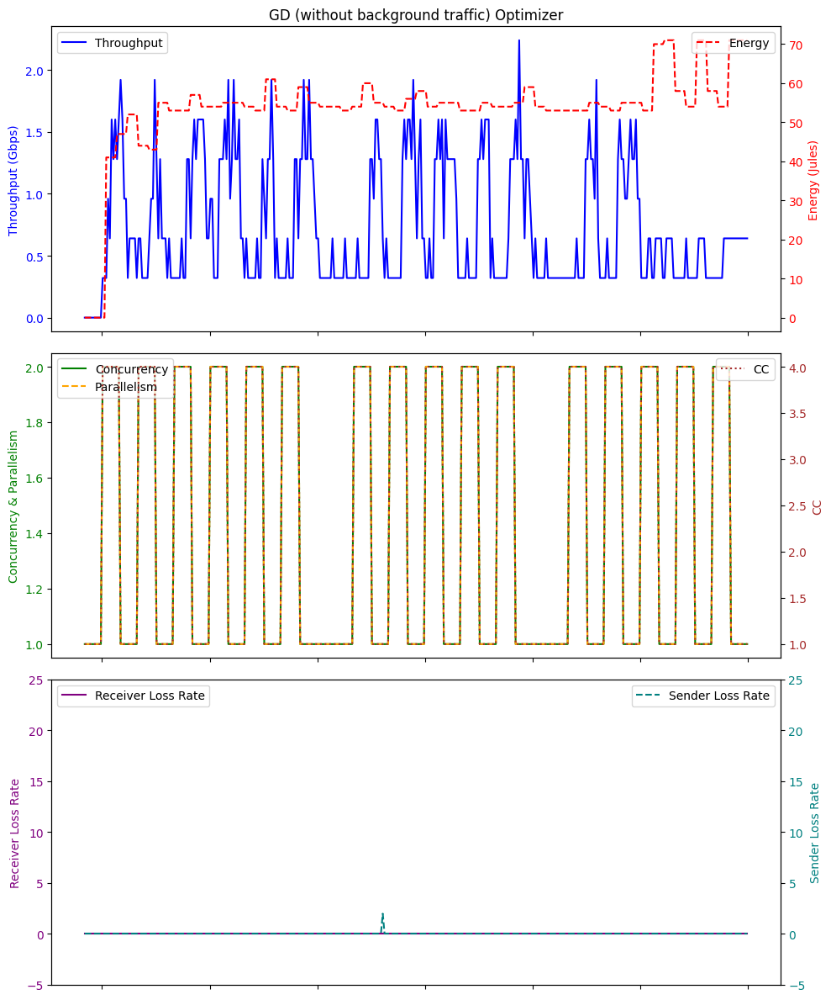

Average Throughput: 0.723891891891892
Total Energy: 19800.0
Total loss rate: 1.9761941698397765
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 23:06:01.541432        0.00          0.0   1    0.0   0.0   
1   2024-01-18 23:06:02.533858        0.00          0.0   1    0.0   0.0   
2   2024-01-18 23:06:03.535495        0.00          0.0   1    0.0  32.6   
3   2024-01-18 23:06:04.537430        0.00          0.0   1    0.0  33.2   
4   2024-01-18 23:06:05.537178        0.00          0.0   1    0.0  39.5   
..                         ...         ...          ...  ..    ...   ...   
155 2024-01-18 23:08:36.697722        0.64          0.0  49    1.0  34.6   
156 2024-01-18 23:08:37.701176        0.64          0.0  49    1.0  34.6   
157 2024-01-18 23:08:38.701288        0.64          0.0  49    1.0  35.3   
158 2024-01-18 23:08:39.701490        0.64          0.0  49    1.0  37.0   
159 2024-01-18 23:08:40.704375        0.64          0.0  49    1.0  

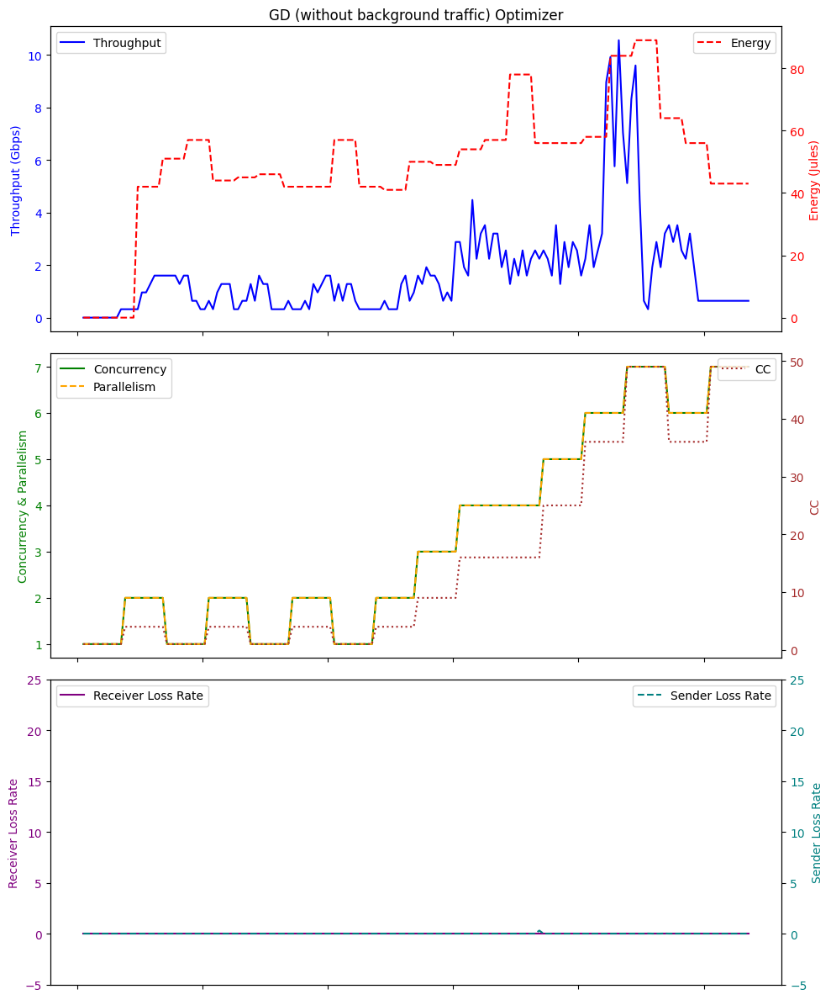

Average Throughput: 1.674
Total Energy: 7945.0
Total loss rate: 0.35027384309285187
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 03:00:44.574214        0.00          0.0   1    0.0   0.0   
1   2024-01-19 03:00:45.569690        0.00          0.0   1    0.0   0.0   
2   2024-01-19 03:00:46.570873        0.00          0.0   1    0.0  32.7   
3   2024-01-19 03:00:47.573473        0.00          0.0   1    0.0  32.6   
4   2024-01-19 03:00:48.573490        0.00          0.0   1    0.0  32.8   
..                         ...         ...          ...  ..    ...   ...   
355 2024-01-19 03:06:39.949574        0.32          0.0   4    0.0  32.6   
356 2024-01-19 03:06:40.950775        0.32          0.0   4    0.0  32.6   
357 2024-01-19 03:06:41.956357        0.32          0.0   4    0.0  32.7   
358 2024-01-19 03:06:42.952541        0.32          0.0   4    0.0  32.7   
359 2024-01-19 03:06:43.955114        0.32          0.0   4    0.0  32.6   

   

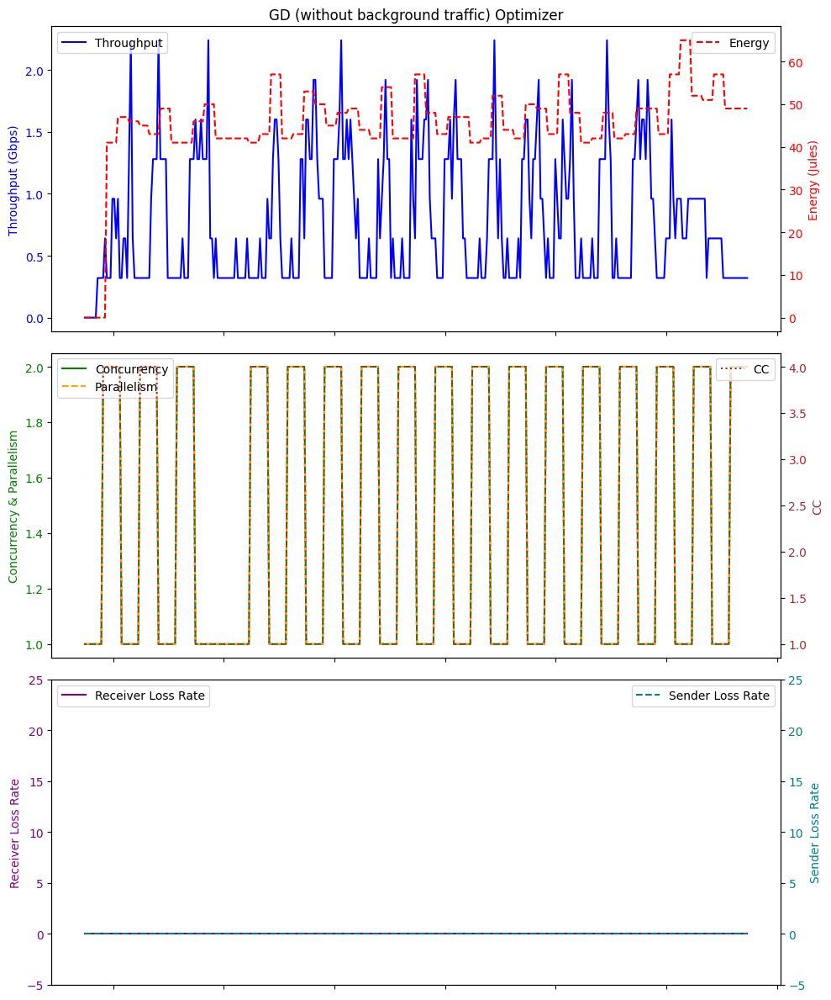

Average Throughput: 0.7635555555555555
Total Energy: 16306.0
Total loss rate: 0.042039554188789116
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 23:42:33.365521        0.00          0.0   1    0.0   0.0   
1   2024-01-18 23:42:34.358590        0.00          0.0   1    0.0   0.0   
2   2024-01-18 23:42:35.359725        0.00          0.0   1    0.0  33.2   
3   2024-01-18 23:42:36.361962        0.00          0.0   1    0.0  32.7   
4   2024-01-18 23:42:37.362656        0.00          0.0   1    0.0  33.1   
..                         ...         ...          ...  ..    ...   ...   
385 2024-01-18 23:48:58.752558        0.32          0.0   1    0.0  32.7   
386 2024-01-18 23:48:59.751683        0.32          0.0   1    0.0  32.6   
387 2024-01-18 23:49:00.751707        0.32          0.0   1    0.0  32.6   
388 2024-01-18 23:49:01.752466        0.32          0.0   1    0.0  32.8   
389 2024-01-18 23:49:02.755094        0.32          0.0   1    0.

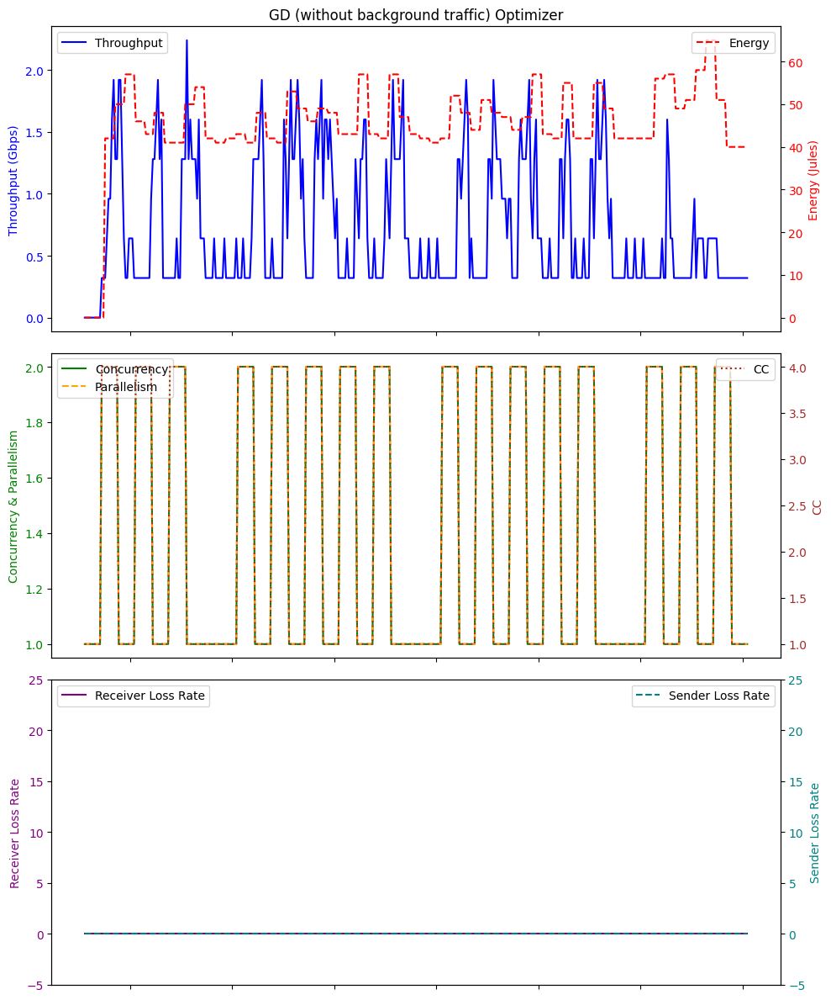

Average Throughput: 0.6982564102564104
Total Energy: 17745.0
Total loss rate: 0.06289242174927318
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 22:25:49.436576        0.00          0.0   1    0.0   0.0   
1   2024-01-18 22:25:50.432835        0.00          0.0   1    0.0   0.0   
2   2024-01-18 22:25:51.431666        0.00          0.0   1    0.0  32.8   
3   2024-01-18 22:25:52.432943        0.00          0.0   1    0.0  32.7   
4   2024-01-18 22:25:53.433866        0.00          0.0   1    0.0  32.7   
..                         ...         ...          ...  ..    ...   ...   
295 2024-01-18 22:30:44.745009        0.32          0.0  16    0.0  32.7   
296 2024-01-18 22:30:45.745097        0.32          0.0  16    0.0  32.6   
297 2024-01-18 22:30:46.747895        0.32          0.0  16    0.0  32.8   
298 2024-01-18 22:30:47.749120        0.32          0.0  16    0.0  32.6   
299 2024-01-18 22:30:48.748667        0.32          0.0  16    0.0

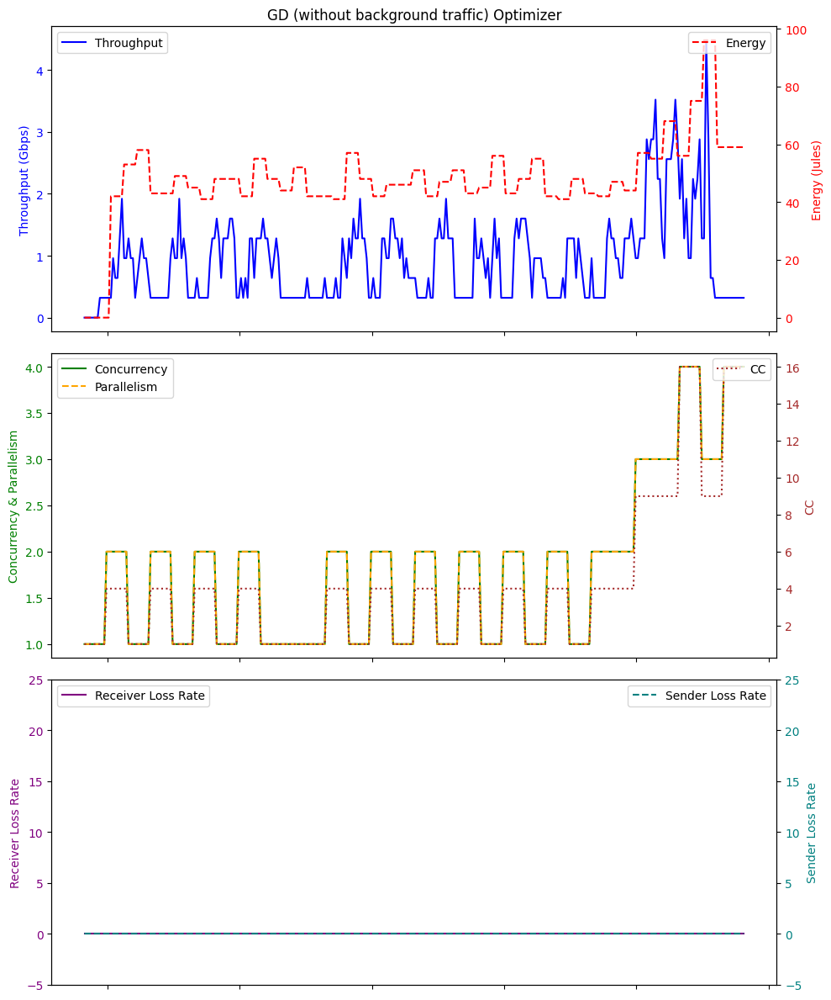

Average Throughput: 0.9013333333333332
Total Energy: 14344.0
Total loss rate: 0.051290118509531954
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 01:40:43.063551        0.00          0.0   1    0.0   0.0   
1   2024-01-19 01:40:44.058507        0.00          0.0   1    0.0   0.0   
2   2024-01-19 01:40:45.058051        0.00          0.0   1    0.0  32.8   
3   2024-01-19 01:40:46.059694        0.00          0.0   1    0.0  32.7   
4   2024-01-19 01:40:47.058902        0.00          0.0   1    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
215 2024-01-19 01:44:18.283180        1.28          0.0   1    1.0  32.8   
216 2024-01-19 01:44:19.283755        1.28          0.0   1    1.0  32.7   
217 2024-01-19 01:44:20.284962        1.28          0.0   1    1.0  32.7   
218 2024-01-19 01:44:21.285922        1.28          0.0   1    1.0  32.8   
219 2024-01-19 01:44:22.286262        1.28          0.0   1    1.

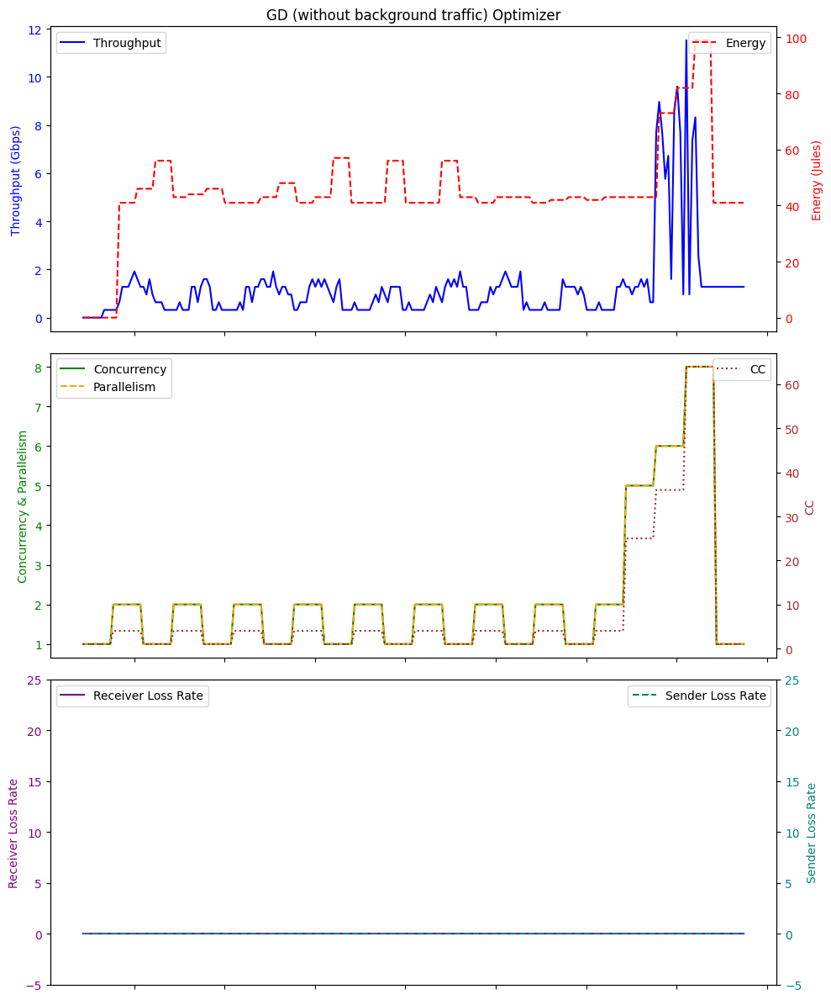

Average Throughput: 1.2465454545454546
Total Energy: 9930.0
Total loss rate: 0.006550883736214597
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 03:58:20.857836        0.00          0.0   1    0.0   0.0   
1   2024-01-19 03:58:21.853396        0.00          0.0   1    0.0   0.0   
2   2024-01-19 03:58:22.852943        0.00          0.0   1    0.0  32.6   
3   2024-01-19 03:58:23.857187        0.00          0.0   1    0.0  32.6   
4   2024-01-19 03:58:24.856039        0.00          0.0   1    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
125 2024-01-19 04:00:25.983802        3.52          0.0  16    3.0  32.6   
126 2024-01-19 04:00:26.984860        3.52          0.0  16    3.0  32.7   
127 2024-01-19 04:00:27.987347        3.52          0.0  16    3.0  32.6   
128 2024-01-19 04:00:28.986886        3.52          0.0  16    3.0  32.6   
129 2024-01-19 04:00:29.987840        3.52          0.0  16    3.0

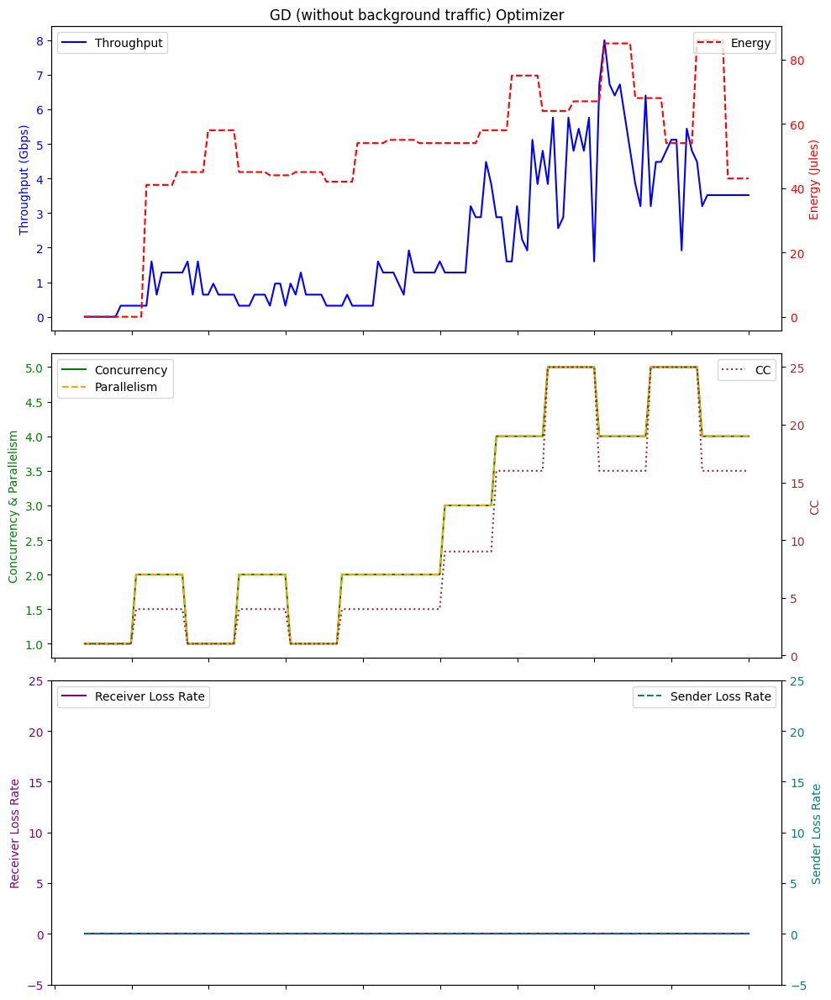

Average Throughput: 2.190769230769231
Total Energy: 6735.0
Total loss rate: 0.029064552126757577
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 00:03:25.587609        0.00          0.0   1    0.0   0.0   
1   2024-01-19 00:03:26.581040        0.00          0.0   1    0.0   0.0   
2   2024-01-19 00:03:27.580704        0.00          0.0   1    0.0  32.6   
3   2024-01-19 00:03:28.584236        0.00          0.0   1    0.0  32.7   
4   2024-01-19 00:03:29.584334        0.00          0.0   1    0.0  32.7   
..                         ...         ...          ...  ..    ...   ...   
115 2024-01-19 00:05:20.703440        0.32          0.0   1    0.0  32.7   
116 2024-01-19 00:05:21.703228        0.32          0.0   1    0.0  32.8   
117 2024-01-19 00:05:22.705421        0.32          0.0   1    0.0  32.8   
118 2024-01-19 00:05:23.706697        0.32          0.0   1    0.0  32.7   
119 2024-01-19 00:05:24.705268        0.32          0.0   1    0.0 

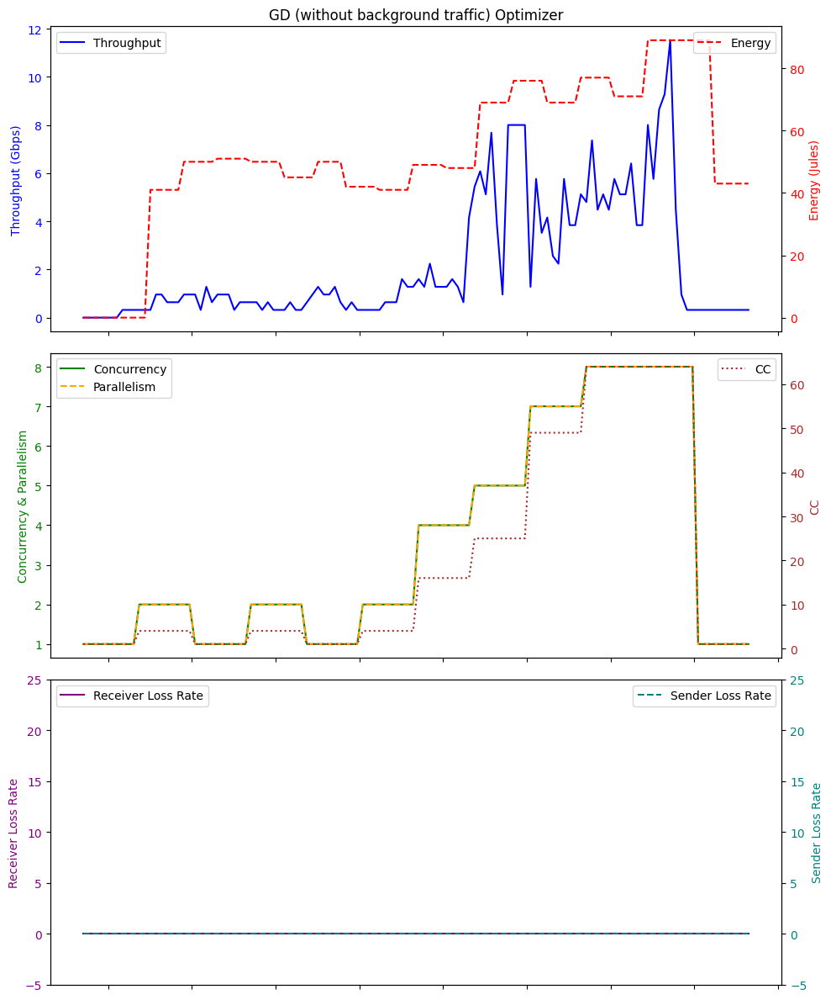

Average Throughput: 2.1653333333333338
Total Energy: 6293.0
Total loss rate: 0.023631133958714988
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 23:24:23.327378        0.00          0.0   1    0.0   0.0   
1   2024-01-18 23:24:24.322861        0.00          0.0   1    0.0   0.0   
2   2024-01-18 23:24:25.322687        0.00          0.0   1    0.0  36.5   
3   2024-01-18 23:24:26.326105        0.00          0.0   1    0.0  36.6   
4   2024-01-18 23:24:27.324999        0.00          0.0   1    0.0  37.5   
..                         ...         ...          ...  ..    ...   ...   
195 2024-01-18 23:27:38.521052        0.32          0.0  49    0.0  32.7   
196 2024-01-18 23:27:39.521496        0.32          0.0  49    0.0  32.6   
197 2024-01-18 23:27:40.524951        0.32          0.0  49    0.0  32.7   
198 2024-01-18 23:27:41.526744        0.32          0.0  49    0.0  32.7   
199 2024-01-18 23:27:42.524395        0.32          0.0  49    0.0

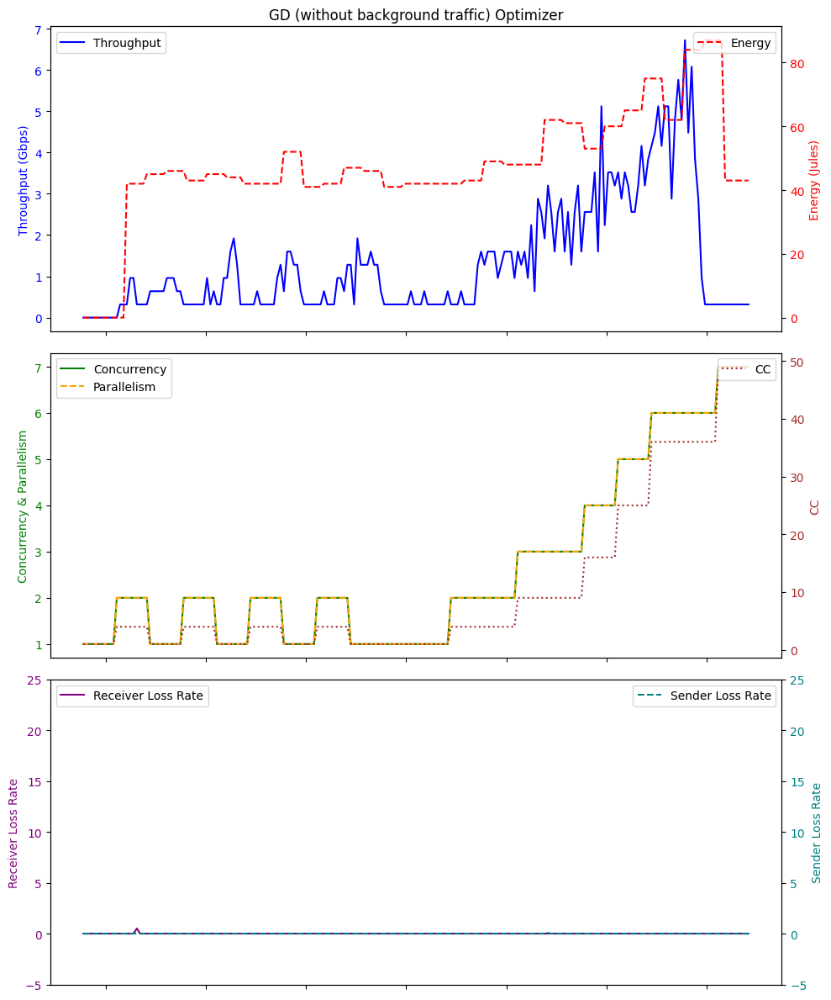

Average Throughput: 1.3152000000000001
Total Energy: 9546.0
Total loss rate: 0.10779490791025978
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 00:26:03.880039        0.00          0.0   1    0.0   0.0   
1   2024-01-19 00:26:04.873107        0.00          0.0   1    0.0   0.0   
2   2024-01-19 00:26:05.874517        0.00          0.0   1    0.0  32.7   
3   2024-01-19 00:26:06.876236        0.00          0.0   1    0.0  32.7   
4   2024-01-19 00:26:07.876530        0.00          0.0   1    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
355 2024-01-19 00:31:59.252986        0.32          0.0   1    0.0  32.6   
356 2024-01-19 00:32:00.256883        0.32          0.0   1    0.0  32.6   
357 2024-01-19 00:32:01.257328        0.32          0.0   1    0.0  32.6   
358 2024-01-19 00:32:02.257340        0.32          0.0   1    0.0  32.8   
359 2024-01-19 00:32:03.260929        0.32          0.0   1    0.0 

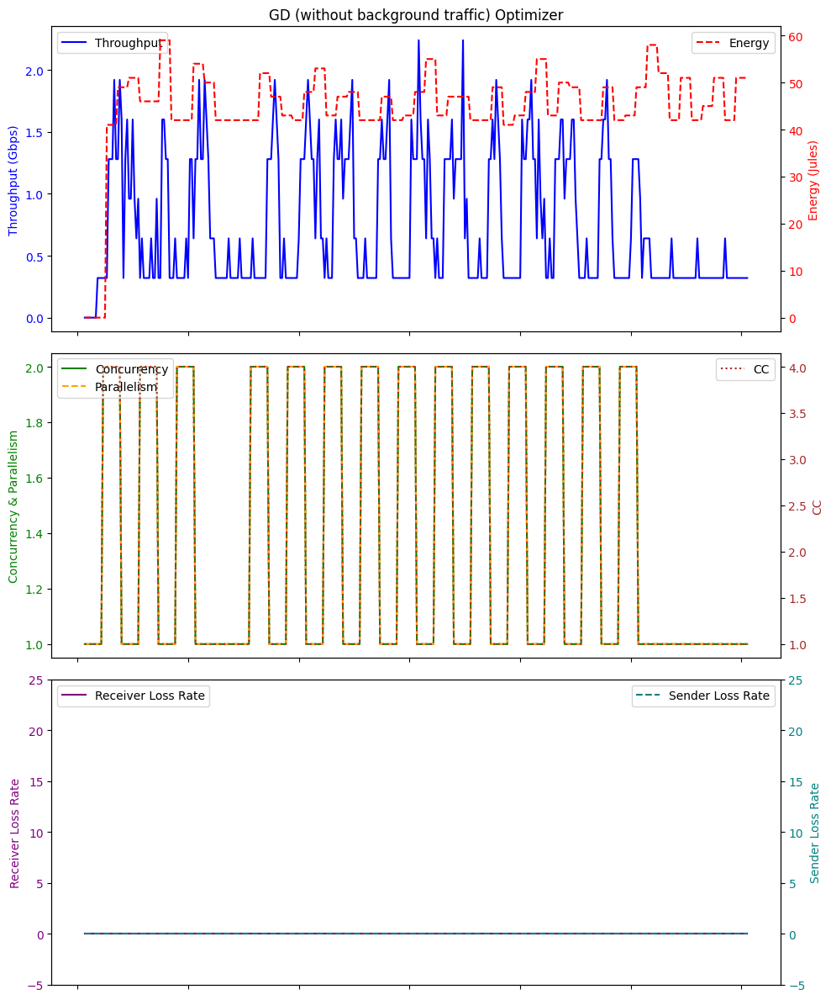

Average Throughput: 0.7377777777777779
Total Energy: 16145.0
Total loss rate: 0.042021626763183766
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 02:43:44.861631        0.00          0.0   1    0.0   0.0   
1   2024-01-19 02:43:45.860404        0.00          0.0   1    0.0   0.0   
2   2024-01-19 02:43:46.860069        0.00          0.0   1    0.0  33.0   
3   2024-01-19 02:43:47.860206        0.00          0.0   1    0.0  32.6   
4   2024-01-19 02:43:48.863250        0.00          0.0   1    0.0  33.0   
..                         ...         ...          ...  ..    ...   ...   
115 2024-01-19 02:45:39.977655        0.32          0.0  49    0.0  32.8   
116 2024-01-19 02:45:40.977057        0.32          0.0  49    0.0  32.8   
117 2024-01-19 02:45:41.978965        0.32          0.0  49    0.0  32.7   
118 2024-01-19 02:45:42.980116        0.32          0.0  49    0.0  33.0   
119 2024-01-19 02:45:43.979793        0.32          0.0  49    0.

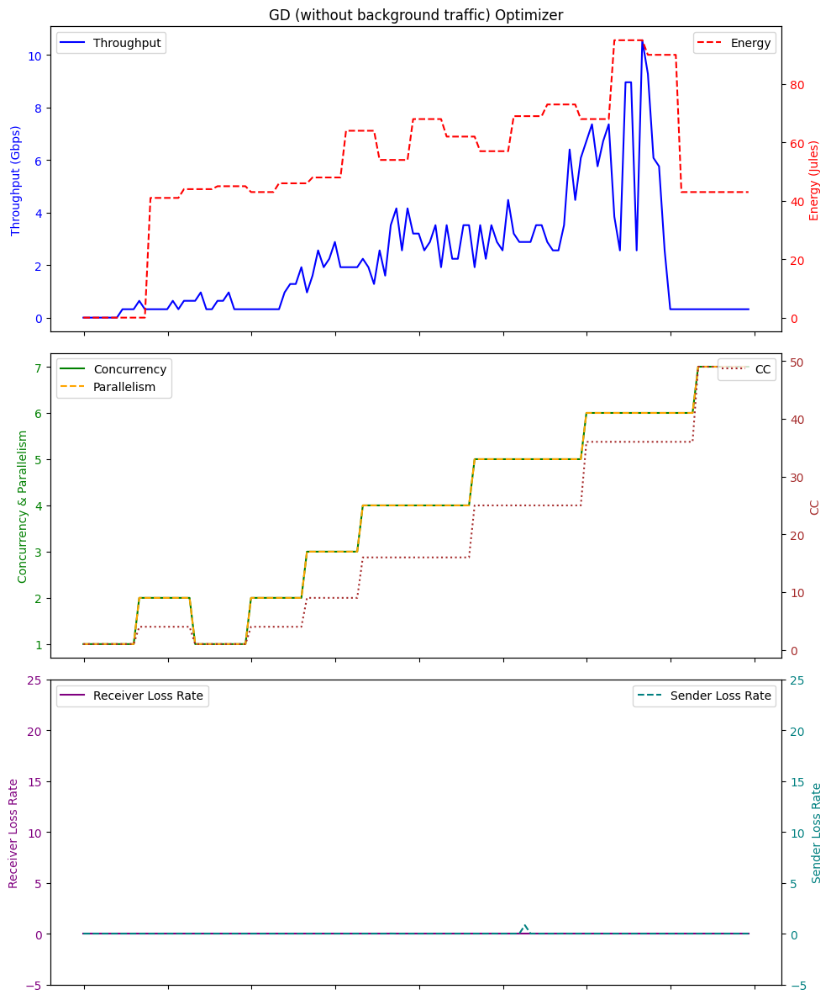

Average Throughput: 2.1893333333333334
Total Energy: 6318.0
Total loss rate: 0.8548571982316503
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 04:14:12.875057        0.00          0.0   1    0.0   0.0   
1  2024-01-19 04:14:13.870831        0.00          0.0   1    0.0   0.0   
2  2024-01-19 04:14:14.871244        0.00          0.0   1    0.0  32.7   
3  2024-01-19 04:14:15.872212        0.00          0.0   1    0.0  32.6   
4  2024-01-19 04:14:16.873598        0.00          0.0   1    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
95 2024-01-19 04:15:47.967219        1.28          0.0  64    1.0  32.8   
96 2024-01-19 04:15:48.968994        1.28          0.0  64    1.0  32.8   
97 2024-01-19 04:15:49.968397        1.28          0.0  64    1.0  32.7   
98 2024-01-19 04:15:50.969668        1.28          0.0  64    1.0  32.7   
99 2024-01-19 04:15:51.971570        1.28          0.0  64    1.0  32.8   

   

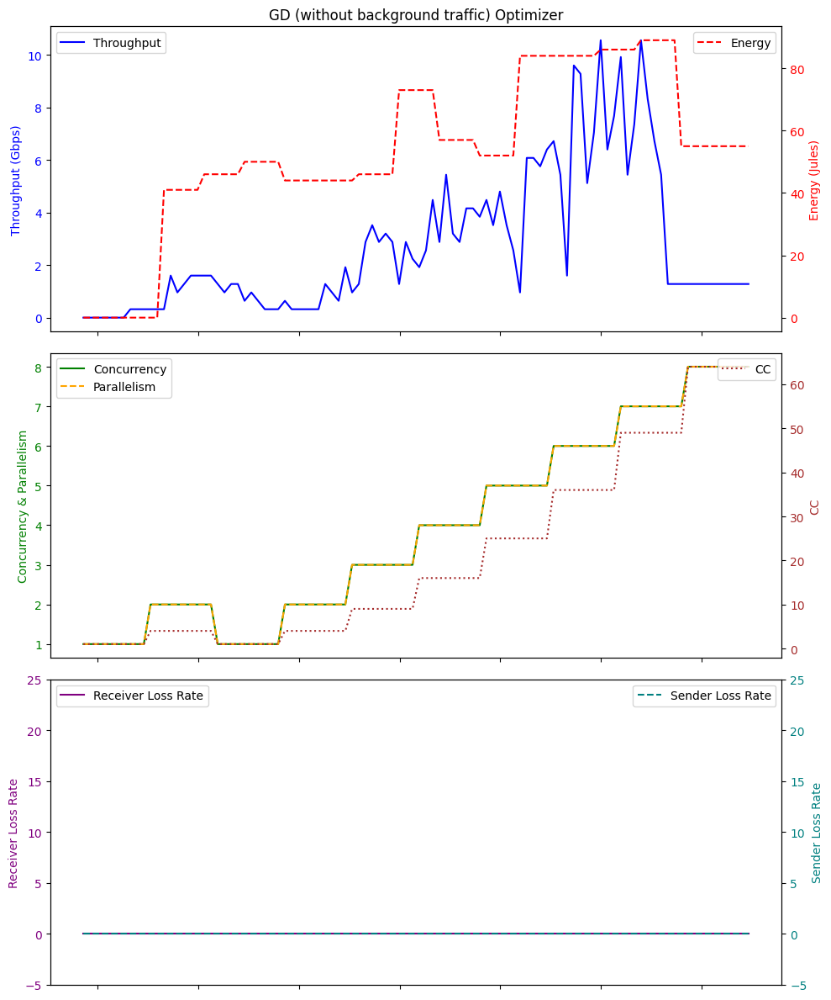

Average Throughput: 2.707199999999999
Total Energy: 5337.0
Total loss rate: 0.0025980999620196267
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 01:57:33.713853        0.00          0.0   1    0.0   0.0   
1   2024-01-19 01:57:34.707611        0.00          0.0   1    0.0   0.0   
2   2024-01-19 01:57:35.708020        0.00          0.0   1    0.0  33.6   
3   2024-01-19 01:57:36.710044        0.00          0.0   1    0.0  32.8   
4   2024-01-19 01:57:37.711532        0.00          0.0   1    0.0  33.2   
..                         ...         ...          ...  ..    ...   ...   
225 2024-01-19 02:01:18.947270        0.32          0.0  25    0.0  34.4   
226 2024-01-19 02:01:19.950349        0.32          0.0  25    0.0  33.1   
227 2024-01-19 02:01:20.950223        0.32          0.0  25    0.0  32.7   
228 2024-01-19 02:01:21.950441        0.32          0.0  25    0.0  33.1   
229 2024-01-19 02:01:22.952158        0.32          0.0  25    0.0

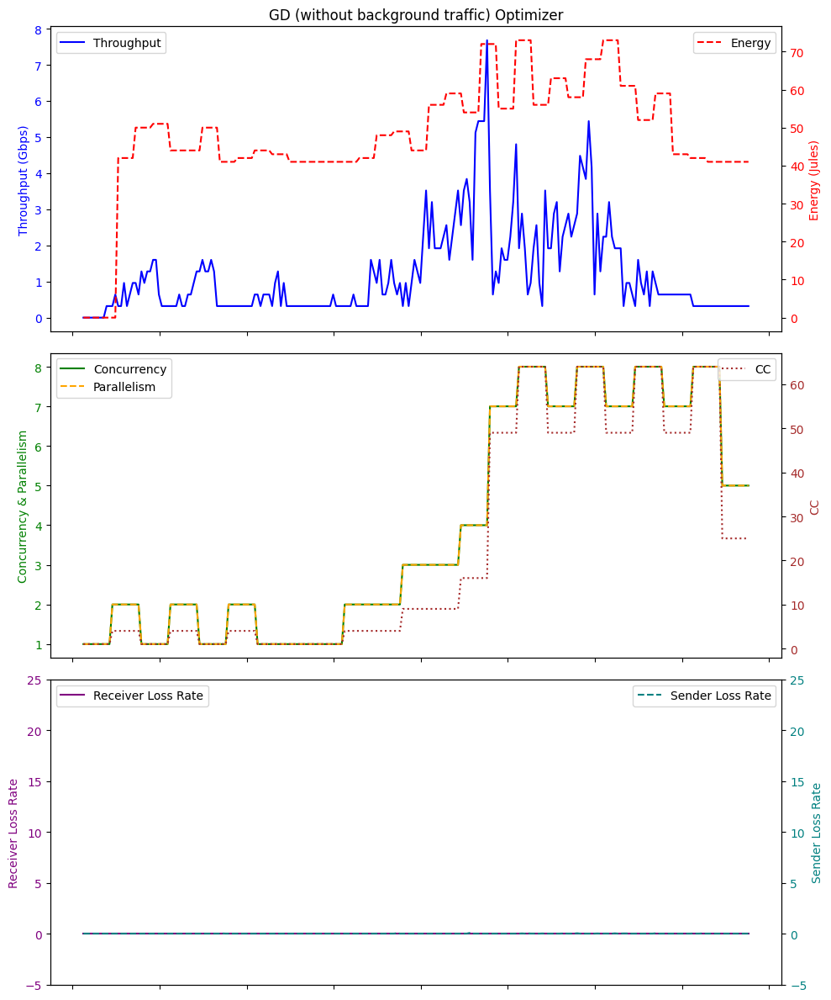

Average Throughput: 1.2104347826086956
Total Energy: 11023.0
Total loss rate: 0.38091060063705046
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 00:45:43.331343        0.00          0.0   1    0.0   0.0   
1   2024-01-19 00:45:44.327298        0.00          0.0   1    0.0   0.0   
2   2024-01-19 00:45:45.327420        0.00          0.0   1    0.0  32.6   
3   2024-01-19 00:45:46.330966        0.00          0.0   1    0.0  32.6   
4   2024-01-19 00:45:47.330663        0.00          0.0   1    0.0  32.8   
..                         ...         ...          ...  ..    ...   ...   
359 2024-01-19 00:51:48.715571        0.32          0.0   1    0.0  32.7   
360 2024-01-19 00:51:49.717259        0.32          0.0   1    0.0  32.6   
361 2024-01-19 00:51:50.719182        0.32          0.0   1    0.0  32.7   
362 2024-01-19 00:51:51.720903        0.32          0.0   1    0.0  32.7   
363 2024-01-19 00:51:52.720204        0.32          0.0   1    0.0

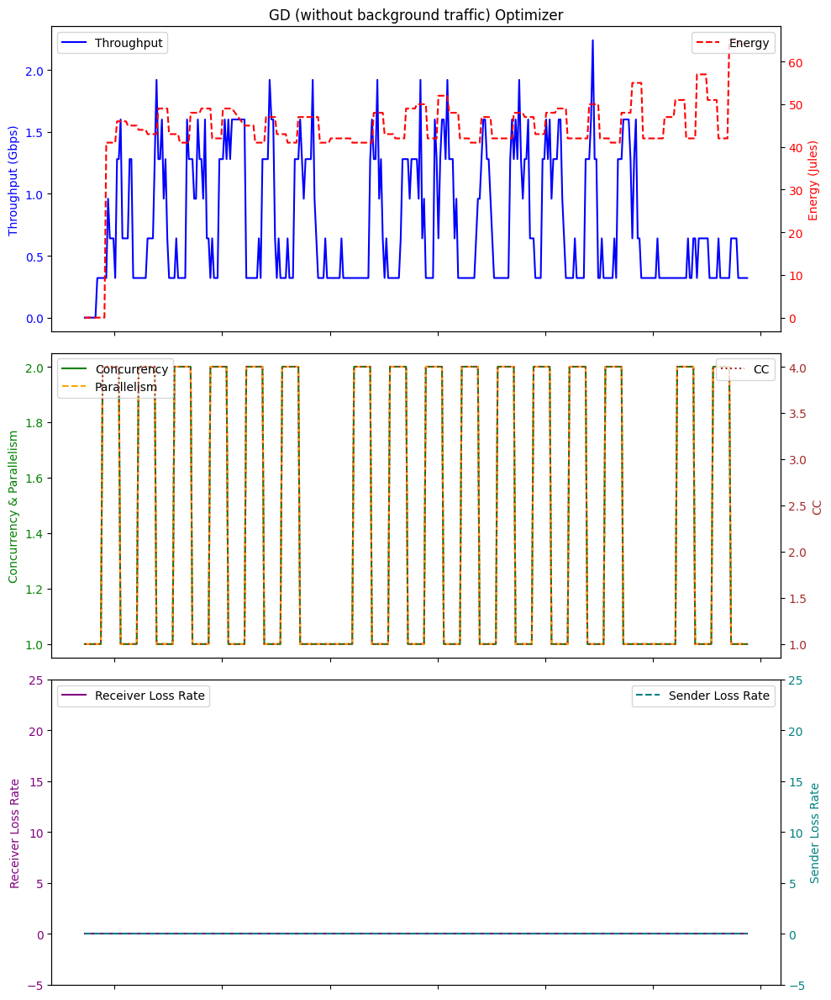

Average Throughput: 0.7323076923076923
Total Energy: 16116.0
Total loss rate: 0.006866144060516325
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 03:21:02.633636        0.00          0.0   1    0.0   0.0   
1   2024-01-19 03:21:03.628830        0.00          0.0   1    0.0   0.0   
2   2024-01-19 03:21:04.629243        0.00          0.0   1    0.0  32.6   
3   2024-01-19 03:21:05.632445        0.00          0.0   1    0.0  32.6   
4   2024-01-19 03:21:06.631797        0.00          0.0   1    0.0  32.7   
..                         ...         ...          ...  ..    ...   ...   
215 2024-01-19 03:24:37.852188        0.96          0.0  49    1.0  32.7   
216 2024-01-19 03:24:38.855078        0.96          0.0  49    1.0  32.6   
217 2024-01-19 03:24:39.854938        0.96          0.0  49    1.0  32.7   
218 2024-01-19 03:24:40.854611        0.96          0.0  49    1.0  32.6   
219 2024-01-19 03:24:41.856958        0.96          0.0  49    1.

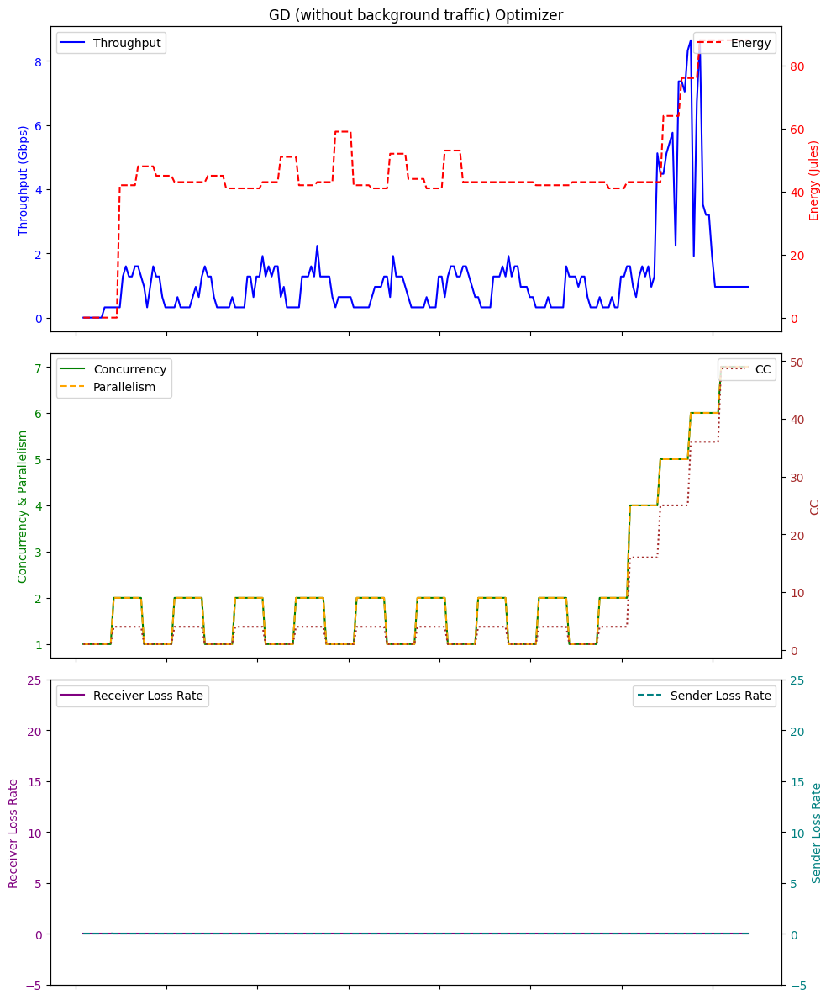

Average Throughput: 1.2247272727272729
Total Energy: 10261.0
Total loss rate: 0.02625073301746345
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 04:29:14.484168        0.00          0.0   1    0.0   0.0   
1   2024-01-19 04:29:15.478259        0.00          0.0   1    0.0   0.0   
2   2024-01-19 04:29:16.480970        0.00          0.0   1    0.0  32.7   
3   2024-01-19 04:29:17.482119        0.00          0.0   1    0.0  32.6   
4   2024-01-19 04:29:18.482504        0.00          0.0   1    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
355 2024-01-19 04:35:09.857990        0.96          0.0   9    1.0  32.8   
356 2024-01-19 04:35:10.856871        0.96          0.0   9    1.0  32.8   
357 2024-01-19 04:35:11.858808        0.96          0.0   9    1.0  32.8   
358 2024-01-19 04:35:12.859420        0.96          0.0   9    1.0  32.8   
359 2024-01-19 04:35:13.861528        0.96          0.0   9    1.0

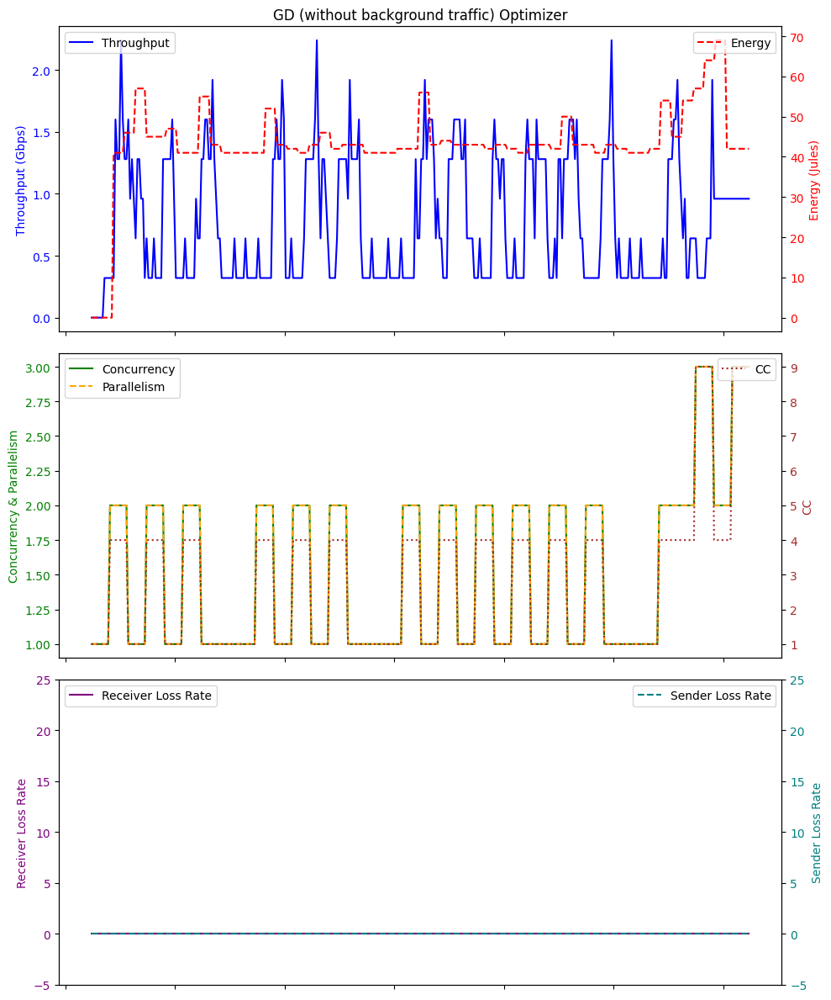

Average Throughput: 0.768
Total Energy: 15645.0
Total loss rate: 0.012510271763089454
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 02:20:06.214127        0.00          0.0   1    0.0   0.0   
1   2024-01-19 02:20:07.207504        0.00          0.0   1    0.0   0.0   
2   2024-01-19 02:20:08.208029        0.00          0.0   1    0.0  33.8   
3   2024-01-19 02:20:09.211489        0.00          0.0   1    0.0  33.5   
4   2024-01-19 02:20:10.210421        0.00          0.0   1    0.0  34.8   
..                         ...         ...          ...  ..    ...   ...   
475 2024-01-19 02:28:01.710762        0.32          0.0   4    0.0  35.2   
476 2024-01-19 02:28:02.711847        0.32          0.0   4    0.0  35.2   
477 2024-01-19 02:28:03.714600        0.32          0.0   4    0.0  34.0   
478 2024-01-19 02:28:04.714478        0.32          0.0   4    0.0  34.0   
479 2024-01-19 02:28:05.715150        0.32          0.0   4    0.0  33.7   

 

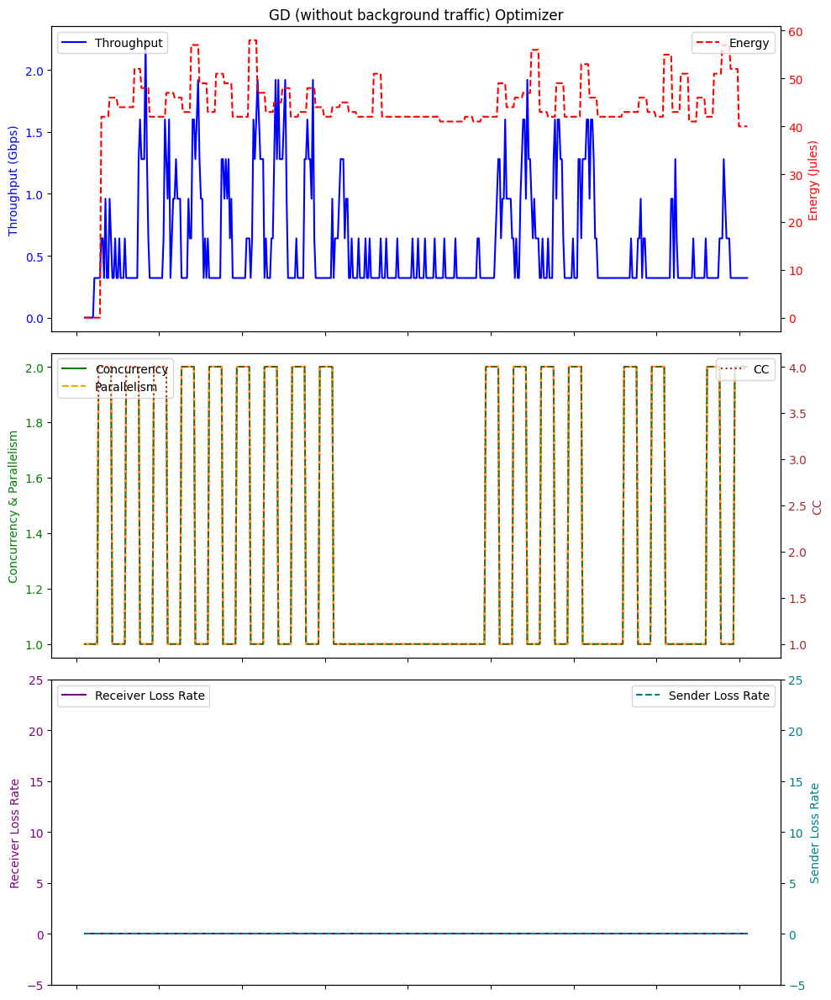

Average Throughput: 0.5860000000000002
Total Energy: 21108.0
Total loss rate: 0.1766287534580306
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 22:44:21.285392        0.00          0.0   1    0.0   0.0   
1   2024-01-18 22:44:22.280756        0.00          0.0   1    0.0   0.0   
2   2024-01-18 22:44:23.280535        0.00          0.0   1    0.0  32.6   
3   2024-01-18 22:44:24.283512        0.00          0.0   1    0.0  35.8   
4   2024-01-18 22:44:25.284268        0.00          0.0   1    0.0  59.0   
..                         ...         ...          ...  ..    ...   ...   
185 2024-01-18 22:47:26.478361        0.32          0.0  49    0.0  32.7   
186 2024-01-18 22:47:27.478281        0.32          0.0  49    0.0  32.7   
187 2024-01-18 22:47:28.479278        0.32          0.0  49    0.0  32.7   
188 2024-01-18 22:47:29.481787        0.32          0.0  49    0.0  33.0   
189 2024-01-18 22:47:30.481510        0.32          0.0  49    0.0 

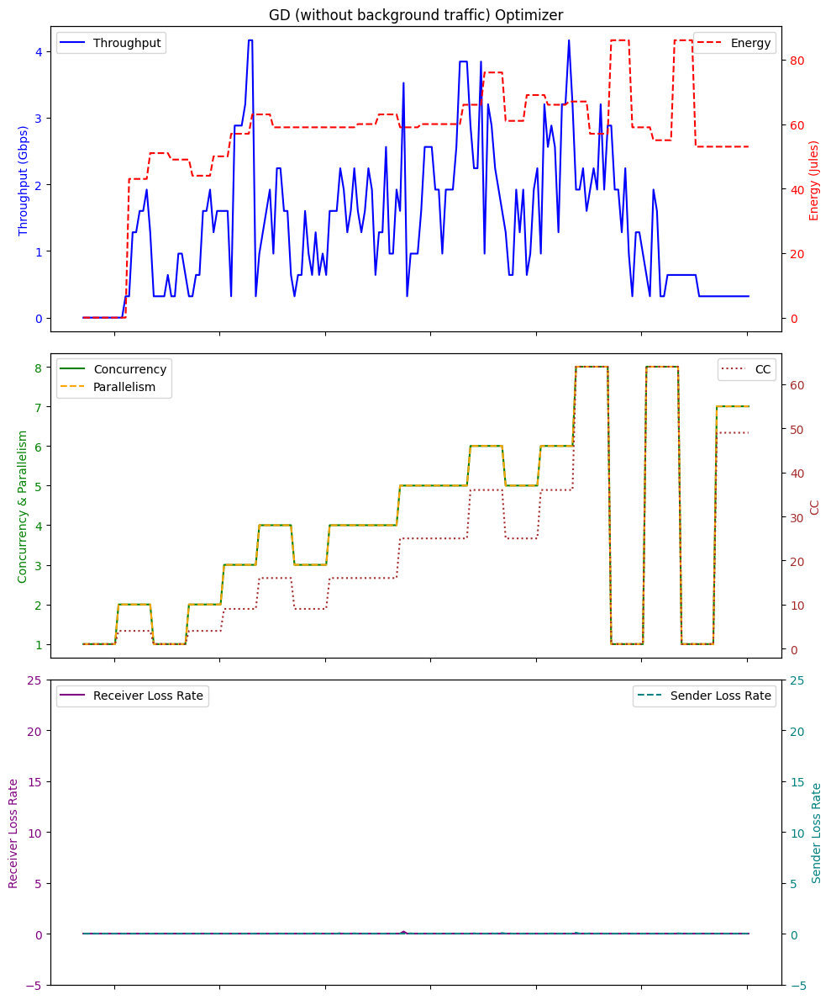

Average Throughput: 1.3962105263157893
Total Energy: 10656.0
Total loss rate: 0.4331332600578019
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 03:38:44.791395        0.00          0.0   1    0.0   0.0   
1   2024-01-19 03:38:45.785523        0.00          0.0   1    0.0   0.0   
2   2024-01-19 03:38:46.788450        0.00          0.0   1    0.0  32.9   
3   2024-01-19 03:38:47.788077        0.00          0.0   1    0.0  32.6   
4   2024-01-19 03:38:48.788250        0.00          0.0   1    0.0  32.7   
..                         ...         ...          ...  ..    ...   ...   
365 2024-01-19 03:44:50.171252        0.32          0.0   1    0.0  32.8   
366 2024-01-19 03:44:51.171342        0.32          0.0   1    0.0  32.6   
367 2024-01-19 03:44:52.171470        0.32          0.0   1    0.0  32.8   
368 2024-01-19 03:44:53.174744        0.32          0.0   1    0.0  32.7   
369 2024-01-19 03:44:54.175472        0.32          0.0   1    0.0 

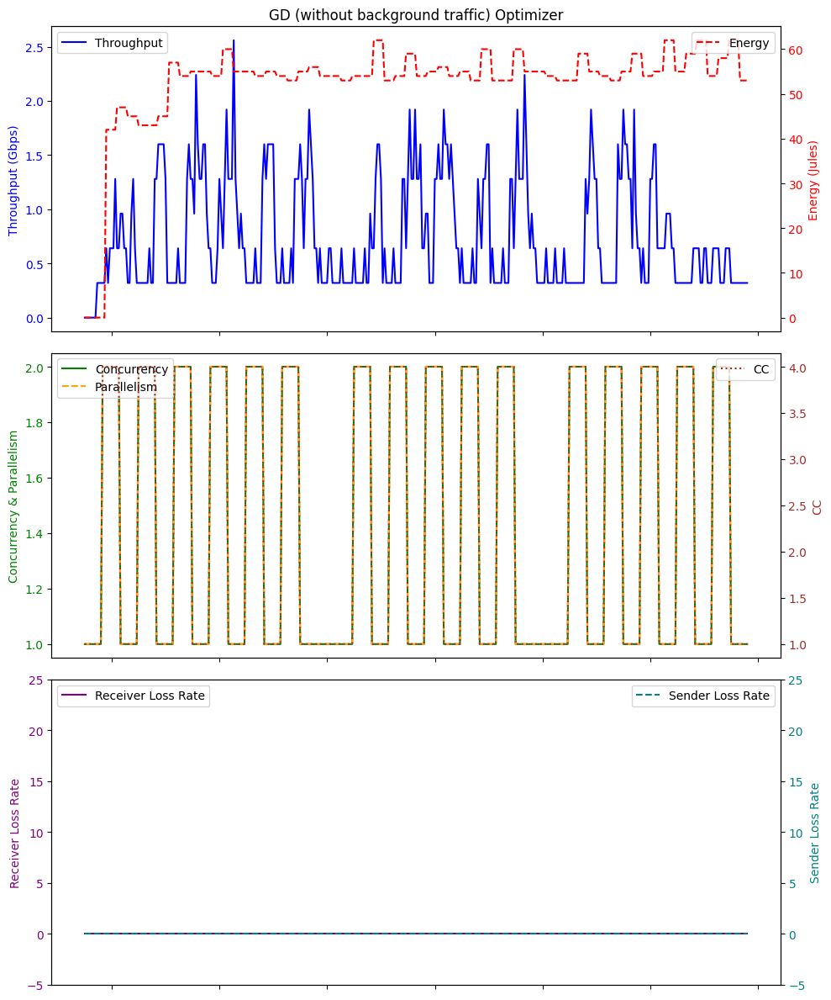

Average Throughput: 0.7316756756756757
Total Energy: 19500.0
Total loss rate: 0.006926898556864199
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 01:05:50.401170        0.00          0.0   1    0.0   0.0   
1   2024-01-19 01:05:51.395821        0.00          0.0   1    0.0   0.0   
2   2024-01-19 01:05:52.396929        0.00          0.0   1    0.0  32.6   
3   2024-01-19 01:05:53.397576        0.00          0.0   1    0.0  32.7   
4   2024-01-19 01:05:54.398794        0.00          0.0   1    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
105 2024-01-19 01:07:35.504462        1.92          0.0  16    2.0  32.7   
106 2024-01-19 01:07:36.503097        1.92          0.0  16    2.0  32.7   
107 2024-01-19 01:07:37.506196        1.92          0.0  16    2.0  32.7   
108 2024-01-19 01:07:38.505005        1.92          0.0  16    2.0  32.7   
109 2024-01-19 01:07:39.507134        1.92          0.0  16    2.

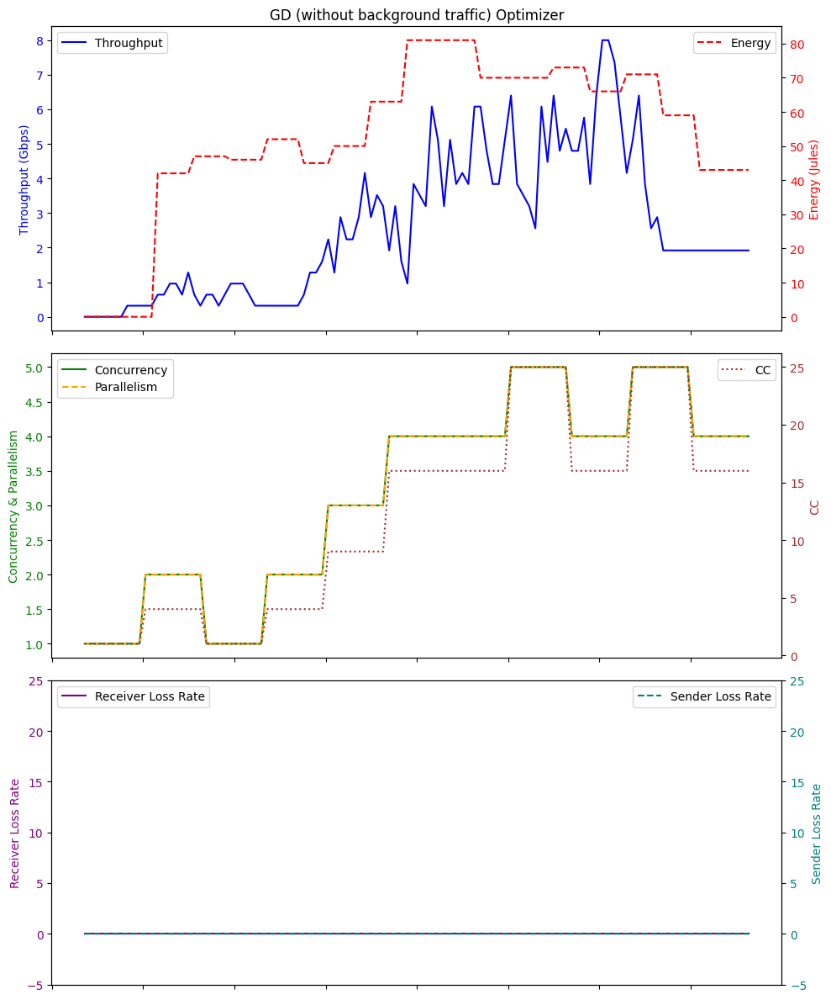

Average Throughput: 2.571636363636365
Total Energy: 5838.0
Total loss rate: 0.008103876509187294


In [4]:
# Example usage GD
directory = './logFileDir/GD/'
dfs = process_log_files(directory,"GD_logFile_")

gd_throughput_list=[]
gd_energy_list=[]
gd_plr_list=[]
# Print or process the dataframes as needed
for df in dfs:
    print(df)
    # Plotting
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)


    # Top plot with Throughput and Energy
    ax1.plot(df['Time'], df['Throughput'], label='Throughput', color='blue')
    ax1.set_ylabel('Throughput (Gbps)', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_title('GD (without background traffic) Optimizer')

    ax2_twin = ax1.twinx()
    ax2_twin.plot(df['Time'], df['Energy'], label='Energy', color='red', linestyle='--')
    ax2_twin.set_ylabel('Energy (Jules)', color='red')
    ax2_twin.tick_params(axis='y', labelcolor='red')

    # Bottom plot with Concurrency, Parallelism, and CC
    ax2.plot(df['Time'], df['concurrency'], label='Concurrency', color='green')
    ax2.plot(df['Time'], df['parallelism'], label='Parallelism', color='orange', linestyle='--')
    ax2.set_ylabel('Concurrency & Parallelism', color='green')
    ax2.tick_params(axis='y', labelcolor='green')

    ax3_twin = ax2.twinx()
    ax3_twin.plot(df['Time'], df['CC'], label='CC', color='brown', linestyle=':')
    ax3_twin.set_ylabel('CC', color='brown')
    ax3_twin.tick_params(axis='y', labelcolor='brown')
    
    # Bottom plot with Receiver Loss Rate and Sender Loss Rate
    ax3.plot(df['Time'], df['receiver_lr'], label='Receiver Loss Rate', color='purple', linestyle='-')
    ax3.set_ylabel('Receiver Loss Rate', color='purple')
    ax3.tick_params(axis='y', labelcolor='purple')

    ax4_twin = ax3.twinx()
    ax4_twin.plot(df['Time'], df['sender_lr'], label='Sender Loss Rate', color='teal', linestyle='--')
    ax4_twin.set_ylabel('Sender Loss Rate', color='teal')
    ax4_twin.tick_params(axis='y', labelcolor='teal')
    ax4_twin.set_ylim(-5,25)

    ax3.set_ylim(-5,25)

    # Formatting the x-axis to show time correctly
#     ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: (datetime.min + timedelta(seconds=x)).strftime('%H:%M:%S')))
#     ax2.set_xticklabels([])
    ax1.set_xticklabels([])
    ax2.set_xticklabels([])
    # Fix for overlapping layouts
    fig.tight_layout()

    # Legend
    ax1.legend(loc='upper left')
    ax2_twin.legend(loc='upper right')
    ax2.legend(loc='upper left')
    ax3_twin.legend(loc='upper right')
    ax3.legend(loc='upper left')
    ax4_twin.legend(loc='upper right')
    plt.show()

    average_throughput = df['Throughput'].mean()
    print("Average Throughput:", average_throughput)
    total_energy = df['Energy'].sum()
    print("Total Energy:", total_energy)
    total_plr = df['sender_lr'].sum()
    print("Total loss rate:", total_plr)
    
    gd_throughput_list.append(average_throughput)
    gd_energy_list.append(total_energy)
    gd_plr_list.append(total_plr)


                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 01:28:25.791978        0.00          0.0  25    0.0   0.0   
1  2024-01-19 01:28:26.789734        0.00          0.0  25    0.0   0.0   
2  2024-01-19 01:28:27.789750        0.00          0.0  25    0.0  32.7   
3  2024-01-19 01:28:28.789959        0.00          0.0  25    0.0  32.6   
4  2024-01-19 01:28:29.792840        0.00          0.0  25    0.0  32.8   
..                        ...         ...          ...  ..    ...   ...   
65 2024-01-19 01:29:30.855939        3.52          0.0  25    3.0  32.6   
66 2024-01-19 01:29:31.856296        3.52          0.0  25    3.0  32.8   
67 2024-01-19 01:29:32.859042        3.52          0.0  25    3.0  32.7   
68 2024-01-19 01:29:33.859814        3.52          0.0  25    3.0  32.7   
69 2024-01-19 01:29:34.861427        3.52          0.0  25    3.0  32.7   

    Energy  sender_lr  concurrency  parallelism  
0      0.0        0.0            5            5  

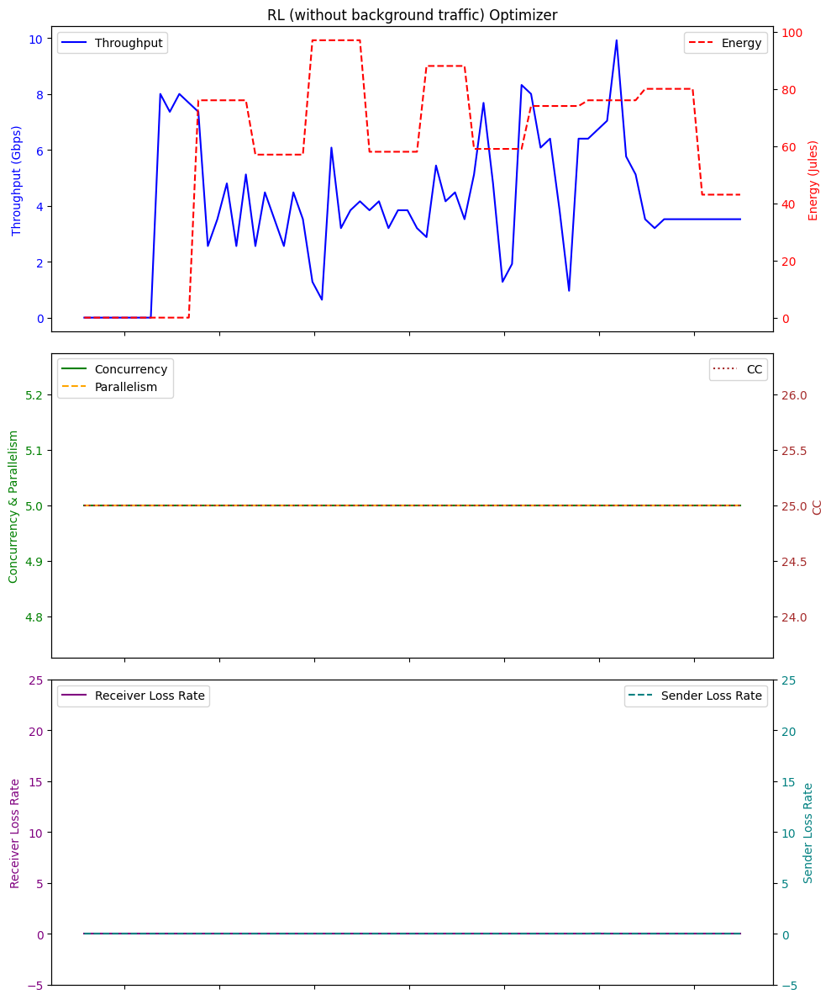

Average Throughput: 3.9999999999999982
Total Energy: 4117.0
Total loss rate: 0.018794654057991692
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 02:47:52.831136        0.00          0.0  25    0.0   0.0   
1  2024-01-19 02:47:53.826404        0.00          0.0  25    0.0   0.0   
2  2024-01-19 02:47:54.828411        0.00          0.0  25    0.0  33.4   
3  2024-01-19 02:47:55.829485        0.00          0.0  25    0.0  33.0   
4  2024-01-19 02:47:56.830250        0.00          0.0  25    0.0  33.1   
..                        ...         ...          ...  ..    ...   ...   
65 2024-01-19 02:48:57.896068        0.32          0.0  25    0.0  33.0   
66 2024-01-19 02:48:58.897911        0.32          0.0  25    0.0  33.1   
67 2024-01-19 02:48:59.898565        0.32          0.0  25    0.0  33.2   
68 2024-01-19 02:49:00.898401        0.32          0.0  25    0.0  33.1   
69 2024-01-19 02:49:01.900065        0.32          0.0  25    0.0  32.8   

 

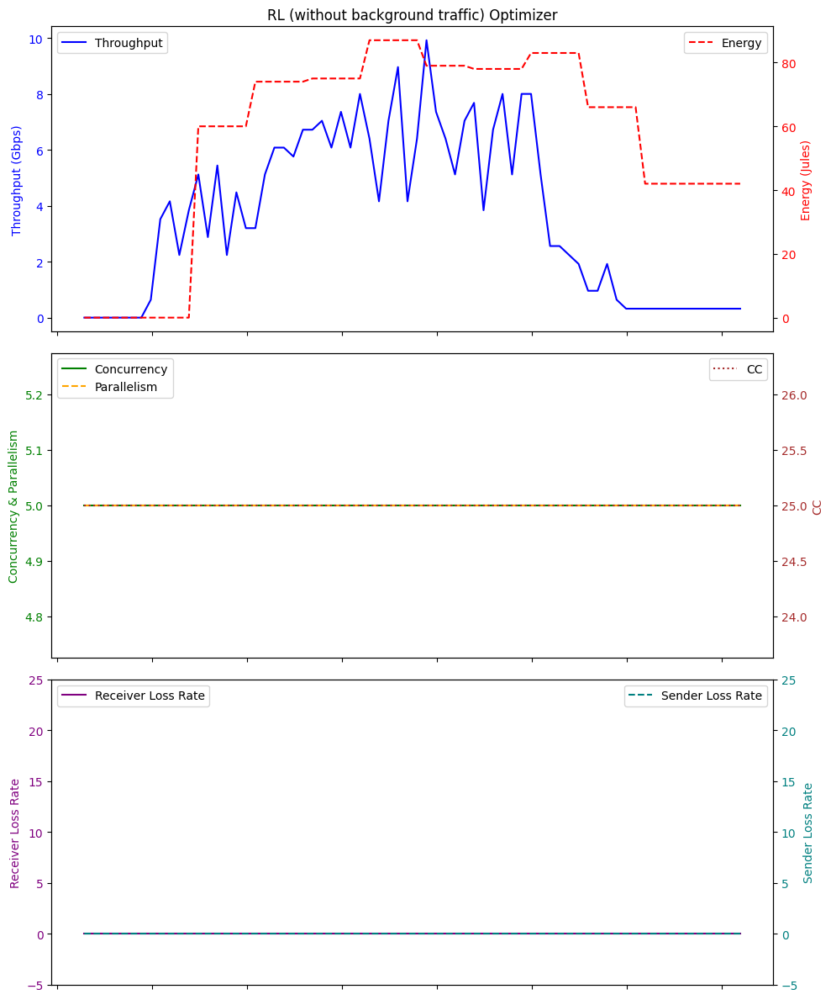

Average Throughput: 3.6479999999999992
Total Energy: 3995.0
Total loss rate: 0.005468903883115812
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 23:10:38.628145        0.00          0.0  25    0.0   0.0   
1   2024-01-18 23:10:39.626677        0.00          0.0  25    0.0   0.0   
2   2024-01-18 23:10:40.627646        0.00          0.0  25    0.0  32.6   
3   2024-01-18 23:10:41.627520        0.00          0.0  25    0.0  32.7   
4   2024-01-18 23:10:42.628289        0.00          0.0  25    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
105 2024-01-18 23:12:23.735189        1.92          0.0  25    2.0  53.0   
106 2024-01-18 23:12:24.736925        1.92          0.0  25    2.0  43.8   
107 2024-01-18 23:12:25.737493        1.92          0.0  25    2.0  36.4   
108 2024-01-18 23:12:26.738261        1.92          0.0  25    2.0  36.1   
109 2024-01-18 23:12:27.738243        1.92          0.0  25    2.0

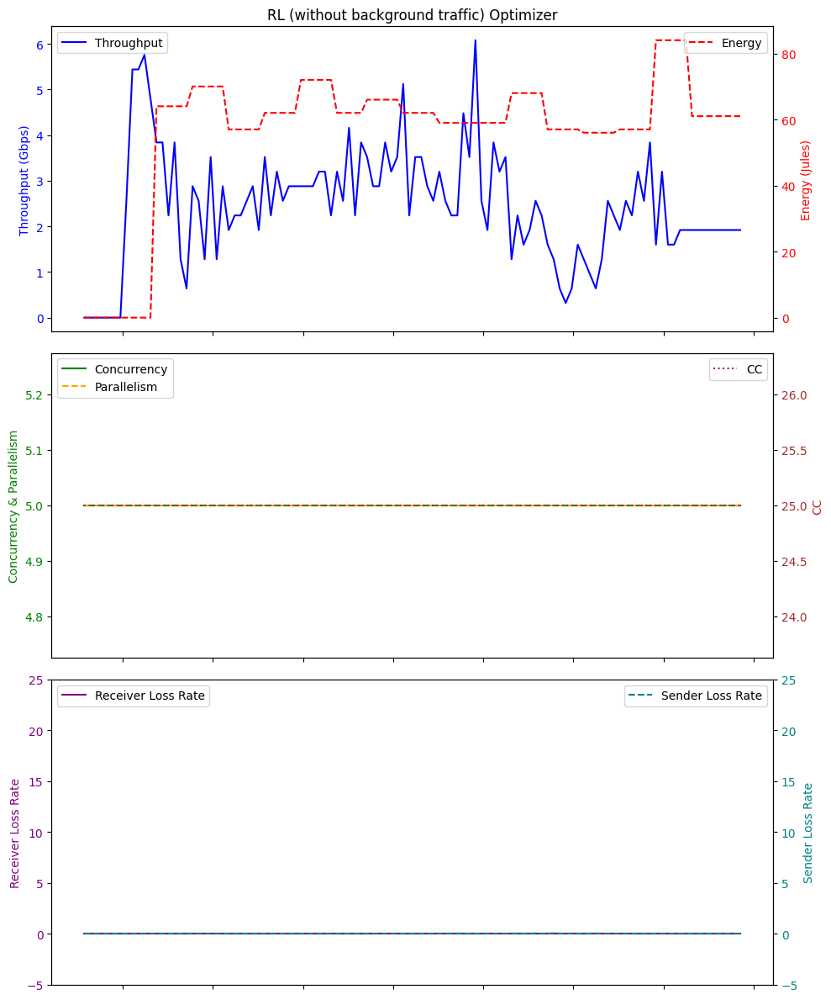

Average Throughput: 2.4523636363636374
Total Energy: 6217.0
Total loss rate: 0.15391084531437427
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 03:08:10.886991        0.00          0.0  25    0.0   0.0   
1  2024-01-19 03:08:11.882328        0.00          0.0  25    0.0   0.0   
2  2024-01-19 03:08:12.886940        0.00          0.0  25    0.0  32.7   
3  2024-01-19 03:08:13.885827        0.00          0.0  25    0.0  32.6   
4  2024-01-19 03:08:14.885768        0.00          0.0  25    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
75 2024-01-19 03:09:25.964080        0.32          0.0  25    0.0  32.6   
76 2024-01-19 03:09:26.963425        0.32          0.0  25    0.0  32.6   
77 2024-01-19 03:09:27.964746        0.32          0.0  25    0.0  32.8   
78 2024-01-19 03:09:28.966489        0.32          0.0  25    0.0  32.6   
79 2024-01-19 03:09:29.966708        0.32          0.0  25    0.0  32.7   

  

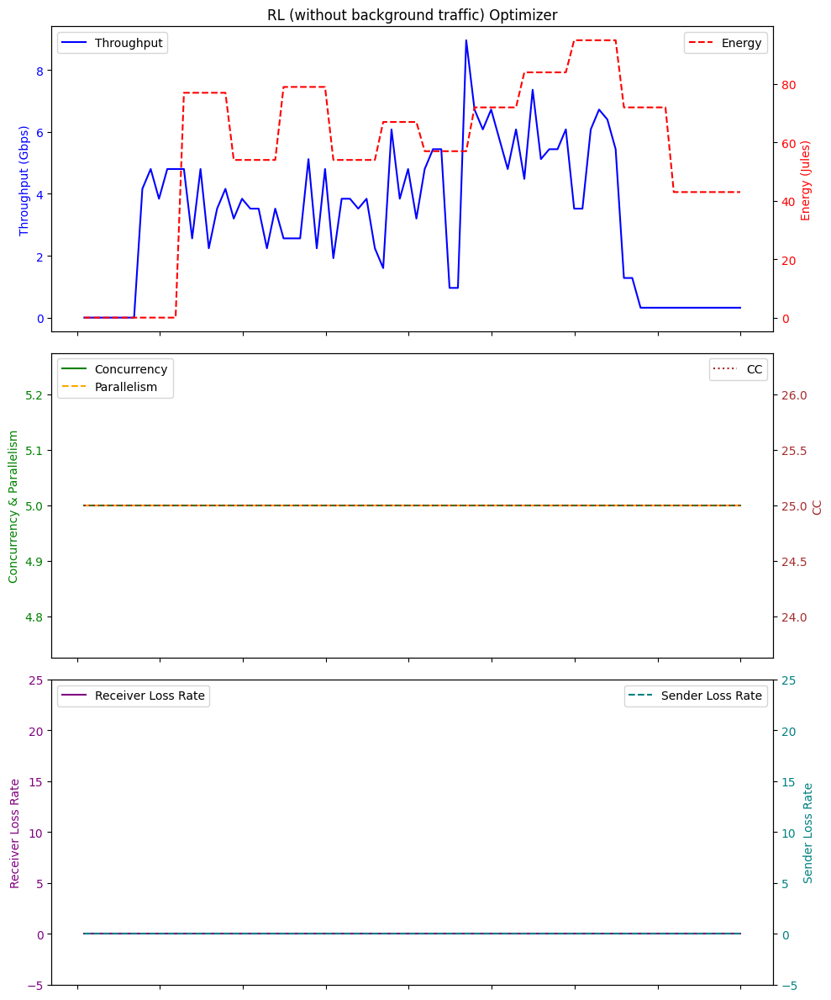

Average Throughput: 3.224
Total Energy: 4586.0
Total loss rate: 0.008730762970933
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 02:04:20.422420        0.00          0.0  25    0.0   0.0   
1   2024-01-19 02:04:21.417980        0.00          0.0  25    0.0   0.0   
2   2024-01-19 02:04:22.419057        0.00          0.0  25    0.0  32.6   
3   2024-01-19 02:04:23.422745        0.00          0.0  25    0.0  32.7   
4   2024-01-19 02:04:24.422333        0.00          0.0  25    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
145 2024-01-19 02:06:45.570068        0.32          0.0  25    0.0  41.8   
146 2024-01-19 02:06:46.571837        0.32          0.0  25    0.0  45.6   
147 2024-01-19 02:06:47.571866        0.32          0.0  25    0.0  37.8   
148 2024-01-19 02:06:48.574111        0.32          0.0  25    0.0  43.6   
149 2024-01-19 02:06:49.575304        0.32          0.0  25    0.0  62.9   

     

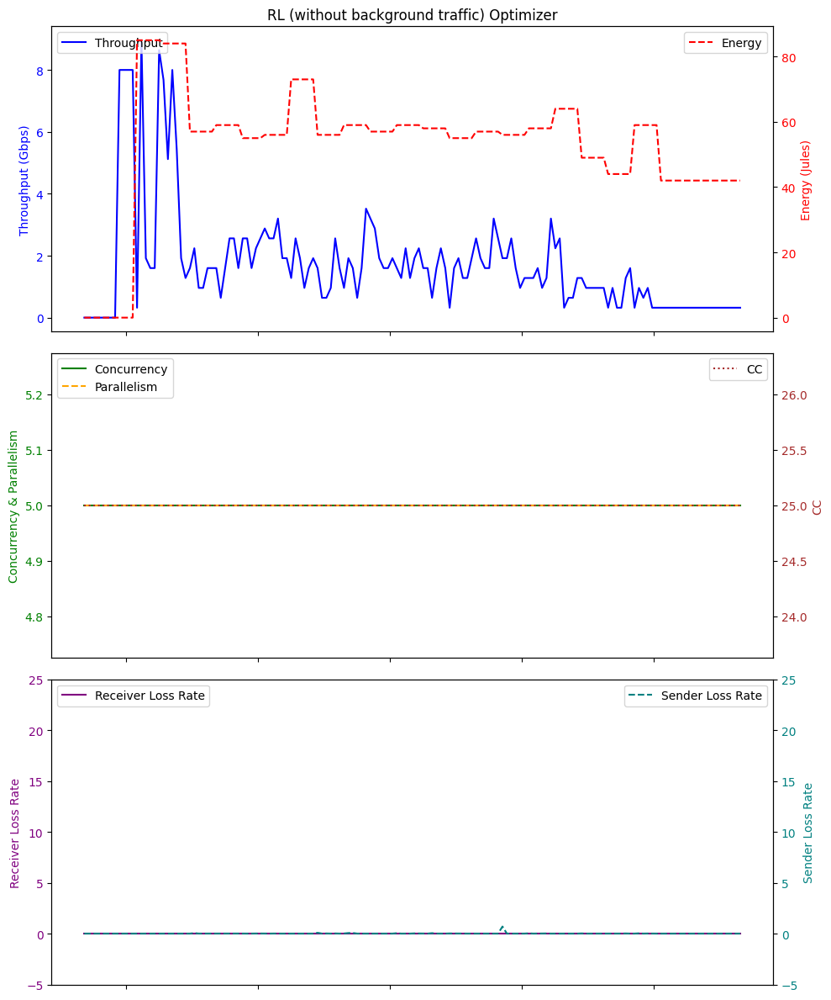

Average Throughput: 1.7450666666666665
Total Energy: 7943.0
Total loss rate: 1.269663294660719
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 00:13:56.458972        0.00          0.0  25    0.0   0.0   
1  2024-01-19 00:13:57.458154        0.00          0.0  25    0.0   0.0   
2  2024-01-19 00:13:58.458188        0.00          0.0  25    0.0  32.6   
3  2024-01-19 00:13:59.457088        0.00          0.0  25    0.0  32.7   
4  2024-01-19 00:14:00.459246        0.00          0.0  25    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
75 2024-01-19 00:15:11.535792        2.24          0.0  25    2.0  32.7   
76 2024-01-19 00:15:12.536105        2.24          0.0  25    2.0  32.7   
77 2024-01-19 00:15:13.536653        2.24          0.0  25    2.0  32.7   
78 2024-01-19 00:15:14.537509        2.24          0.0  25    2.0  32.7   
79 2024-01-19 00:15:15.538923        2.24          0.0  25    2.0  32.7   

    

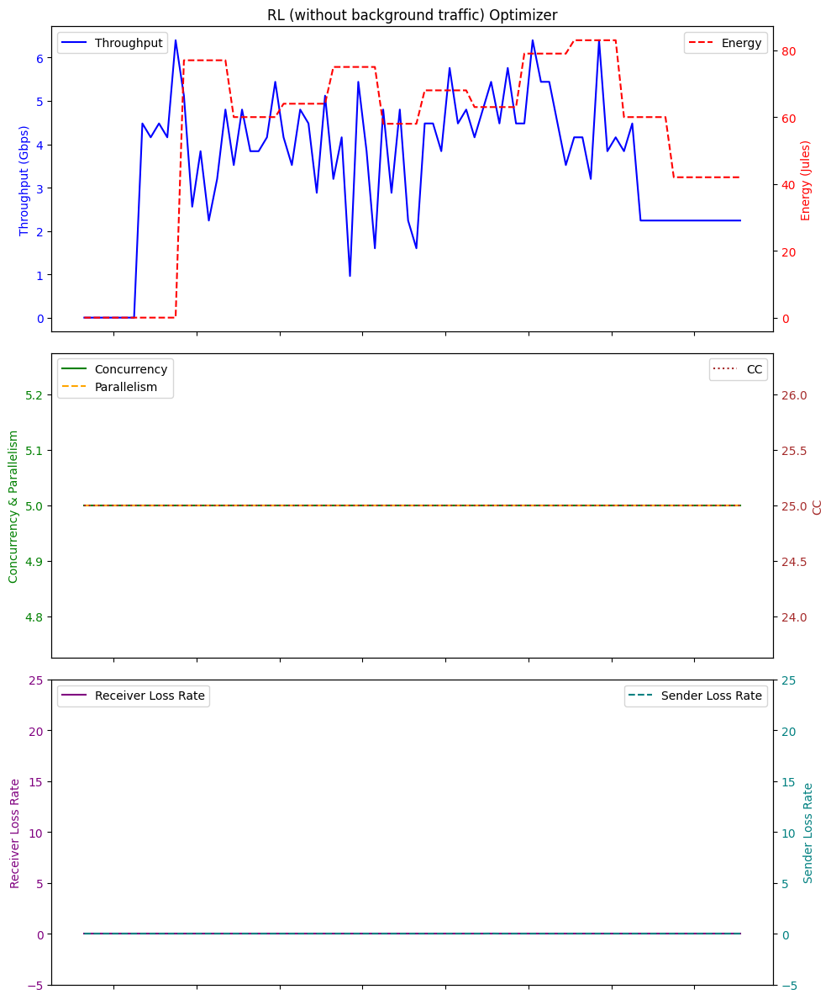

Average Throughput: 3.5200000000000005
Total Energy: 4442.0
Total loss rate: 0.011873135308706975
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 01:08:58.570029        0.00          0.0  25    0.0   0.0   
1  2024-01-19 01:08:59.566411        0.00          0.0  25    0.0   0.0   
2  2024-01-19 01:09:00.567365        0.00          0.0  25    0.0  32.6   
3  2024-01-19 01:09:01.566796        0.00          0.0  25    0.0  32.6   
4  2024-01-19 01:09:02.569237        0.00          0.0  25    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
65 2024-01-19 01:10:03.634254        0.64          0.0  25    1.0  32.7   
66 2024-01-19 01:10:04.636779        0.64          0.0  25    1.0  32.7   
67 2024-01-19 01:10:05.637102        0.64          0.0  25    1.0  32.9   
68 2024-01-19 01:10:06.636288        0.64          0.0  25    1.0  32.8   
69 2024-01-19 01:10:07.638656        0.64          0.0  25    1.0  32.6   

 

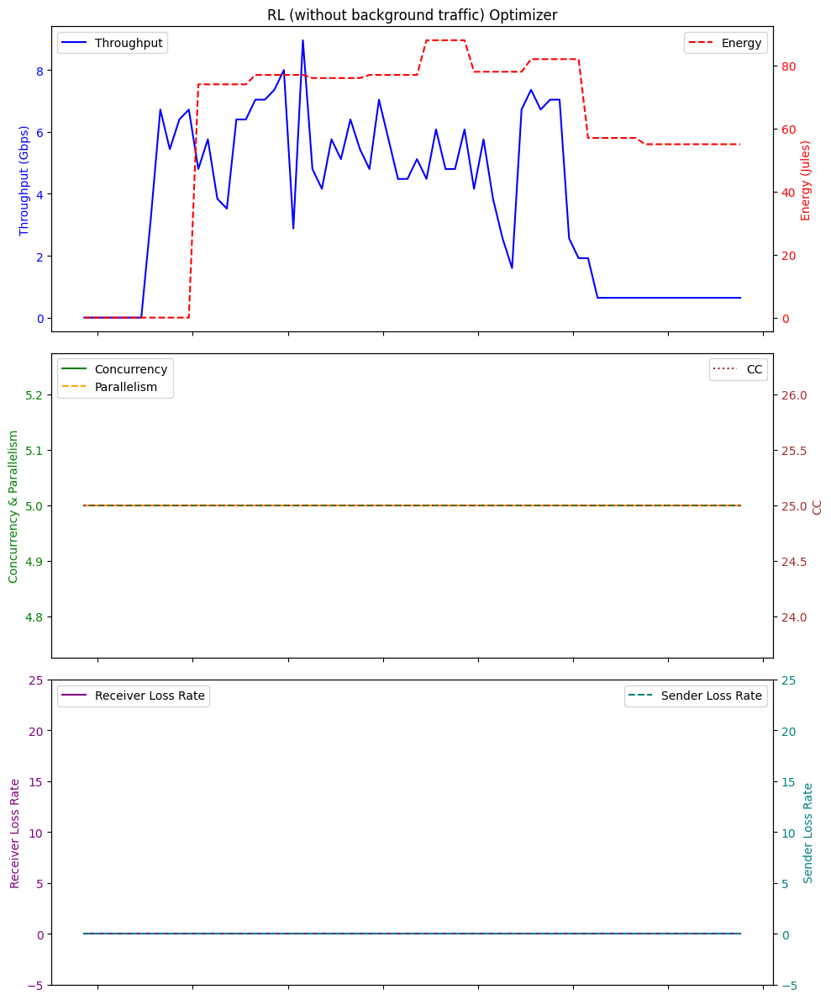

Average Throughput: 3.7074285714285704
Total Energy: 4171.0
Total loss rate: 0.0083496593214584
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-18 22:13:52.100487        0.00          0.0  25    0.0   0.0   
1  2024-01-18 22:13:53.098481        0.00          0.0  25    0.0   0.0   
2  2024-01-18 22:13:54.099082        0.00          0.0  25    0.0  32.6   
3  2024-01-18 22:13:55.097829        0.00          0.0  25    0.0  32.7   
4  2024-01-18 22:13:56.100388        0.00          0.0  25    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
65 2024-01-18 22:14:57.164411        0.32          0.0  25    0.0  32.6   
66 2024-01-18 22:14:58.164572        0.32          0.0  25    0.0  32.6   
67 2024-01-18 22:14:59.164574        0.32          0.0  25    0.0  32.7   
68 2024-01-18 22:15:00.168278        0.32          0.0  25    0.0  32.7   
69 2024-01-18 22:15:01.168688        0.32          0.0  25    0.0  32.7   

   

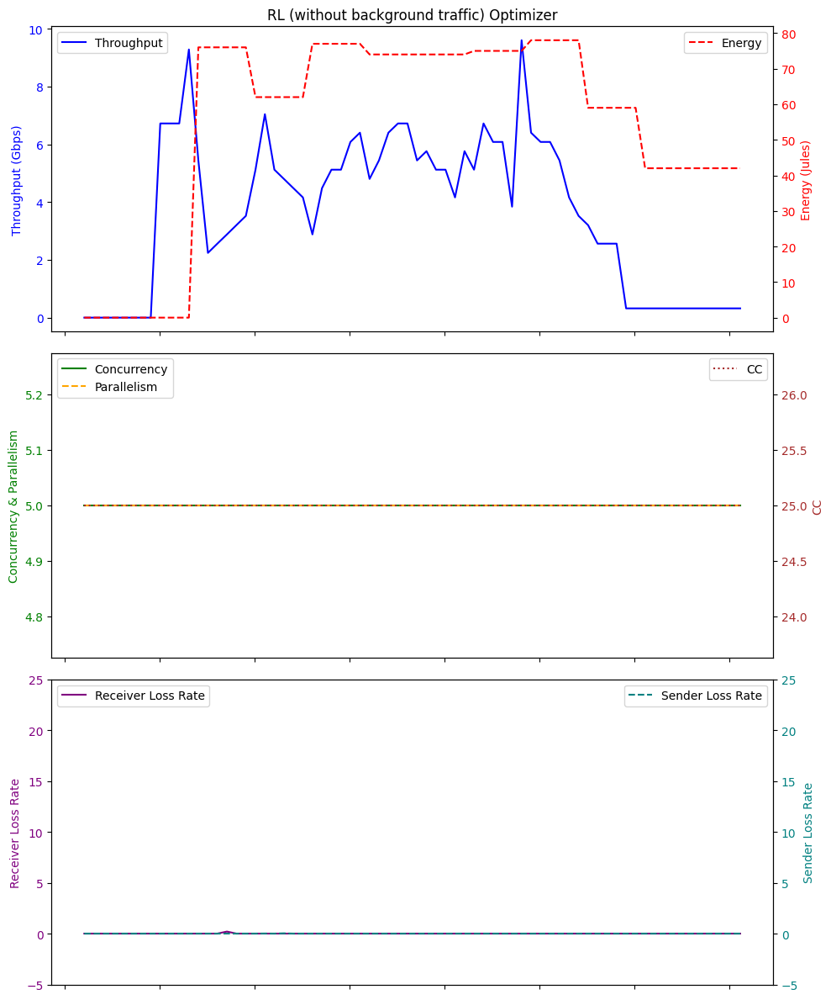

Average Throughput: 3.6525714285714277
Total Energy: 3838.0
Total loss rate: 0.03697780475432283
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-18 23:29:29.254678        0.00          0.0  25    0.0   0.0   
1  2024-01-18 23:29:30.250136        0.00          0.0  25    0.0   0.0   
2  2024-01-18 23:29:31.250250        0.00          0.0  25    0.0  32.7   
3  2024-01-18 23:29:32.253161        0.00          0.0  25    0.0  32.7   
4  2024-01-18 23:29:33.252769        0.00          0.0  25    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
75 2024-01-18 23:30:44.330067        0.32          0.0  25    0.0  32.7   
76 2024-01-18 23:30:45.331403        0.32          0.0  25    0.0  32.7   
77 2024-01-18 23:30:46.331362        0.32          0.0  25    0.0  32.6   
78 2024-01-18 23:30:47.333013        0.32          0.0  25    0.0  32.7   
79 2024-01-18 23:30:48.334836        0.32          0.0  25    0.0  32.7   

  

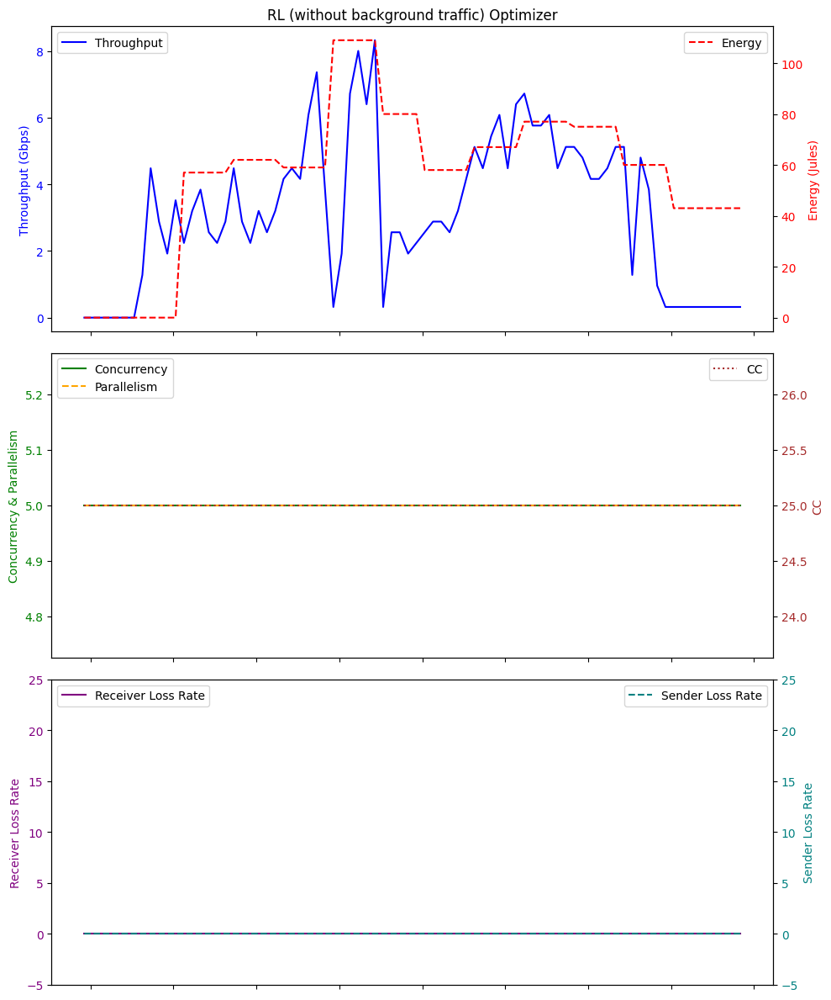

Average Throughput: 3.152
Total Energy: 4531.0
Total loss rate: 0.011311386506155815
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 00:53:22.562675        0.00          0.0   1    0.0   0.0   
1  2024-01-19 00:53:23.557711        0.00          0.0  25    0.0   0.0   
2  2024-01-19 00:53:24.560247        0.00          0.0  25    0.0  32.7   
3  2024-01-19 00:53:25.560980        0.00          0.0  25    0.0  33.8   
4  2024-01-19 00:53:26.561000        0.00          0.0  25    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
65 2024-01-19 00:54:27.625840        2.24          0.0  25    2.0  32.7   
66 2024-01-19 00:54:28.625841        2.24          0.0  25    2.0  32.7   
67 2024-01-19 00:54:29.628286        2.24          0.0  25    2.0  32.6   
68 2024-01-19 00:54:30.628320        2.24          0.0  25    2.0  32.8   
69 2024-01-19 00:54:31.629956        2.24          0.0  25    2.0  32.7   

    Energy  se

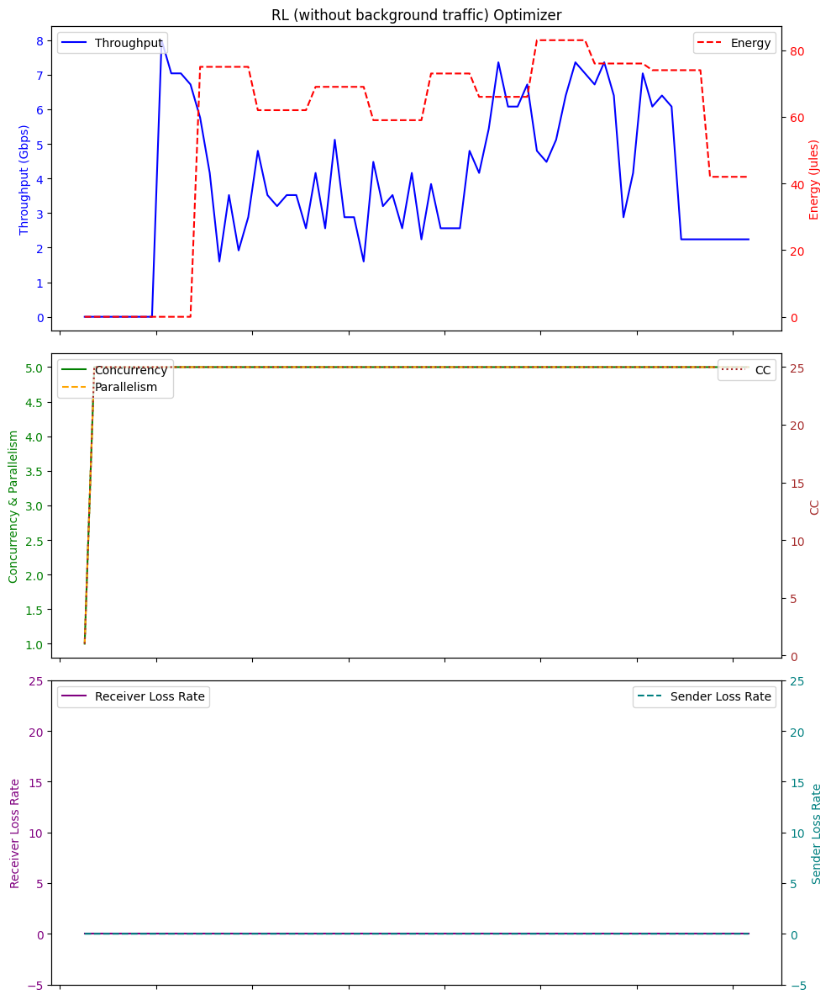

Average Throughput: 3.821714285714286
Total Energy: 3959.0
Total loss rate: 0.003438589247828725
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-18 22:32:37.621674        0.00          0.0  25    0.0   0.0   
1  2024-01-18 22:32:38.617410        0.00          0.0  25    0.0   0.0   
2  2024-01-18 22:32:39.617471        0.00          0.0  25    0.0  32.6   
3  2024-01-18 22:32:40.618925        0.00          0.0  25    0.0  32.7   
4  2024-01-18 22:32:41.619848        0.00          0.0  25    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
66 2024-01-18 22:33:43.685986        0.64          0.0  25    1.0  32.7   
67 2024-01-18 22:33:44.685038        0.64          0.0  25    1.0  32.7   
68 2024-01-18 22:33:45.685471        0.64          0.0  25    1.0  32.8   
69 2024-01-18 22:33:46.687737        0.64          0.0  25    1.0  32.6   
70 2024-01-18 22:33:47.685055        0.64          0.0  25    1.0  32.7   

  

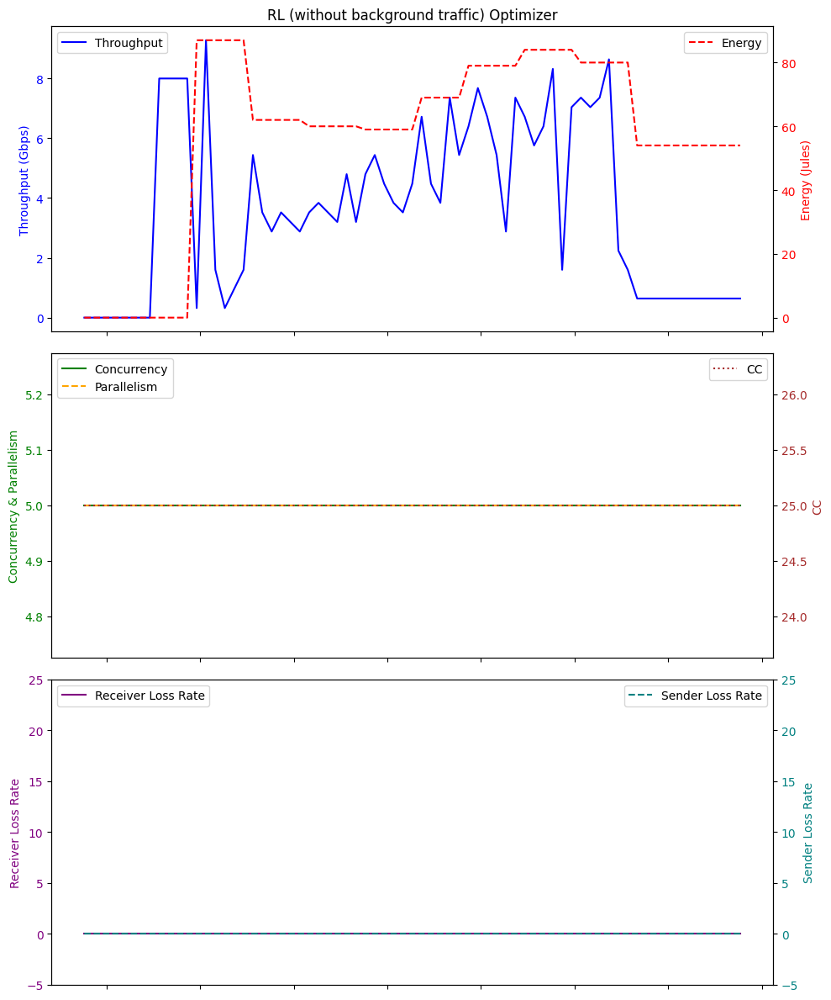

Average Throughput: 3.6371830985915485
Total Energy: 4059.0
Total loss rate: 0.0034302454012678707
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-18 23:50:51.884835        0.00          0.0  25    0.0   0.0   
1  2024-01-18 23:50:52.881516        0.00          0.0  25    0.0   0.0   
2  2024-01-18 23:50:53.883943        0.00          0.0  25    0.0  32.7   
3  2024-01-18 23:50:54.883314        0.00          0.0  25    0.0  32.7   
4  2024-01-18 23:50:55.884461        0.00          0.0  25    0.0  32.8   
..                        ...         ...          ...  ..    ...   ...   
65 2024-01-18 23:51:56.949403        0.32          0.0  25    0.0  32.7   
66 2024-01-18 23:51:57.950636        0.32          0.0  25    0.0  32.6   
67 2024-01-18 23:51:58.952696        0.32          0.0  25    0.0  32.7   
68 2024-01-18 23:51:59.952696        0.32          0.0  25    0.0  32.6   
69 2024-01-18 23:52:00.952594        0.32          0.0  25    0.0  32.8   



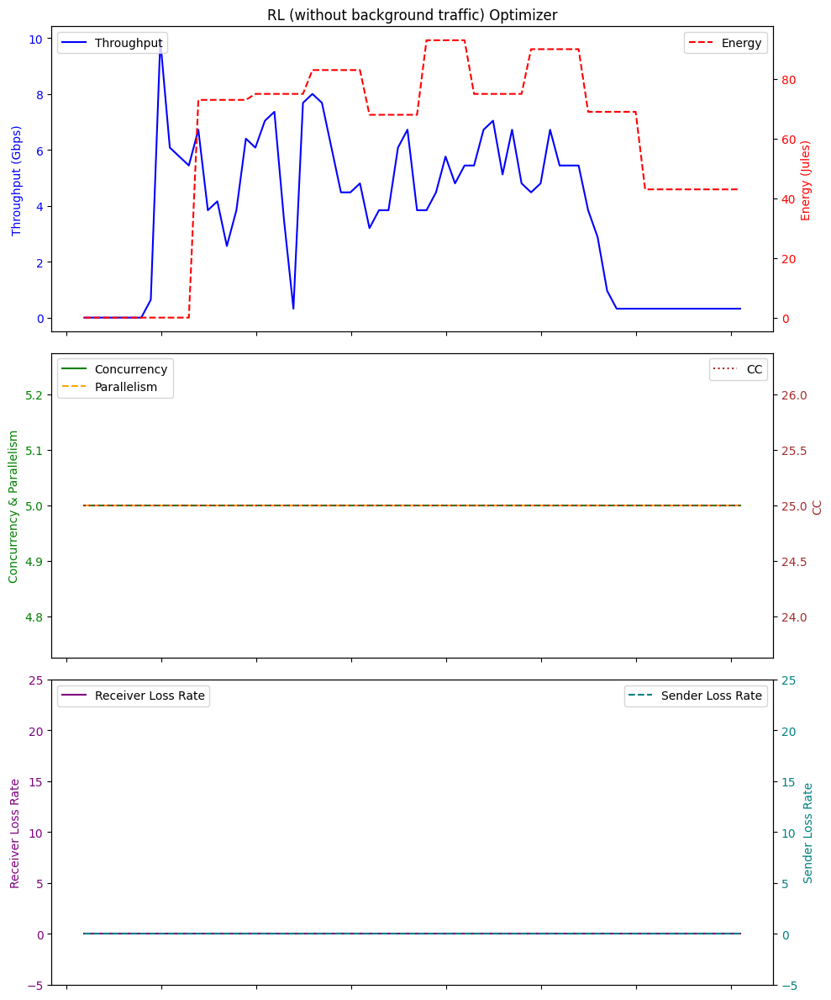

Average Throughput: 3.643428571428571
Total Energy: 4136.0
Total loss rate: 0.011796748427112438
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 00:33:40.855363        0.00          0.0  25    0.0   0.0   
1  2024-01-19 00:33:41.850603        0.00          0.0  25    0.0   0.0   
2  2024-01-19 00:33:42.851245        0.00          0.0  25    0.0  32.8   
3  2024-01-19 00:33:43.853908        0.00          0.0  25    0.0  32.6   
4  2024-01-19 00:33:44.853832        0.00          0.0  25    0.0  33.3   
..                        ...         ...          ...  ..    ...   ...   
66 2024-01-19 00:34:46.920927        0.32          0.0  25    0.0  32.6   
67 2024-01-19 00:34:47.920119        0.32          0.0  25    0.0  32.7   
68 2024-01-19 00:34:48.921289        0.32          0.0  25    0.0  32.7   
69 2024-01-19 00:34:49.923152        0.32          0.0  25    0.0  32.7   
70 2024-01-19 00:34:50.923686        0.32          0.0  25    0.0  33.0   

  

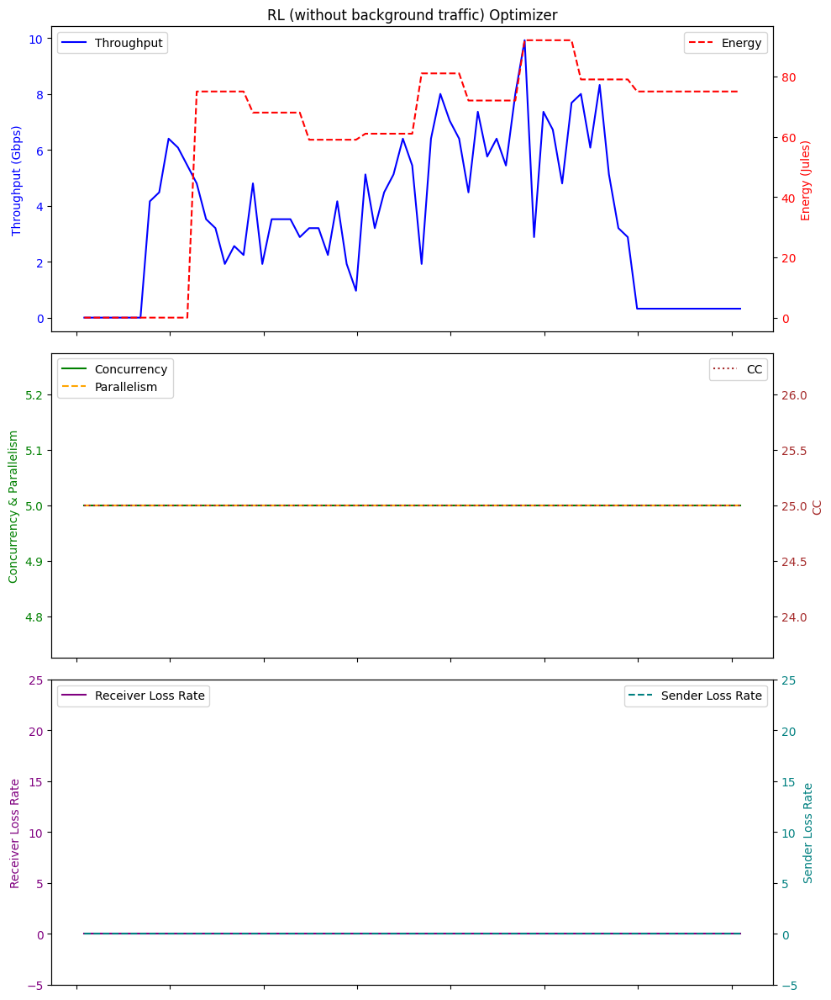

Average Throughput: 3.5830985915492954
Total Energy: 4341.0
Total loss rate: 0.0048421462914397095
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 03:26:08.837315         0.0          0.0  25    0.0   0.0   
1  2024-01-19 03:26:09.833777         0.0          0.0  25    0.0   0.0   
2  2024-01-19 03:26:10.833318         0.0          0.0  25    0.0  32.7   
3  2024-01-19 03:26:11.836896         0.0          0.0  25    0.0  32.7   
4  2024-01-19 03:26:12.837374         0.0          0.0  25    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
65 2024-01-19 03:27:13.899568         4.8          0.0  25    4.0  32.6   
66 2024-01-19 03:27:14.901091         4.8          0.0  25    4.0  32.6   
67 2024-01-19 03:27:15.903122         4.8          0.0  25    4.0  32.7   
68 2024-01-19 03:27:16.902873         4.8          0.0  25    4.0  32.6   
69 2024-01-19 03:27:17.905818         4.8          0.0  25    4.0  32.8   



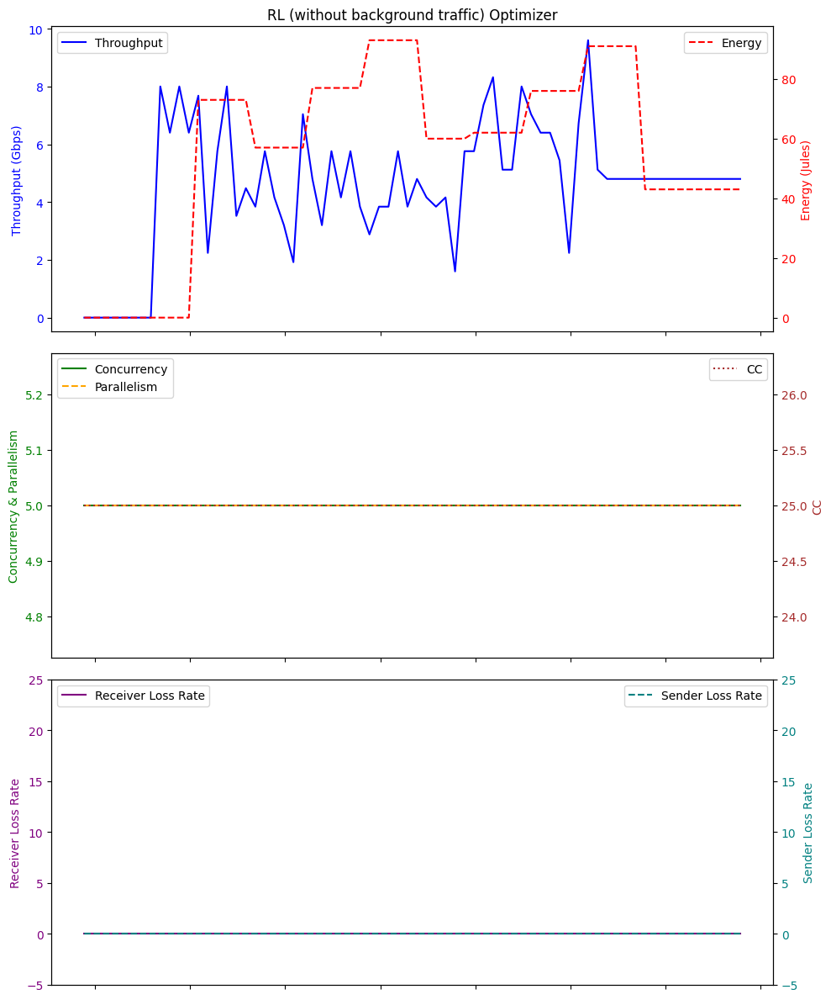

Average Throughput: 4.557714285714287
Total Energy: 3947.0
Total loss rate: 0.008874161724658821
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 02:30:13.208575         0.0          0.0  25    0.0   0.0   
1  2024-01-19 02:30:14.206590         0.0          0.0  25    0.0   0.0   
2  2024-01-19 02:30:15.206349         0.0          0.0  25    0.0  32.6   
3  2024-01-19 02:30:16.206740         0.0          0.0  25    0.0  32.6   
4  2024-01-19 02:30:17.209238         0.0          0.0  25    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
85 2024-01-19 02:31:38.295408         1.6          0.0  25    1.0  32.9   
86 2024-01-19 02:31:39.296358         1.6          0.0  25    1.0  32.8   
87 2024-01-19 02:31:40.297080         1.6          0.0  25    1.0  32.7   
88 2024-01-19 02:31:41.298937         1.6          0.0  25    1.0  32.8   
89 2024-01-19 02:31:42.298373         1.6          0.0  25    1.0  32.6   

  

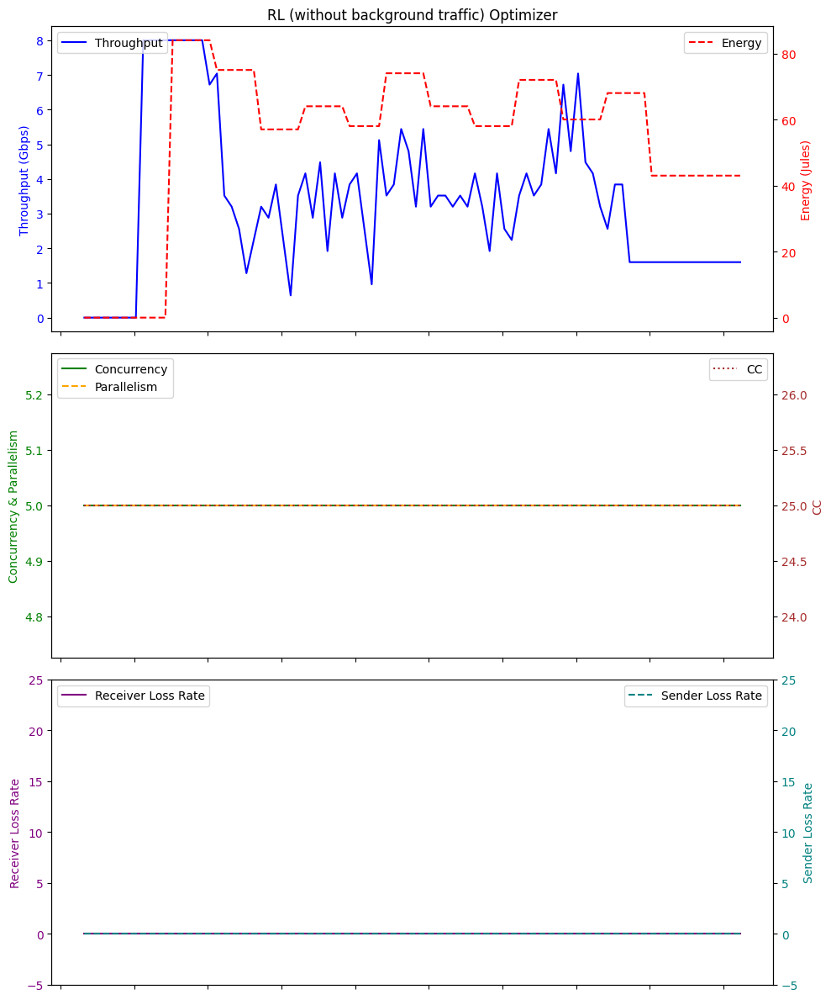

Average Throughput: 3.4168888888888898
Total Energy: 4905.0
Total loss rate: 0.020024805947238197
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 04:02:11.114108        0.00          0.0  25    0.0   0.0   
1  2024-01-19 04:02:12.109346        0.00          0.0  25    0.0   0.0   
2  2024-01-19 04:02:13.110322        0.00          0.0  25    0.0  32.7   
3  2024-01-19 04:02:14.112361        0.00          0.0  25    0.0  32.8   
4  2024-01-19 04:02:15.114263        0.00          0.0  25    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
66 2024-01-19 04:03:17.177947        3.52          0.0  25    3.0  32.6   
67 2024-01-19 04:03:18.175765        3.52          0.0  25    3.0  32.6   
68 2024-01-19 04:03:19.179133        3.52          0.0  25    3.0  32.7   
69 2024-01-19 04:03:20.179869        3.52          0.0  25    3.0  32.7   
70 2024-01-19 04:03:21.179952        3.52          0.0  25    3.0  32.8   

 

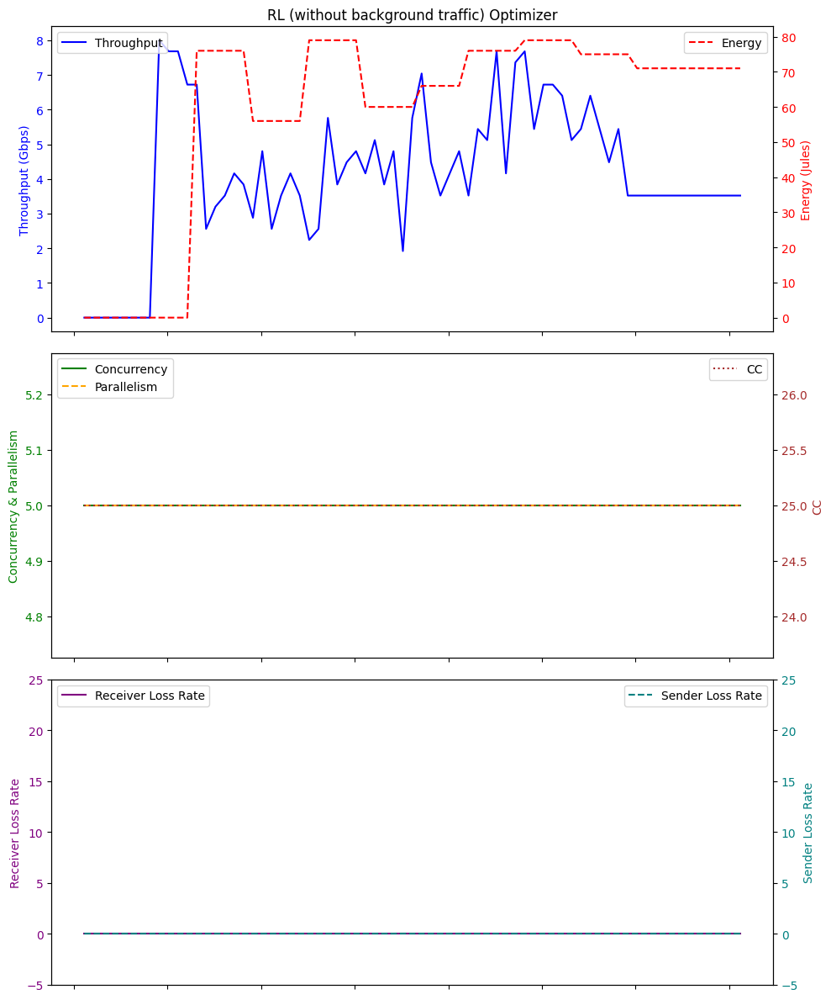

Average Throughput: 4.128450704225351
Total Energy: 4188.0
Total loss rate: 0.011801534026335419
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 22:50:20.256235        0.00          0.0  25    0.0   0.0   
1   2024-01-18 22:50:21.254069        0.00          0.0  25    0.0   0.0   
2   2024-01-18 22:50:22.255357        0.00          0.0  25    0.0  32.6   
3   2024-01-18 22:50:23.257167        0.00          0.0  25    0.0  32.6   
4   2024-01-18 22:50:24.258453        0.00          0.0  25    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
125 2024-01-18 22:52:25.383059        0.96          0.0  25    1.0  32.6   
126 2024-01-18 22:52:26.387062        0.96          0.0  25    1.0  32.6   
127 2024-01-18 22:52:27.385824        0.96          0.0  25    1.0  32.6   
128 2024-01-18 22:52:28.386868        0.96          0.0  25    1.0  41.1   
129 2024-01-18 22:52:29.388990        0.96          0.0  25    1.0 

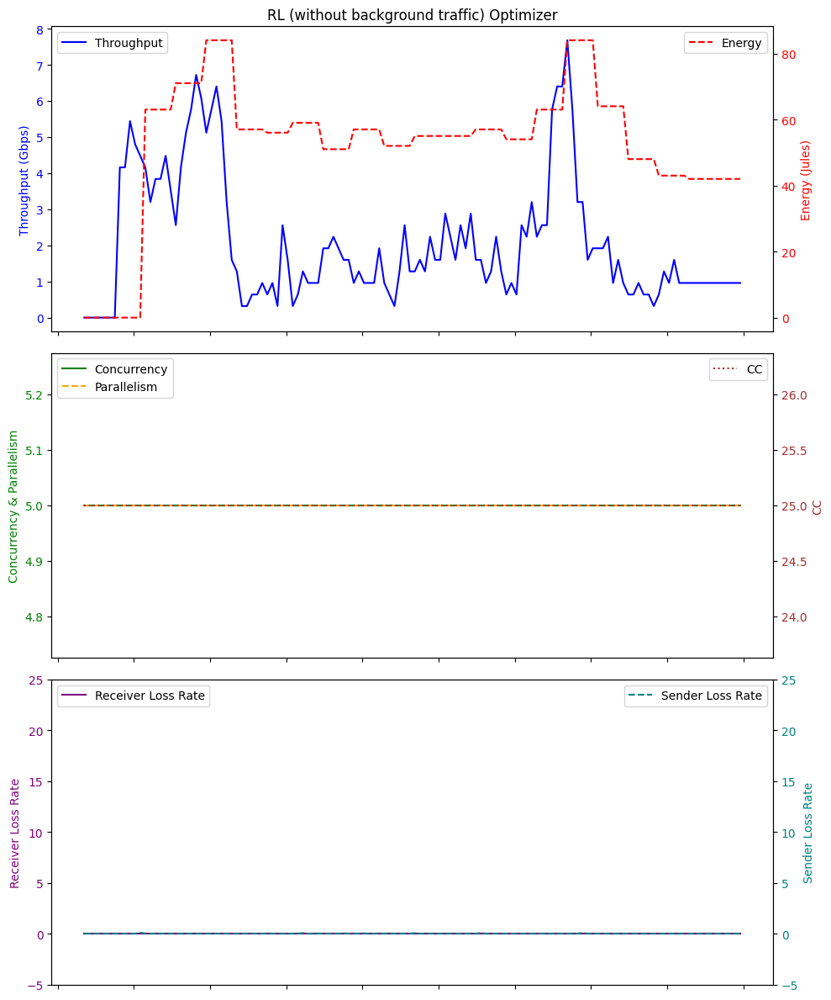

Average Throughput: 2.0553846153846154
Total Energy: 6844.0
Total loss rate: 0.5005470845411932
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 04:17:12.658915         0.0          0.0  25    0.0   0.0   
1  2024-01-19 04:17:13.653428         0.0          0.0  25    0.0   0.0   
2  2024-01-19 04:17:14.652434         0.0          0.0  25    0.0  32.7   
3  2024-01-19 04:17:15.653002         0.0          0.0  25    0.0  32.7   
4  2024-01-19 04:17:16.652533         0.0          0.0  25    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
65 2024-01-19 04:18:17.717036         6.4          0.0  25    6.0  32.6   
66 2024-01-19 04:18:18.719948         6.4          0.0  25    6.0  32.6   
67 2024-01-19 04:18:19.720096         6.4          0.0  25    6.0  32.6   
68 2024-01-19 04:18:20.720423         6.4          0.0  25    6.0  32.6   
69 2024-01-19 04:18:21.723155         6.4          0.0  25    6.0  32.6   

   

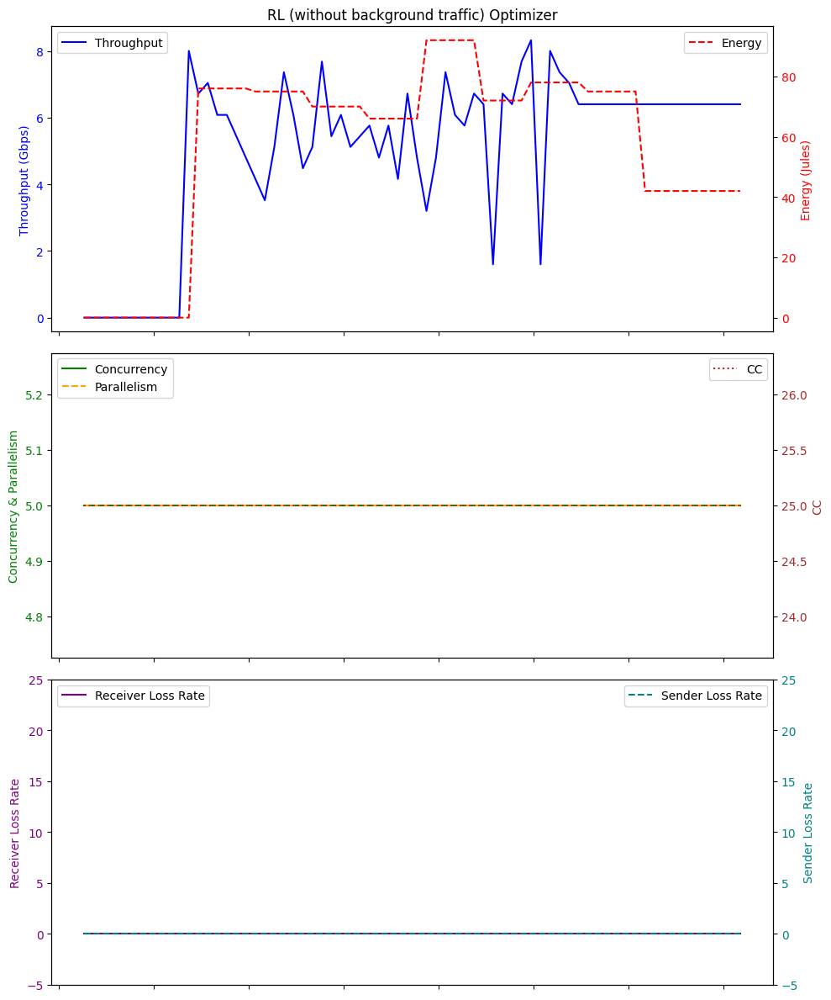

Average Throughput: 5.028571428571426
Total Energy: 4014.0
Total loss rate: 0.00736400892719372
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 03:46:13.240808        0.00          0.0  25    0.0   0.0   
1  2024-01-19 03:46:14.237247        0.00          0.0  25    0.0   0.0   
2  2024-01-19 03:46:15.238478        0.00          0.0  25    0.0  32.7   
3  2024-01-19 03:46:16.238989        0.00          0.0  25    0.0  32.7   
4  2024-01-19 03:46:17.240017        0.00          0.0  25    0.0  32.8   
..                        ...         ...          ...  ..    ...   ...   
65 2024-01-19 03:47:18.305186        0.32          0.0  25    0.0  32.7   
66 2024-01-19 03:47:19.304761        0.32          0.0  25    0.0  32.8   
67 2024-01-19 03:47:20.304867        0.32          0.0  25    0.0  32.7   
68 2024-01-19 03:47:21.306390        0.32          0.0  25    0.0  32.7   
69 2024-01-19 03:47:22.308390        0.32          0.0  25    0.0  32.8   

   

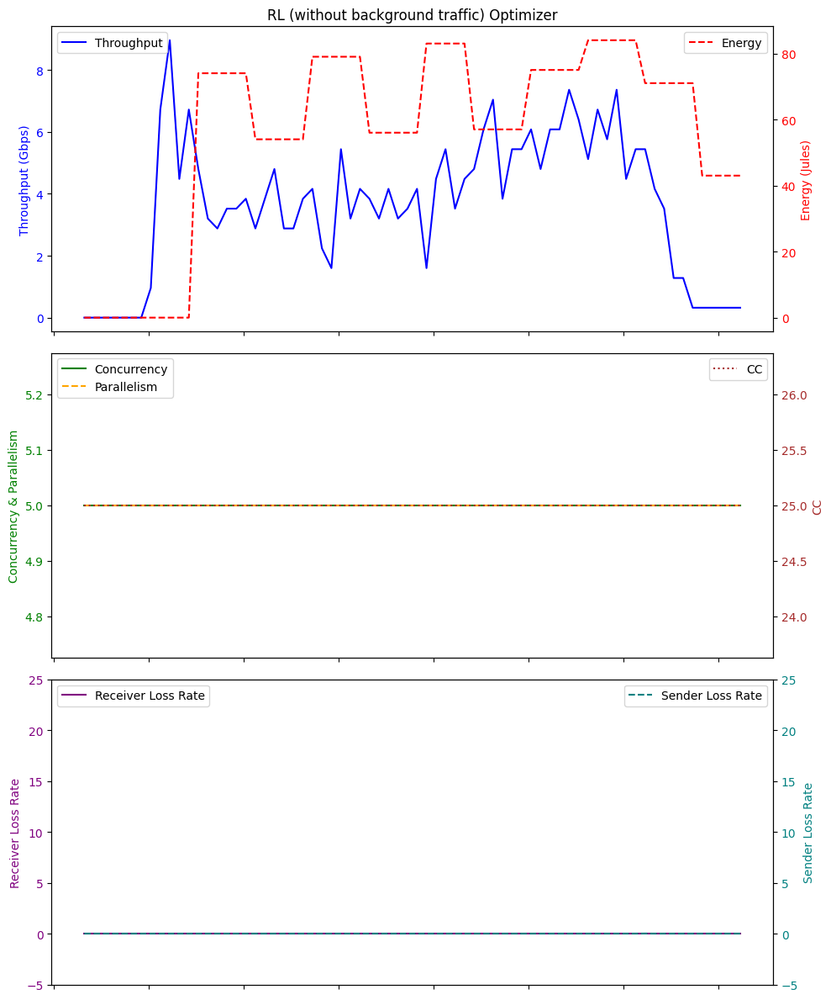

Average Throughput: 3.643428571428571
Total Energy: 3930.0
Total loss rate: 0.00870360348751514
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 01:45:52.654359        0.00          0.0  25    0.0   0.0   
1  2024-01-19 01:45:53.646695        0.00          0.0  25    0.0   0.0   
2  2024-01-19 01:45:54.649030        0.00          0.0  25    0.0  32.7   
3  2024-01-19 01:45:55.649866        0.00          0.0  25    0.0  32.6   
4  2024-01-19 01:45:56.651766        0.00          0.0  25    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
65 2024-01-19 01:46:57.714901        0.64          0.0  25    1.0  32.6   
66 2024-01-19 01:46:58.716663        0.64          0.0  25    1.0  32.7   
67 2024-01-19 01:46:59.718376        0.64          0.0  25    1.0  32.7   
68 2024-01-19 01:47:00.717865        0.64          0.0  25    1.0  32.6   
69 2024-01-19 01:47:01.718921        0.64          0.0  25    1.0  32.7   

   

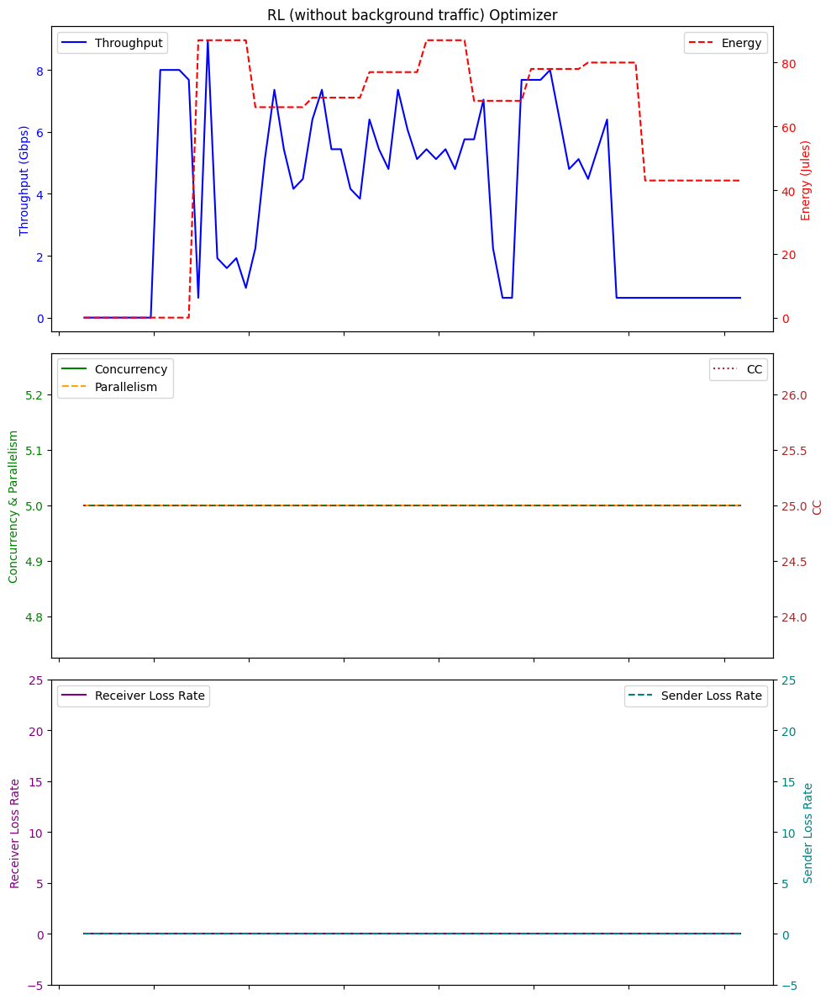

Average Throughput: 3.711999999999999
Total Energy: 4058.0
Total loss rate: 0.004052889415161426


In [5]:
# Example usage RL
directory = './logFileDir/ppo/'
dfs = process_log_files(directory,"ppo_logFile_")

ppo_throughput_list=[]
ppo_energy_list=[]
ppo_plr_list=[]
# Print or process the dataframes as needed
for df in dfs:
    print(df)
    # Plotting
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)


    # Top plot with Throughput and Energy
    ax1.plot(df['Time'], df['Throughput'], label='Throughput', color='blue')
    ax1.set_ylabel('Throughput (Gbps)', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_title('RL (without background traffic) Optimizer')

    ax2_twin = ax1.twinx()
    ax2_twin.plot(df['Time'], df['Energy'], label='Energy', color='red', linestyle='--')
    ax2_twin.set_ylabel('Energy (Jules)', color='red')
    ax2_twin.tick_params(axis='y', labelcolor='red')

    # Bottom plot with Concurrency, Parallelism, and CC
    ax2.plot(df['Time'], df['concurrency'], label='Concurrency', color='green')
    ax2.plot(df['Time'], df['parallelism'], label='Parallelism', color='orange', linestyle='--')
    ax2.set_ylabel('Concurrency & Parallelism', color='green')
    ax2.tick_params(axis='y', labelcolor='green')

    ax3_twin = ax2.twinx()
    ax3_twin.plot(df['Time'], df['CC'], label='CC', color='brown', linestyle=':')
    ax3_twin.set_ylabel('CC', color='brown')
    ax3_twin.tick_params(axis='y', labelcolor='brown')
    
    # Bottom plot with Receiver Loss Rate and Sender Loss Rate
    ax3.plot(df['Time'], df['receiver_lr'], label='Receiver Loss Rate', color='purple', linestyle='-')
    ax3.set_ylabel('Receiver Loss Rate', color='purple')
    ax3.tick_params(axis='y', labelcolor='purple')

    ax4_twin = ax3.twinx()
    ax4_twin.plot(df['Time'], df['sender_lr'], label='Sender Loss Rate', color='teal', linestyle='--')
    ax4_twin.set_ylabel('Sender Loss Rate', color='teal')
    ax4_twin.tick_params(axis='y', labelcolor='teal')
    ax4_twin.set_ylim(-5,25)

    ax3.set_ylim(-5,25)

    # Formatting the x-axis to show time correctly
#     ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: (datetime.min + timedelta(seconds=x)).strftime('%H:%M:%S')))
#     ax2.set_xticklabels([])
    ax1.set_xticklabels([])
    ax2.set_xticklabels([])
    # Fix for overlapping layouts
    fig.tight_layout()

    # Legend
    ax1.legend(loc='upper left')
    ax2_twin.legend(loc='upper right')
    ax2.legend(loc='upper left')
    ax3_twin.legend(loc='upper right')
    ax3.legend(loc='upper left')
    ax4_twin.legend(loc='upper right')
    plt.show()

    average_throughput = df['Throughput'].mean()
    print("Average Throughput:", average_throughput)
    total_energy = df['Energy'].sum()
    print("Total Energy:", total_energy)
    total_plr = df['sender_lr'].sum()
    print("Total loss rate:", total_plr)
    
    ppo_throughput_list.append(average_throughput)
    ppo_energy_list.append(total_energy)
    ppo_plr_list.append(total_plr)


                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 22:52:32.531425        0.00          0.0   1    0.0   0.0   
1   2024-01-18 22:52:33.526866        0.00          0.0  64    0.0   0.0   
2   2024-01-18 22:52:34.527369        0.00          0.0  64    0.0  33.7   
3   2024-01-18 22:52:35.529155        0.00          0.0  64    0.0  32.7   
4   2024-01-18 22:52:36.528727        0.00          0.0  64    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
125 2024-01-18 22:54:37.661350        0.32          0.0  25    0.0  32.7   
126 2024-01-18 22:54:38.661090        0.32          0.0  25    0.0  34.4   
127 2024-01-18 22:54:39.661049        0.32          0.0  25    0.0  32.6   
128 2024-01-18 22:54:40.663996        0.32          0.0  25    0.0  32.7   
129 2024-01-18 22:54:41.663996        0.32          0.0  25    0.0  32.6   

     Energy  sender_lr  concurrency  parallelism  
0       0.0        0.0            1 

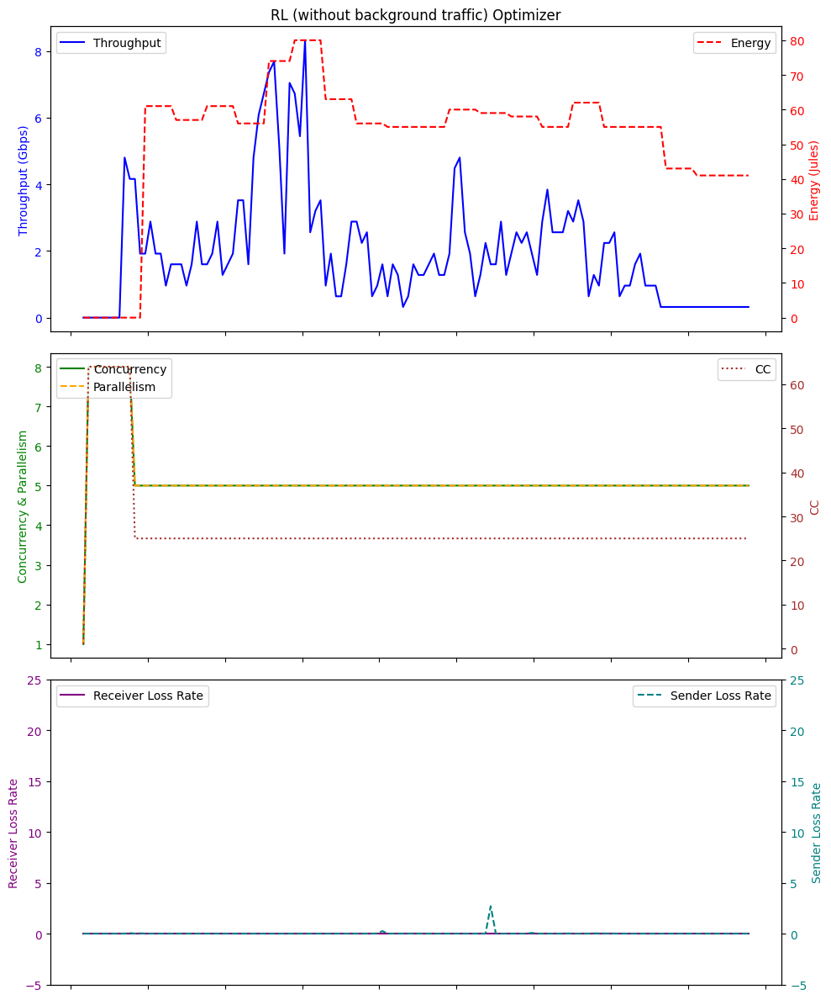

Average Throughput: 1.9864615384615385
Total Energy: 6767.0
Total loss rate: 3.209677674067717
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 04:18:24.917207        0.00          0.0   1    0.0   0.0   
1  2024-01-19 04:18:25.915588        0.00          0.0  64    0.0   0.0   
2  2024-01-19 04:18:26.916674        0.00          0.0  64    0.0  32.7   
3  2024-01-19 04:18:27.918131        0.00          0.0  64    0.0  33.0   
4  2024-01-19 04:18:28.918970        0.00          0.0  64    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
66 2024-01-19 04:19:30.981885        0.32          0.0  25    0.0  32.7   
67 2024-01-19 04:19:31.981888        0.32          0.0  25    0.0  32.6   
68 2024-01-19 04:19:32.985281        0.32          0.0  25    0.0  32.7   
69 2024-01-19 04:19:33.985162        0.32          0.0  25    0.0  32.6   
70 2024-01-19 04:19:34.985016        0.32          0.0  25    0.0  32.7   

    

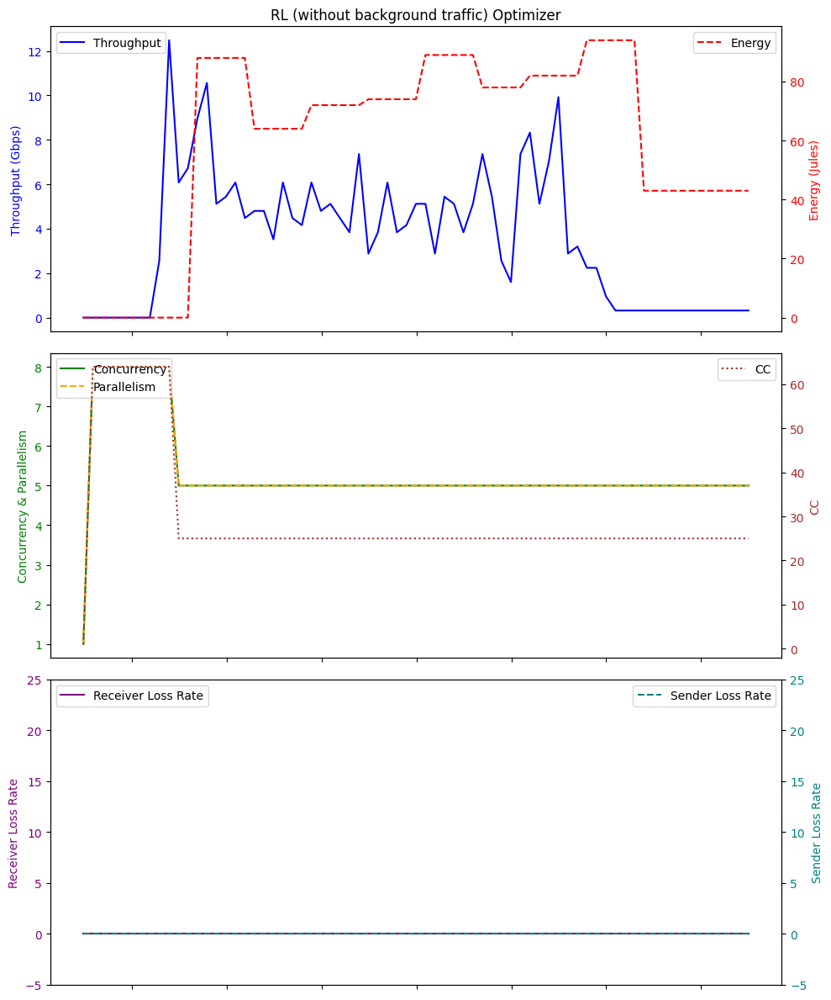

Average Throughput: 3.5560563380281685
Total Energy: 4284.0
Total loss rate: 0.008198257393164467
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 02:49:05.088219        0.00          0.0   1    0.0   0.0   
1  2024-01-19 02:49:06.086870        0.00          0.0  64    0.0   0.0   
2  2024-01-19 02:49:07.090373        0.00          0.0  64    0.0  32.7   
3  2024-01-19 02:49:08.090009        0.00          0.0  64    0.0  33.7   
4  2024-01-19 02:49:09.095383        0.00          0.0  64    0.0  33.4   
..                        ...         ...          ...  ..    ...   ...   
76 2024-01-19 02:50:21.168938        0.32          0.0  25    0.0  32.7   
77 2024-01-19 02:50:22.168763        0.32          0.0  25    0.0  32.7   
78 2024-01-19 02:50:23.169133        0.32          0.0  25    0.0  32.7   
79 2024-01-19 02:50:24.170131        0.32          0.0  25    0.0  32.6   
80 2024-01-19 02:50:25.167872        0.32          0.0  25    0.0  32.6   

 

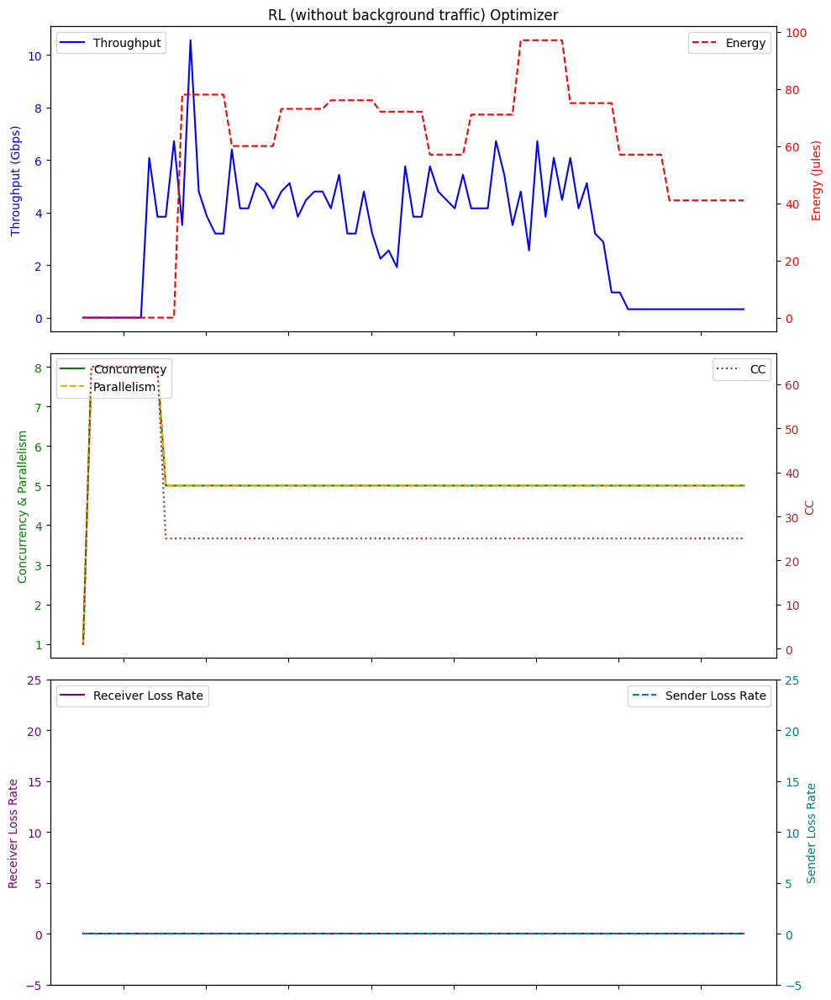

Average Throughput: 3.2079012345679008
Total Energy: 4649.0
Total loss rate: 0.006790532654434267
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-18 23:12:30.905798        0.00          0.0   1    0.0   0.0   
1  2024-01-18 23:12:31.903344        0.00          0.0  64    0.0   0.0   
2  2024-01-18 23:12:32.902981        0.00          0.0  64    0.0  32.7   
3  2024-01-18 23:12:33.902590        0.00          0.0  64    0.0  32.6   
4  2024-01-18 23:12:34.905304        0.00          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
95 2024-01-18 23:14:06.000559        1.92          0.0  25    2.0  32.7   
96 2024-01-18 23:14:07.002636        1.92          0.0  25    2.0  32.7   
97 2024-01-18 23:14:08.002514        1.92          0.0  25    2.0  33.1   
98 2024-01-18 23:14:09.005990        1.92          0.0  25    2.0  34.4   
99 2024-01-18 23:14:10.005620        1.92          0.0  25    2.0  32.9   

 

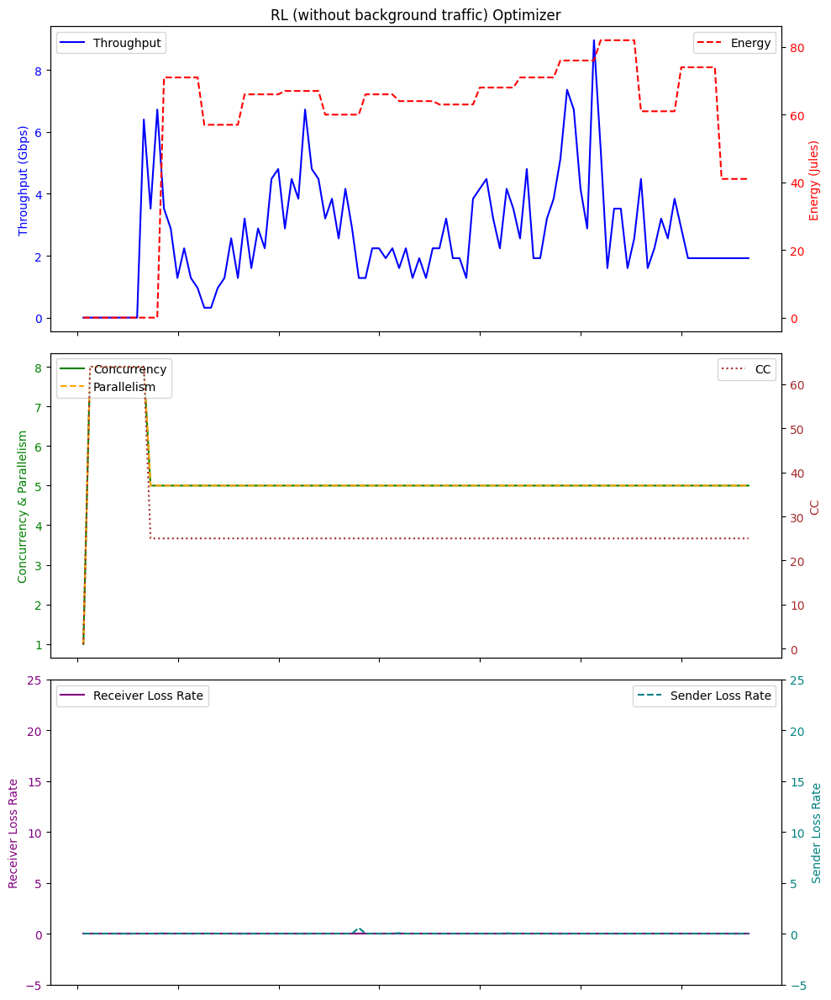

Average Throughput: 2.681600000000001
Total Energy: 5815.0
Total loss rate: 0.7398053694264033
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 00:54:38.838001        0.00          0.0   1    0.0   0.0   
1  2024-01-19 00:54:39.845584        0.00          0.0  64    0.0   0.0   
2  2024-01-19 00:54:40.845089        0.00          0.0  64    0.0  32.7   
3  2024-01-19 00:54:41.846851        0.00          0.0  64    0.0  32.6   
4  2024-01-19 00:54:42.846077        0.00          0.0  64    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
66 2024-01-19 00:55:44.909602        0.64          0.0  25    1.0  32.6   
67 2024-01-19 00:55:45.908676        0.64          0.0  25    1.0  32.6   
68 2024-01-19 00:55:46.909207        0.64          0.0  25    1.0  32.7   
69 2024-01-19 00:55:47.911116        0.64          0.0  25    1.0  32.7   
70 2024-01-19 00:55:48.911431        0.64          0.0  25    1.0  32.7   

    

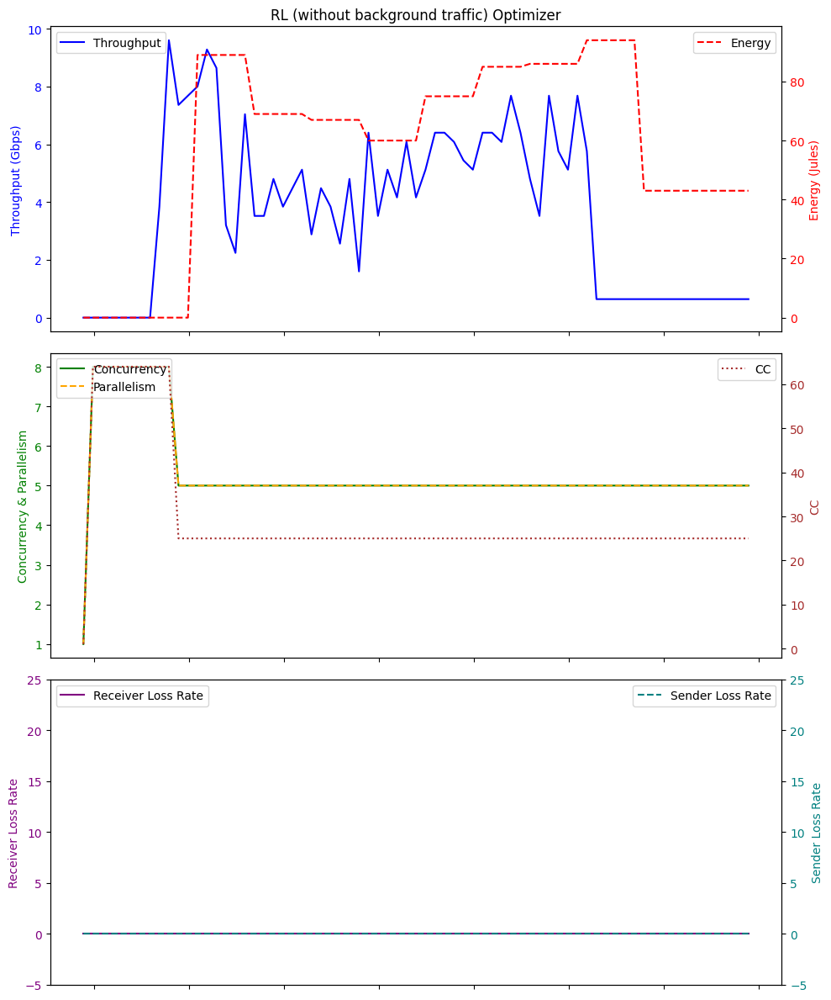

Average Throughput: 3.668732394366196
Total Energy: 4181.0
Total loss rate: 0.005632301076122271
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 00:15:18.732681         0.0          0.0   1    0.0   0.0   
1  2024-01-19 00:15:19.731846         0.0          0.0  64    0.0   0.0   
2  2024-01-19 00:15:20.731114         0.0          0.0  64    0.0  32.7   
3  2024-01-19 00:15:21.730986         0.0          0.0  64    0.0  32.7   
4  2024-01-19 00:15:22.734540         0.0          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
66 2024-01-19 00:16:24.795037         3.2          0.0  25    3.0  32.6   
67 2024-01-19 00:16:25.796987         3.2          0.0  25    3.0  32.6   
68 2024-01-19 00:16:26.789037         3.2          0.0  25    3.0  32.7   
69 2024-01-19 00:16:27.797272         3.2          0.0  25    3.0  32.7   
70 2024-01-19 00:16:28.791630         3.2          0.0  25    3.0  33.1   

  

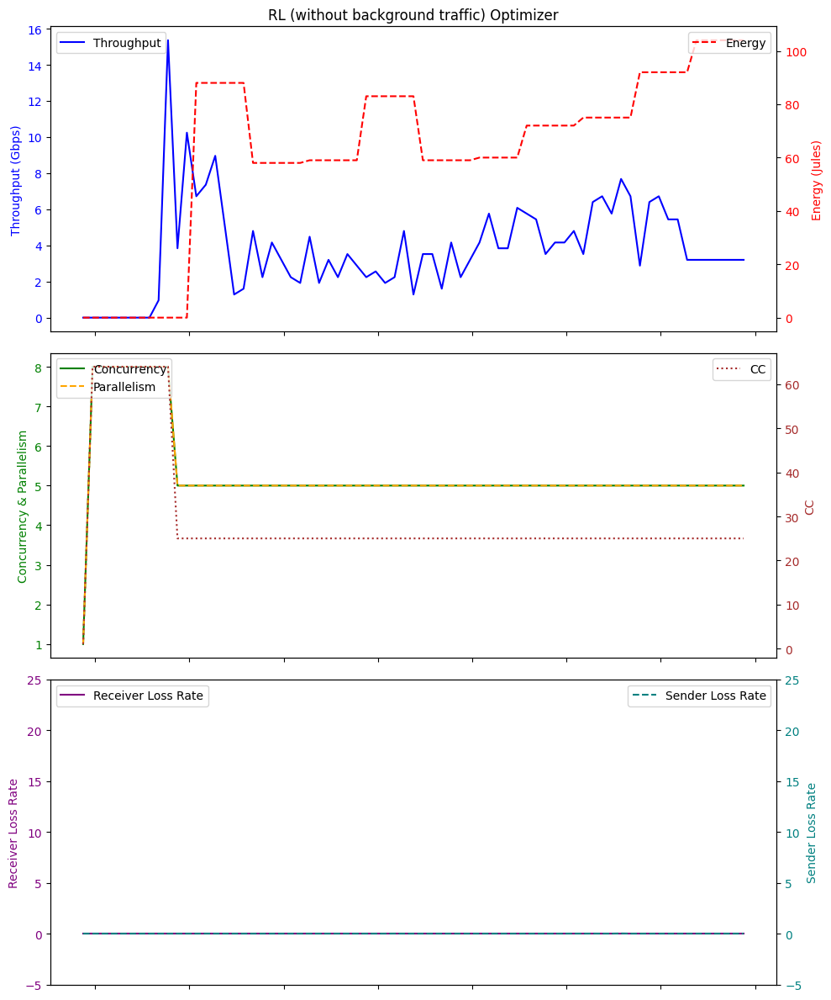

Average Throughput: 3.790422535211266
Total Energy: 4440.0
Total loss rate: 0.02670007528127036
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 02:31:45.486490        0.00          0.0   1    0.0   0.0   
1  2024-01-19 02:31:46.486491        0.00          0.0  64    0.0   0.0   
2  2024-01-19 02:31:47.485812        0.00          0.0  64    0.0  33.4   
3  2024-01-19 02:31:48.485675        0.00          0.0  64    0.0  33.3   
4  2024-01-19 02:31:49.486624        0.00          0.0  64    0.0  32.9   
..                        ...         ...          ...  ..    ...   ...   
85 2024-01-19 02:33:10.567641        0.32          0.0  25    0.0  32.8   
86 2024-01-19 02:33:11.570831        0.32          0.0  25    0.0  32.8   
87 2024-01-19 02:33:12.570848        0.32          0.0  25    0.0  32.8   
88 2024-01-19 02:33:13.570578        0.32          0.0  25    0.0  32.7   
89 2024-01-19 02:33:14.573933        0.32          0.0  25    0.0  32.6   

   

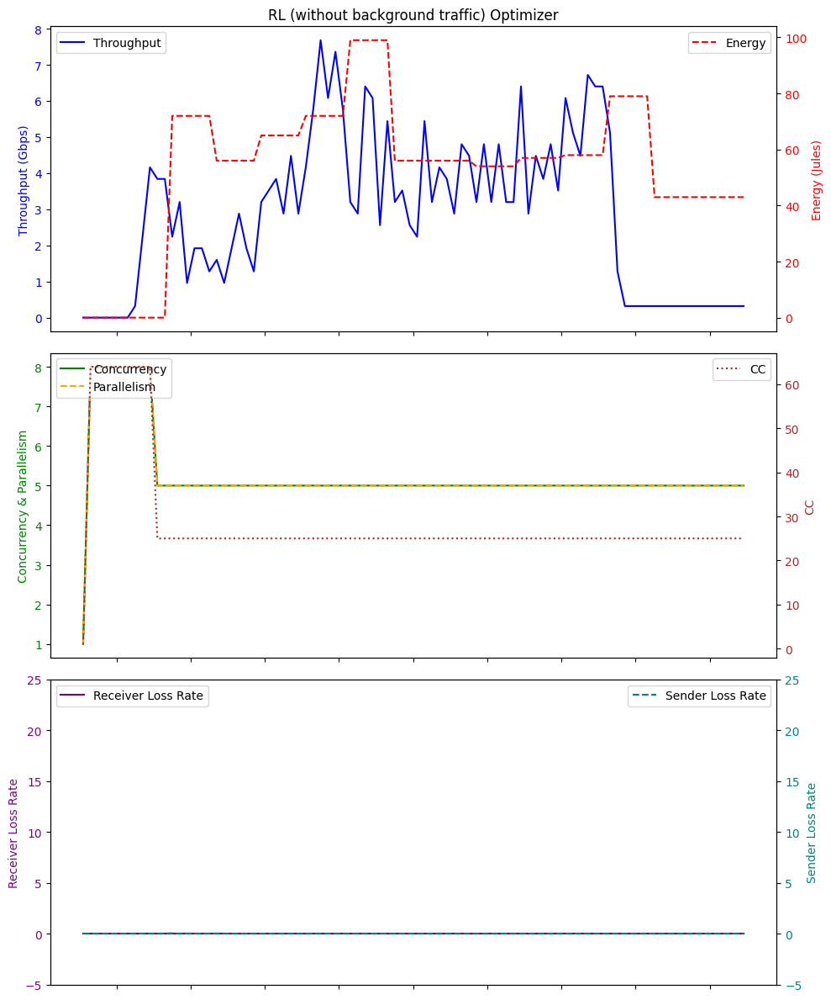

Average Throughput: 2.848
Total Energy: 4847.0
Total loss rate: 0.0790308541927708
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 03:47:30.177918        0.00          0.0   1    0.0   0.0   
1  2024-01-19 03:47:31.175797        0.00          0.0  64    0.0   0.0   
2  2024-01-19 03:47:32.176421        0.00          0.0  64    0.0  32.6   
3  2024-01-19 03:47:33.176348        0.00          0.0  64    0.0  32.7   
4  2024-01-19 03:47:34.177891        0.00          0.0  64    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
56 2024-01-19 03:48:26.219410        2.24          0.0  25    2.0  32.6   
57 2024-01-19 03:48:27.232280        2.24          0.0  25    2.0  32.6   
58 2024-01-19 03:48:28.233901        2.24          0.0  25    2.0  32.7   
59 2024-01-19 03:48:29.234202        2.24          0.0  25    2.0  32.7   
60 2024-01-19 03:48:30.233173        2.24          0.0  25    2.0  32.6   

    Energy  send

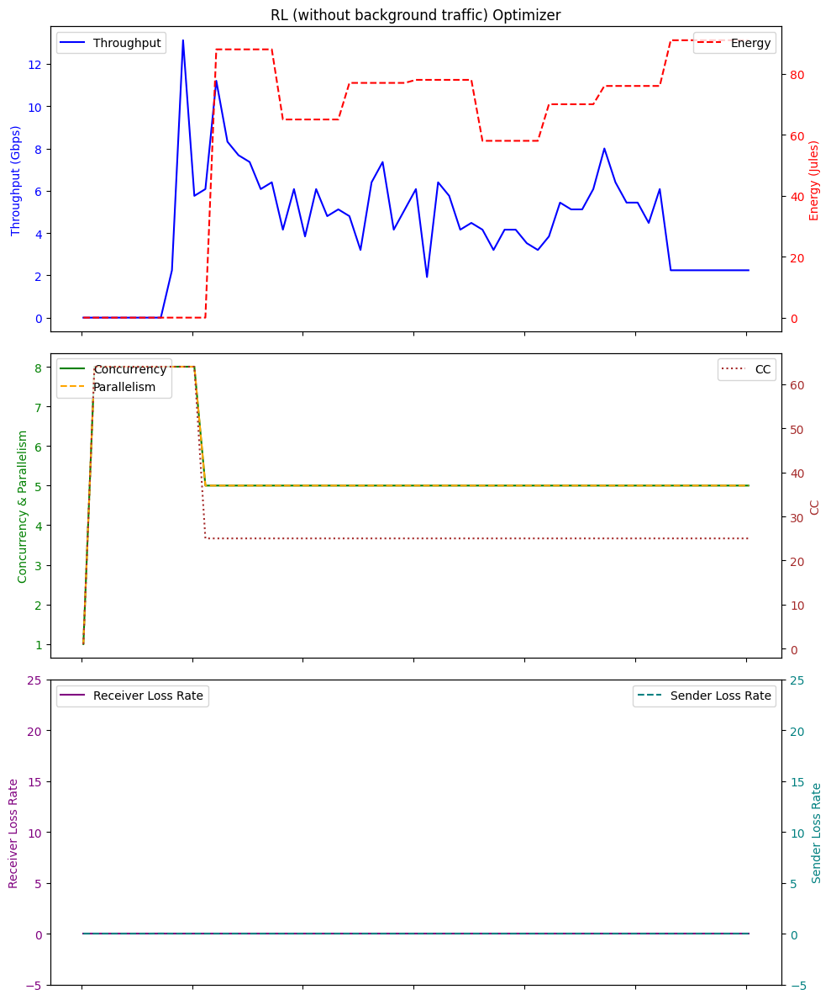

Average Throughput: 4.3593442622950835
Total Energy: 3730.0
Total loss rate: 0.013906904245263838
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 00:34:53.116988        0.00          0.0   1    0.0   0.0   
1  2024-01-19 00:34:54.124645        0.00          0.0  64    0.0   0.0   
2  2024-01-19 00:34:55.124066        0.00          0.0  64    0.0  32.8   
3  2024-01-19 00:34:56.124477        0.00          0.0  64    0.0  32.8   
4  2024-01-19 00:34:57.126394        0.00          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
75 2024-01-19 00:36:08.198145        0.32          0.0  25    0.0  32.6   
76 2024-01-19 00:36:09.200393        0.32          0.0  25    0.0  32.6   
77 2024-01-19 00:36:10.200966        0.32          0.0  25    0.0  32.6   
78 2024-01-19 00:36:11.201127        0.32          0.0  25    0.0  32.6   
79 2024-01-19 00:36:12.203836        0.32          0.0  25    0.0  32.7   

 

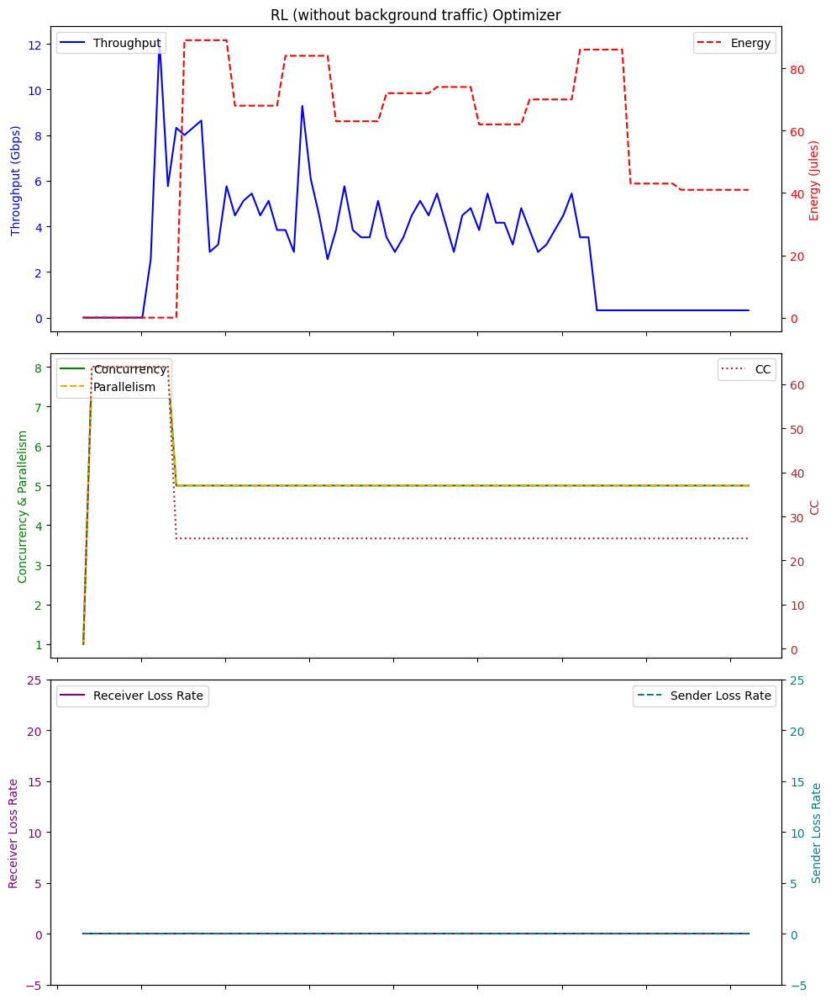

Average Throughput: 3.2120000000000006
Total Energy: 4561.0
Total loss rate: 0.056391987721070395
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 04:03:23.383995        0.00          0.0   1    0.0   0.0   
1  2024-01-19 04:03:24.383654        0.00          0.0  64    0.0   0.0   
2  2024-01-19 04:03:25.383556        0.00          0.0  64    0.0  32.6   
3  2024-01-19 04:03:26.382863        0.00          0.0  64    0.0  32.7   
4  2024-01-19 04:03:27.384628        0.00          0.0  64    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
66 2024-01-19 04:04:29.449741        0.32          0.0  25    0.0  32.7   
67 2024-01-19 04:04:30.450302        0.32          0.0  25    0.0  32.8   
68 2024-01-19 04:04:31.453843        0.32          0.0  25    0.0  32.7   
69 2024-01-19 04:04:32.454464        0.32          0.0  25    0.0  32.7   
70 2024-01-19 04:04:33.455909        0.32          0.0  25    0.0  32.7   

 

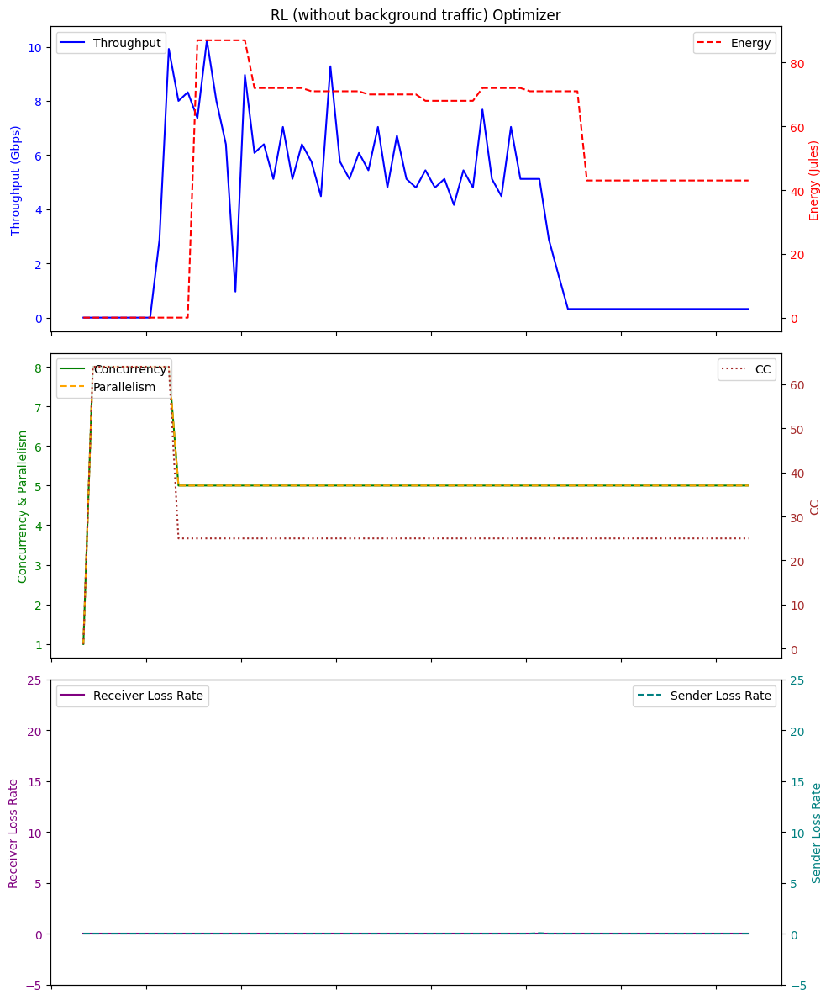

Average Throughput: 3.6326760563380276
Total Energy: 3768.0
Total loss rate: 0.04872415954555786
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-18 23:52:04.144130         0.0          0.0   1    0.0   0.0   
1  2024-01-18 23:52:05.143118         0.0          0.0  64    0.0   0.0   
2  2024-01-18 23:52:06.144229         0.0          0.0  64    0.0  32.9   
3  2024-01-18 23:52:07.146078         0.0          0.0  64    0.0  32.6   
4  2024-01-18 23:52:08.146125         0.0          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
76 2024-01-18 23:53:20.221941         1.6          0.0  25    1.0  32.6   
77 2024-01-18 23:53:21.225535         1.6          0.0  25    1.0  32.7   
78 2024-01-18 23:53:22.225658         1.6          0.0  25    1.0  32.6   
79 2024-01-18 23:53:23.225280         1.6          0.0  25    1.0  32.6   
80 2024-01-18 23:53:24.226651         1.6          0.0  25    1.0  32.6   

  

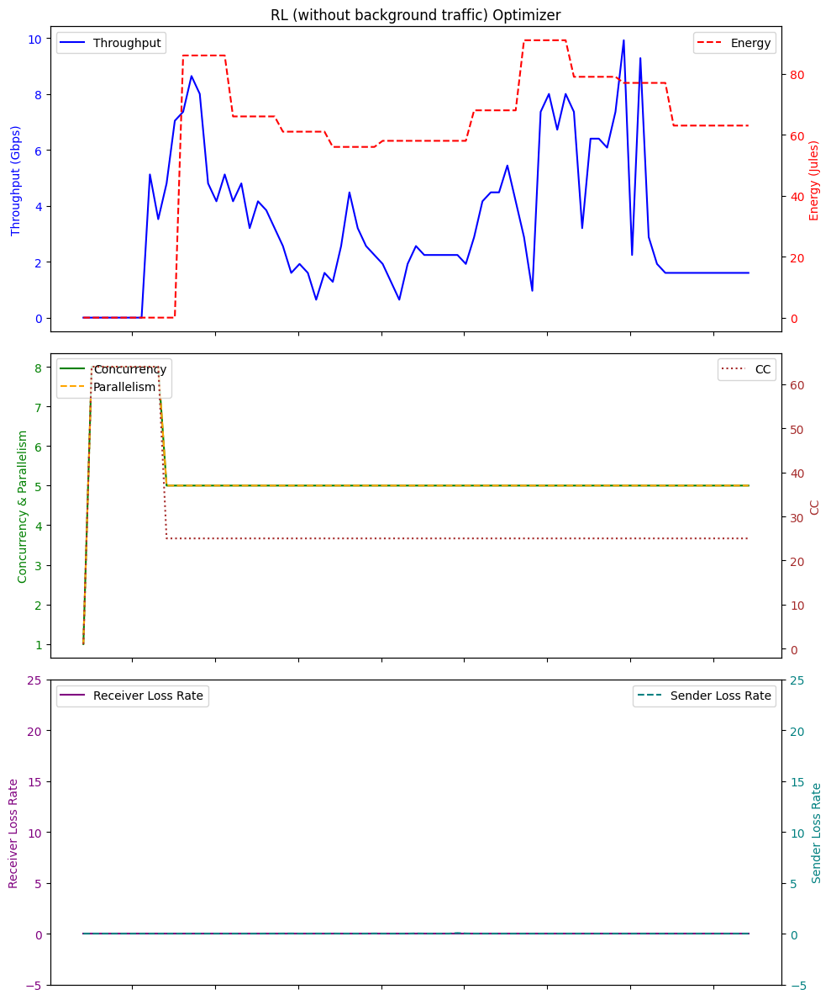

Average Throughput: 3.330370370370371
Total Energy: 4772.0
Total loss rate: 0.12353449112234549
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 02:06:52.704374        0.00          0.0   1    0.0   0.0   
1   2024-01-19 02:06:53.697941        0.00          0.0  64    0.0   0.0   
2   2024-01-19 02:06:54.697150        0.00          0.0  64    0.0  39.2   
3   2024-01-19 02:06:55.700761        0.00          0.0  64    0.0  38.5   
4   2024-01-19 02:06:56.700627        0.00          0.0  64    0.0  36.8   
..                         ...         ...          ...  ..    ...   ...   
125 2024-01-19 02:08:57.827633        0.32          0.0  25    0.0  32.7   
126 2024-01-19 02:08:58.829679        0.32          0.0  25    0.0  32.7   
127 2024-01-19 02:08:59.830014        0.32          0.0  25    0.0  32.6   
128 2024-01-19 02:09:00.831976        0.32          0.0  25    0.0  32.7   
129 2024-01-19 02:09:01.833058        0.32          0.0  25    0.0  

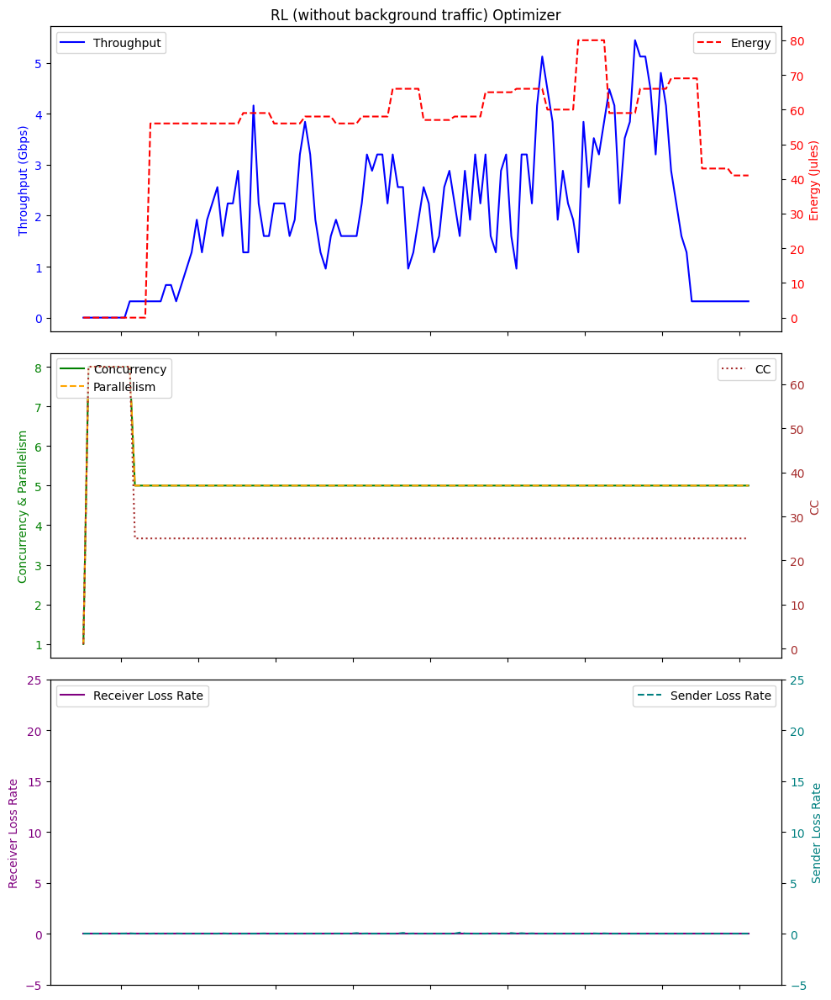

Average Throughput: 1.9963076923076921
Total Energy: 6972.0
Total loss rate: 0.5489583349454848
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 01:47:04.903800        0.00          0.0   1    0.0   0.0   
1  2024-01-19 01:47:05.900765        0.00          0.0  64    0.0   0.0   
2  2024-01-19 01:47:06.903652        0.00          0.0  64    0.0  32.6   
3  2024-01-19 01:47:07.904250        0.00          0.0  64    0.0  32.7   
4  2024-01-19 01:47:08.904207        0.00          0.0  64    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
66 2024-01-19 01:48:10.969144        0.32          0.0  25    0.0  32.7   
67 2024-01-19 01:48:11.970273        0.32          0.0  25    0.0  32.7   
68 2024-01-19 01:48:12.972042        0.32          0.0  25    0.0  32.6   
69 2024-01-19 01:48:13.973401        0.32          0.0  25    0.0  32.8   
70 2024-01-19 01:48:14.972765        0.32          0.0  25    0.0  32.6   

   

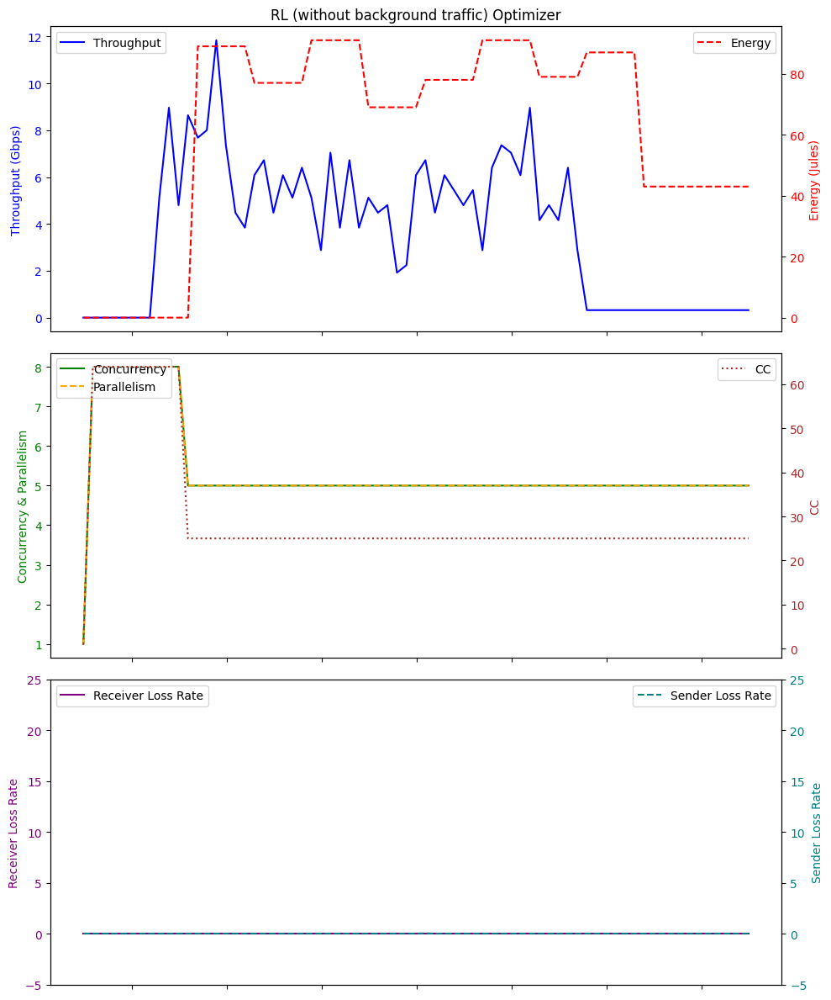

Average Throughput: 3.6552112676056328
Total Energy: 4403.0
Total loss rate: 0.027295562678751394
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 01:29:41.580880        0.00          0.0   1    0.0   0.0   
1  2024-01-19 01:29:42.582831        0.00          0.0  64    0.0   0.0   
2  2024-01-19 01:29:43.580895        0.00          0.0  64    0.0  32.7   
3  2024-01-19 01:29:44.582989        0.00          0.0  64    0.0  32.7   
4  2024-01-19 01:29:45.582651        0.00          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
56 2024-01-19 01:30:37.638654        0.32          0.0  25    0.0  32.6   
57 2024-01-19 01:30:38.639105        0.32          0.0  25    0.0  32.6   
58 2024-01-19 01:30:39.639841        0.32          0.0  25    0.0  32.8   
59 2024-01-19 01:30:40.642276        0.32          0.0  25    0.0  32.7   
60 2024-01-19 01:30:41.641894        0.32          0.0  25    0.0  32.6   

 

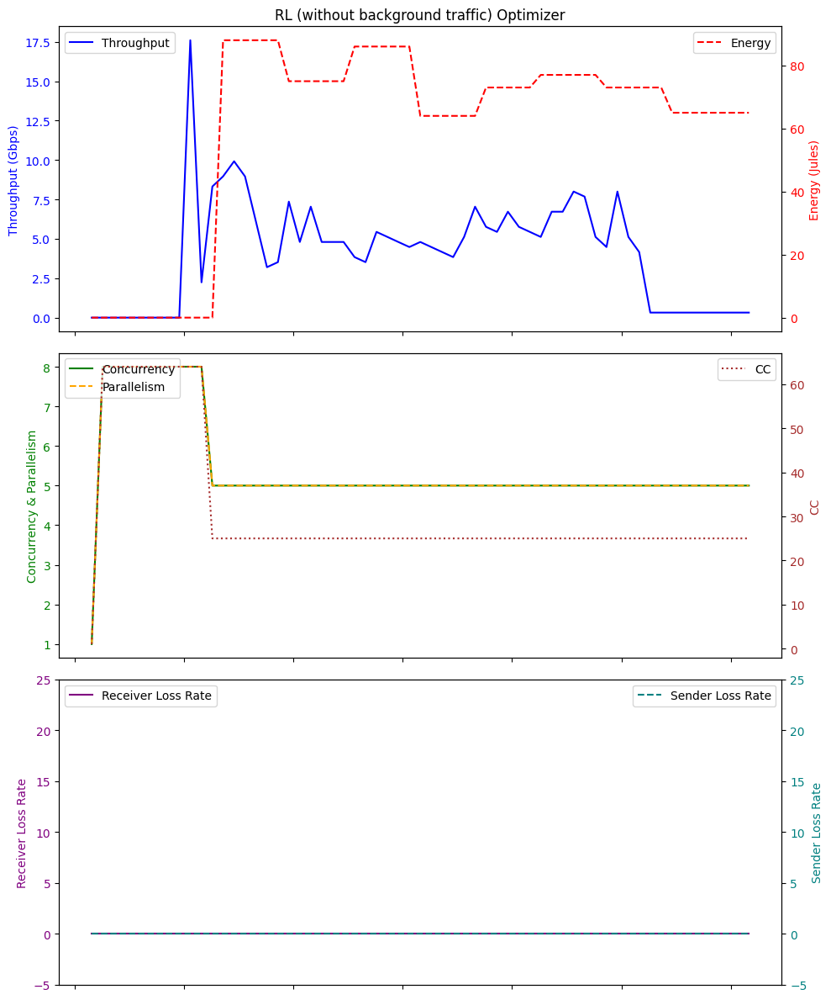

Average Throughput: 4.139016393442622
Total Energy: 3663.0
Total loss rate: 0.003522502628172809
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-18 23:30:51.528037        0.00          0.0   1    0.0   0.0   
1  2024-01-18 23:30:52.522954        0.00          0.0  64    0.0   0.0   
2  2024-01-18 23:30:53.524660        0.00          0.0  64    0.0  32.9   
3  2024-01-18 23:30:54.524531        0.00          0.0  64    0.0  32.6   
4  2024-01-18 23:30:55.526376        0.00          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
85 2024-01-18 23:32:16.611088        0.64          0.0  25    1.0  32.7   
86 2024-01-18 23:32:17.613658        0.64          0.0  25    1.0  32.7   
87 2024-01-18 23:32:18.613338        0.64          0.0  25    1.0  32.7   
88 2024-01-18 23:32:19.614926        0.64          0.0  25    1.0  32.7   
89 2024-01-18 23:32:20.616746        0.64          0.0  25    1.0  32.8   

  

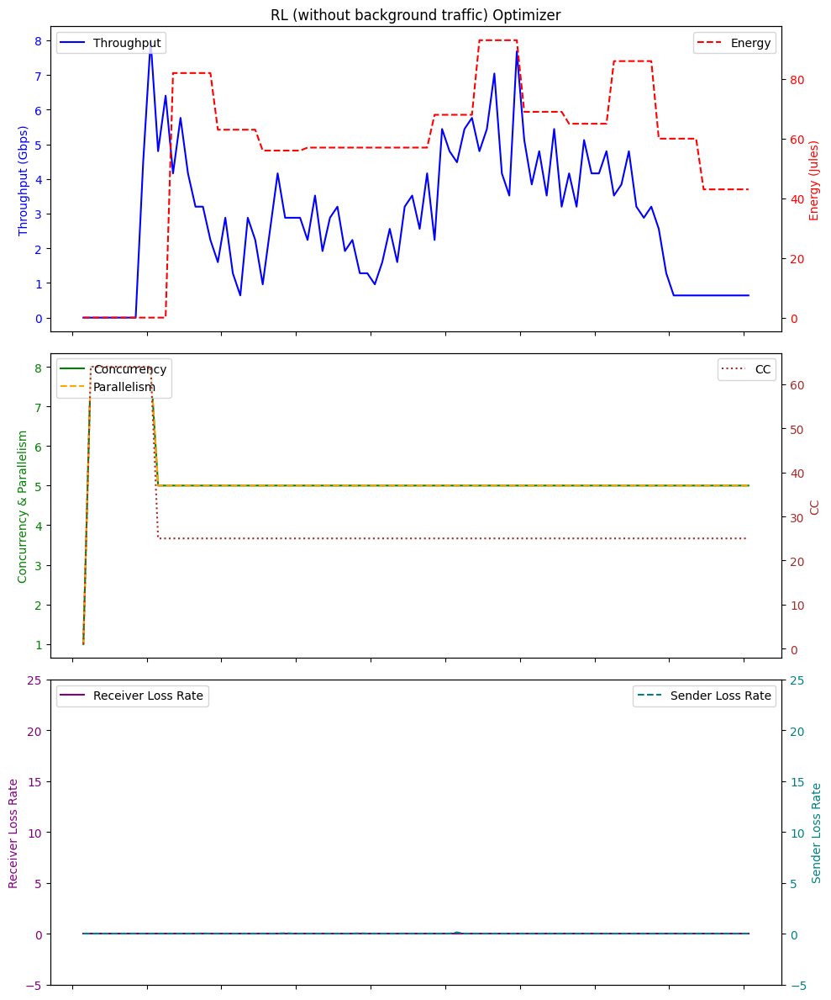

Average Throughput: 2.883555555555555
Total Energy: 5122.0
Total loss rate: 0.21577780563621854
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-18 22:33:49.871136         0.0          0.0   1    0.0   0.0   
1  2024-01-18 22:33:50.881346         0.0          0.0  64    0.0   0.0   
2  2024-01-18 22:33:51.880783         0.0          0.0  64    0.0  32.7   
3  2024-01-18 22:33:52.882025         0.0          0.0  64    0.0  32.8   
4  2024-01-18 22:33:53.884355         0.0          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
56 2024-01-18 22:34:45.937719         3.2          0.0  25    3.0  32.8   
57 2024-01-18 22:34:46.938013         3.2          0.0  25    3.0  32.6   
58 2024-01-18 22:34:47.938031         3.2          0.0  25    3.0  32.6   
59 2024-01-18 22:34:48.939554         3.2          0.0  25    3.0  32.7   
60 2024-01-18 22:34:49.941646         3.2          0.0  25    3.0  32.7   

   

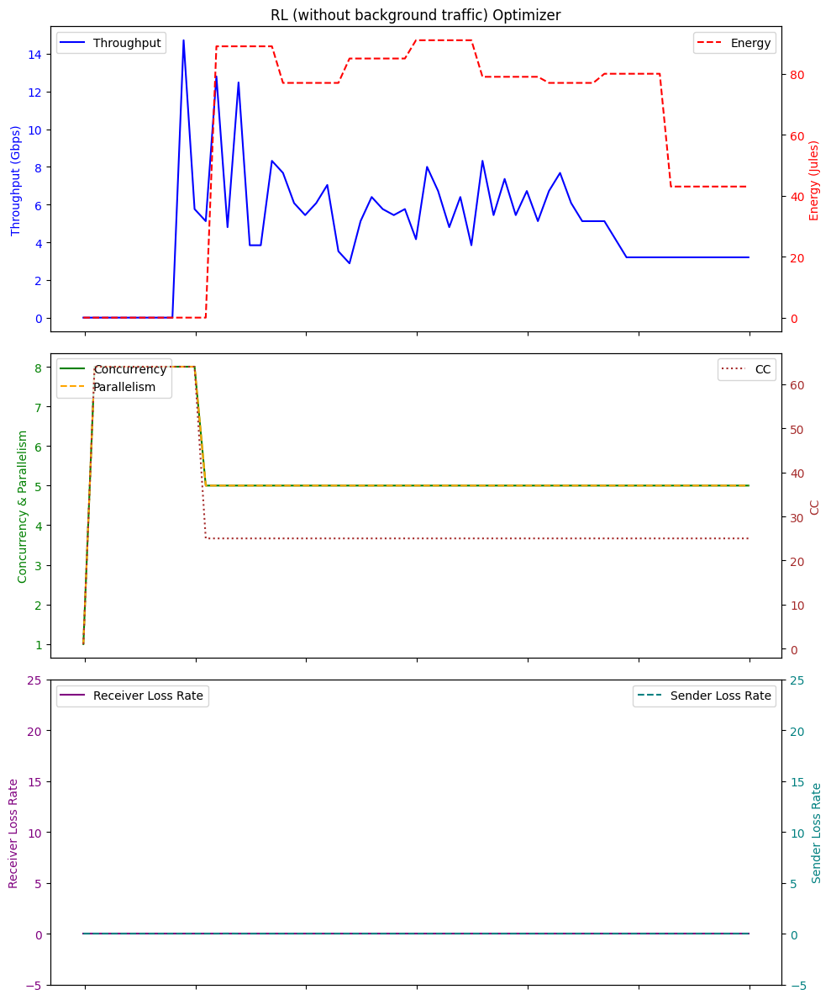

Average Throughput: 4.747540983606557
Total Energy: 3735.0
Total loss rate: 0.009385745329209947
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 03:27:21.095707        0.00          0.0   1    0.0   0.0   
1  2024-01-19 03:27:22.095040        0.00          0.0  64    0.0   0.0   
2  2024-01-19 03:27:23.093574        0.00          0.0  64    0.0  32.7   
3  2024-01-19 03:27:24.097006        0.00          0.0  64    0.0  32.9   
4  2024-01-19 03:27:25.096873        0.00          0.0  64    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
66 2024-01-19 03:28:27.161211        0.32          0.0  25    0.0  32.6   
67 2024-01-19 03:28:28.160991        0.32          0.0  25    0.0  32.7   
68 2024-01-19 03:28:29.163143        0.32          0.0  25    0.0  32.6   
69 2024-01-19 03:28:30.163903        0.32          0.0  25    0.0  32.6   
70 2024-01-19 03:28:31.165341        0.32          0.0  25    0.0  32.7   

  

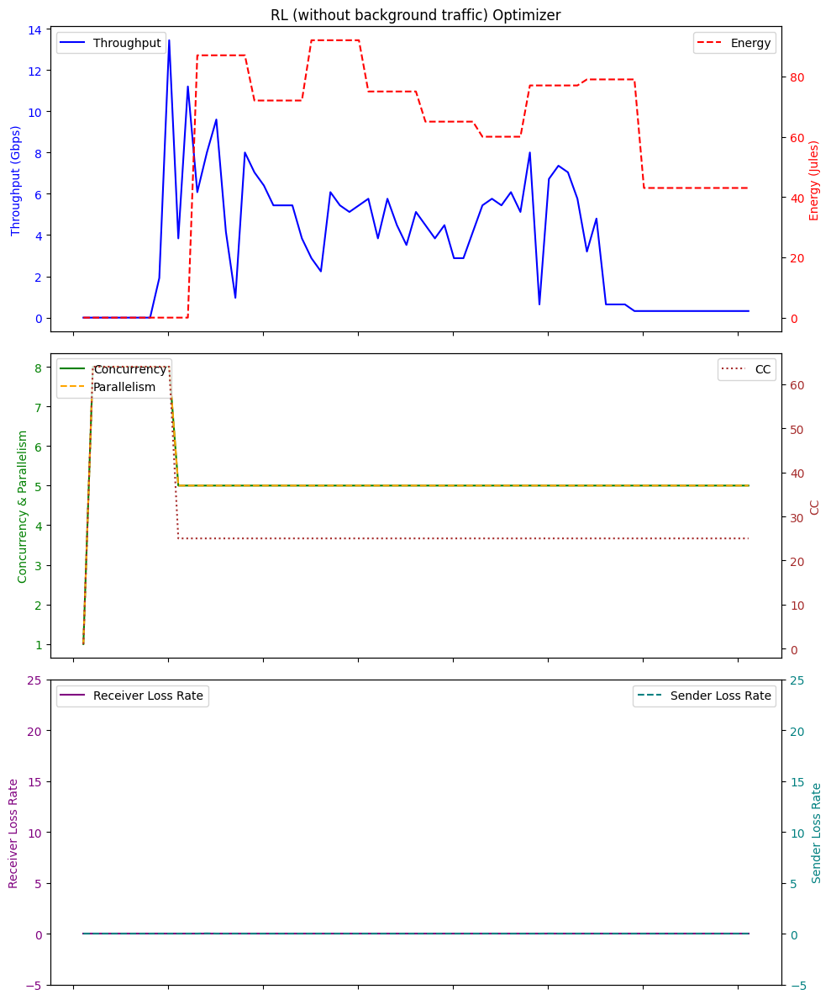

Average Throughput: 3.6146478873239434
Total Energy: 4098.0
Total loss rate: 0.033902315169583426
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 01:10:10.834999        0.00          0.0   1    0.0   0.0   
1  2024-01-19 01:10:11.833305        0.00          0.0  64    0.0   0.0   
2  2024-01-19 01:10:12.833524        0.00          0.0  64    0.0  32.8   
3  2024-01-19 01:10:13.833400        0.00          0.0  64    0.0  32.8   
4  2024-01-19 01:10:14.835935        0.00          0.0  64    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
66 2024-01-19 01:11:16.900832        0.32          0.0  25    0.0  32.6   
67 2024-01-19 01:11:17.900383        0.32          0.0  25    0.0  32.7   
68 2024-01-19 01:11:18.903160        0.32          0.0  25    0.0  32.7   
69 2024-01-19 01:11:19.902531        0.32          0.0  25    0.0  32.6   
70 2024-01-19 01:11:20.905013        0.32          0.0  25    0.0  32.8   

 

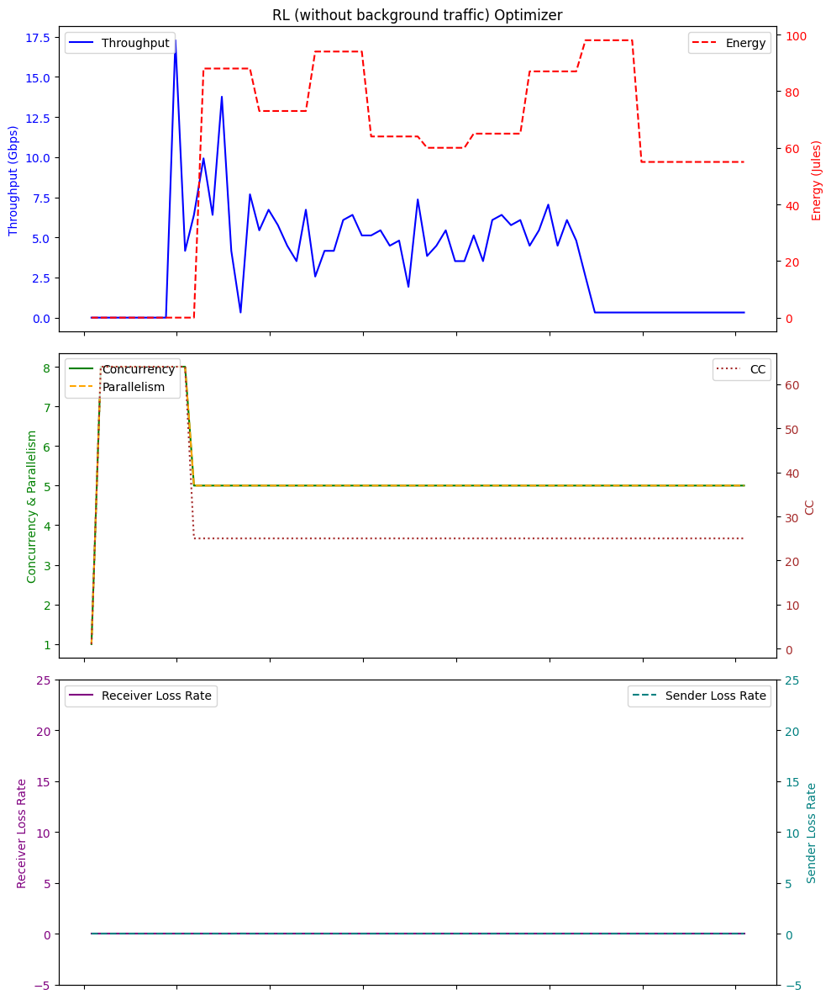

Average Throughput: 3.5830985915492954
Total Energy: 4374.0
Total loss rate: 0.012667842899219461
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-18 22:15:04.354678        0.00          0.0   1    0.0   0.0   
1  2024-01-18 22:15:05.354907        0.00          0.0  64    0.0   0.0   
2  2024-01-18 22:15:06.353972        0.00          0.0  64    0.0  33.1   
3  2024-01-18 22:15:07.356104        0.00          0.0  64    0.0  32.6   
4  2024-01-18 22:15:08.357277        0.00          0.0  64    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
66 2024-01-18 22:16:10.415466        0.32          0.0  25    0.0  32.7   
67 2024-01-18 22:16:11.417325        0.32          0.0  25    0.0  32.8   
68 2024-01-18 22:16:12.420518        0.32          0.0  25    0.0  32.7   
69 2024-01-18 22:16:13.417942        0.32          0.0  25    0.0  32.7   
70 2024-01-18 22:16:14.421706        0.32          0.0  25    0.0  32.7   

 

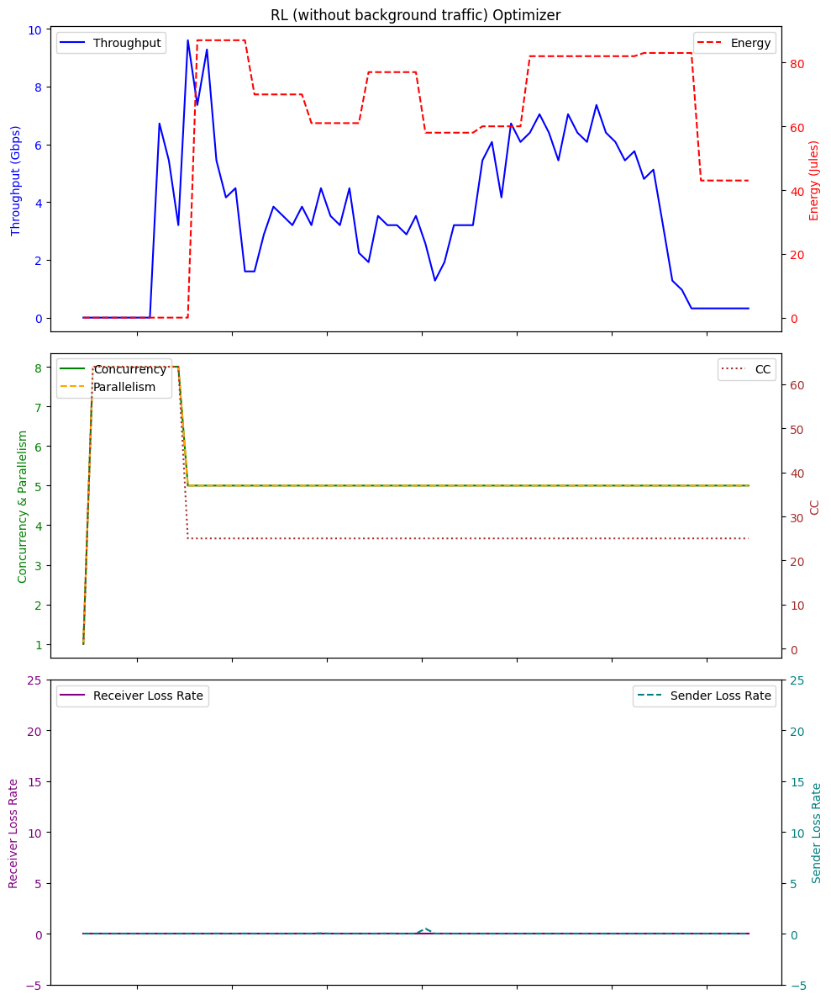

Average Throughput: 3.560563380281689
Total Energy: 4158.0
Total loss rate: 0.5682934321545634
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 03:09:33.164691         0.0          0.0   1    0.0   0.0   
1  2024-01-19 03:09:34.162158         0.0          0.0  64    0.0   0.0   
2  2024-01-19 03:09:35.163253         0.0          0.0  64    0.0  32.6   
3  2024-01-19 03:09:36.162086         0.0          0.0  64    0.0  32.8   
4  2024-01-19 03:09:37.164204         0.0          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
66 2024-01-19 03:10:39.229481         1.6          0.0  25    1.0  32.6   
67 2024-01-19 03:10:40.231713         1.6          0.0  25    1.0  32.6   
68 2024-01-19 03:10:41.232413         1.6          0.0  25    1.0  32.7   
69 2024-01-19 03:10:42.232934         1.6          0.0  25    1.0  32.7   
70 2024-01-19 03:10:43.233603         1.6          0.0  25    1.0  32.6   

    

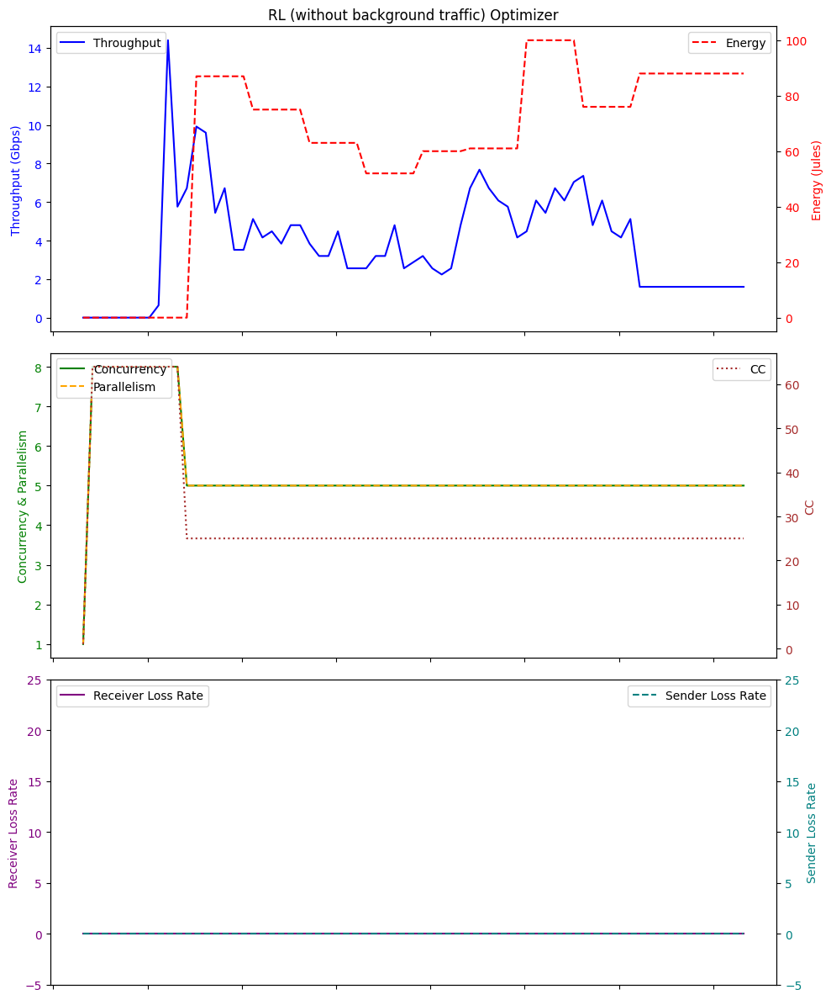

Average Throughput: 3.83098591549296
Total Energy: 4440.0
Total loss rate: 0.005476105505259805


In [6]:
# Example usage RL
directory = './logFileDir/sb3/'
dfs = process_log_files(directory,"sb3_logFile_")

sb3_throughput_list=[]
sb3_energy_list=[]
sb3_plr_list=[]
# Print or process the dataframes as needed
for df in dfs:
    print(df)
    # Plotting
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)


    # Top plot with Throughput and Energy
    ax1.plot(df['Time'], df['Throughput'], label='Throughput', color='blue')
    ax1.set_ylabel('Throughput (Gbps)', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_title('RL (without background traffic) Optimizer')

    ax2_twin = ax1.twinx()
    ax2_twin.plot(df['Time'], df['Energy'], label='Energy', color='red', linestyle='--')
    ax2_twin.set_ylabel('Energy (Jules)', color='red')
    ax2_twin.tick_params(axis='y', labelcolor='red')

    # Bottom plot with Concurrency, Parallelism, and CC
    ax2.plot(df['Time'], df['concurrency'], label='Concurrency', color='green')
    ax2.plot(df['Time'], df['parallelism'], label='Parallelism', color='orange', linestyle='--')
    ax2.set_ylabel('Concurrency & Parallelism', color='green')
    ax2.tick_params(axis='y', labelcolor='green')

    ax3_twin = ax2.twinx()
    ax3_twin.plot(df['Time'], df['CC'], label='CC', color='brown', linestyle=':')
    ax3_twin.set_ylabel('CC', color='brown')
    ax3_twin.tick_params(axis='y', labelcolor='brown')
    
    # Bottom plot with Receiver Loss Rate and Sender Loss Rate
    ax3.plot(df['Time'], df['receiver_lr'], label='Receiver Loss Rate', color='purple', linestyle='-')
    ax3.set_ylabel('Receiver Loss Rate', color='purple')
    ax3.tick_params(axis='y', labelcolor='purple')

    ax4_twin = ax3.twinx()
    ax4_twin.plot(df['Time'], df['sender_lr'], label='Sender Loss Rate', color='teal', linestyle='--')
    ax4_twin.set_ylabel('Sender Loss Rate', color='teal')
    ax4_twin.tick_params(axis='y', labelcolor='teal')
    ax4_twin.set_ylim(-5,25)

    ax3.set_ylim(-5,25)

    # Formatting the x-axis to show time correctly
#     ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: (datetime.min + timedelta(seconds=x)).strftime('%H:%M:%S')))
#     ax2.set_xticklabels([])
    ax1.set_xticklabels([])
    ax2.set_xticklabels([])
    # Fix for overlapping layouts
    fig.tight_layout()

    # Legend
    ax1.legend(loc='upper left')
    ax2_twin.legend(loc='upper right')
    ax2.legend(loc='upper left')
    ax3_twin.legend(loc='upper right')
    ax3.legend(loc='upper left')
    ax4_twin.legend(loc='upper right')
    plt.show()

    average_throughput = df['Throughput'].mean()
    print("Average Throughput:", average_throughput)
    total_energy = df['Energy'].sum()
    print("Total Energy:", total_energy)
    total_plr = df['sender_lr'].sum()
    print("Total loss rate:", total_plr)
    
    sb3_throughput_list.append(average_throughput)
    sb3_energy_list.append(total_energy)
    sb3_plr_list.append(total_plr)


                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 00:55:51.112303        0.00          0.0  64    0.0   0.0   
1  2024-01-19 00:55:52.108457        0.00          0.0  64    0.0   0.0   
2  2024-01-19 00:55:53.110231        0.00          0.0  64    0.0  32.7   
3  2024-01-19 00:55:54.113236        0.00          0.0  64    0.0  32.6   
4  2024-01-19 00:55:55.111278        0.00          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
85 2024-01-19 00:57:16.197042        0.32          0.0  64    0.0  32.6   
86 2024-01-19 00:57:17.200184        0.32          0.0  64    0.0  32.6   
87 2024-01-19 00:57:18.200613        0.32          0.0  64    0.0  32.7   
88 2024-01-19 00:57:19.200572        0.32          0.0  64    0.0  32.8   
89 2024-01-19 00:57:20.202251        0.32          0.0  64    0.0  32.7   

    Energy  sender_lr  concurrency  parallelism  
0      0.0        0.0            8            8  

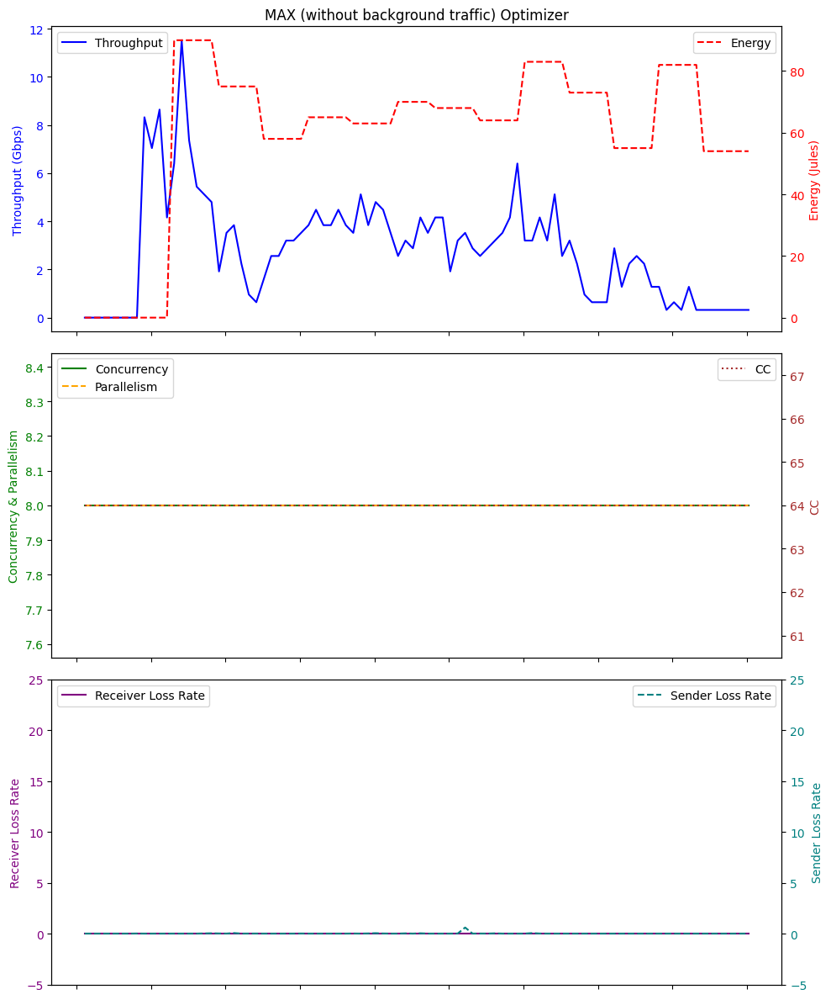

Average Throughput: 2.840888888888889
Total Energy: 5384.0
Total loss rate: 0.935742058184496
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 02:50:27.355238        0.00          0.0  64    0.0   0.0   
1   2024-01-19 02:50:28.350745        0.00          0.0  64    0.0   0.0   
2   2024-01-19 02:50:29.354419        0.00          0.0  64    0.0  32.7   
3   2024-01-19 02:50:30.353346        0.00          0.0  64    0.0  32.9   
4   2024-01-19 02:50:31.353705        0.00          0.0  64    0.0  32.7   
..                         ...         ...          ...  ..    ...   ...   
105 2024-01-19 02:52:12.458154        0.96          0.0  64    1.0  33.4   
106 2024-01-19 02:52:13.458398        0.96          0.0  64    1.0  32.8   
107 2024-01-19 02:52:14.461028        0.96          0.0  64    1.0  32.8   
108 2024-01-19 02:52:15.462474        0.96          0.0  64    1.0  33.2   
109 2024-01-19 02:52:16.462372        0.96          0.0  64    1.0  32

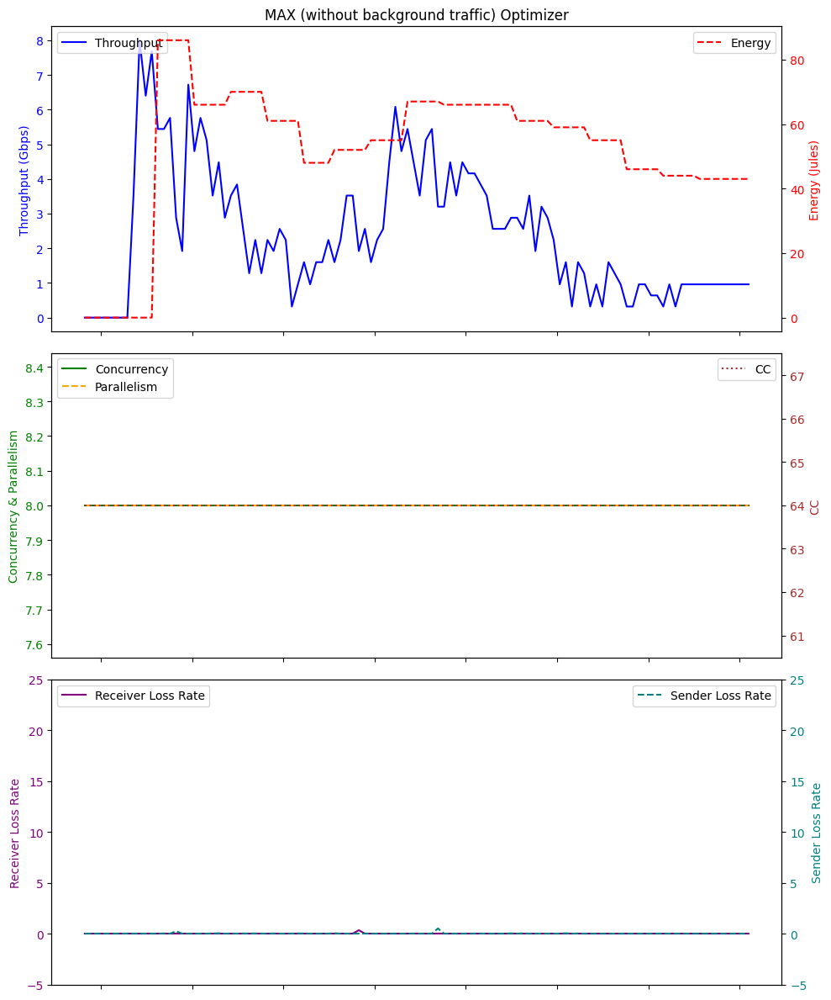

Average Throughput: 2.426181818181817
Total Energy: 5751.0
Total loss rate: 1.0425926179316833
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-18 23:32:26.130913        0.00          0.0  64    0.0   0.0   
1  2024-01-18 23:32:27.126343        0.00          0.0  64    0.0   0.0   
2  2024-01-18 23:32:28.126580        0.00          0.0  64    0.0  32.7   
3  2024-01-18 23:32:29.128995        0.00          0.0  64    0.0  35.7   
4  2024-01-18 23:32:30.129039        0.00          0.0  64    0.0  32.8   
..                        ...         ...          ...  ..    ...   ...   
95 2024-01-18 23:34:01.224514        0.64          0.0  64    1.0  32.6   
96 2024-01-18 23:34:02.228333        0.64          0.0  64    1.0  32.7   
97 2024-01-18 23:34:03.227497        0.64          0.0  64    1.0  32.7   
98 2024-01-18 23:34:04.227333        0.64          0.0  64    1.0  32.7   
99 2024-01-18 23:34:05.230704        0.64          0.0  64    1.0  33.1   

    

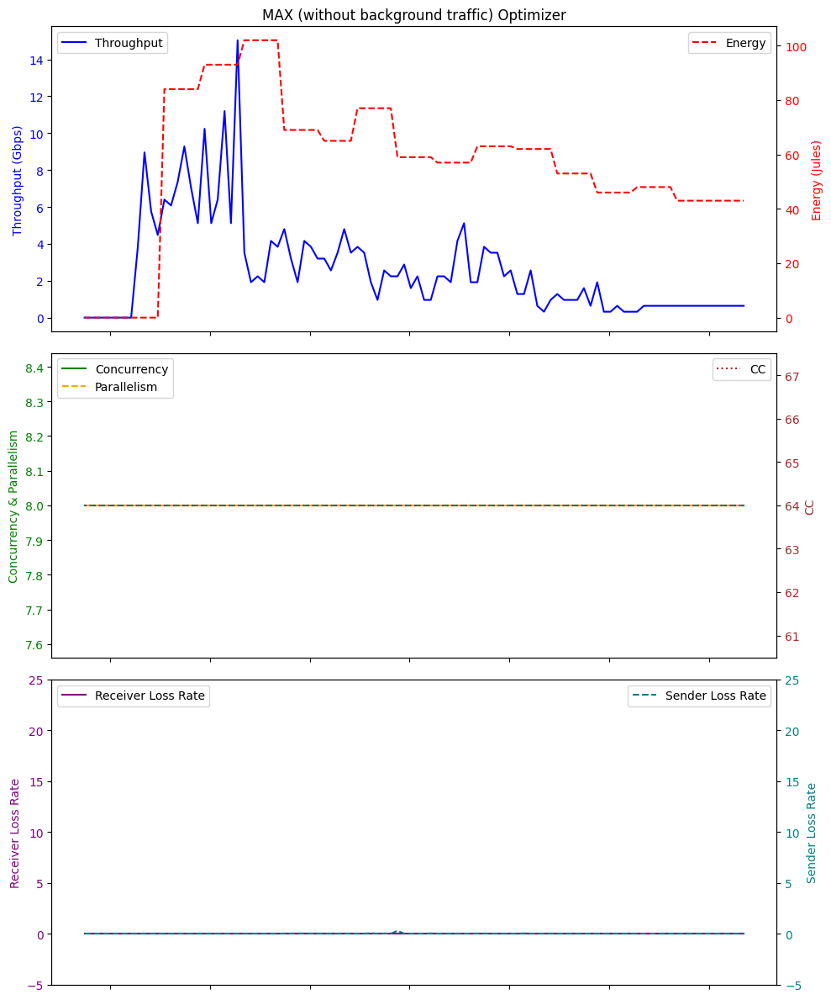

Average Throughput: 2.6271999999999998
Total Energy: 5676.0
Total loss rate: 0.453648003443527
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 01:30:45.807955        0.00          0.0  64    0.0   0.0   
1  2024-01-19 01:30:46.803406        0.00          0.0  64    0.0   0.0   
2  2024-01-19 01:30:47.804529        0.00          0.0  64    0.0  32.9   
3  2024-01-19 01:30:48.806626        0.00          0.0  64    0.0  32.6   
4  2024-01-19 01:30:49.806344        0.00          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
85 2024-01-19 01:32:10.889407        0.64          0.0  64    1.0  32.8   
86 2024-01-19 01:32:11.892961        0.64          0.0  64    1.0  32.7   
87 2024-01-19 01:32:12.893159        0.64          0.0  64    1.0  32.7   
88 2024-01-19 01:32:13.892411        0.64          0.0  64    1.0  32.8   
89 2024-01-19 01:32:14.893989        0.64          0.0  64    1.0  32.7   

    

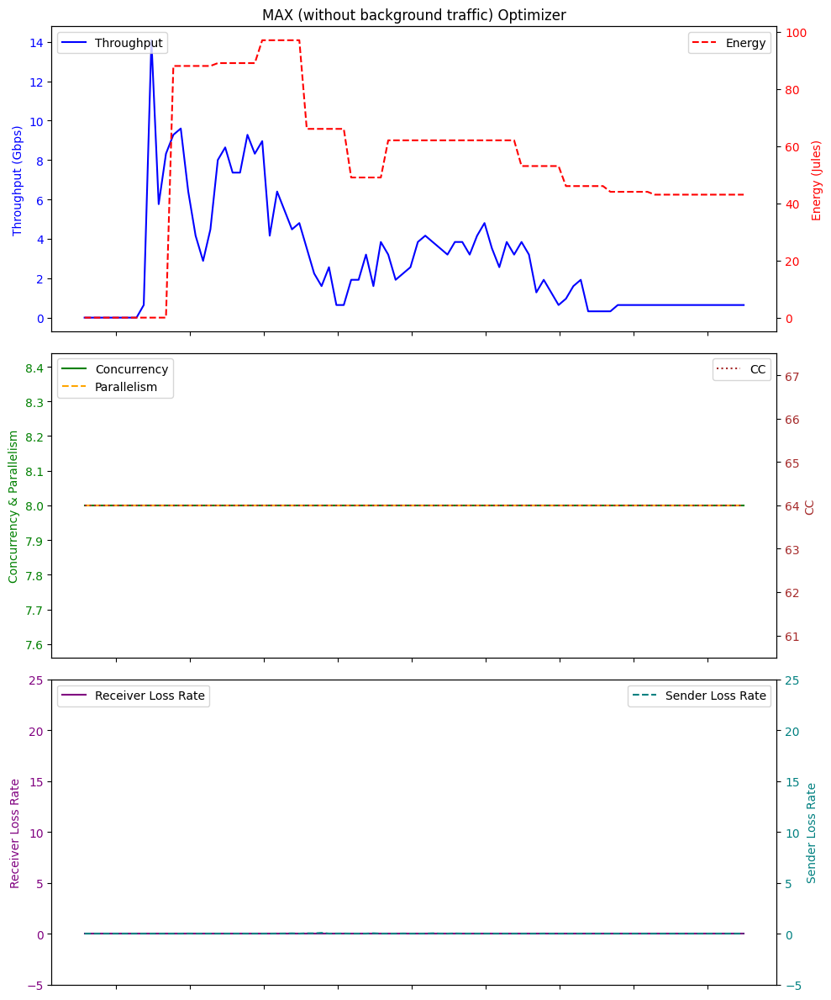

Average Throughput: 2.9262222222222225
Total Energy: 4818.0
Total loss rate: 0.26063041516007984
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-18 22:16:19.986835        0.00          0.0  64    0.0   0.0   
1  2024-01-18 22:16:20.983762        0.00          0.0  64    0.0   0.0   
2  2024-01-18 22:16:21.983334        0.00          0.0  64    0.0  32.6   
3  2024-01-18 22:16:22.985161        0.00          0.0  64    0.0  32.6   
4  2024-01-18 22:16:23.984214        0.00          0.0  64    0.0  32.6   
5  2024-01-18 22:16:24.987715        0.00          0.0  64    0.0  33.3   
6  2024-01-18 22:16:25.982502        0.00          0.0  64    0.0  32.6   
7  2024-01-18 22:16:26.983703        0.00          0.0  64    0.0  35.1   
8  2024-01-18 22:16:27.991159        2.56          0.0  64    2.0  33.6   
9  2024-01-18 22:16:28.988675       12.48          0.0  64   11.0  35.7   
10 2024-01-18 22:16:29.987264        4.48          0.0  64    4.0  33.3   
11 

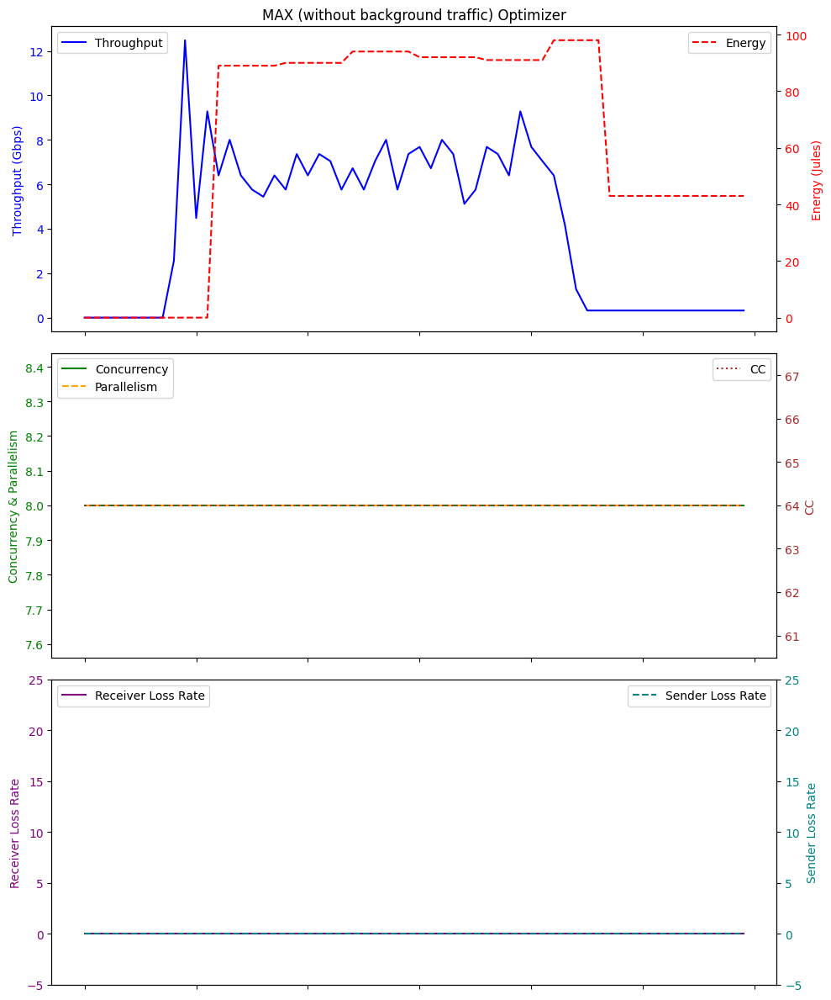

Average Throughput: 4.170666666666666
Total Energy: 3785.0
Total loss rate: 0.014275754903185462
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-18 23:53:26.416078        0.00          0.0  64    0.0   0.0   
1  2024-01-18 23:53:27.408578        0.00          0.0  64    0.0   0.0   
2  2024-01-18 23:53:28.410817        0.00          0.0  64    0.0  32.6   
3  2024-01-18 23:53:29.411941        0.00          0.0  64    0.0  32.6   
4  2024-01-18 23:53:30.412368        0.00          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
85 2024-01-18 23:54:51.494951        0.32          0.0  64    0.0  32.6   
86 2024-01-18 23:54:52.495345        0.32          0.0  64    0.0  32.6   
87 2024-01-18 23:54:53.498644        0.32          0.0  64    0.0  32.7   
88 2024-01-18 23:54:54.498879        0.32          0.0  64    0.0  32.6   
89 2024-01-18 23:54:55.498423        0.32          0.0  64    0.0  32.6   

  

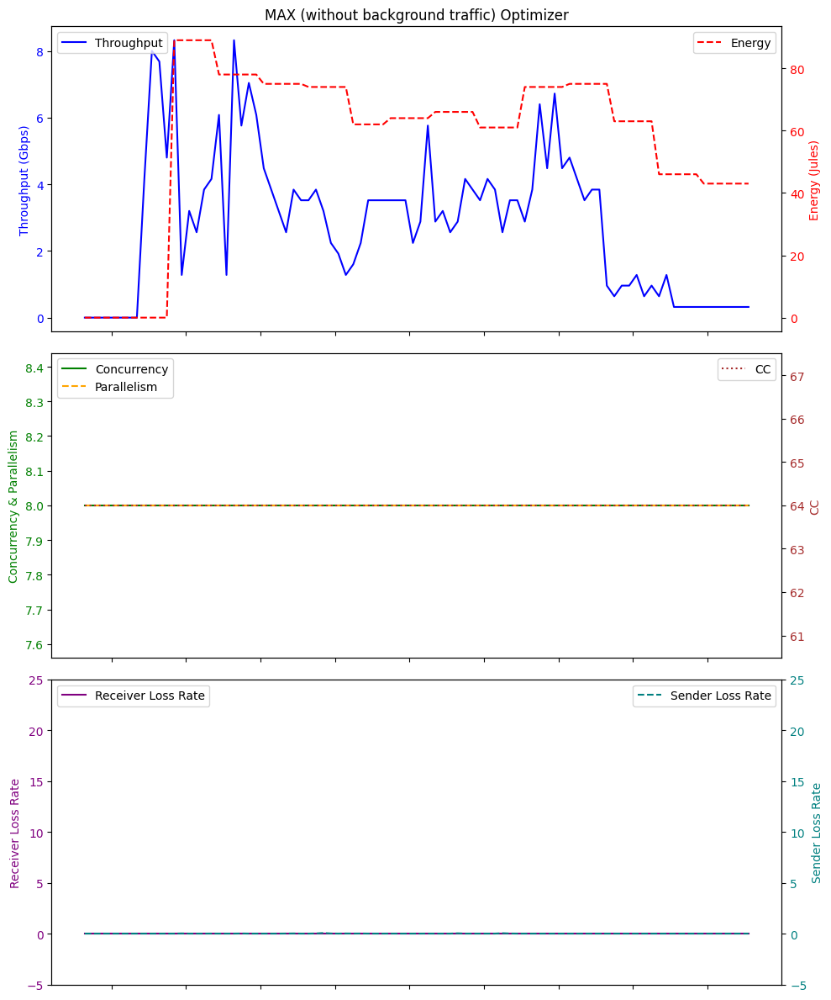

Average Throughput: 2.8586666666666662
Total Energy: 5201.0
Total loss rate: 0.22489914511835496
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 03:48:33.648536        0.00          0.0  64    0.0   0.0   
1  2024-01-19 03:48:34.644894        0.00          0.0  64    0.0   0.0   
2  2024-01-19 03:48:35.644945        0.00          0.0  64    0.0  32.9   
3  2024-01-19 03:48:36.644993        0.00          0.0  64    0.0  32.7   
4  2024-01-19 03:48:37.646736        0.00          0.0  64    0.0  32.8   
..                        ...         ...          ...  ..    ...   ...   
75 2024-01-19 03:49:48.718959        0.32          0.0  64    0.0  32.7   
76 2024-01-19 03:49:49.719436        0.32          0.0  64    0.0  32.7   
77 2024-01-19 03:49:50.721740        0.32          0.0  64    0.0  32.7   
78 2024-01-19 03:49:51.724532        0.32          0.0  64    0.0  32.6   
79 2024-01-19 03:49:52.722641        0.32          0.0  64    0.0  32.8   

  

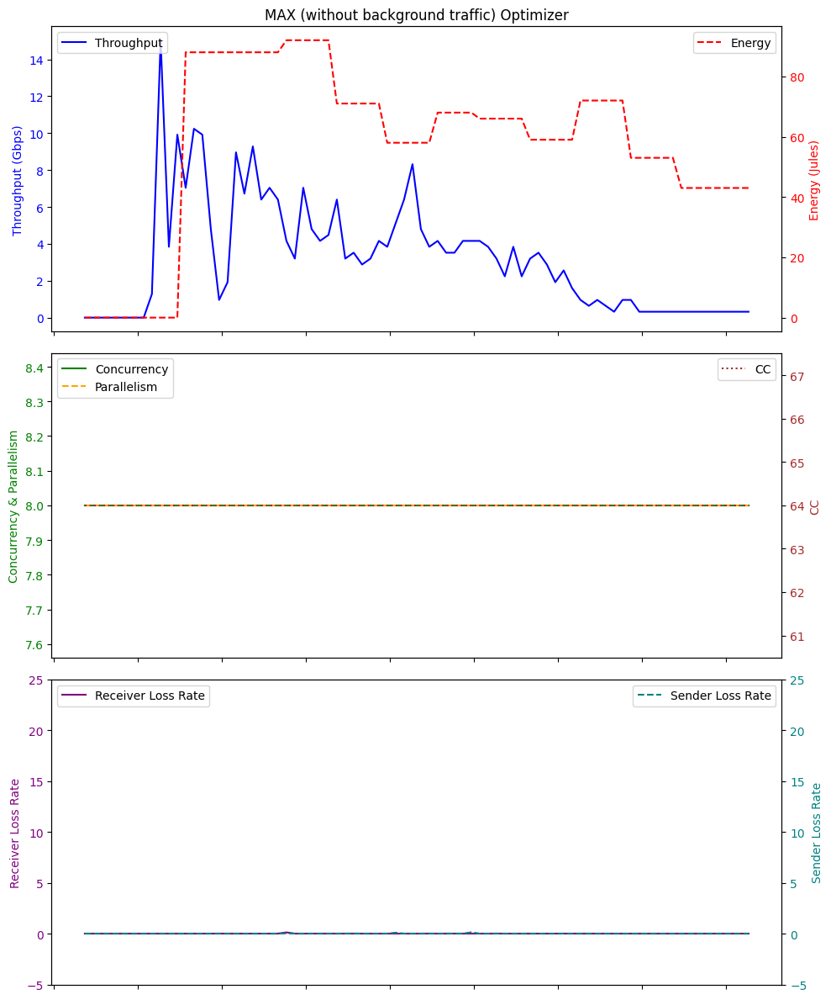

Average Throughput: 3.224
Total Energy: 4609.0
Total loss rate: 0.3043901564413255
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 00:16:34.366945        0.00          0.0  64    0.0   0.0   
1  2024-01-19 00:16:35.364894        0.00          0.0  64    0.0   0.0   
2  2024-01-19 00:16:36.364558        0.00          0.0  64    0.0  32.7   
3  2024-01-19 00:16:37.365160        0.00          0.0  64    0.0  33.0   
4  2024-01-19 00:16:38.368607        0.00          0.0  64    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
56 2024-01-19 00:17:30.421036        0.64          0.0  64    1.0  32.6   
57 2024-01-19 00:17:31.421331        0.64          0.0  64    1.0  32.8   
58 2024-01-19 00:17:32.421367        0.64          0.0  64    1.0  32.7   
59 2024-01-19 00:17:33.424563        0.64          0.0  64    1.0  32.6   
60 2024-01-19 00:17:34.424513        0.64          0.0  64    1.0  32.6   

    Energy  send

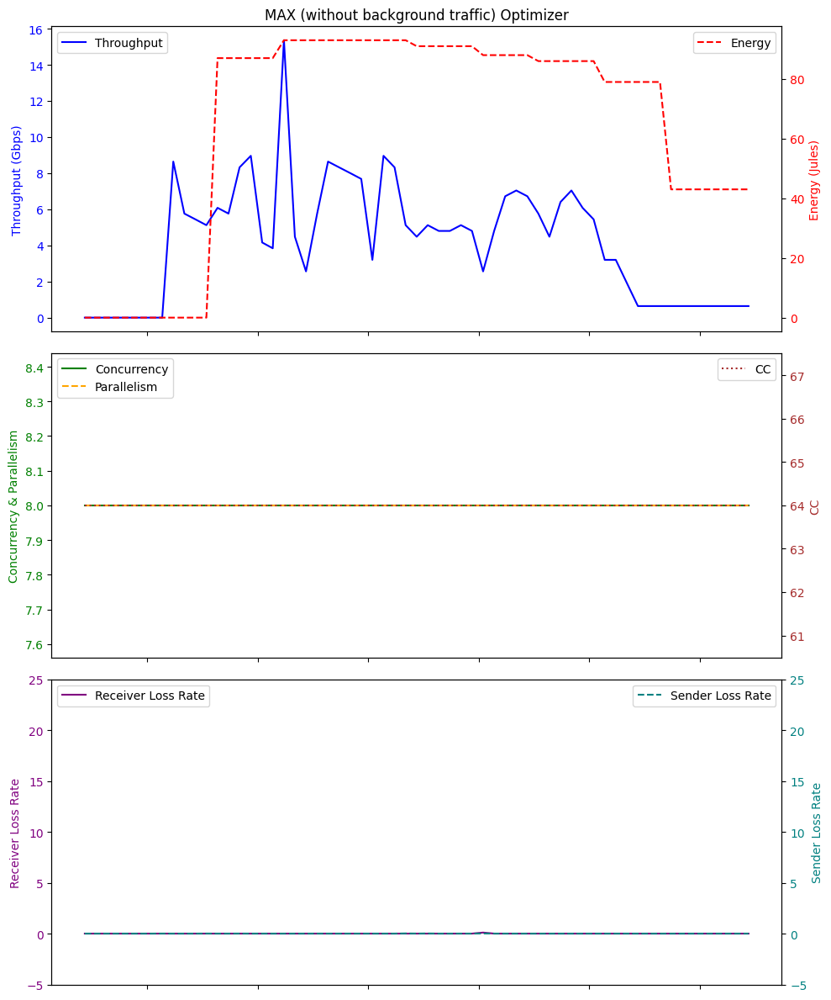

Average Throughput: 4.196721311475409
Total Energy: 3958.0
Total loss rate: 0.06553570405077638
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 02:09:09.221409        0.00          0.0  64    0.0   0.0   
1   2024-01-19 02:09:10.219120        0.00          0.0  64    0.0   0.0   
2   2024-01-19 02:09:11.218687        0.00          0.0  64    0.0  32.7   
3   2024-01-19 02:09:12.219188        0.00          0.0  64    0.0  34.7   
4   2024-01-19 02:09:13.223903        0.00          0.0  64    0.0  32.8   
..                         ...         ...          ...  ..    ...   ...   
145 2024-01-19 02:11:34.372309        0.32          0.0  64    0.0  32.9   
146 2024-01-19 02:11:35.372095        0.32          0.0  64    0.0  32.6   
147 2024-01-19 02:11:36.373350        0.32          0.0  64    0.0  32.6   
148 2024-01-19 02:11:37.375440        0.32          0.0  64    0.0  32.6   
149 2024-01-19 02:11:38.375457        0.32          0.0  64    0.0  

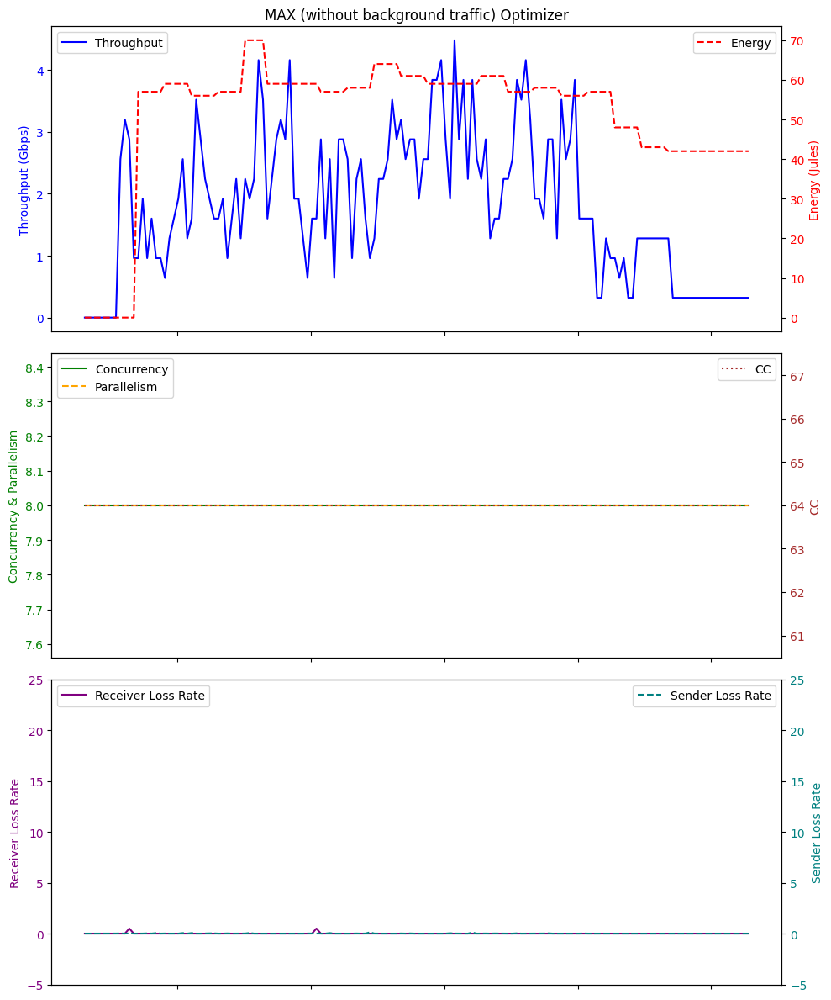

Average Throughput: 1.7898666666666667
Total Energy: 7658.0
Total loss rate: 0.8504533287737797
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-18 22:34:54.278820        0.00          0.0  64    0.0   0.0   
1  2024-01-18 22:34:55.274766        0.00          0.0  64    0.0   0.0   
2  2024-01-18 22:34:56.274464        0.00          0.0  64    0.0  32.7   
3  2024-01-18 22:34:57.277585        0.00          0.0  64    0.0  32.7   
4  2024-01-18 22:34:58.277779        0.00          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
56 2024-01-18 22:35:50.326335        0.64          0.0  64    1.0  32.7   
57 2024-01-18 22:35:51.325781        0.64          0.0  64    1.0  32.6   
58 2024-01-18 22:35:52.328427        0.64          0.0  64    1.0  32.7   
59 2024-01-18 22:35:53.329786        0.64          0.0  64    1.0  32.7   
60 2024-01-18 22:35:54.329620        0.64          0.0  64    1.0  32.8   

   

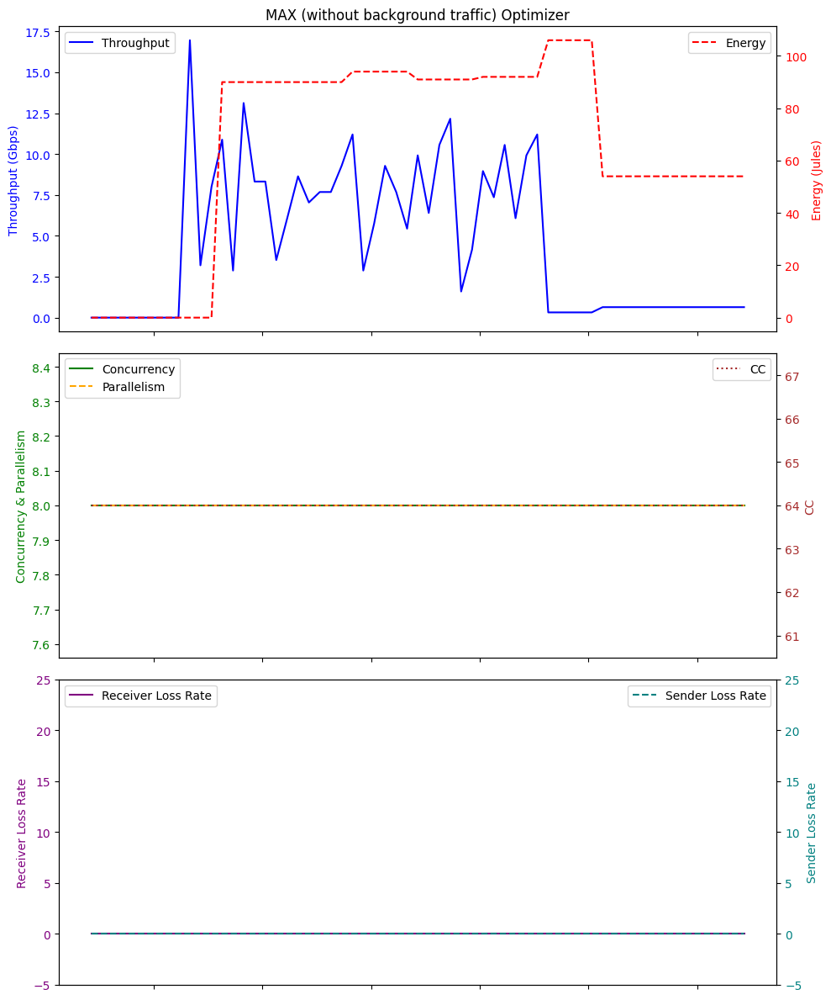

Average Throughput: 4.479999999999999
Total Energy: 4028.0
Total loss rate: 0.017260287869419248
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-18 23:14:16.148444        0.00          0.0  64    0.0   0.0   
1  2024-01-18 23:14:17.143485        0.00          0.0  64    0.0   0.0   
2  2024-01-18 23:14:18.143595        0.00          0.0  64    0.0  32.6   
3  2024-01-18 23:14:19.146685        0.00          0.0  64    0.0  32.8   
4  2024-01-18 23:14:20.146745        0.00          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
95 2024-01-18 23:15:51.243313        0.64          0.0  64    1.0  32.8   
96 2024-01-18 23:15:52.245341        0.64          0.0  64    1.0  32.8   
97 2024-01-18 23:15:53.246422        0.64          0.0  64    1.0  32.7   
98 2024-01-18 23:15:54.246176        0.64          0.0  64    1.0  32.7   
99 2024-01-18 23:15:55.250015        0.64          0.0  64    1.0  32.7   

  

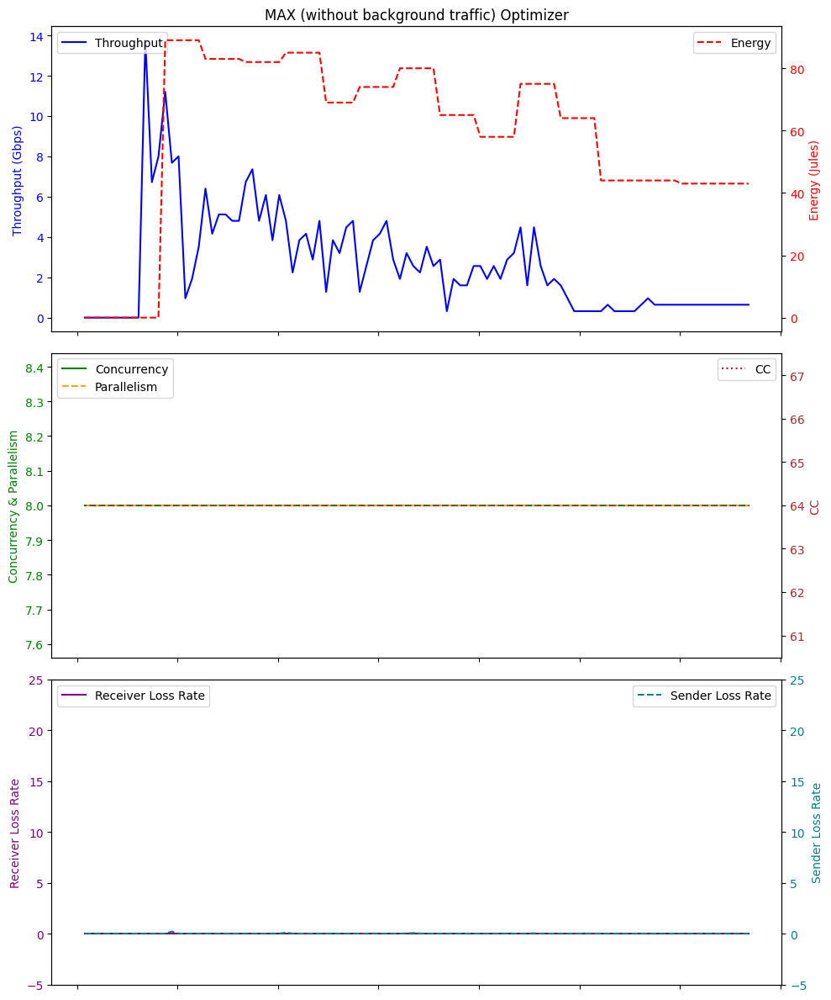

Average Throughput: 2.6271999999999998
Total Energy: 5876.0
Total loss rate: 0.47194162009498924
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 22:54:44.803399        0.00          0.0  64    0.0   0.0   
1   2024-01-18 22:54:45.799373        0.00          0.0  64    0.0   0.0   
2   2024-01-18 22:54:46.802180        0.00          0.0  64    0.0  32.6   
3   2024-01-18 22:54:47.802406        0.00          0.0  64    0.0  36.0   
4   2024-01-18 22:54:48.802042        0.00          0.0  64    0.0  32.7   
..                         ...         ...          ...  ..    ...   ...   
165 2024-01-18 22:57:29.975687        0.32          0.0  64    0.0  52.9   
166 2024-01-18 22:57:30.976390        0.32          0.0  64    0.0  38.8   
167 2024-01-18 22:57:31.978884        0.32          0.0  64    0.0  36.2   
168 2024-01-18 22:57:32.979326        0.32          0.0  64    0.0  37.4   
169 2024-01-18 22:57:33.979131        0.32          0.0  64    0.0 

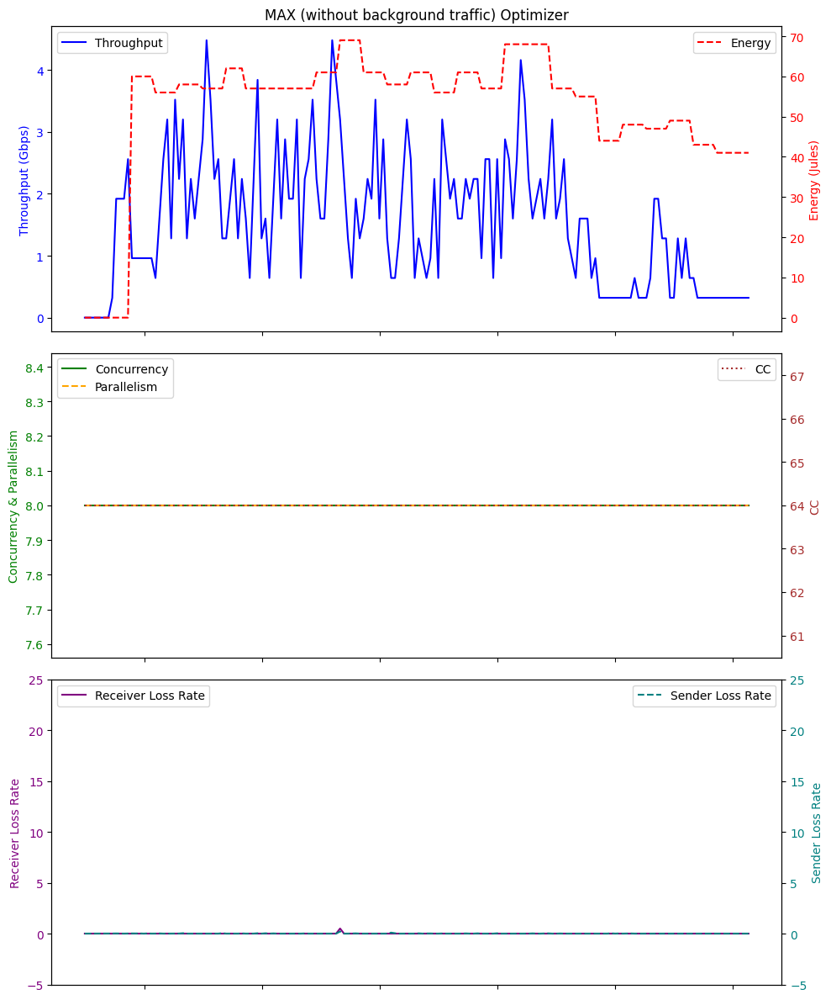

Average Throughput: 1.5567058823529412
Total Energy: 8869.0
Total loss rate: 0.9408274345431537
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 00:36:16.059470        0.00          0.0  64    0.0   0.0   
1  2024-01-19 00:36:17.055360        0.00          0.0  64    0.0   0.0   
2  2024-01-19 00:36:18.056180        0.00          0.0  64    0.0  32.7   
3  2024-01-19 00:36:19.058612        0.00          0.0  64    0.0  32.8   
4  2024-01-19 00:36:20.057918        0.00          0.0  64    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
56 2024-01-19 00:37:12.107946        0.32          0.0  64    0.0  32.7   
57 2024-01-19 00:37:13.108720        0.32          0.0  64    0.0  32.8   
58 2024-01-19 00:37:14.110762        0.32          0.0  64    0.0  32.7   
59 2024-01-19 00:37:15.110406        0.32          0.0  64    0.0  32.7   
60 2024-01-19 00:37:16.111867        0.32          0.0  64    0.0  32.6   

   

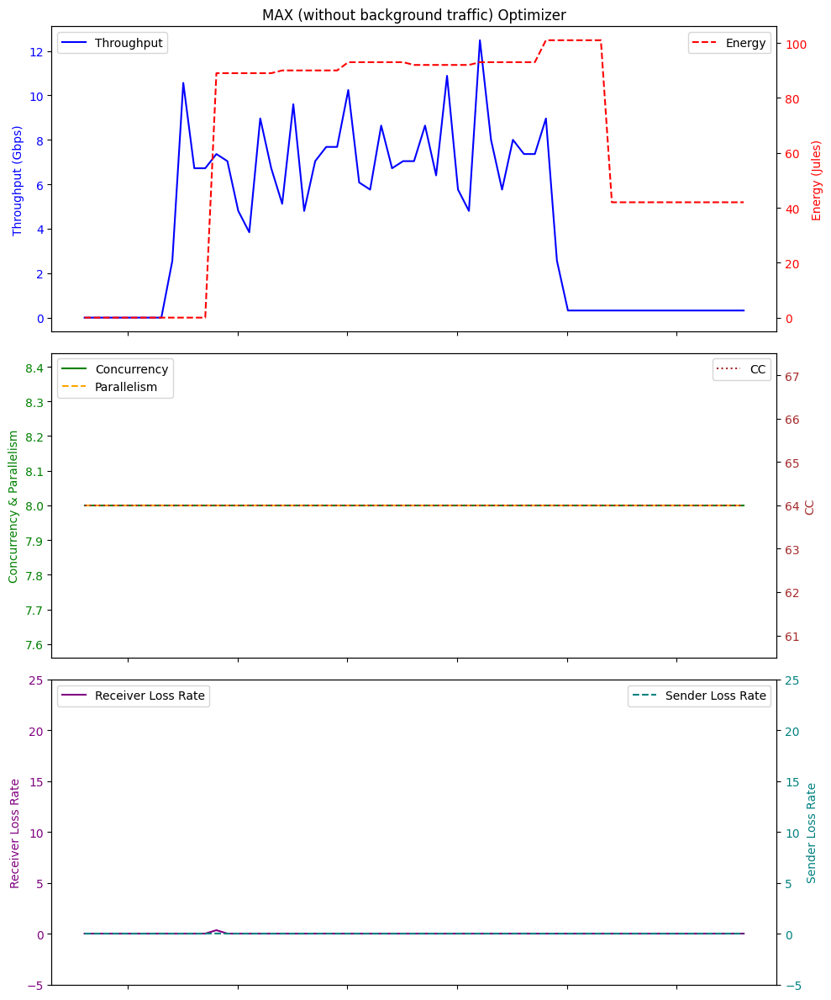

Average Throughput: 4.280655737704918
Total Energy: 3894.0
Total loss rate: 0.027896042902121776
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 01:48:17.179732        0.00          0.0  64    0.0   0.0   
1  2024-01-19 01:48:18.174600        0.00          0.0  64    0.0   0.0   
2  2024-01-19 01:48:19.177543        0.00          0.0  64    0.0  32.6   
3  2024-01-19 01:48:20.177967        0.00          0.0  64    0.0  32.6   
4  2024-01-19 01:48:21.177236        0.00          0.0  64    0.0  32.6   
5  2024-01-19 01:48:22.179660        0.00          0.0  64    0.0  32.6   
6  2024-01-19 01:48:23.215727        0.00          0.0  64    0.0  32.5   
7  2024-01-19 01:48:24.217862        0.00          0.0  64    0.0  36.6   
8  2024-01-19 01:48:25.178308        0.00          0.0  64    0.0  32.8   
9  2024-01-19 01:48:26.218977       18.24          0.0  64   16.0  37.0   
10 2024-01-19 01:48:27.223696        2.24          0.0  64    2.0  33.0   
11 

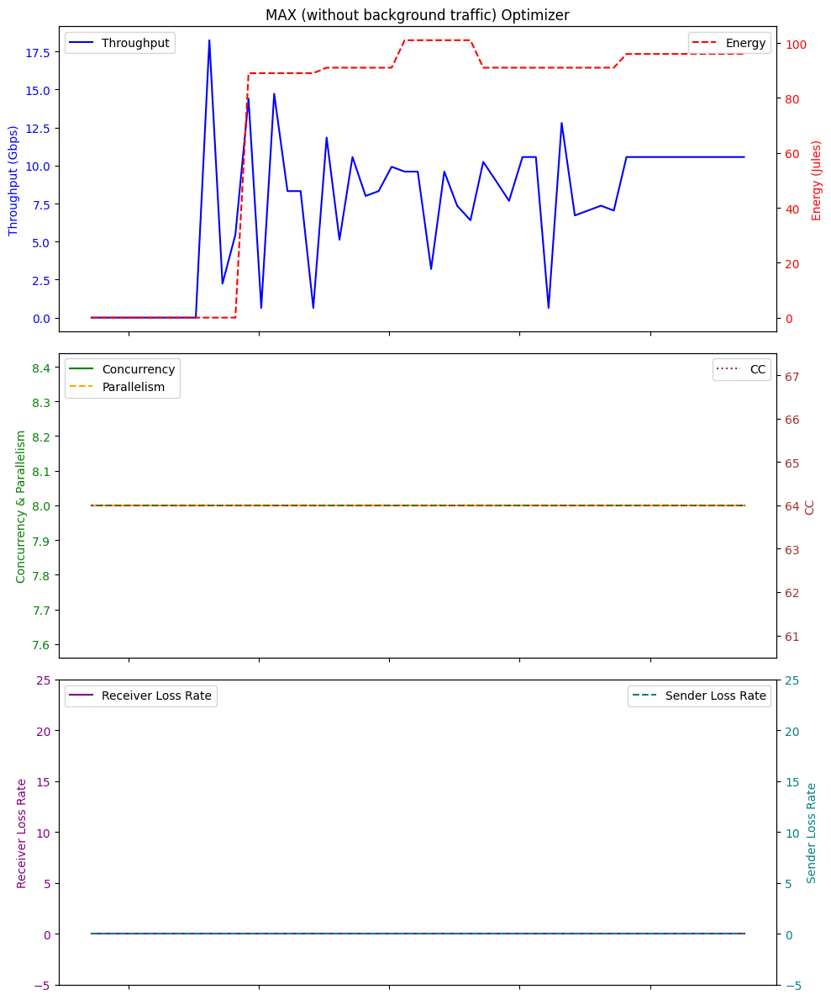

Average Throughput: 7.209411764705883
Total Energy: 3647.0
Total loss rate: 0.005516182904854461
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 01:11:23.111957        0.00          0.0  64    0.0   0.0   
1  2024-01-19 01:11:24.108792        0.00          0.0  64    0.0   0.0   
2  2024-01-19 01:11:25.111218        0.00          0.0  64    0.0  32.7   
3  2024-01-19 01:11:26.112728        0.00          0.0  64    0.0  32.6   
4  2024-01-19 01:11:27.110992        0.00          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
56 2024-01-19 01:12:19.164727        0.64          0.0  64    1.0  32.7   
57 2024-01-19 01:12:20.164392        0.64          0.0  64    1.0  32.6   
58 2024-01-19 01:12:21.165973        0.64          0.0  64    1.0  32.6   
59 2024-01-19 01:12:22.167071        0.64          0.0  64    1.0  32.7   
60 2024-01-19 01:12:23.167465        0.64          0.0  64    1.0  32.9   

  

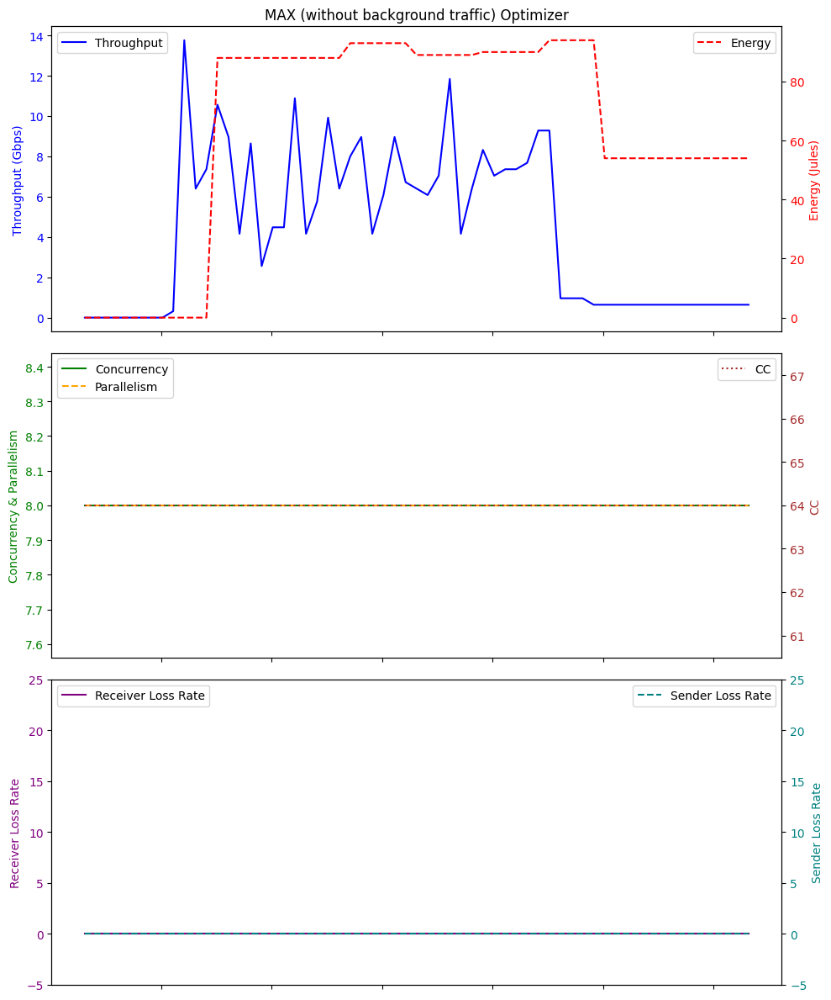

Average Throughput: 4.301639344262295
Total Energy: 3914.0
Total loss rate: 0.008302040995065388
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 02:33:17.755651        0.00          0.0  64    0.0   0.0   
1   2024-01-19 02:33:18.749865        0.00          0.0  64    0.0   0.0   
2   2024-01-19 02:33:19.749254        0.00          0.0  64    0.0  32.7   
3   2024-01-19 02:33:20.752061        0.00          0.0  64    0.0  32.8   
4   2024-01-19 02:33:21.752235        0.00          0.0  64    0.0  32.7   
..                         ...         ...          ...  ..    ...   ...   
115 2024-01-19 02:35:12.869170        0.64          0.0  64    1.0  32.7   
116 2024-01-19 02:35:13.868925        0.64          0.0  64    1.0  32.6   
117 2024-01-19 02:35:14.871013        0.64          0.0  64    1.0  32.6   
118 2024-01-19 02:35:15.872363        0.64          0.0  64    1.0  32.7   
119 2024-01-19 02:35:16.872633        0.64          0.0  64    1.0 

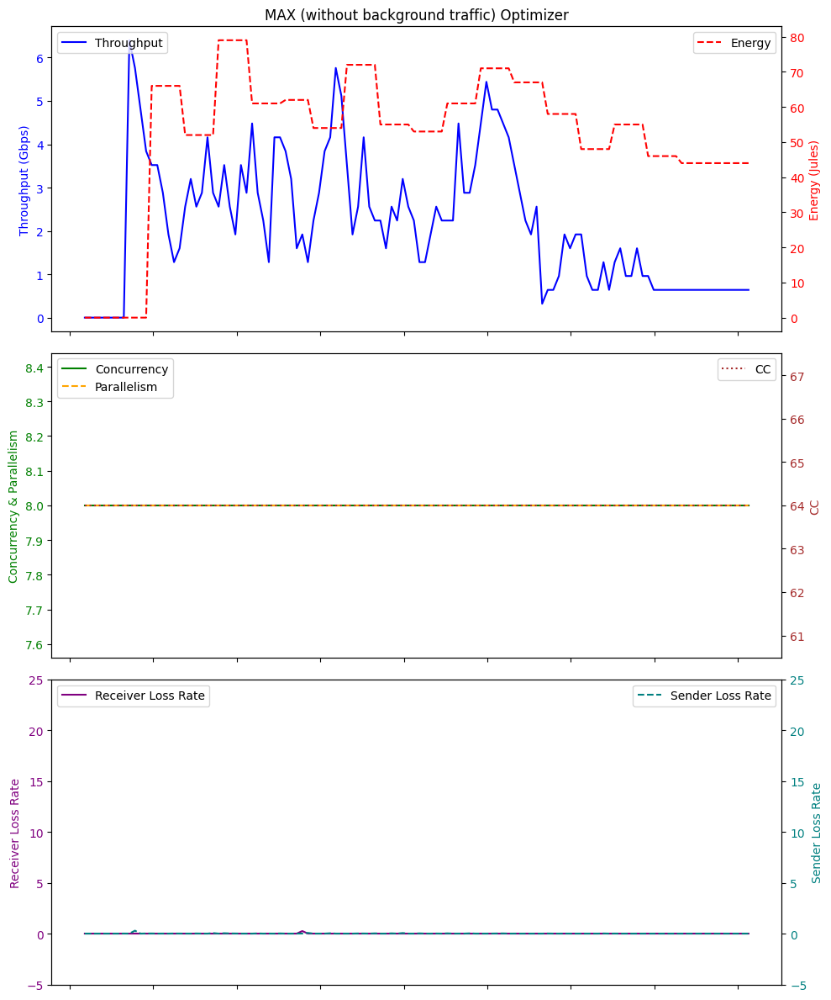

Average Throughput: 2.184
Total Energy: 6270.0
Total loss rate: 0.8581109116496517
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 04:19:37.175400        0.00          0.0  64    0.0   0.0   
1  2024-01-19 04:19:38.171189        0.00          0.0  64    0.0   0.0   
2  2024-01-19 04:19:39.174970        0.00          0.0  64    0.0  32.6   
3  2024-01-19 04:19:40.176155        0.00          0.0  64    0.0  32.7   
4  2024-01-19 04:19:41.178713        0.00          0.0  64    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
65 2024-01-19 04:20:42.234925        0.32          0.0  64    0.0  32.7   
66 2024-01-19 04:20:43.238783        0.32          0.0  64    0.0  32.7   
67 2024-01-19 04:20:44.238627        0.32          0.0  64    0.0  33.9   
68 2024-01-19 04:20:45.239023        0.32          0.0  64    0.0  32.9   
69 2024-01-19 04:20:46.241925        0.32          0.0  64    0.0  32.9   

    Energy  send

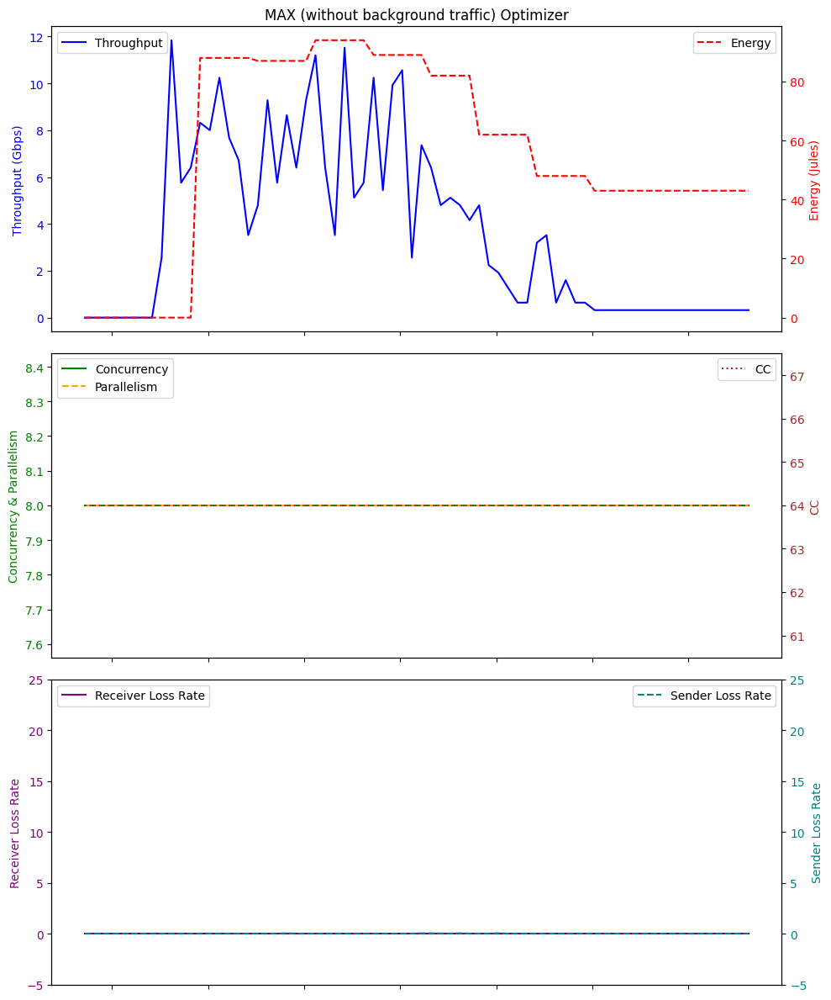

Average Throughput: 3.675428571428571
Total Energy: 3949.0
Total loss rate: 0.16719246041850686
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 04:04:35.653077        0.00          0.0  64    0.0   0.0   
1  2024-01-19 04:04:36.650034        0.00          0.0  64    0.0   0.0   
2  2024-01-19 04:04:37.651167        0.00          0.0  64    0.0  32.7   
3  2024-01-19 04:04:38.653568        0.00          0.0  64    0.0  32.7   
4  2024-01-19 04:04:39.653234        0.00          0.0  64    0.0  32.6   
..                        ...         ...          ...  ..    ...   ...   
65 2024-01-19 04:05:40.715971        0.64          0.0  64    1.0  32.6   
66 2024-01-19 04:05:41.716889        0.64          0.0  64    1.0  32.6   
67 2024-01-19 04:05:42.718150        0.64          0.0  64    1.0  32.7   
68 2024-01-19 04:05:43.719607        0.64          0.0  64    1.0  32.6   
69 2024-01-19 04:05:44.719270        0.64          0.0  64    1.0  32.6   

   

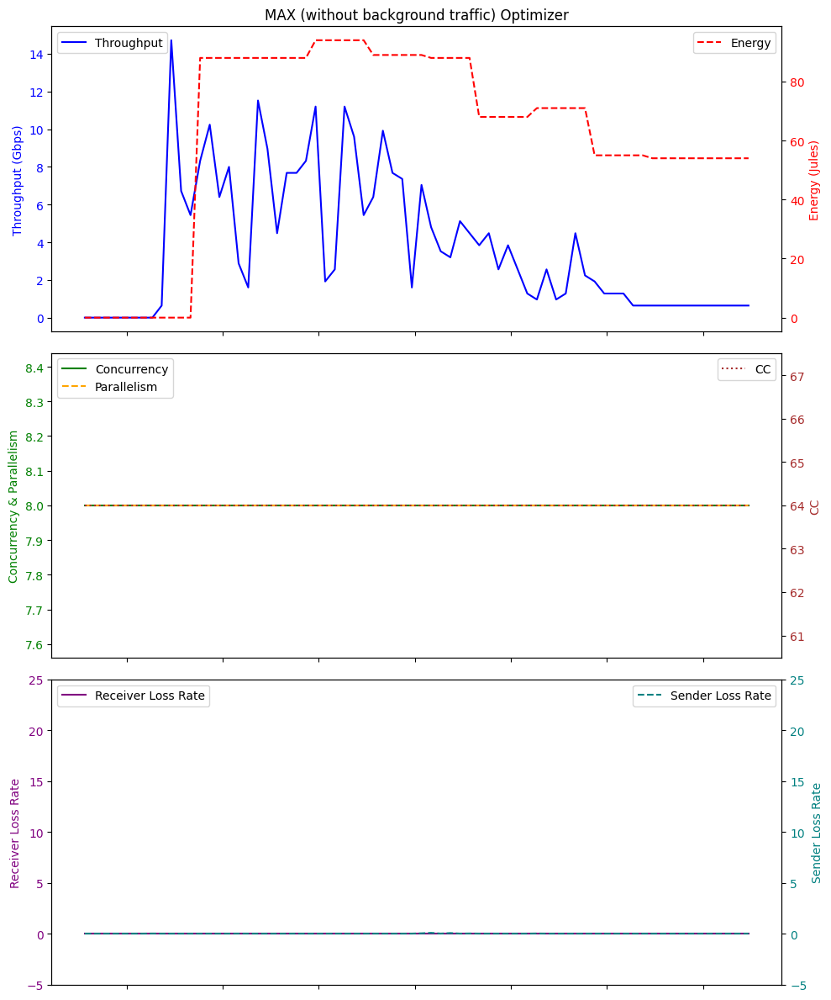

Average Throughput: 3.7394285714285704
Total Energy: 4352.0
Total loss rate: 0.1809108233726568
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 03:10:45.426558        0.00          0.0  64    0.0   0.0   
1   2024-01-19 03:10:46.422351        0.00          0.0  64    0.0   0.0   
2   2024-01-19 03:10:47.424870        0.00          0.0  64    0.0  32.7   
3   2024-01-19 03:10:48.425357        0.00          0.0  64    0.0  32.8   
4   2024-01-19 03:10:49.424560        0.00          0.0  64    0.0  32.8   
..                         ...         ...          ...  ..    ...   ...   
105 2024-01-19 03:12:30.531821        0.32          0.0  64    0.0  32.7   
106 2024-01-19 03:12:31.532864        0.32          0.0  64    0.0  32.6   
107 2024-01-19 03:12:32.534575        0.32          0.0  64    0.0  32.6   
108 2024-01-19 03:12:33.534572        0.32          0.0  64    0.0  32.6   
109 2024-01-19 03:12:34.536907        0.32          0.0  64    0.0  

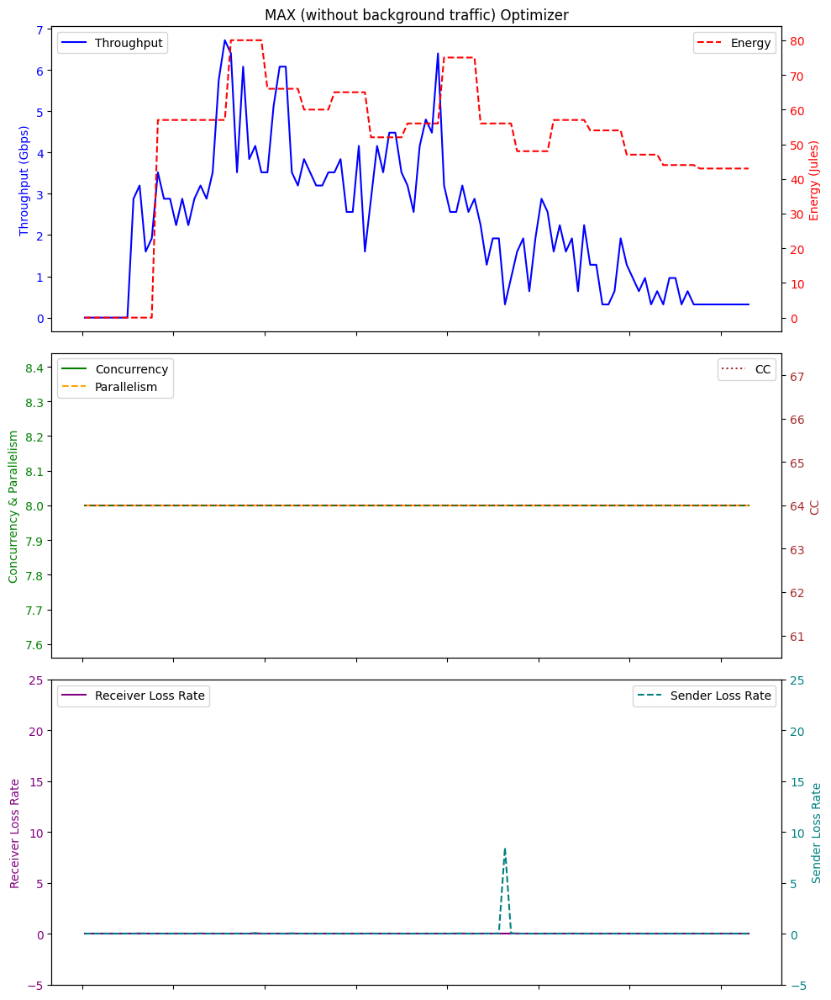

Average Throughput: 2.3156363636363633
Total Energy: 5571.0
Total loss rate: 8.79908855408022
                         Time  Throughput  receiver_lr  CC  Score   RTT  \
0  2024-01-19 03:28:33.362980        0.00          0.0  64    0.0   0.0   
1  2024-01-19 03:28:34.357337        0.00          0.0  64    0.0   0.0   
2  2024-01-19 03:28:35.357527        0.00          0.0  64    0.0  32.8   
3  2024-01-19 03:28:36.361059        0.00          0.0  64    0.0  32.6   
4  2024-01-19 03:28:37.360616        0.00          0.0  64    0.0  32.7   
..                        ...         ...          ...  ..    ...   ...   
95 2024-01-19 03:30:08.453742        0.32          0.0  64    0.0  32.6   
96 2024-01-19 03:30:09.453072        0.32          0.0  64    0.0  32.7   
97 2024-01-19 03:30:10.453777        0.32          0.0  64    0.0  32.6   
98 2024-01-19 03:30:11.453008        0.32          0.0  64    0.0  32.8   
99 2024-01-19 03:30:12.456692        0.32          0.0  64    0.0  32.6   

    E

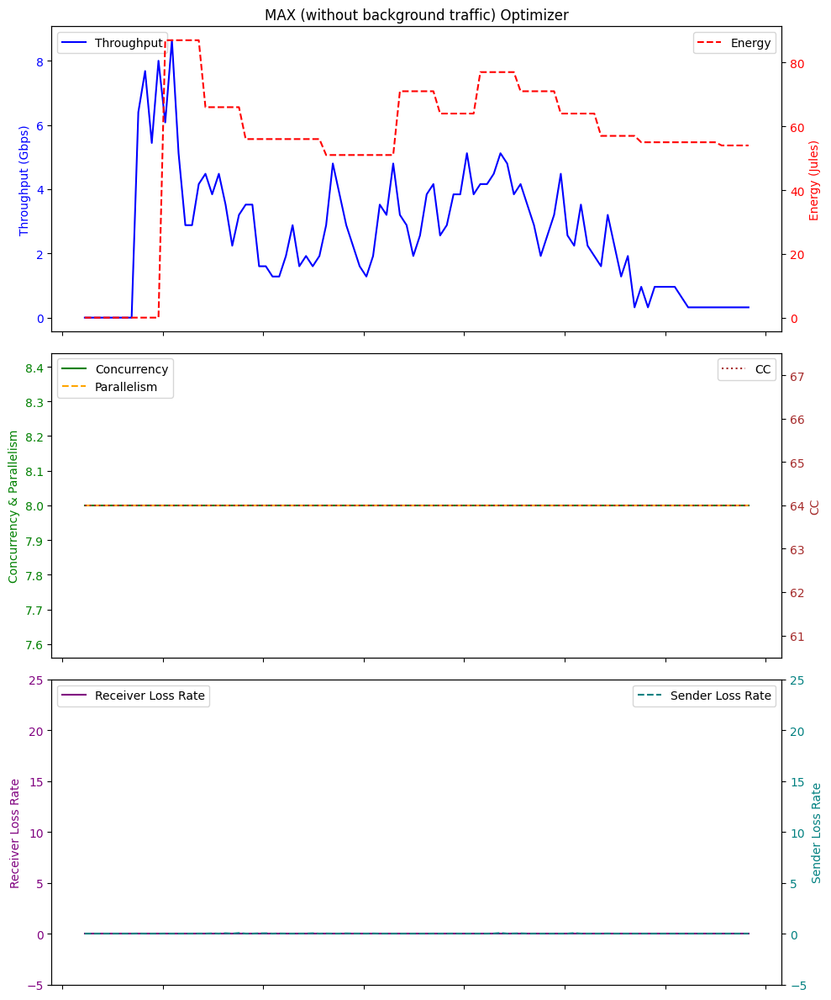

Average Throughput: 2.5856
Total Energy: 5505.0
Total loss rate: 0.4393323982909738


In [7]:
# Example usage MAX
directory = './logFileDir/MAX/'
dfs = process_log_files(directory,"MAX_logFile_")

max_throughput_list=[]
max_energy_list=[]
max_plr_list=[]
# Print or process the dataframes as needed
for df in dfs:
    print(df)
    # Plotting
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)


    # Top plot with Throughput and Energy
    ax1.plot(df['Time'], df['Throughput'], label='Throughput', color='blue')
    ax1.set_ylabel('Throughput (Gbps)', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_title('MAX (without background traffic) Optimizer')

    ax2_twin = ax1.twinx()
    ax2_twin.plot(df['Time'], df['Energy'], label='Energy', color='red', linestyle='--')
    ax2_twin.set_ylabel('Energy (Jules)', color='red')
    ax2_twin.tick_params(axis='y', labelcolor='red')

    # Bottom plot with Concurrency, Parallelism, and CC
    ax2.plot(df['Time'], df['concurrency'], label='Concurrency', color='green')
    ax2.plot(df['Time'], df['parallelism'], label='Parallelism', color='orange', linestyle='--')
    ax2.set_ylabel('Concurrency & Parallelism', color='green')
    ax2.tick_params(axis='y', labelcolor='green')

    ax3_twin = ax2.twinx()
    ax3_twin.plot(df['Time'], df['CC'], label='CC', color='brown', linestyle=':')
    ax3_twin.set_ylabel('CC', color='brown')
    ax3_twin.tick_params(axis='y', labelcolor='brown')
    
    # Bottom plot with Receiver Loss Rate and Sender Loss Rate
    ax3.plot(df['Time'], df['receiver_lr'], label='Receiver Loss Rate', color='purple', linestyle='-')
    ax3.set_ylabel('Receiver Loss Rate', color='purple')
    ax3.tick_params(axis='y', labelcolor='purple')

    ax4_twin = ax3.twinx()
    ax4_twin.plot(df['Time'], df['sender_lr'], label='Sender Loss Rate', color='teal', linestyle='--')
    ax4_twin.set_ylabel('Sender Loss Rate', color='teal')
    ax4_twin.tick_params(axis='y', labelcolor='teal')
    ax4_twin.set_ylim(-5,25)

    ax3.set_ylim(-5,25)

    # Formatting the x-axis to show time correctly
#     ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: (datetime.min + timedelta(seconds=x)).strftime('%H:%M:%S')))
#     ax2.set_xticklabels([])
    ax1.set_xticklabels([])
    ax2.set_xticklabels([])
    # Fix for overlapping layouts
    fig.tight_layout()

    # Legend
    ax1.legend(loc='upper left')
    ax2_twin.legend(loc='upper right')
    ax2.legend(loc='upper left')
    ax3_twin.legend(loc='upper right')
    ax3.legend(loc='upper left')
    ax4_twin.legend(loc='upper right')
    plt.show()

    average_throughput = df['Throughput'].mean()
    print("Average Throughput:", average_throughput)
    total_energy = df['Energy'].sum()
    print("Total Energy:", total_energy)
    total_plr = df['sender_lr'].sum()
    print("Total loss rate:", total_plr)
    
    max_throughput_list.append(average_throughput)
    max_energy_list.append(total_energy)
    max_plr_list.append(total_plr)


                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 22:35:56.516982        0.00          0.0   1    0.0   0.0   
1   2024-01-18 22:35:57.512996        0.00          0.0   1    0.0   0.0   
2   2024-01-18 22:35:58.513454        0.00          0.0   1    0.0  32.7   
3   2024-01-18 22:35:59.515791        0.00          0.0   1    0.0  32.6   
4   2024-01-18 22:36:00.515580        0.00          0.0   1    0.0  32.7   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-18 22:44:12.039079        0.64          0.0   1    1.0  32.9   
496 2024-01-18 22:44:13.040277        0.64          0.0   1    0.0  32.7   
497 2024-01-18 22:44:14.040560        0.64          0.0   1    0.0  32.7   
498 2024-01-18 22:44:15.041711        0.64          0.0   1    1.0  32.7   
499 2024-01-18 22:44:16.045573        0.32          0.0   1    0.0  32.6   

     Energy  sender_lr  concurrency  parallelism  
0       0.0        0.0            1 

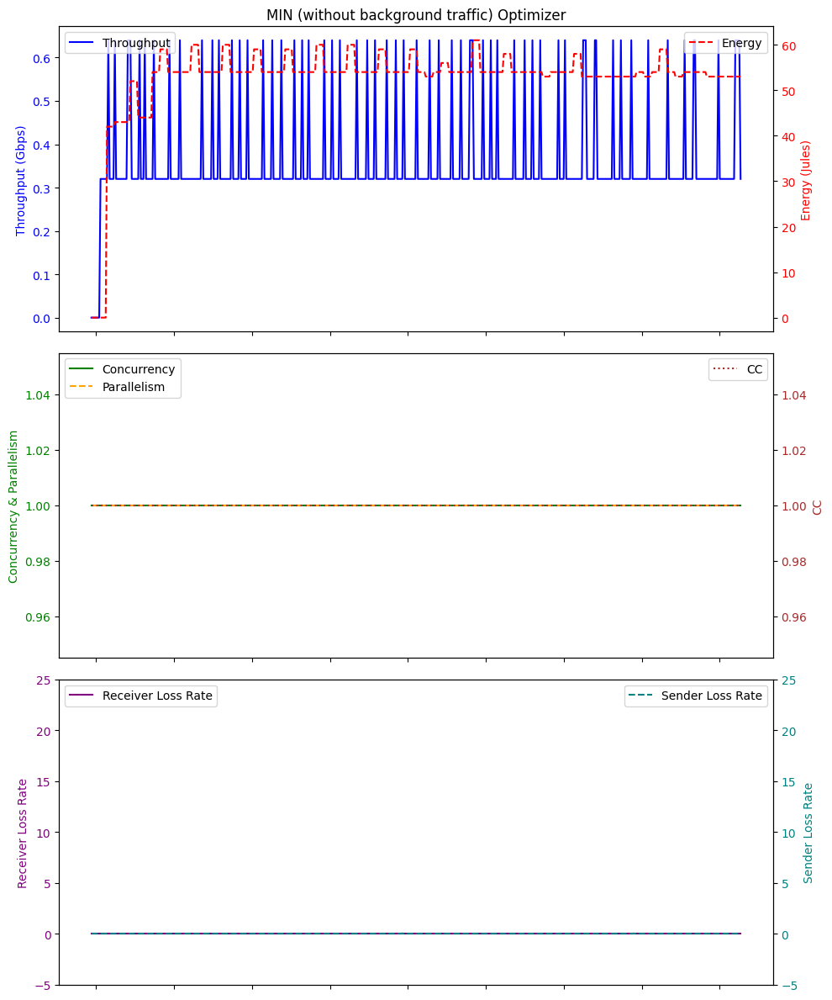

Average Throughput: 0.35775999999999997
Total Energy: 26359.0
Total loss rate: 0.0593966373512126
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 23:15:58.389508        0.00          0.0   1    0.0   0.0   
1   2024-01-18 23:15:59.385268        0.00          0.0   1    0.0   0.0   
2   2024-01-18 23:16:00.385511        0.00          0.0   1    0.0  32.6   
3   2024-01-18 23:16:01.388181        0.00          0.0   1    0.0  32.8   
4   2024-01-18 23:16:02.388605        0.00          0.0   1    0.0  33.6   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-18 23:24:13.916271        0.64          0.0   1    1.0  32.8   
496 2024-01-18 23:24:14.918894        0.32          0.0   1    0.0  32.8   
497 2024-01-18 23:24:15.922207        0.32          0.0   1    0.0  32.7   
498 2024-01-18 23:24:16.921358        0.32          0.0   1    0.0  32.7   
499 2024-01-18 23:24:17.921858        0.32          0.0   1    0.0

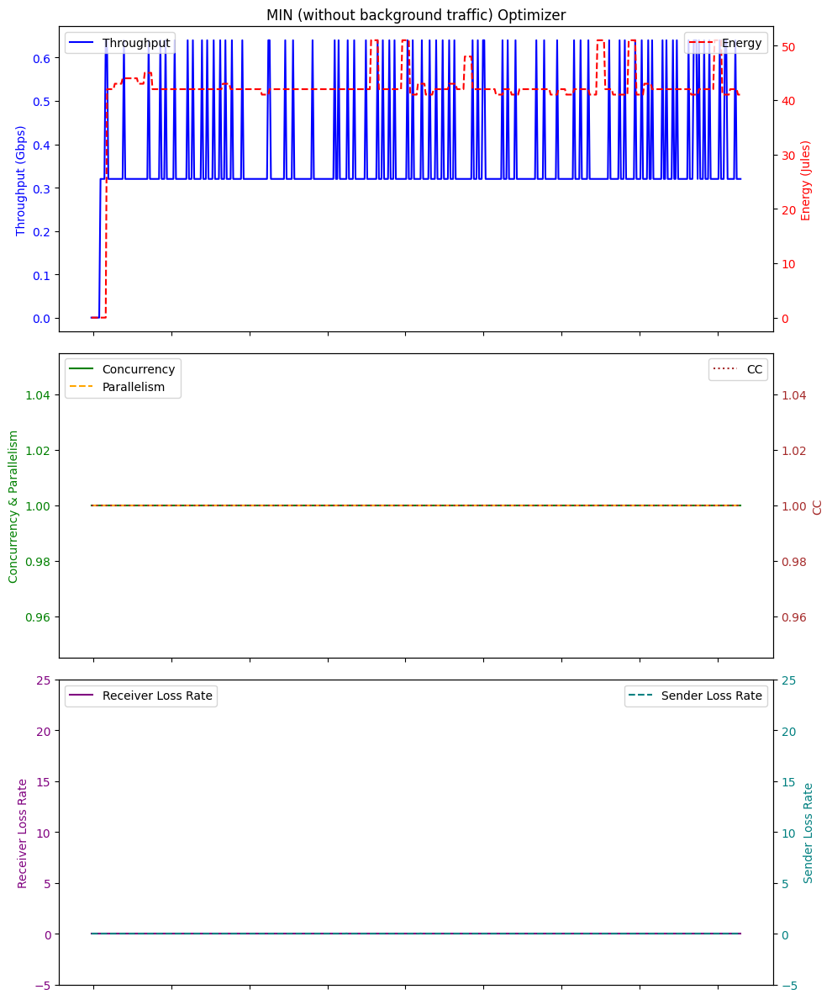

Average Throughput: 0.36224
Total Energy: 20798.0
Total loss rate: 0.05232691131179041
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 02:52:19.592834        0.00          0.0   1    0.0   0.0   
1   2024-01-19 02:52:20.585690        0.00          0.0   1    0.0   0.0   
2   2024-01-19 02:52:21.587677        0.00          0.0   1    0.0  33.0   
3   2024-01-19 02:52:22.589980        0.00          0.0   1    0.0  32.8   
4   2024-01-19 02:52:23.588894        0.00          0.0   1    0.0  33.9   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-19 03:00:35.121389        0.32          0.0   1    0.0  32.7   
496 2024-01-19 03:00:36.121416        0.32          0.0   1    0.0  33.3   
497 2024-01-19 03:00:37.121996        0.32          0.0   1    0.0  32.8   
498 2024-01-19 03:00:38.122958        0.32          0.0   1    0.0  33.1   
499 2024-01-19 03:00:39.125103        0.64          0.0   1    1.0  32.6   



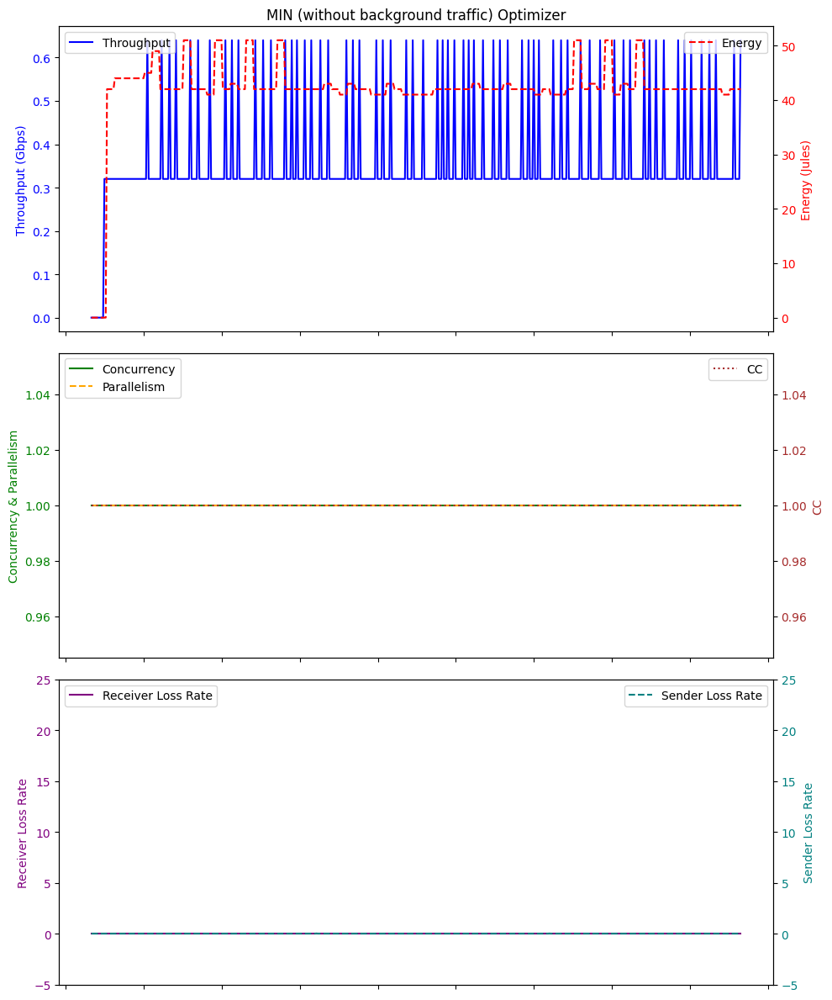

Average Throughput: 0.35520000000000007
Total Energy: 20950.0
Total loss rate: 0.03959951115890038
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 01:49:09.411122        0.00          0.0   1    0.0   0.0   
1   2024-01-19 01:49:10.406632        0.00          0.0   1    0.0   0.0   
2   2024-01-19 01:49:11.408940        0.00          0.0   1    0.0  32.8   
3   2024-01-19 01:49:12.409379        0.00          0.0   1    0.0  32.8   
4   2024-01-19 01:49:13.409798        0.00          0.0   1    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-19 01:57:24.934473        0.64          0.0   1    1.0  33.0   
496 2024-01-19 01:57:25.936302        0.32          0.0   1    0.0  32.9   
497 2024-01-19 01:57:26.936589        0.32          0.0   1    0.0  32.7   
498 2024-01-19 01:57:27.937907        0.32          0.0   1    0.0  32.6   
499 2024-01-19 01:57:28.939660        0.32          0.0   1    0.

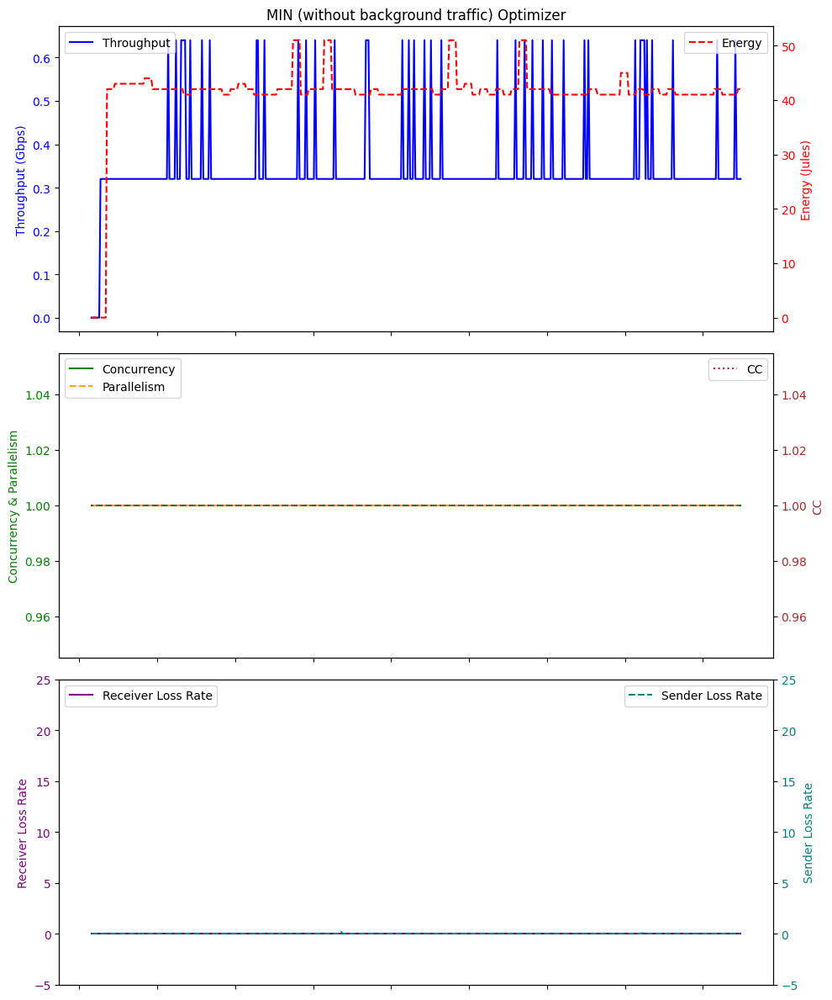

Average Throughput: 0.34368
Total Energy: 20579.0
Total loss rate: 0.38524062272375215
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 03:12:37.677427        0.00          0.0   1    0.0   0.0   
1   2024-01-19 03:12:38.670527        0.00          0.0   1    0.0   0.0   
2   2024-01-19 03:12:39.670269        0.00          0.0   1    0.0  32.9   
3   2024-01-19 03:12:40.670995        0.00          0.0   1    0.0  32.8   
4   2024-01-19 03:12:41.673380        0.00          0.0   1    0.0  32.9   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-19 03:20:53.200686        0.64          0.0   1    1.0  32.6   
496 2024-01-19 03:20:54.203337        0.32          0.0   1    0.0  32.9   
497 2024-01-19 03:20:55.203251        0.32          0.0   1    0.0  32.7   
498 2024-01-19 03:20:56.203236        0.32          0.0   1    0.0  32.7   
499 2024-01-19 03:20:57.207820        0.32          0.0   1    0.0  32.6   



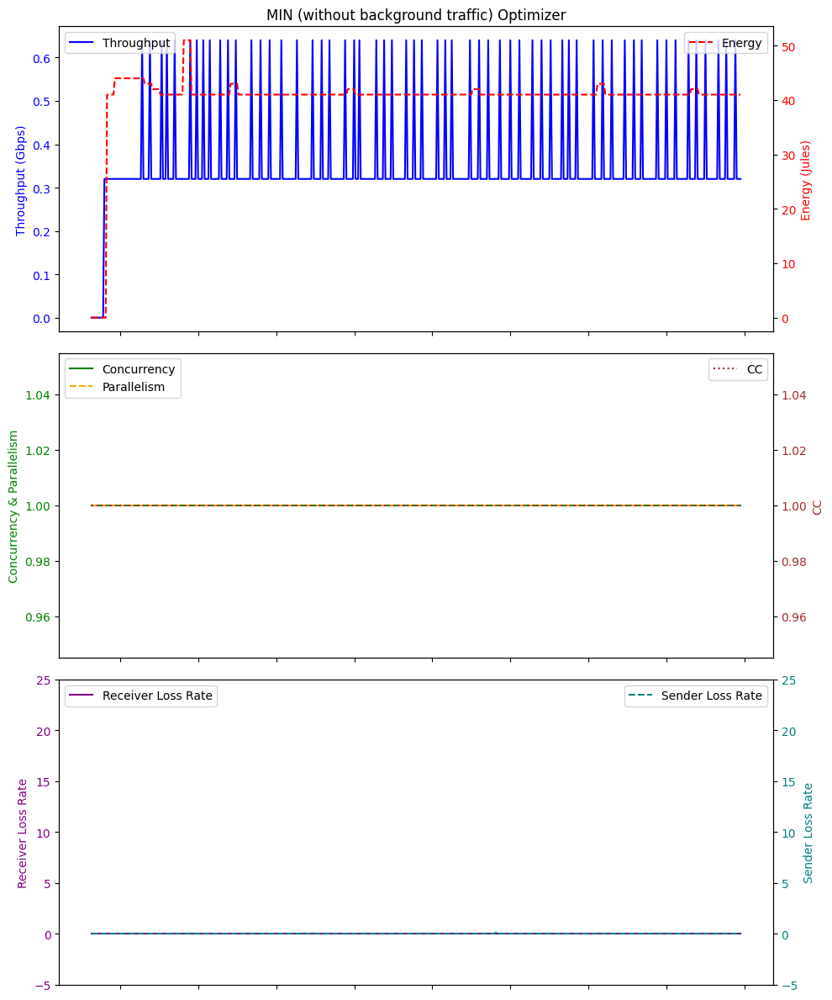

Average Throughput: 0.35136
Total Energy: 20197.0
Total loss rate: 0.2108687574339669
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 01:32:18.058496        0.00          0.0   1    0.0   0.0   
1   2024-01-19 01:32:19.053787        0.00          0.0   1    0.0   0.0   
2   2024-01-19 01:32:20.054999        0.00          0.0   1    0.0  32.6   
3   2024-01-19 01:32:21.057766        0.00          0.0   1    0.0  32.6   
4   2024-01-19 01:32:22.057056        0.00          0.0   1    0.0  32.7   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-19 01:40:33.588209        0.32          0.0   1    0.0  32.7   
496 2024-01-19 01:40:34.587601        0.32          0.0   1    0.0  32.6   
497 2024-01-19 01:40:35.587766        0.32          0.0   1    0.0  32.8   
498 2024-01-19 01:40:36.589991        0.32          0.0   1    0.0  32.6   
499 2024-01-19 01:40:37.591174        0.32          0.0   1    0.0  32.6   

 

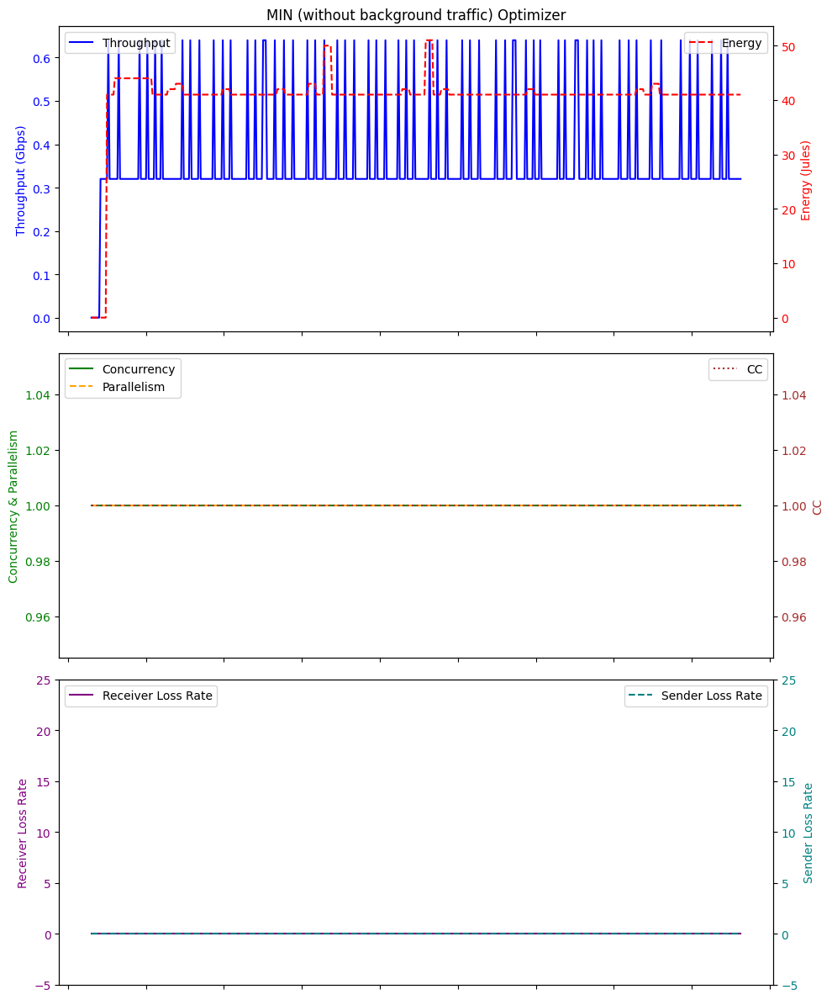

Average Throughput: 0.35712
Total Energy: 20287.0
Total loss rate: 0.018923971152402776
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 04:20:49.417522        0.00          0.0   1    0.0   0.0   
1   2024-01-19 04:20:50.414303        0.00          0.0   1    0.0   0.0   
2   2024-01-19 04:20:51.416073        0.00          0.0   1    0.0  32.6   
3   2024-01-19 04:20:52.414916        0.00          0.0   1    0.0  32.7   
4   2024-01-19 04:20:53.415409        0.00          0.0   1    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-19 04:29:04.942702        0.64          0.0   1    1.0  32.6   
496 2024-01-19 04:29:05.943682        0.32          0.0   1    0.0  32.7   
497 2024-01-19 04:29:06.942466        0.32          0.0   1    0.0  32.7   
498 2024-01-19 04:29:07.945699        0.32          0.0   1    0.0  32.6   
499 2024-01-19 04:29:08.946864        0.32          0.0   1    0.0  32.7   


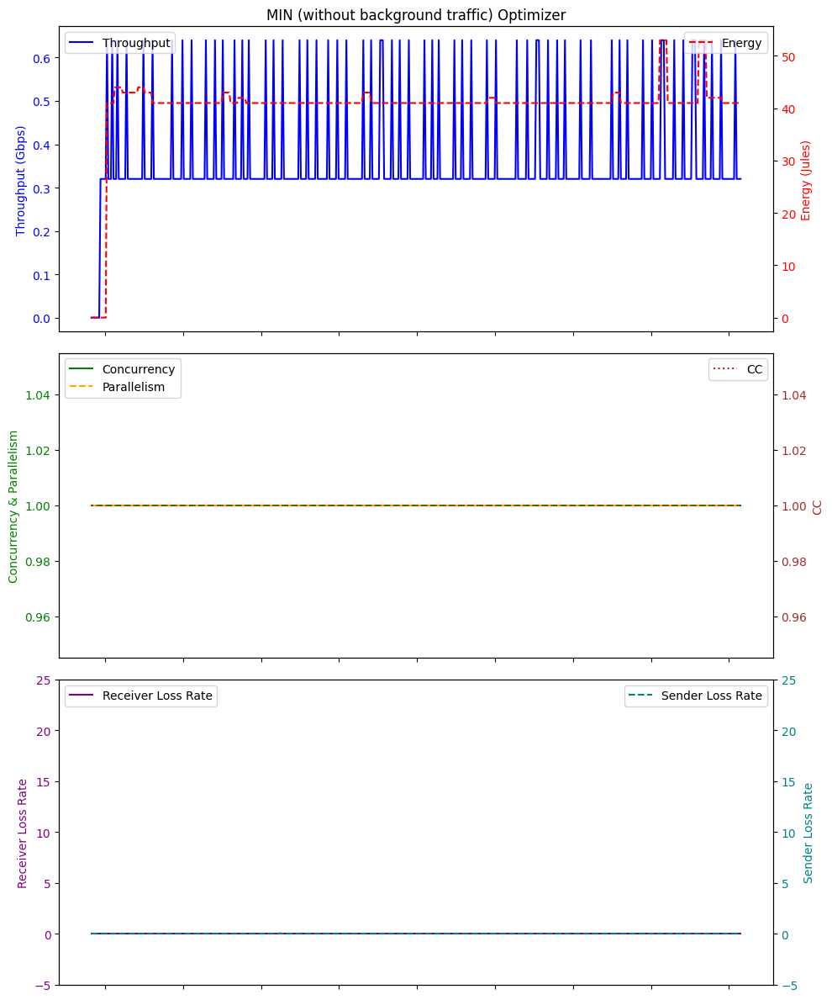

Average Throughput: 0.3584
Total Energy: 20281.0
Total loss rate: 0.11649648003712917
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 01:12:25.355831        0.00          0.0   1    0.0   0.0   
1   2024-01-19 01:12:26.351471        0.00          0.0   1    0.0   0.0   
2   2024-01-19 01:12:27.354126        0.00          0.0   1    0.0  32.7   
3   2024-01-19 01:12:28.354436        0.00          0.0   1    0.0  32.6   
4   2024-01-19 01:12:29.355543        0.00          0.0   1    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-19 01:20:40.878489        0.64          0.0   1    1.0  32.7   
496 2024-01-19 01:20:41.881817        0.32          0.0   1    0.0  32.7   
497 2024-01-19 01:20:42.878181        0.32          0.0   1    0.0  32.7   
498 2024-01-19 01:20:43.881838        0.32          0.0   1    0.0  32.7   
499 2024-01-19 01:20:44.882853        0.32          0.0   1    0.0  32.8   

 

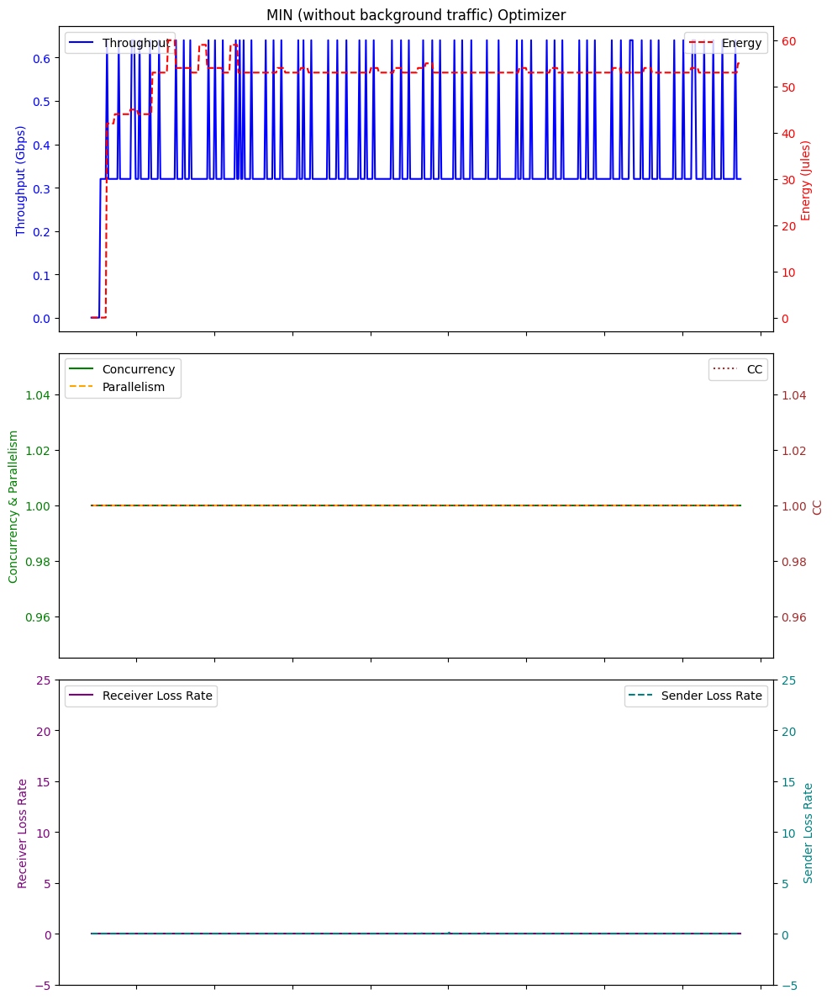

Average Throughput: 0.35840000000000005
Total Energy: 25759.0
Total loss rate: 0.17955311071265637
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 23:55:00.550729        0.00          0.0   1    0.0   0.0   
1   2024-01-18 23:55:01.555223        0.00          0.0   1    0.0   0.0   
2   2024-01-18 23:55:02.555890        0.00          0.0   1    0.0  32.7   
3   2024-01-18 23:55:03.557674        0.00          0.0   1    0.0  32.8   
4   2024-01-18 23:55:04.560605        0.00          0.0   1    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-19 00:03:16.083722        0.32          0.0   1    0.0  32.7   
496 2024-01-19 00:03:17.085087        0.32          0.0   1    0.0  32.6   
497 2024-01-19 00:03:18.087263        0.32          0.0   1    0.0  32.6   
498 2024-01-19 00:03:19.087626        0.64          0.0   1    1.0  32.8   
499 2024-01-19 00:03:20.087822        0.32          0.0   1    0.

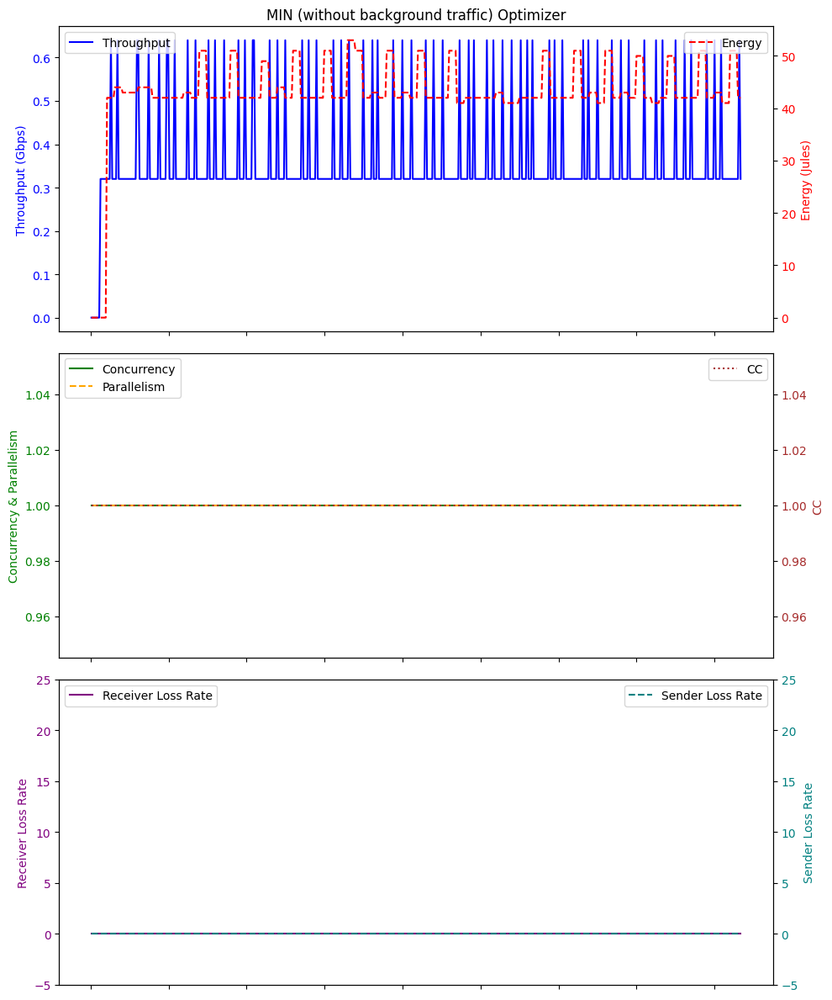

Average Throughput: 0.35712
Total Energy: 21466.0
Total loss rate: 0.027831501857213302
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 00:57:25.401306        0.00          0.0   1    0.0   0.0   
1   2024-01-19 00:57:26.396628        0.00          0.0   1    0.0   0.0   
2   2024-01-19 00:57:27.398920        0.00          0.0   1    0.0  32.6   
3   2024-01-19 00:57:28.399891        0.00          0.0   1    0.0  32.6   
4   2024-01-19 00:57:29.399656        0.00          0.0   1    0.0  32.9   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-19 01:05:40.929046        0.32          0.0   1    0.0  32.6   
496 2024-01-19 01:05:41.931576        0.32          0.0   1    0.0  33.3   
497 2024-01-19 01:05:42.931564        0.32          0.0   1    0.0  32.7   
498 2024-01-19 01:05:43.934136        0.32          0.0   1    0.0  32.7   
499 2024-01-19 01:05:44.933038        0.32          0.0   1    0.0  32.6   


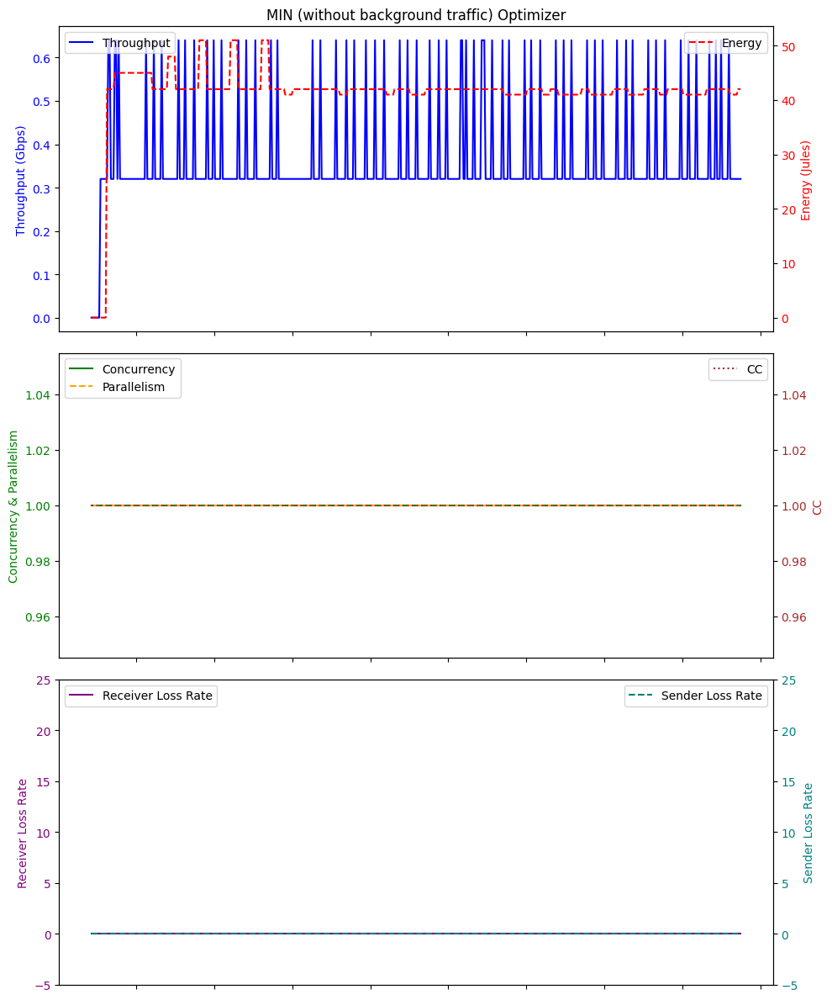

Average Throughput: 0.35712
Total Energy: 20649.0
Total loss rate: 0.019246657215695635
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 23:34:08.370904        0.00          0.0   1    0.0   0.0   
1   2024-01-18 23:34:09.366879        0.00          0.0   1    0.0   0.0   
2   2024-01-18 23:34:10.367156        0.00          0.0   1    0.0  33.0   
3   2024-01-18 23:34:11.370399        0.00          0.0   1    0.0  32.7   
4   2024-01-18 23:34:12.370360        0.00          0.0   1    0.0  33.0   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-18 23:42:23.897283        0.32          0.0   1    0.0  32.9   
496 2024-01-18 23:42:24.897231        0.32          0.0   1    0.0  32.9   
497 2024-01-18 23:42:25.898426        0.64          0.0   1    1.0  32.6   
498 2024-01-18 23:42:26.900061        0.32          0.0   1    0.0  33.0   
499 2024-01-18 23:42:27.900253        0.32          0.0   1    0.0  32.6   


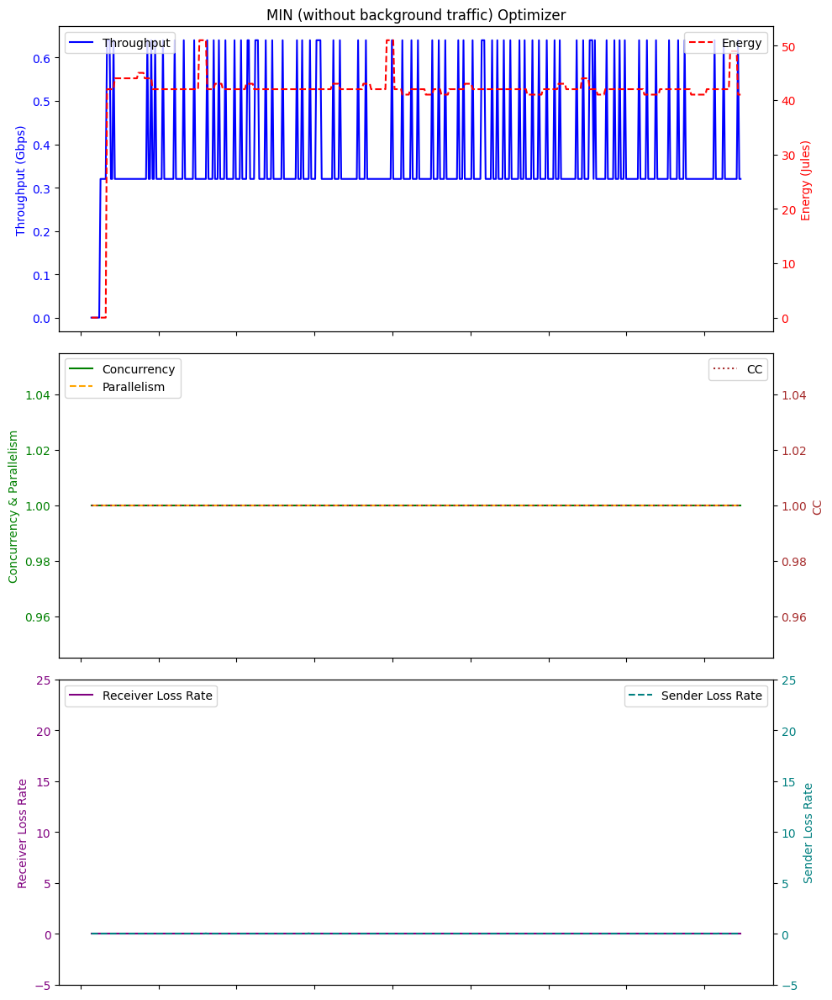

Average Throughput: 0.36607999999999996
Total Energy: 20694.0
Total loss rate: 0.13508257700040724
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 02:11:41.478964        0.00          0.0   1    0.0   0.0   
1   2024-01-19 02:11:42.472492        0.00          0.0   1    0.0   0.0   
2   2024-01-19 02:11:43.473945        0.00          0.0   1    0.0  33.1   
3   2024-01-19 02:11:44.473756        0.00          0.0   1    0.0  35.4   
4   2024-01-19 02:11:45.476657        0.00          0.0   1    0.0  35.8   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-19 02:19:57.005358        0.32          0.0   1    0.0  33.9   
496 2024-01-19 02:19:58.004404        0.32          0.0   1    0.0  37.4   
497 2024-01-19 02:19:59.005099        0.32          0.0   1    0.0  34.7   
498 2024-01-19 02:20:00.008987        0.32          0.0   1    0.0  36.3   
499 2024-01-19 02:20:01.007933        0.32          0.0   1    0.

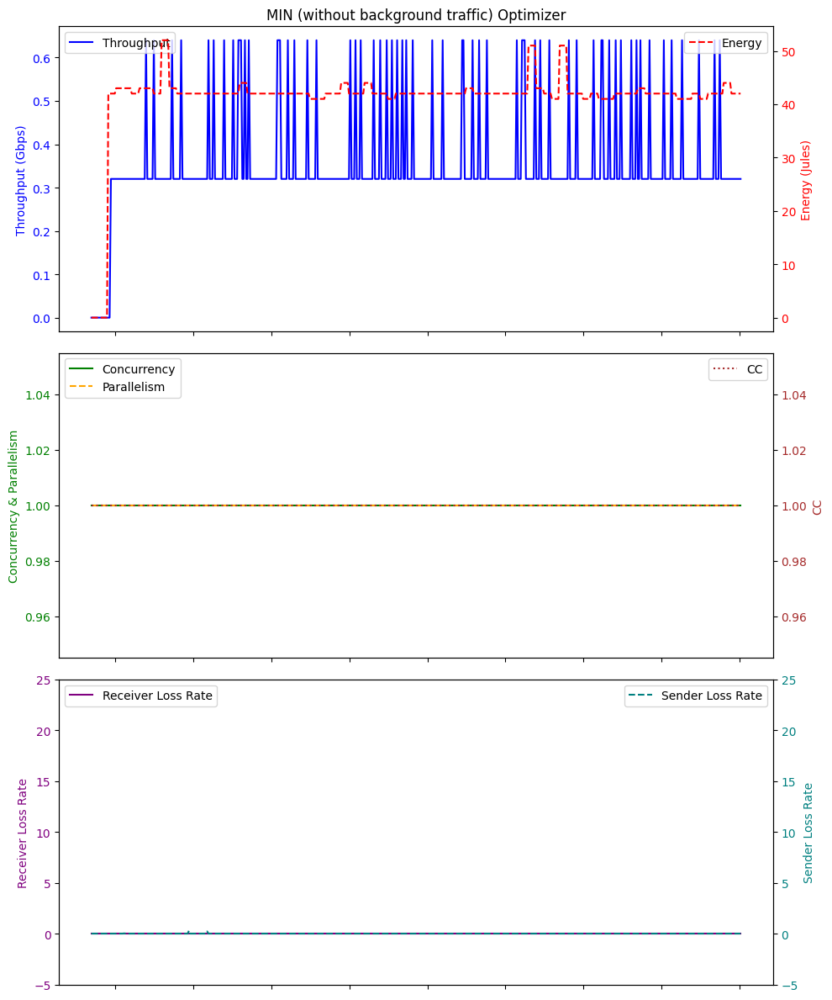

Average Throughput: 0.35072
Total Energy: 20657.0
Total loss rate: 0.5775246024125855
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 02:35:20.002449        0.00          0.0   1    0.0   0.0   
1   2024-01-19 02:35:20.997416        0.00          0.0   1    0.0   0.0   
2   2024-01-19 02:35:22.000504        0.00          0.0   1    0.0  32.7   
3   2024-01-19 02:35:23.001065        0.00          0.0   1    0.0  32.7   
4   2024-01-19 02:35:24.000611        0.00          0.0   1    0.0  32.7   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-19 02:43:35.526153        0.32          0.0   1    0.0  32.7   
496 2024-01-19 02:43:36.528894        0.32          0.0   1    0.0  32.7   
497 2024-01-19 02:43:37.530051        0.32          0.0   1    0.0  32.7   
498 2024-01-19 02:43:38.538371        0.32          0.0   1    0.0  32.8   
499 2024-01-19 02:43:39.533267        0.32          0.0   1    0.0  32.7   

 

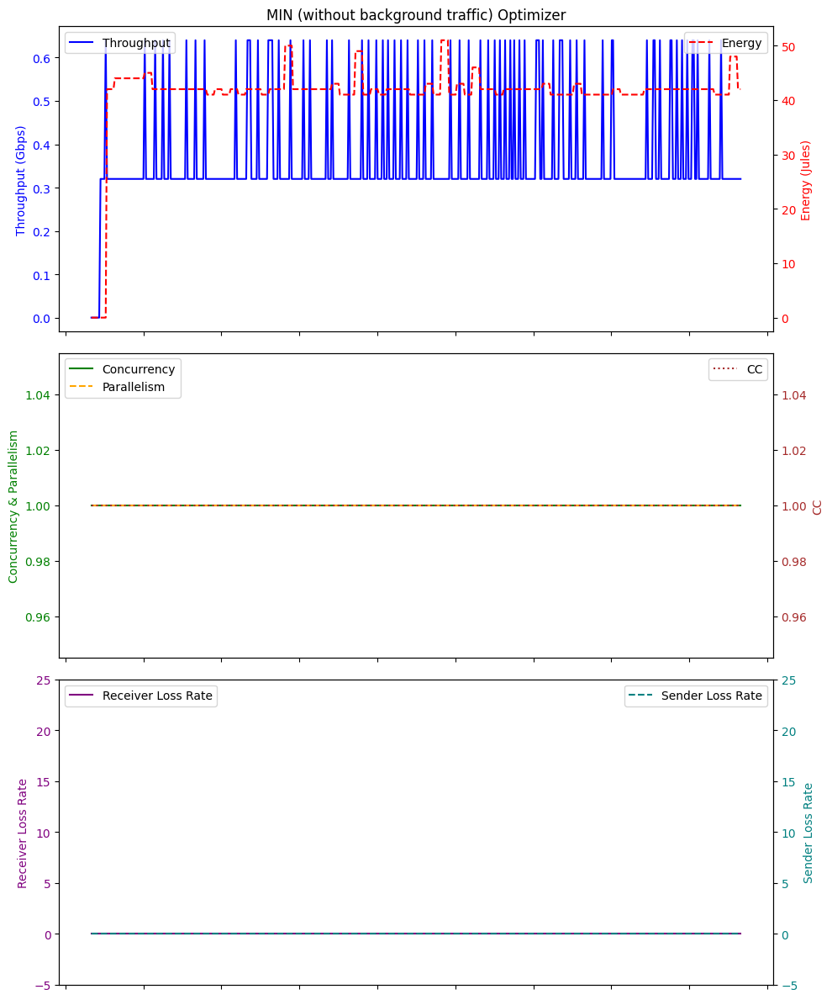

Average Throughput: 0.36351999999999995
Total Energy: 20638.0
Total loss rate: 0.06858535125931445
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 03:30:19.956492        0.00          0.0   1    0.0   0.0   
1   2024-01-19 03:30:20.954756        0.00          0.0   1    0.0   0.0   
2   2024-01-19 03:30:21.953522        0.00          0.0   1    0.0  32.7   
3   2024-01-19 03:30:22.955287        0.00          0.0   1    0.0  32.8   
4   2024-01-19 03:30:23.956437        0.00          0.0   1    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
489 2024-01-19 03:38:35.483136        0.32          0.0   1    0.0  32.7   
490 2024-01-19 03:38:36.484932        0.32          0.0   1    0.0  32.6   
491 2024-01-19 03:38:37.485761        0.32          0.0   1    0.0  32.6   
492 2024-01-19 03:38:38.486476        0.32          0.0   1    0.0  32.6   
493 2024-01-19 03:38:39.486826        0.32          0.0   1    0.

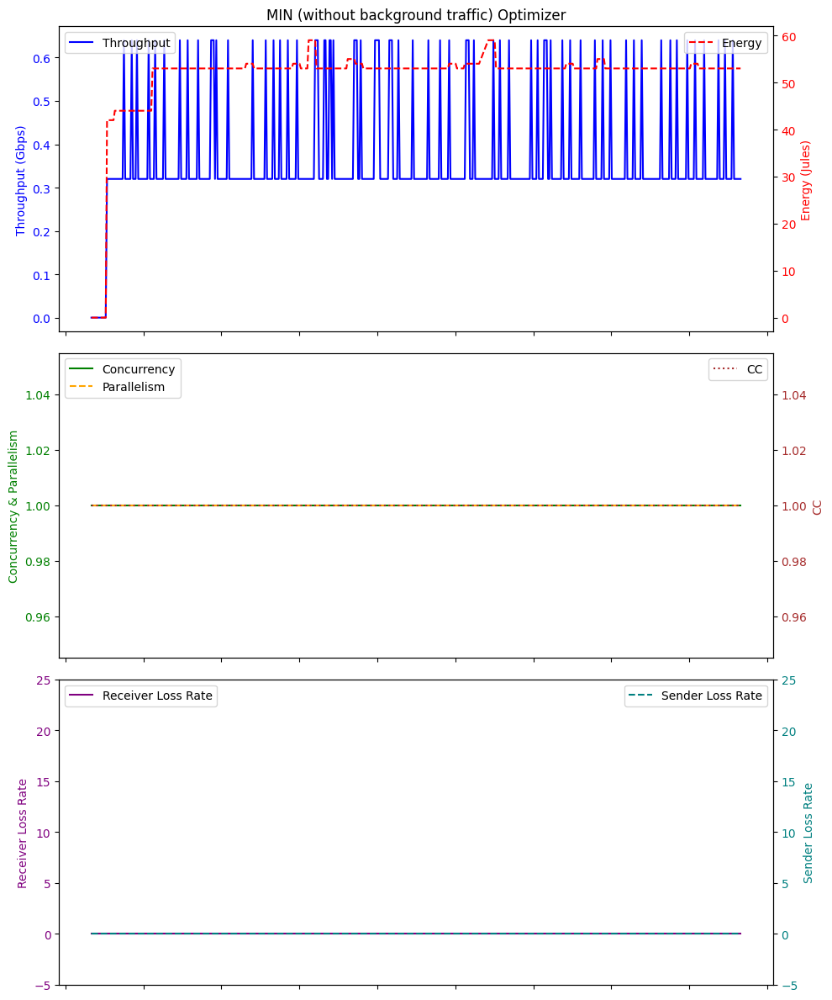

Average Throughput: 0.3608097165991903
Total Energy: 25363.0
Total loss rate: 0.011424492027626675
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 22:17:24.722226        0.00          0.0   1    0.0   0.0   
1   2024-01-18 22:17:25.721238        0.00          0.0   1    0.0   0.0   
2   2024-01-18 22:17:26.720478        0.00          0.0   1    0.0  32.7   
3   2024-01-18 22:17:27.720830        0.00          0.0   1    0.0  32.7   
4   2024-01-18 22:17:28.723528        0.00          0.0   1    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-18 22:25:40.251744        0.32          0.0   1    0.0  32.6   
496 2024-01-18 22:25:41.250473        0.32          0.0   1    0.0  32.7   
497 2024-01-18 22:25:42.253894        0.32          0.0   1    0.0  32.7   
498 2024-01-18 22:25:43.254139        0.32          0.0   1    0.0  32.7   
499 2024-01-18 22:25:44.253329        0.32          0.0   1    0.

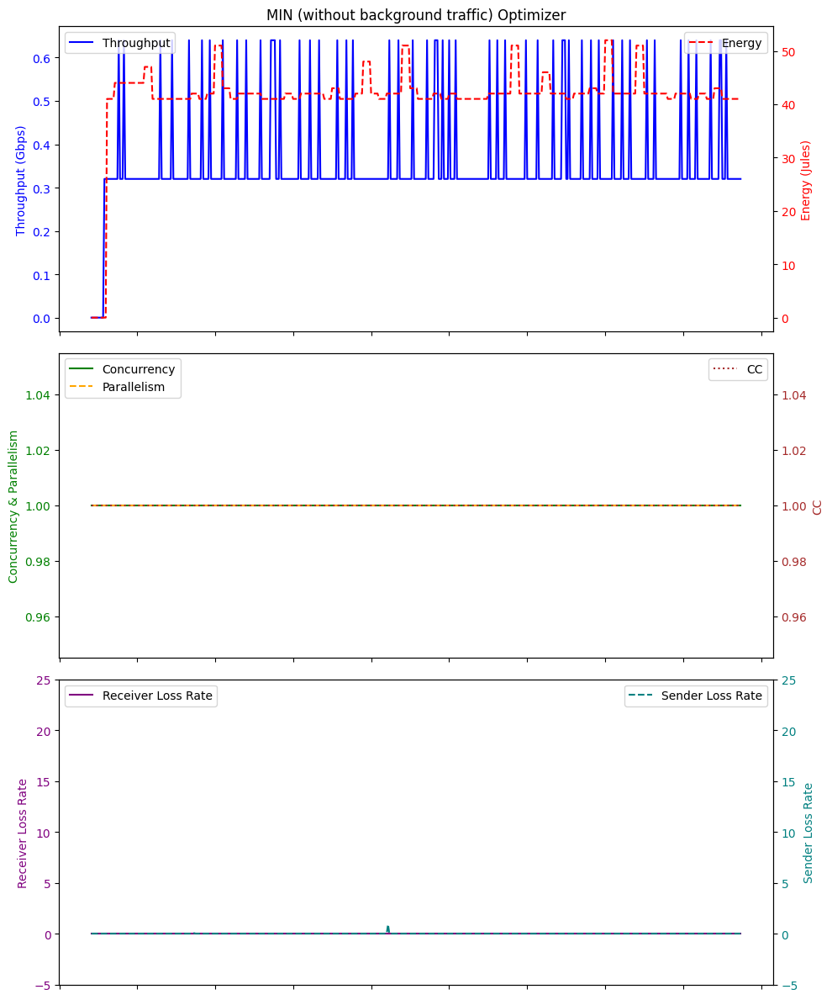

Average Throughput: 0.35008
Total Energy: 20761.0
Total loss rate: 1.0195142891771625
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 04:05:47.895180        0.00          0.0   1    0.0   0.0   
1   2024-01-19 04:05:48.890260        0.00          0.0   1    0.0   0.0   
2   2024-01-19 04:05:49.890247        0.00          0.0   1    0.0  32.6   
3   2024-01-19 04:05:50.890332        0.00          0.0   1    0.0  32.7   
4   2024-01-19 04:05:51.892547        0.00          0.0   1    0.0  32.7   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-19 04:14:03.409122        0.32          0.0   1    0.0  32.6   
496 2024-01-19 04:14:04.411073        0.64          0.0   1    1.0  32.8   
497 2024-01-19 04:14:05.409446        0.32          0.0   1    0.0  32.6   
498 2024-01-19 04:14:06.411744        0.32          0.0   1    0.0  33.1   
499 2024-01-19 04:14:07.412569        0.32          0.0   1    0.0  33.0   

 

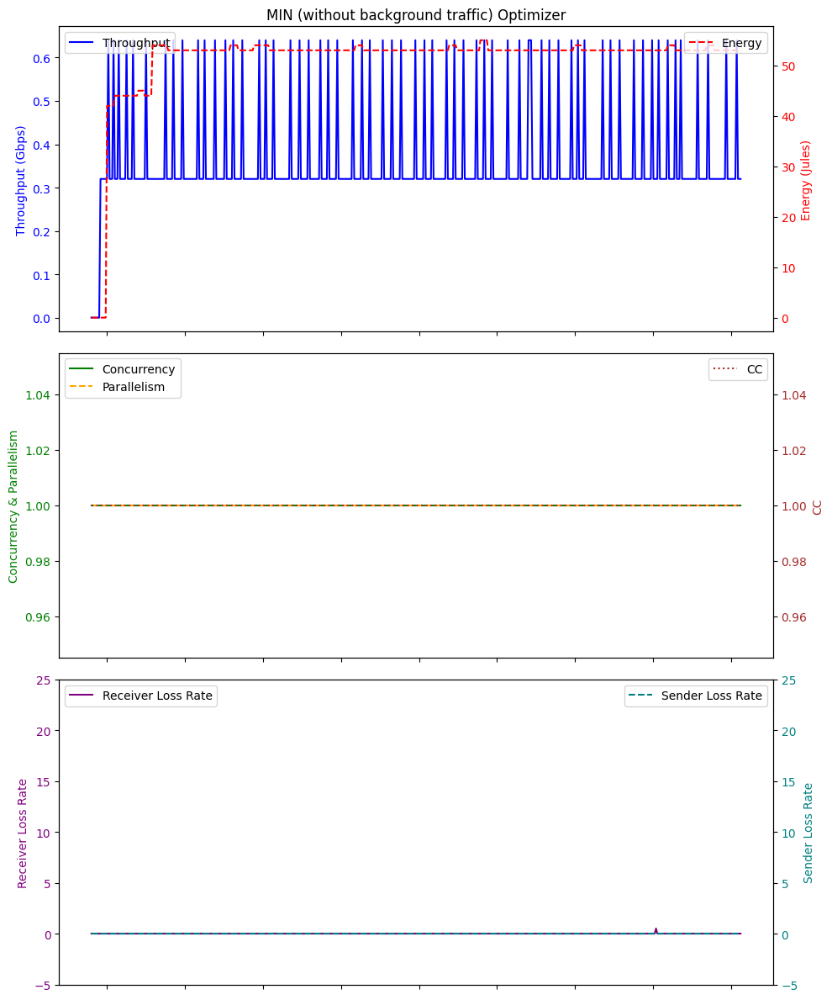

Average Throughput: 0.35648
Total Energy: 25614.0
Total loss rate: 0.07164500031423206
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 00:17:38.893458        0.00          0.0   1    0.0   0.0   
1   2024-01-19 00:17:39.888214        0.00          0.0   1    0.0   0.0   
2   2024-01-19 00:17:40.889095        0.00          0.0   1    0.0  34.1   
3   2024-01-19 00:17:41.891322        0.00          0.0   1    0.0  32.7   
4   2024-01-19 00:17:42.891299        0.00          0.0   1    0.0  32.8   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-19 00:25:54.415083        0.64          0.0   1    1.0  32.9   
496 2024-01-19 00:25:55.417969        0.32          0.0   1    0.0  33.2   
497 2024-01-19 00:25:56.418061        0.32          0.0   1    0.0  32.6   
498 2024-01-19 00:25:57.418969        0.32          0.0   1    0.0  32.6   
499 2024-01-19 00:25:58.421369        0.32          0.0   1    0.0  32.7   



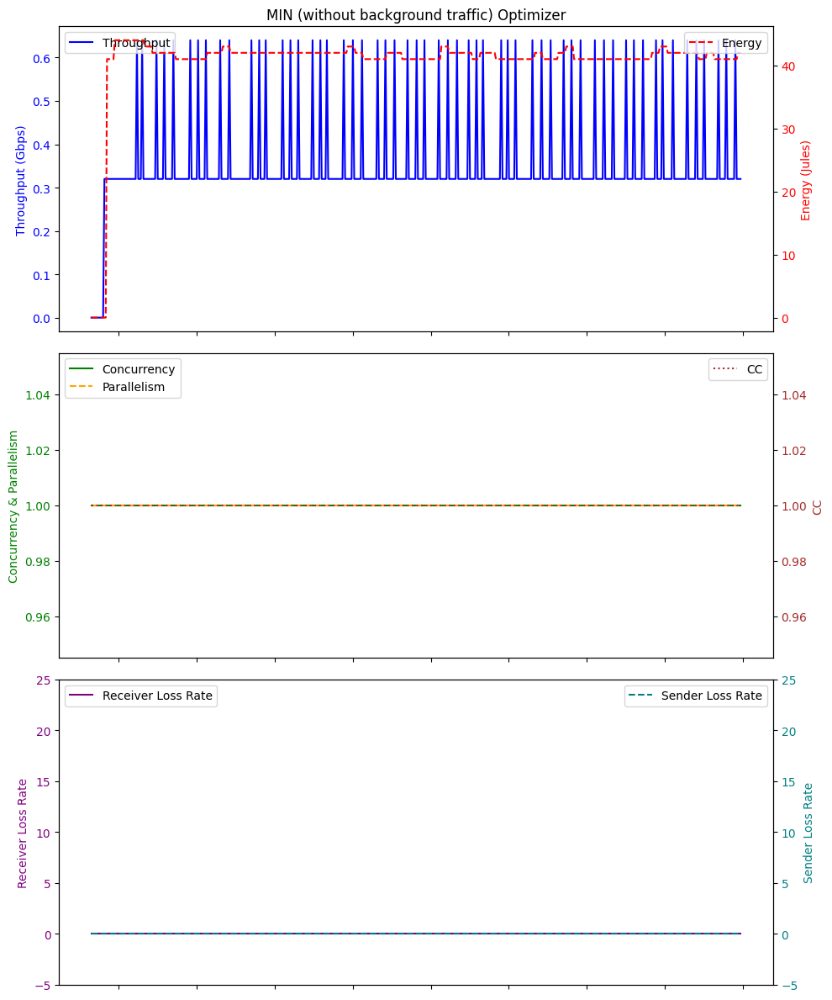

Average Throughput: 0.35072000000000003
Total Energy: 20368.0
Total loss rate: 0.062174461639823375
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 03:49:55.888125        0.00          0.0   1    0.0   0.0   
1   2024-01-19 03:49:56.883485        0.00          0.0   1    0.0   0.0   
2   2024-01-19 03:49:57.884350        0.00          0.0   1    0.0  32.6   
3   2024-01-19 03:49:58.886777        0.00          0.0   1    0.0  32.6   
4   2024-01-19 03:49:59.887045        0.00          0.0   1    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-19 03:58:11.409870        0.32          0.0   1    0.0  32.8   
496 2024-01-19 03:58:12.411594        0.64          0.0   1    1.0  33.1   
497 2024-01-19 03:58:13.411448        0.32          0.0   1    0.0  32.7   
498 2024-01-19 03:58:14.413946        0.32          0.0   1    0.0  32.6   
499 2024-01-19 03:58:15.414581        0.32          0.0   1    0

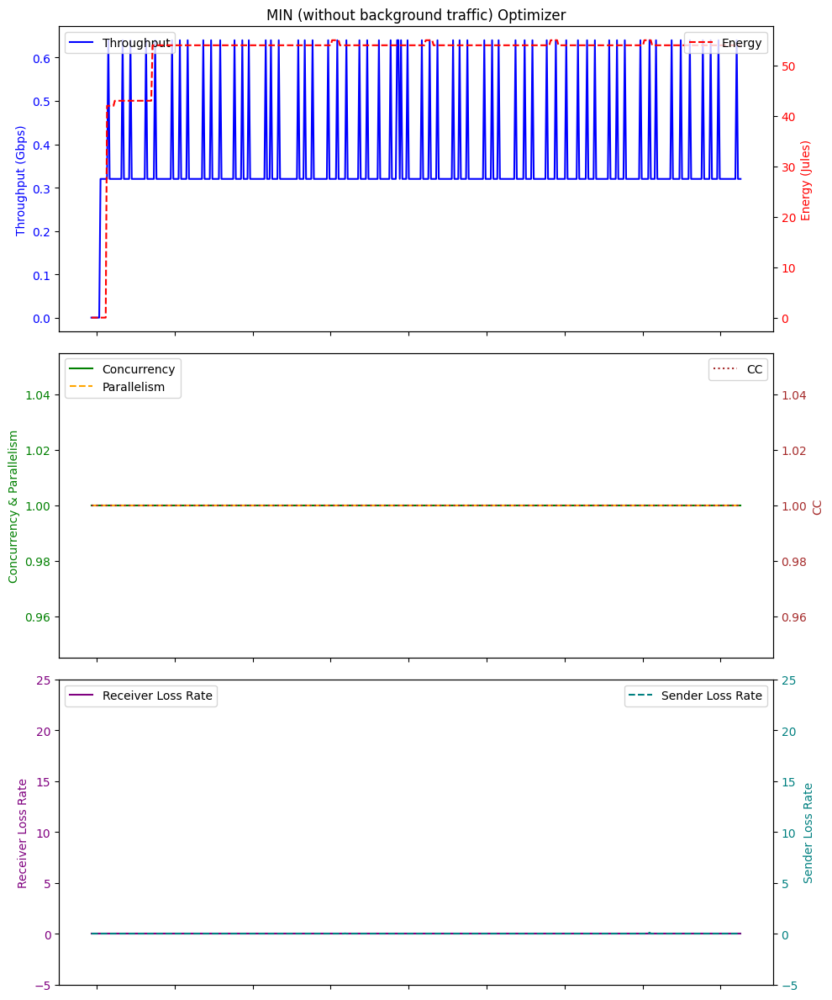

Average Throughput: 0.3552
Total Energy: 25985.0
Total loss rate: 0.11639719262269381
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-19 00:37:18.299382        0.00          0.0   1    0.0   0.0   
1   2024-01-19 00:37:19.297356        0.00          0.0   1    0.0   0.0   
2   2024-01-19 00:37:20.296875        0.00          0.0   1    0.0  32.6   
3   2024-01-19 00:37:21.298409        0.00          0.0   1    0.0  32.9   
4   2024-01-19 00:37:22.299072        0.00          0.0   1    0.0  32.7   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-19 00:45:33.829251        0.32          0.0   1    0.0  32.7   
496 2024-01-19 00:45:34.831441        0.32          0.0   1    0.0  32.6   
497 2024-01-19 00:45:35.829375        0.32          0.0   1    0.0  32.6   
498 2024-01-19 00:45:36.831672        0.64          0.0   1    1.0  32.7   
499 2024-01-19 00:45:37.833586        0.32          0.0   1    0.0  32.6   

 

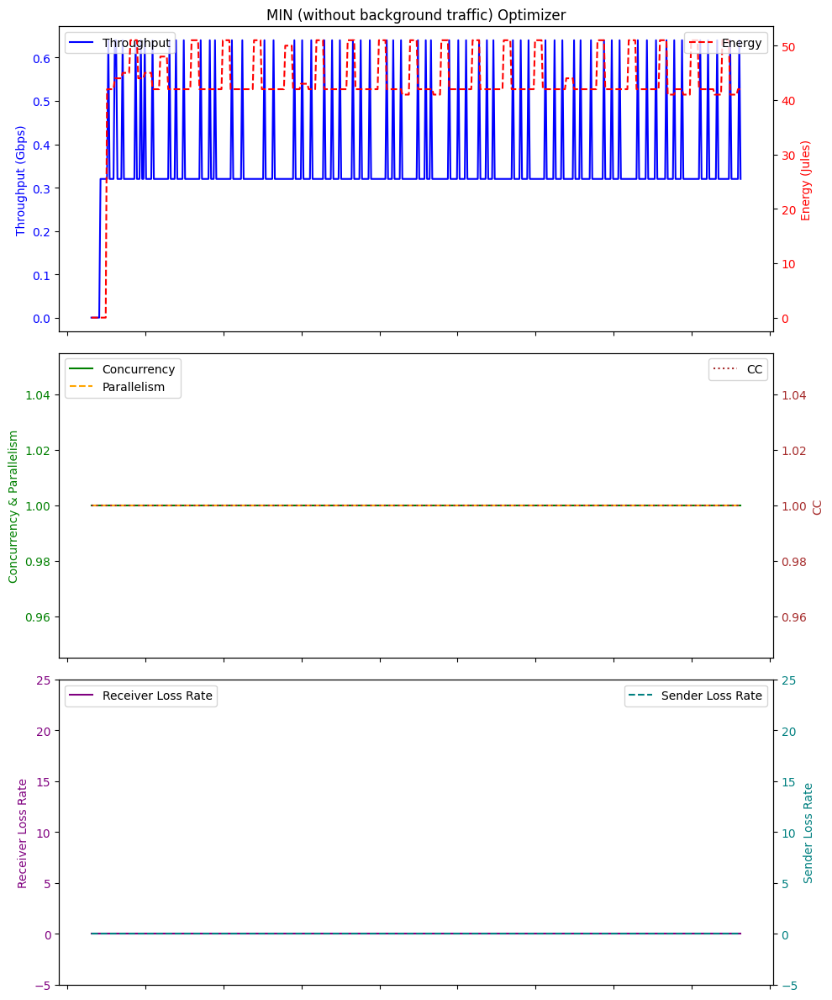

Average Throughput: 0.3552
Total Energy: 21538.0
Total loss rate: 0.019453547808512377
                          Time  Throughput  receiver_lr  CC  Score   RTT  \
0   2024-01-18 22:57:37.043046        0.00          0.0   1    0.0   0.0   
1   2024-01-18 22:57:38.038517        0.00          0.0   1    0.0   0.0   
2   2024-01-18 22:57:39.041633        0.00          0.0   1    0.0  32.6   
3   2024-01-18 22:57:40.042000        0.00          0.0   1    0.0  32.6   
4   2024-01-18 22:57:41.042017        0.00          0.0   1    0.0  32.6   
..                         ...         ...          ...  ..    ...   ...   
495 2024-01-18 23:05:52.569897        0.32          0.0   1    0.0  50.4   
496 2024-01-18 23:05:53.571588        0.32          0.0   1    0.0  47.8   
497 2024-01-18 23:05:54.571704        0.32          0.0   1    0.0  34.2   
498 2024-01-18 23:05:55.573087        0.32          0.0   1    0.0  34.2   
499 2024-01-18 23:05:56.574634        0.32          0.0   1    0.0  32.8   



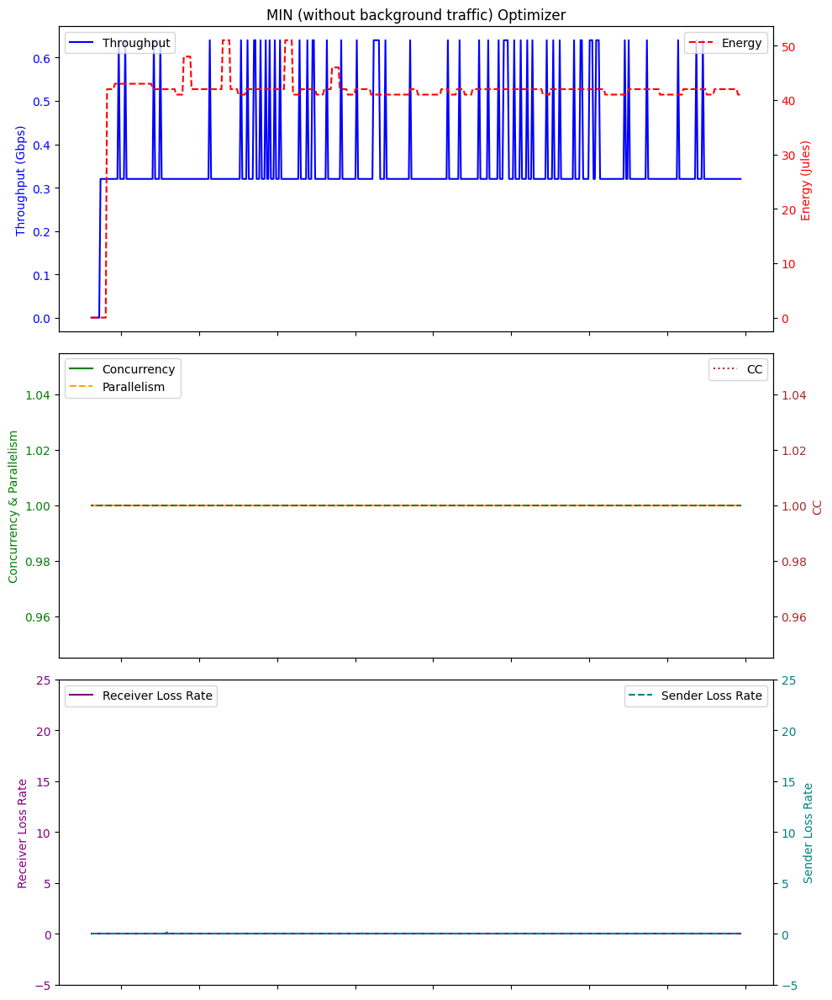

Average Throughput: 0.35328
Total Energy: 20552.0
Total loss rate: 0.27945742309051674


In [8]:
# Example usage min
directory = './logFileDir/MIN/'
dfs = process_log_files(directory,"MIN_logFile_")

min_throughput_list=[]
min_energy_list=[]
min_plr_list=[]
# Print or process the dataframes as needed
for df in dfs:
    print(df)
    # Plotting
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12), sharex=True)


    # Top plot with Throughput and Energy
    ax1.plot(df['Time'], df['Throughput'], label='Throughput', color='blue')
    ax1.set_ylabel('Throughput (Gbps)', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.set_title('MIN (without background traffic) Optimizer')

    ax2_twin = ax1.twinx()
    ax2_twin.plot(df['Time'], df['Energy'], label='Energy', color='red', linestyle='--')
    ax2_twin.set_ylabel('Energy (Jules)', color='red')
    ax2_twin.tick_params(axis='y', labelcolor='red')

    # Bottom plot with Concurrency, Parallelism, and CC
    ax2.plot(df['Time'], df['concurrency'], label='Concurrency', color='green')
    ax2.plot(df['Time'], df['parallelism'], label='Parallelism', color='orange', linestyle='--')
    ax2.set_ylabel('Concurrency & Parallelism', color='green')
    ax2.tick_params(axis='y', labelcolor='green')

    ax3_twin = ax2.twinx()
    ax3_twin.plot(df['Time'], df['CC'], label='CC', color='brown', linestyle=':')
    ax3_twin.set_ylabel('CC', color='brown')
    ax3_twin.tick_params(axis='y', labelcolor='brown')
    
    # Bottom plot with Receiver Loss Rate and Sender Loss Rate
    ax3.plot(df['Time'], df['receiver_lr'], label='Receiver Loss Rate', color='purple', linestyle='-')
    ax3.set_ylabel('Receiver Loss Rate', color='purple')
    ax3.tick_params(axis='y', labelcolor='purple')

    ax4_twin = ax3.twinx()
    ax4_twin.plot(df['Time'], df['sender_lr'], label='Sender Loss Rate', color='teal', linestyle='--')
    ax4_twin.set_ylabel('Sender Loss Rate', color='teal')
    ax4_twin.tick_params(axis='y', labelcolor='teal')
    ax4_twin.set_ylim(-5,25)

    ax3.set_ylim(-5,25)

    # Formatting the x-axis to show time correctly
#     ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: (datetime.min + timedelta(seconds=x)).strftime('%H:%M:%S')))
#     ax2.set_xticklabels([])
    ax1.set_xticklabels([])
    ax2.set_xticklabels([])
    # Fix for overlapping layouts
    fig.tight_layout()

    # Legend
    ax1.legend(loc='upper left')
    ax2_twin.legend(loc='upper right')
    ax2.legend(loc='upper left')
    ax3_twin.legend(loc='upper right')
    ax3.legend(loc='upper left')
    ax4_twin.legend(loc='upper right')
    plt.show()

    average_throughput = df['Throughput'].mean()
    print("Average Throughput:", average_throughput)
    total_energy = df['Energy'].sum()
    print("Total Energy:", total_energy)
    total_plr = df['sender_lr'].sum()
    print("Total loss rate:", total_plr)
    
    min_throughput_list.append(average_throughput)
    min_energy_list.append(total_energy)
    min_plr_list.append(total_plr)


In [9]:
result_dictionary={"Throughput":[bo_throughput_list,gd_throughput_list,ppo_throughput_list,sb3_throughput_list,max_throughput_list,min_throughput_list],"Energy":[bo_energy_list,gd_energy_list,ppo_energy_list,sb3_energy_list,max_energy_list,min_energy_list],"lossRate":[bo_plr_list,gd_plr_list,ppo_plr_list,sb3_plr_list,max_plr_list,min_plr_list]}
print(result_dictionary)

{'Throughput': [[2.5035294117647053, 3.1570731707317075, 1.3403174603174608, 3.3224691358024683, 2.142950819672131, 3.5966197183098596, 3.3560975609756105, 3.3975308641975315, 2.540990099009901, 2.2966371681415927, 1.555606936416185, 3.9111111111111114, 4.088888888888889, 2.1193442622950824, 1.6196319018404908, 2.8730434782608687, 3.1570731707317075, 2.751372549019609, 2.766451612903226, 3.2038554216867463], [0.723891891891892, 1.674, 0.7635555555555555, 0.6982564102564104, 0.9013333333333332, 1.2465454545454546, 2.190769230769231, 2.1653333333333338, 1.3152000000000001, 0.7377777777777779, 2.1893333333333334, 2.707199999999999, 1.2104347826086956, 0.7323076923076923, 1.2247272727272729, 0.768, 0.5860000000000002, 1.3962105263157893, 0.7316756756756757, 2.571636363636365], [3.9999999999999982, 3.6479999999999992, 2.4523636363636374, 3.224, 1.7450666666666665, 3.5200000000000005, 3.7074285714285704, 3.6525714285714277, 3.152, 3.821714285714286, 3.6371830985915485, 3.643428571428571, 3.5

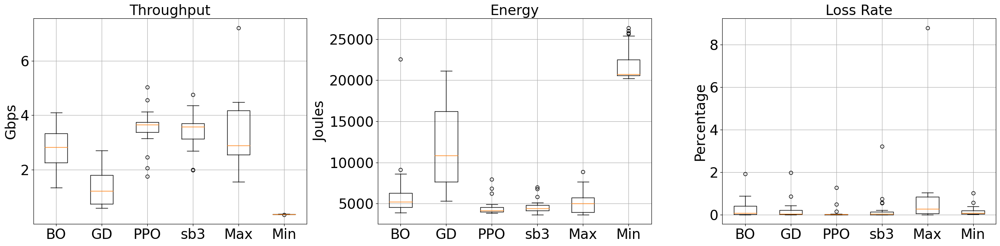

In [10]:
import matplotlib.pyplot as plt

labels = ['BO', 'GD', 'PPO', 'sb3', 'Max', 'Min']

# Assuming result_dictionary is already defined with the relevant data
# result_dictionary = {...}

# Creating subplots
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

# Font size for the ticks
tick_font_size = 24  # You can change this value as needed

# Plotting Throughput
axes[0].boxplot(result_dictionary['Throughput'], labels=labels)
axes[0].set_title('Throughput',fontsize=24)
axes[0].set_ylabel('Gbps',fontsize=24)
axes[0].tick_params(axis='both', which='major', labelsize=tick_font_size)  # Set tick font size
axes[0].grid(True)  # Adding grid

# Plotting Energy
axes[1].boxplot(result_dictionary['Energy'], labels=labels)
axes[1].set_title('Energy',fontsize=24)
axes[1].set_ylabel('Joules',fontsize=24)
axes[1].tick_params(axis='both', which='major', labelsize=tick_font_size)  # Set tick font size
axes[1].grid(True)  # Adding grid

# Plotting Loss Rate
axes[2].boxplot(result_dictionary['lossRate'], labels=labels)
axes[2].set_title('Loss Rate',fontsize=24)
axes[2].set_ylabel('Percentage',fontsize=24)
axes[2].tick_params(axis='both', which='major', labelsize=tick_font_size)  # Set tick font size
axes[2].grid(True)  # Adding grid

plt.tight_layout()
plt.show()
